# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
running file: action_list.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100998.27887305  99723.88095634 101303.67223198 103092.61280875
  99532.83469866  99532.86737755 103208.50728239 101546.55324918
  99065.53858503 101090.91919622  99077.5383033   99072.95740148
 100485.04873236  96246.09556884  96609.32594441  98881.83582563
  97994.91492509 100630.41060507  98200.52092999  97215.18620668
 102974.38116142  99549.51030708 100135.13413065  97190.99577765
  98917.24782412 100222.06920894  97724.53133637 100754.1504107
  98806.02781904  99418.36888778  98803.91770933 103773.6459511
  99973.01189183  97907.00331514 101658.52873405  97588.11897026
 1

Omni_P_RQi ================== 0.09901158823279839
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100998.27887305235, 'S': 10000, 'W': 10000, 'P': 0.09901158823279839, 'dP': 0}, 'j': {'R': 97209.22372704794, 'S': 10000, 'W': 10000, 'P': 0.10287089657334189}, 'k': {'R': 97209.22372704794, 'S': 10000, 'W': 10000, 'P': 0.10287089657334189}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10027688357192863
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99723.88095634223, 'S': 10000, 'W': 10000, 'P': 0.10027688357192863, 'dP': 0}, 'j': {'R': 99162.32170728213, 'S': 10000, 'W': 10000, 'P': 0.10084475461878617}, 'k': {'R': 99162.32170728213, 'S': 10000, 'W': 10000, 'P': 0.10084475461878617}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10027688357192863
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset

Omni_P_RQi ================== 0.09847700074527566
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101546.55324918331, 'S': 10000, 'W': 10000, 'P': 0.09847700074527566, 'dP': 0}, 'j': {'R': 100349.73085387227, 'S': 10000, 'W': 10000, 'P': 0.09965148800012076}, 'k': {'R': 100349.73085387227, 'S': 10000, 'W': 10000, 'P': 0.09965148800012076}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10094327596489377
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99065.53858503481, 'S': 10000, 'W': 10000, 'P': 0.10094327596489377, 'dP': 0}, 'j': {'R': 100516.37794144546, 'S': 10000, 'W': 10000, 'P': 0.0994862748220531}, 'k': {'R': 100516.37794144546, 'S': 10000, 'W': 10000, 'P': 0.0994862748220531}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10094327596489377
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Ass

Omni_P_RQi ================== 0.10350967571964848
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96609.32594441288, 'S': 10000, 'W': 10000, 'P': 0.10350967571964848, 'dP': 0}, 'j': {'R': 99616.05549328652, 'S': 10000, 'W': 10000, 'P': 0.1003854243222262}, 'k': {'R': 99616.05549328652, 'S': 10000, 'W': 10000, 'P': 0.1003854243222262}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10350967571964848
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96609.32594441288, 'S': 10000, 'W': 10000, 'P': 0.10350967571964848, 'dP': 0}, 'j': {'R': 99616.05549328652, 'S': 10000, 'W': 10000, 'P': 0.1003854243222262}, 'k': {'R': 99616.05549328652, 'S': 10000, 'W': 10000, 'P': 0.1003854243222262}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10350967571964848
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'p

Omni_P_RQi ================== 0.10045252828620312
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99549.51030708376, 'S': 10000, 'W': 10000, 'P': 0.10045252828620312, 'dP': 0}, 'j': {'R': 98197.84354310772, 'S': 10000, 'W': 10000, 'P': 0.10183523017600804}, 'k': {'R': 98197.84354310772, 'S': 10000, 'W': 10000, 'P': 0.10183523017600804}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10045252828620312
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99549.51030708376, 'S': 10000, 'W': 10000, 'P': 0.10045252828620312, 'dP': 0}, 'j': {'R': 98197.84354310772, 'S': 10000, 'W': 10000, 'P': 0.10183523017600804}, 'k': {'R': 98197.84354310772, 'S': 10000, 'W': 10000, 'P': 0.10183523017600804}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09986504823524137
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.10058503385111169
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99418.36888778338, 'S': 10000, 'W': 10000, 'P': 0.10058503385111169, 'dP': 0}, 'j': {'R': 98998.20113727594, 'S': 10000, 'W': 10000, 'P': 0.10101193643037504}, 'k': {'R': 98998.20113727594, 'S': 10000, 'W': 10000, 'P': 0.10101193643037504}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10058503385111169
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99418.36888778338, 'S': 10000, 'W': 10000, 'P': 0.10058503385111169, 'dP': 0}, 'j': {'R': 98998.20113727594, 'S': 10000, 'W': 10000, 'P': 0.10101193643037504}, 'k': {'R': 98998.20113727594, 'S': 10000, 'W': 10000, 'P': 0.10101193643037504}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10121056160363336
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.10247149043877976
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97588.11897026488, 'S': 10000, 'W': 10000, 'P': 0.10247149043877976, 'dP': 0}, 'j': {'R': 103148.09539139428, 'S': 10000, 'W': 10000, 'P': 0.09694798495362529}, 'k': {'R': 103148.09539139428, 'S': 10000, 'W': 10000, 'P': 0.09694798495362529}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.0995831856660074
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100418.55894768273, 'S': 10000, 'W': 10000, 'P': 0.0995831856660074, 'dP': 0}, 'j': {'R': 98445.85349377709, 'S': 10000, 'W': 10000, 'P': 0.10157868153006683}, 'k': {'R': 98445.85349377709, 'S': 10000, 'W': 10000, 'P': 0.10157868153006683}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.0995831856660074
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.10023154108344011
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99768.99379083939, 'S': 10000, 'W': 10000, 'P': 0.10023154108344011, 'dP': 0}, 'j': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017245}, 'k': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017245}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10023154108344011
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99768.99379083939, 'S': 10000, 'W': 10000, 'P': 0.10023154108344011, 'dP': 0}, 'j': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017245}, 'k': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017245}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10023154108344011
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.09935399252255206
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100650.20786889999, 'S': 10000, 'W': 10000, 'P': 0.09935399252255206, 'dP': 0}, 'j': {'R': 100502.19239309197, 'S': 10000, 'W': 10000, 'P': 0.09950031697703891}, 'k': {'R': 100502.19239309197, 'S': 10000, 'W': 10000, 'P': 0.09950031697703891}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09935399252255206
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100650.20786889999, 'S': 10000, 'W': 10000, 'P': 0.09935399252255206, 'dP': 0}, 'j': {'R': 100502.19239309197, 'S': 10000, 'W': 10000, 'P': 0.09950031697703891}, 'k': {'R': 100502.19239309197, 'S': 10000, 'W': 10000, 'P': 0.09950031697703891}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09935399252255206
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.1016924292585139
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98335.73721185129, 'S': 10000, 'W': 10000, 'P': 0.1016924292585139, 'dP': 0}, 'j': {'R': 103801.65819109663, 'S': 10000, 'W': 10000, 'P': 0.09633757470030213}, 'k': {'R': 103801.65819109663, 'S': 10000, 'W': 10000, 'P': 0.09633757470030213}}}
config_param a value =============  1
Omni_P_RQi ================== 0.1016924292585139
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98335.73721185129, 'S': 10000, 'W': 10000, 'P': 0.1016924292585139, 'dP': 0}, 'j': {'R': 103801.65819109663, 'S': 10000, 'W': 10000, 'P': 0.09633757470030213}, 'k': {'R': 103801.65819109663, 'S': 10000, 'W': 10000, 'P': 0.09633757470030213}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10062027873299449
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.1024210160667741
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97636.21162946118, 'S': 10000, 'W': 10000, 'P': 0.1024210160667741, 'dP': 0}, 'j': {'R': 98372.19378420936, 'S': 10000, 'W': 10000, 'P': 0.10165474221237905}, 'k': {'R': 98372.19378420936, 'S': 10000, 'W': 10000, 'P': 0.10165474221237905}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.1024210160667741
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97636.21162946118, 'S': 10000, 'W': 10000, 'P': 0.1024210160667741, 'dP': 0}, 'j': {'R': 98372.19378420936, 'S': 10000, 'W': 10000, 'P': 0.10165474221237905}, 'k': {'R': 98372.19378420936, 'S': 10000, 'W': 10000, 'P': 0.10165474221237905}}}
config_param a value =============  1
Omni_P_RQi ================== 0.1024210160667741
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'po

Omni_P_RQi ================== 0.096971054821072
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103123.55597710772, 'S': 10000, 'W': 10000, 'P': 0.096971054821072, 'dP': 0}, 'j': {'R': 98381.778745048, 'S': 10000, 'W': 10000, 'P': 0.10164483837921406}, 'k': {'R': 98381.778745048, 'S': 10000, 'W': 10000, 'P': 0.10164483837921406}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.096971054821072
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103123.55597710772, 'S': 10000, 'W': 10000, 'P': 0.096971054821072, 'dP': 0}, 'j': {'R': 98381.778745048, 'S': 10000, 'W': 10000, 'P': 0.10164483837921406}, 'k': {'R': 98381.778745048, 'S': 10000, 'W': 10000, 'P': 0.10164483837921406}}}
config_param a value =============  1
Omni_P_RQi ================== 0.096971054821072
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': 

Omni_P_RQi ================== 0.09981666505930097
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100183.67167505558, 'S': 10000, 'W': 10000, 'P': 0.09981666505930097, 'dP': 0}, 'j': {'R': 99472.13737046569, 'S': 10000, 'W': 10000, 'P': 0.10053066380545175}, 'k': {'R': 99472.13737046569, 'S': 10000, 'W': 10000, 'P': 0.10053066380545175}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10405479027714562
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96103.2161360896, 'S': 10000, 'W': 10000, 'P': 0.10405479027714562, 'dP': 0}, 'j': {'R': 105590.47096851427, 'S': 10000, 'W': 10000, 'P': 0.0947055156424283}, 'k': {'R': 105590.47096851427, 'S': 10000, 'W': 10000, 'P': 0.0947055156424283}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10405479027714562
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.1010084648336023
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99001.60364256243, 'S': 10000, 'W': 10000, 'P': 0.1010084648336023, 'dP': 0}, 'j': {'R': 101438.10080629803, 'S': 10000, 'W': 10000, 'P': 0.09858228733102549}, 'k': {'R': 101438.10080629803, 'S': 10000, 'W': 10000, 'P': 0.09858228733102549}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09818603289587673
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101847.47977958019, 'S': 10000, 'W': 10000, 'P': 0.09818603289587673, 'dP': 0}, 'j': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.09905808346576606}, 'k': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.09905808346576606}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09818603289587673
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Ass

Omni_P_RQi ================== 0.10065741029203944
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99346.88336394502, 'S': 10000, 'W': 10000, 'P': 0.10065741029203944, 'dP': 0}, 'j': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800463}, 'k': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800463}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10065741029203944
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99346.88336394502, 'S': 10000, 'W': 10000, 'P': 0.10065741029203944, 'dP': 0}, 'j': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800463}, 'k': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800463}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10078722031438568
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

POOL Class POOL Class    1 POOL Class  A value =   Class Price =  0.09878144689682160.5j 1 Asset  A value =   Class Price =  0.0989257327148944
POOL Class   A value =   1 Asset  i  Class Price =  0.09653091002993473
POOL Class   A value =  1 Asset  j  Class Price =  0.09653091002993473
POOL Class   A value =  1 Asset  k  Class Price =  0.09653091002993473
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class  A value = 
      A value =  1 Asset  i  Class Price =  0.09464798385223429
POOL Class   A value =  1 Asset  j  Class Price =  0.09464798385223429
POOL Class   A value =  1 Asset  k  Class Price =  0.09464798385223429
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class 0.5Asset  A value =  POOL Class Asset   A value =  1 Asset  i  Class Price =  0.09281961791879426
POOL Class   A value =  1 Asset  j  Class Price =  0.09281961791879426
POOL Class   A value =  1 Asset  k  Class Price =  0.09281961791879426
POOL Class   A

k  A value =  1 Asset  i  Class Price =  0.09142124577447115
POOL Class   A value =  1 Asset  j  Class Price =  0.09142124577447115
POOL Class   A value =  1 Asset  k  Class Price =  0.09142124577447115
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155023    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    96198  113676  140000  170000  150000    0   123676  126198  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  


 i  Class Price =  0.09678190457259388
POOL Class   A value =     m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155047    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   101784  108122  140000  170000  150000    0   118122  131784  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  POOL Class   9.7209223727047931 delta W = 
POOL Class      A value =  A value =   A value =  0.5 Asset  i  Class Pric

POOL Class  A value = i0.094691929183500990.099362468594744121.0POOL Class  Class Price = 
POOL Class   A value =  1 Asset  j  Class Price =  0.09936246859474412
POOL Class   A value =  1 Asset  k  Class Price =  0.09936246859474412
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class 
  
  A value =  1 Asset  i  Class Price =  0.09806556341488722
POOL Class   A value =  1 Asset  j  Class Price =  0.09806556341488722
POOL Class   A value =  1 Asset  k  Class Price =  0.09806556341488722
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class   0.5 Class Price = POOL Class 0.1065093620845474 A value =    POOL Class    A value =  0.5 Asset  i  Class Price =  0.10900426538519487
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10900426538519487
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10900426538519487
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class 0.10373808786568221 A v

POOL Class  A value = Asset   A value =   k  Class Price =  0.10204643904875502
POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class  i1.5j   Class Price =  0.09711028855967382
POOL Class   A value =  1 Asset  k  Class Price =  0.10703437142615531
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10703437142615531
POOL Class   A value =   Asset  i  Class Price =  0.09835257558996212
 A value =  1 Asset POOL Class   A value =  1.5 Asset   A value =  0.5 Asset  i  Class Price =  0.10070259968111613
POOL Class   A value =  0.5 Asset  1 Asset  i Class Price =  0.10121683061795667
POOL Class   A value =  0.5 Asset  j  j  Class Price =  0.09835257558996212
 Class Price =  0.10121683061795667
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09711028855967382
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class   Class Price = POOL Class      A value =  1 Asset  i  Class Price =  0.09583547116948289
POOL Class   A valu

POOL Class  A value =  0.5  i  Class Price =  0.108003272682823
POOL Class   A value =  0.5 Asset  j  Class Price =  0.108003272682823
POOL Class   A value =  0.5 Asset  k  Class Price =  0.108003272682823
POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq = Asset  i  Class Price =  0.1040594551993937
POOL Class   A value =    A value =  0.5 
i 0.5 Asset  j  Class Price =    Class Price =  0.09182088029958849
POOL Class   A value =  1 Asset    A value =  1.50.1040594551993937
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1040594551993937
POOL Class   1.0
POOL Class Asset  Asset POOL Class  j A value =   i  Class Price =  0.11302323508134149
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11302323508134149
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11302323508134149
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class   A value =  A value =   Asset  0.5 Asset  i  Class Price =  0.11148785030934083
POOL Class 

   POOL Class 0.5 A value =  1  R over W=  9.916232170728213 1.0POOL Class  j  A value =  1 Asset  k  Class Price =  0.09517097244091656
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class  Class Price =   
 R over W= Q over Wq =   A value =  1 Asset  i  Class Price =  0.09684257813466483 9.720922372704793 Q over Wq =  1.0
POOL Class   A value =   Class Price = POOL Class   1.0
POOL Class 1  0.10103462780573867 A value =   A value =  1 Asset  i  Class Price =  0.10741768470552301
POOL Class   A value =  1 Asset  j  Class Price =  0.10741768470552301
POOL Class   A value =  1 Asset  k  Class Price =  0.10741768470552301
POOL Class   A value =  1  R over W=  9.916232170728213 Q over Wq =  A value =  
POOL Class   A value =  1.50.50.1004963051198085
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1004963051198085
POOL Class   A value =  1.5  R over W=  9.931698273384464 Q over Wq =  1.0
 Asset  i  Class Price =  0.10190021882541184
POOL Class   A va

POOL Class 0.10567453040042447  A value =  1 Asset  i  Class Price =  0.10555094437706819
POOL Class   A value =  1 Asset  j  Class Price =  0.10555094437706819
POOL Class   A value =  1 Asset  k  Class Price =  0.10555094437706819
POOL Class   A value =  1  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.10726970647608243
POOL Class   A value =  1 Asset  j  Class Price =  0.10726970647608243
POOL Class   A value =  1 Asset  k  Class Price =  0.10726970647608243
POOL Class   A value =  1  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10583749304788113
  A value =  0.5 Asset  j  Class Price =  0.10567453040042447
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10567453040042447
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10737516260669869
POOL Class   A value =  0.5 Asset  j  Class

POOL Class   A value =  1.5 Asset    A value =  1.5 Asset  i  Class Price =    A value =  0.5 Asset  i  Class Price =  0.10998354103409408
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10998354103409408
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10998354103409408
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class  Class Price = Asset i0.098535118877515660.5j  A value =  0.5 Asset  i  Class Price =  0.11170644712522229
POOL Class   A value =  0.5 Asset   Asset  j  Class Price =  0.11520375316822136
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11520375316822136
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class   
  
j  A value =  0.5 Asset  i  Class Price =  0.11362763542640766
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11362763542640766
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11362763542640766
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over W

POOL Class   A value =  1  R over W=  A value =  1 Asset  i  Class Price =  POOL Class   A value =  1.5  R over W=  9.931698273384464  A value =  1.5   A value =  0.5 Asset 0.09474721582564076
POOL Class   A value =  1 Asset  Asset Q over Wq =      j  Class Price =  0.10653167217436633j0.10998590890281942
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10998590890281942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10998590890281942
POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq =  1.0
i0.5 
9.985123382117473 POOL Class   A value =  1.5 Asset  k  Class Price =  0.10653167217436633
POOL Class   A value =  1.5  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class  Class Price =  POOL Class     A value =  0.5 Asset  i  Class Price =  0.11172010016557875
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11172010016557875
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11172010016557875
POOL Class   A value =  0.5  R over W=  9.720922372

POOL Class 0.09352956334038409 A value =  1  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class  j 
    A value =  1 Asset  i  Class Price =  0.09983025361037424
POOL Class   A value =  1 Asset  j  Class Price =  0.09983025361037424
POOL Class   A value =  1 Asset  k  Class Price =  0.09983025361037424
POOL Class   A value =  1  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class  A value =  A value = 0.10746081079640186
POOL Class   A value =  1 Asset   0.5 Asset  i  Class Price =   Class Price =  0.10832602910528115
POOL Class   0.11251588798819699
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11251588798819699
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11251588798819699
POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq =  1.0
 j A value = Asset POOL Class  k  Class Price =  0.10519341883639594
POOL Class   A value =  1.5  R over W=  9.931698273384464 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  0.10832602910528115
POOL Class   A va

POOL Class  A value =  1.01 Asset  k  Class Price =  0.10800177210408266
POOL Class   A value =  1  0.5 Asset  k  Class Price =  0.1168852696339842
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class  
 R over W=   A value =  0.5 Asset  i  Class Price =  0.11530197571233688
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11530197571233688
POOL Class   A value =   9.985123382117473 Q over Wq =  1.0
POOL Class POOL Class   A value =    A value =  1.5 Asset  0.5i  Class Price =  0.113359671428711
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11530197571233688
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class   A value =  0.5 A value =  1 1 Asset  i  Class Price =  0.10970539926305124
POOL Class   A value =  1 Asset  j  Class Price =  0.10970539926305124
POOL Class   A value =  1 Asset Asset  j  Class Price =  0.113359671428711
POOL Class   A value =  1.5 Asset  k  Class Price =  0.113359671428711
POOL 

Asset  j Asset POOL Class  A value =   Class Price =     A value =  0.5 Asset  i  Class Price =  0.1216602755255027
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1216602755255027
POOL Class   A value =  0.5 Asset  k 1 Asset  k  Class Price =  0.10941787423768344
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class  j  Class Price =  0.09519142705585862
POOL Class   A value =  1 Asset  k  Class Price =  0.09519142705585862
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09397681865812263
POOL Class   A value =  1 Asset  j  Class Price =  0.09397681865812263
POOL Class   A value =  1 Asset  k  Class Price =  0.09397681865812263
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class  A value =  j 0.09872406897596145 Class Price =    A value =  1 Asset  i  Class Price =  0.09566706716100798
POOL Class   A value =  1 Asset  j  Class Price =  0.

POOL Class Asset 0.5 j  Class Price =  0.10967408619462499  Asset  i  Class Price =  0.11271754431826908
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11271754431826908
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11271754431826908
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class  Class Price =   
Asset  1.5 Asset  k  Class Price =  0.11407820874390148
POOL Class   A value =  1.5  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class    0.10030623691889783 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.11568896891460016
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11568896891460016
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11568896891460016
POOL Class   A value =  1.5  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class j  
 0.12344500010707099 A value =   A value =  1.5 Asset  i  Class Price =  0.11414999870861732
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1141499987

POOL Class 0.10431534602846118 Class Price =   A value =   A value =  0.5 Asset  i  Class Price =  0.11350545551216398
 1 Asset  i  Class Price =  0.10996899586151328
POOL Class   A value = POOL Class   A value =  0.5 Asset   0.12520094364630563 
 11 A value = 
 A value =  0.5 Asset  i  Class Price =  0.11972740665184915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11972740665184915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11972740665184915
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over Wq =  1.0
 jPOOL Class  POOL Class POOL Class   A value =  0.5 Asset  j  Class Price =  0.12520094364630563
POOL Class   A value =  0.5Asset     A value =  0.5 Asset  i  Class Price =  0.12148032418110172
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12148032418110172
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12148032418110172
POOL Class   A value =  0.5  R over W=  i  Class Price =  0.09822377961324455
POOL Class   A value =  1 Asset  j Cl

POOL Class    A value =  1.5 Asset  i  Class Price =  0.10171288606631017
POOL Class   A value =  1.5 Asset  j R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class Asset    A value =  1 Asset  i  Class Price =  0.1098925339092018
POOL Class   k  Class Price =  0.09704870669174434
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.09874752144011516
POOL Class   A value =  1 Asset  j  Class Price =  0.09874752144011516
POOL Class   A value =  1 Asset  k  Class Price =  0.09874752144011516
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class   Class Price =   A value =  1 Asset  i  Class Price =  0.09748250686406913
POOL Class   A value =  1 Asset  j  Class Price =  0.09748250686406913
POOL Class   A value =  1 Asset  k  Class Price =  0.09748250686406913
POOL Class   A value =  1  R over W=  10.0811294220380431 Asset  j  Class Price =  0.1098925339092018
POOL Class  

POOL Class   A value =  0.5   A value =   Asset  iPOOL Class  1  A value =  1 Asset  i  Class Price =  0.11051735389636541
POOL Class   A value =  1 Asset  j  Class Price =  0.11051735389636541
POOL Class   A value =  1 Asset  k  Class Price =  0.11051735389636541
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class   Class Price =   Class Price =  A value =  Asset   A value =  1 Asset  i  Class Price =  0.10909027434295264
POOL Class   A value =  1 Asset  j  Class Price =  0.10909027434295264
POOL Class   A value =  1 Asset  k  Class Price =  0.10909027434295264
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
1 Asset    POOL Class  Q over Wq = 0.12107532837796746Asset jj  A value =  1 Asset  i  Class Price =  0.10769065868897261
POOL Class   A value =  1 Asset  j  Class Price =  0.10769065868897261
POOL Class   A value =  1 Asset  k  Class Price =  0.10769065868897261
POOL Class   A value =  1  R over W=  9.985123382117473 Q over

   A value =  A value =  1.5 Asset  j  Class Price =  0.11797167062966603
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11797167062966603  0.12339407402607058 POOL Class  R over W= 
 Class Price = 0.5
 Class Price =   A value =  1 Asset  i  Class Price =  0.10747271454018531
POOL Class   A value =  1 Asset  j  Class Price =  0.10747271454018531
POOL Class   A value =  1 Asset  k  Class Price =  0.10747271454018531
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class      POOL Class   A value =  1 Asset  i  Class Price =  0.10611410253792812
POOL Class   A value =  1 Asset  j  Class Price =  0.10611410253792812
POOL Class   A value =  1 Asset  k  Class Price =  0.10611410253792812
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class  A value = 9.720922372704793 0.11304009642414503POOL Class 0.09711678229241828Asset   A value =  1 Asset  i  Class Price =  0.10790644621446147
POOL Class   A value =  1 Asset  j  Class P

 Asset  POOL Class   1.0
POOL Class  10.5 Class Price =  A value =    A value =  0.5 Asset  i  Class Price =  0.11494467239921154
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11494467239921154
POOL Class   A value =  0.5 1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class   A value =  i    A value =  1 Asset  i  Class Price =  0.09676666862190458
POOL Class   A value =  1 Asset  j  Class Price =  0.09676666862190458
POOL Class   A value =  1 Asset  k  Class Price =  0.09676666862190458
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
0.1180993070356444 R over W= Asset  1.5 Asset  i  Class Price =   9.720922372704793 Q over Wq =  1.0
POOL Class  0.10441065792078374Asset 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.12053950219922258
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12053950219922258
POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class   A value =  1.5 Asset 0.12053950219922258
  A value =  1 Asset  i

0.11090871170306671 0.5 Asset  k POOL Class 
0.5  Class Price =  0.12287310196848747
POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.12124562519288205
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12124562519288205
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12124562519288205
POOL Class   A value =  Asset  j  Class Price =  0.11913123894909128
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11913123894909128
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.11755963230754196
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11755963230754196
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11755963230754196
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11938485394370471
POOL Class  

 A value =  0.5   A value =  1.5 0.5 Asset  POOL Class   A value =  1 Asset  jk  Class Price =  0.11209697993870317 i  
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class  Asset Asset Q over Wq =  Class Price = 1POOL Class       Class Price =    A value =  1.5 Asset  i  Class Price =  0.10259217422778881
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10259217422778881
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10259217422778881
POOL Class   A value =  1.5  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class i A value =  0.117389452521614191.0Asset   A value =  1.5 Asset  i  Class Price =  0.10464454354717309
i  Class Price =  0.11860483389335226
POOL Class   A value =  0.5 Asset  j
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11161171744830231
POOL Class   A value =  1 Asset  k  Class Price =  0.11161171744830231
POOL Class   A value =  1  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class 
 POOL Class 0.11738945

POOL Class  0.09192320509706053
POOL Class    i   A value =  1 Asset  j  Class Price =  0.09192320509706053
POOL Class   A value =  1 Asset  k  Class Price =  0.09192320509706053
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class Asset   A value = j1.50.5 A value =   A value =  1 Asset  i  Class Price =  0.09026165014260225
POOL Class   A value =  1 Asset  j  Class Price =  0.09026165014260225
POOL Class   A value =  1 Asset  k  Class Price =  0.09026165014260225
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class   Class Price =       A value =  1 Asset  i  Class Price =  0.09230782543272754
POOL Class   A value =  1 Asset  j  Class Price =  0.09230782543272754
POOL Class   A value =  1 Asset  k  Class Price =  0.09230782543272754
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class  Class Price = Asset Asset 1.5 k   A value =  1 Asset  i  Class Price =  0.09435349157022303
POOL Class   

POOL Class  i  Class Price =  0.09847062078468796
POOL Class   A value =  1 Asset  j  Class Price =  0.09847062078468796
POOL Class   A value =  1 Asset  k  Class Price =  0.09847062078468796
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class    Asset    Class Price =   A value =  1 Asset  i  Class Price =  0.10049692104359767
POOL Class   A value =  1 Asset  j  Class Price =  0.10049692104359767
POOL Class   A value =  1 Asset  k  Class Price =  0.10049692104359767
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class 0.5 Asset  j  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09293193718264307
POOL Class   A value =  1.5 Asset   i  Class Price =  0.09513643256881248
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09513643256881248
POOL Class   A value =  0.5 Asset  k0.101165785221084480.11527943918630182
POOL Class   A value =  0.5   0.11016413373247431
POOL Class   A value =  1  R over W=  9.9851233821

  A value =  0.5 Asset  i  Class Price =  0.09188346526133853
POOL Class 1POOL Class Q over Wq =  Asset  k  Class Price =  0.10498161833904346
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
 POOL Class    A value =  1 Asset  i  Class Price =  0.10699954471377475
POOL Class   A value =  1 Asset  j  Class Price =  0.10699954471377475
POOL Class   A value =  1 Asset  k  Class Price =  0.10699954471377475
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
 A value = 1.0POOL Class 
   A value =  1 Asset  i  Class Price =  0.10479867087969029
POOL Class   A value =  1 Asset  j  Class Price =  0.10479867087969029
POOL Class   A value =  1 Asset  k  Class Price =  0.10479867087969029
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class  POOL Class 1.5 A value =     R over W= 1 A value =    9.985123382117473Asset 0.5 Asset  i  Class Price =  0.09862858604175076
POOL Class   A value =  0.5 Asset  j  Class Price =  

POOL Class POOL Class POOL Class   POOL Class 1 k  Class Price =  0.0936967469667754
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
   A value =   1.5addliq - Sq delta Sq A value =  1.5 Asset  i  Class Price =  0.09463243549004109
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09463243549004109
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09463243549004109
POOL Class   A value =  1.5  R over W=  9.916232170728213  A value =  1.5 Asset  4685.148900465268
addliq - Sq delta S 4685.148900465267
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4684.8373483387695
POOL ADD LIQUIDITY Timestep ===  10 delta W  4684.8373483387695
POOL Class     A value =  Asset   A value =  1 Asset  i  Class Price =  0.0936967469667754
POOL Class   A value =  1 Asset  j  Class Price =  0.0936967469667754
POOL Class   A value =  1 Asset  k  Class Price =  0.0936967469667754
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
   m  r_i_out  r_i_in      

POOL Class   A value =  kAsset   Asset 
   Class Price =  0.10200320148402857
POOL Class   A value =  0.5  R over W=  10.034973085387227 Q over Wq =  1.0
 A value =  POOL Class  R over W=  POOL Class j  Class Price =  0.089036631027188
POOL Class   A value =  1.5 Asset  k  Class Price =  0.5 k  Class Price =  0.10678129060831419
POOL Class   A value =  1   A value =  0.5 Asset  i  Class Price =  0.10363525608177973
POOL Class   A value =  0.5 Asset  9.916232170728213 Q over Wq =  1.0
 A value = 1.5 Asset  i  0.089036631027188 1 Asset  j  Class Price =  0.10444999785825672
POOL Class  POOL Class Asset 
 Asset  j  Class Price =  0.10363525608177973
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10363525608177973
POOL Class   A value =  0.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class    R over W=  Class Price =  A value =    A value =  0.5 Asset   0.10369949450032762
POOL Class POOL Class j  Class Price =  0.09457874886768261
POOL Class   A value = i 1 Asset  k  Cla

POOL Class  Class Price =  A value =  1 Asset  k  Class Price =  0.10501589198978609
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
 0.10800019705217824POOL Class POOL Class  0.1061127863082688
POOL Class   A value =  1 Asset  j  Class Price =   A value =  1.5  R over W=  10.081129422038043 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.10360376591632632
POOL Class POOL Class 0.1061127863082688 A value =   A value =  1.5 Asset  i  Class Price =  0.08945439148183194
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08945439148183194
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08945439148183194
POOL Class   A value =  1.5  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class 
  
  A value =  1.5 Asset  i  Class Price =  0.08831808341975426
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08831808341975426
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08831808341975426
POOL Class   A value =  1.5  R over W=  10.081

POOL Class  Asset  R over W=  Class Price =  Class Price =  0.10331461378124913
POOL Class   A value =  1 Asset  j  Class Price =  0.10331461378124913
POOL Class   A value =  1 Asset  k  Class Price =  0.10331461378124913
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
  0.09475448841557405   j  Class Price =  0.09779441073690158
POOL Class   A value =  1 Asset  k
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09475448841557405
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09475448841557405
POOL Class   A value =  1.5  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class  9.84084077292155 Class Price =   A value = 1Q over Wq = POOL Class  0.09779441073690158
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class    0.1165294796236925     A value =  1 Asset  i  Class Price =  0.09652144468928525
POOL Class   A value =  1 Asset  j  Class Price =  0.09652144468928525
POOL Class   A value =  1 Asset  k  Class Price 

i  0.5POOL Class    A value =  1.5   Class Price =  0.09761440932525928
POOL Class   A value =  1.5 Asset  0.11333912349969001
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =   j  Class Price =  0.09761440932525928
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09761440932525928
POOL Class   A value =  1.5  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class POOL Class 1.0  A value = Asset   A value =  1 Asset  j  Class Price =  0.09870456253441097
POOL Class   A value =  1 Asset  k  Class Price =  0.09870456253441097
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class 1Asset 
 Asset     A value =  1 Asset  i  Class Price =  0.09741818153382563
POOL Class   A value =  1 Asset  j  Class Price =  0.09741818153382563
POOL Class   A value =  1 Asset  k  Class Price =  0.09741818153382563
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class POOL Class    i A value = 1   A value =  1.5 Asset  i

   1 Asset  k  Class Price =  0.10367371018383276
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
Asset POOL Class j POOL Class   Class Price =  0.1073415372529518
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1073415372529518
POOL Class   A value =  0.5  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class 1.5 R over W=       A value =  0.5 Asset  i  Class Price =  0.10899022780523424
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10899022780523424
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10899022780523424
POOL Class   A value =  0.5  R over W=  9.84084077292155 Q over Wq =  1.0
 A value =  A value =  A value =   9.967798042562775 Q over Wq =  1.0
POOL Class Asset    POOL Class  1.511.5 i  A value =  0.5 Asset  i  Class Price =  0.11063634186587054
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11063634186587054
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11063634186587054
POOL Class   A value =  0.5  R ove

POOL Class        kjj1.5 ikk  Class Price =  0.10049355673119424
POOL Class   A value =  1 Asset  k  Class Price =  0.10049355673119424
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class   A value =  1     Asset  i  Class Price =  0.10220962797018546
POOL Class   A value =  1 Asset  j  Class Price =  0.10220962797018546
POOL Class   A value =  1 Asset  k  Class Price =  0.10220962797018546
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class  Class Price =  Class Price =  A value =    Class Price =   A value =  1 Asset  i  Class Price =  0.10392300459263465
POOL Class   A value =  1 Asset  j  Class Price =  0.10392300459263465
POOL Class   A value =  1 Asset  k  Class Price =  0.10392300459263465
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class   A value =   Class Price =  Class Price =   Asset  1 Asset  i  Class Price =  0.1025485853531172
POOL Class   A value =  1 Asset  j  Class Price 

POOL Class POOL Class 1.5 Asset  i  Class Price =    1  R over W=  9.967798042562775  A value =  1.5  R over W=  9.916232170728213  Class Price =  0.10196977171416224
POOL Class   A value =  1 Asset  j  Class Price =  0.10196977171416224
POOL Class   A value =  1 Asset POOL Class Q over Wq =  1.0
POOL Class 0.5 Asset  j Q over Wq =    A value =  Class Price =  0.10660927444137112
POOL Class   A value =   1.0
POOL Class  1.5 Asset  i  Class Price =  0.10532691844082703
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10532691844082703
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10532691844082703
POOL Class   A value =  1.5  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class  0.12337271384698553  A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.10702920637375697
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10702920637375697
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10702920637375697
POOL Class   A value =  1.5  R over W=  9.91623217

  A value =  1.5  R over W=  10.081129422038043 Q over Wq =  1.0
  POOL Class 0.5POOL Class POOL Class 1  A value =   A value =    A value =  1.5 Asset  i  Class Price =  0.09593351113955702
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09593351113955702
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09593351113955702
POOL Class   A value =  1.5  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i A value =  A value =    Class Price =  0.09470225910471819
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09470225910471819
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09470225910471819
POOL Class   A value =  1.5  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class 0.5Asset      A value =  1.5 Asset  i  Class Price =  0.09638845451262382
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09638845451262382
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09638845451262382
POOL Class   A value =  1.5  R over W=

POOL Class 1.5 Asset  j  Class Price =  0.09975335035844986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09975335035844986
POOL Class   A value =  1.5  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class    iAsset    A value =  1.5 Asset  i  Class Price =  0.09845478574237669
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09845478574237669
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09845478574237669
POOL Class   A value =  1.5  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class ij  A value =  A value =  1 Asset  i  Class Price =   Class Price =  0.11505806436693376
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11505806436693376
POOL Class   A value =  0.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11349567713864771
POOL Class     Class Price =  0.11737239332008624
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11737239332008624
POOL Class   1 Asset  i  Class Price =  

POOL Class   A value =  POOL Class  A value =  kPOOL Class  k1.5  Class Price =  0.1157573998372153
POOL Class   A value =  1.5  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class       Class Price =   A value =  1.5 Asset  i  Class Price =  0.11417551102149656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11417551102149656
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11417551102149656
POOL Class   A value =  1.5  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class  A value =  Class Price = 0.5 A value =     A value =  1.5 Asset  i  Class Price =  0.11587654668366472
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11587654668366472
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11587654668366472
POOL Class   A value =  1.5  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class   0.10418208342162985   R over W= Asset   A value =  1.5 Asset  i  Class Price =  0.11429574944304043
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1142957

1 Asset  R over W=   iPOOL Class  Class Price =   Class Price =   A value =    10.051637794144547 Q over Wq =  1.0
POOL Class    Class Price =  A value = j  Class Price =  0.12470578596807969
POOL Class   A value =  1.5 Asset    A value =  1 Asset  i  Class Price =  0.11077228207286813
POOL Class   A value =  1 Asset  j  Class Price =  0.11077228207286813
POOL Class   A value =  1 Asset  k  Class Price =  0.11077228207286813
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class    k0.50.10537720002897993 R over W=   A value =  1 Asset  i  Class Price =  0.1093117354464731
POOL Class   A value =  1 Asset  j  Class Price =  0.1093117354464731
POOL Class   A value =  1 Asset  k  Class Price =  0.1093117354464731
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
  Class Price =  0.12470578596807969
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class POOL Class  0.11634110190063356
 0.117124209450330241

 POOL Class POOL Class POOL Class  A value =    POOL Class   A value =  1 Asset  j  Class Price =  0.10307290821163625
POOL Class   A value =  1   A value =  1 Asset  j  Class Price =  0.11579992567784843
POOL Class   A value =  1 Asset  k  Class Price =  0.11579992567784843
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class POOL Class    A value = 0.5Asset 0.12044742435455308  A value =  1 Asset  i  Class Price =  0.11755755797931391
POOL Class   A value =  1 Asset  j  Class Price =  0.11755755797931391
POOL Class   A value =  1 Asset  k  Class Price =  0.11755755797931391
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11599110289335743
POOL Class   A value =  1 Asset  j  Class Price =  0.11599110289335743
POOL Class   A value =  1 Asset  k  Class Price =  
   0.11599110289335743
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class 1.5Asset 

i POOL Class  
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.12215944000491955
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12215944000491955
POOL Class   A value =  0.5 Asset  1 Class Price =   A value =  1 Asset  i  Class Price =  0.11205894565995494
POOL Class   A value =  1 Asset  j  Class Price =  0.11205894565995494
POOL Class   A value =  1 Asset  k  Class Price =  0.11205894565995494
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class  POOL Class k 1  Class Price =   A value =  1 Asset  i  Class Price =  0.11385440809984516
POOL Class   A value =  1 Asset  j  Class Price =  0.11385440809984516
POOL Class   A value =  1 Asset  k  Class Price =  0.11385440809984516
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class   R over W=     Class Price = 0.11715087658540753  A value =  1 Asset  i  Class Price =  0.11564661805562912
POOL Class   A value =  1 Asset  j  Class Price =  0.11564661805562912
PO

POOL Class   1.5 Asset  j  Class Price =  0.11768529799557052
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11768529799557052
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class 1.5 Asset  k1 Asset  i  Class Price =  0.11764591927907239
POOL Class   A value =  1 Asset  j  Class Price =  0.11764591927907239
POOL Class   A value =  1 Asset  k  Class Price =  A value = 1.0  A value =  1.5 Asset  i  Class Price =  0.11615918178830645
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11615918178830645
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11615918178830645
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class Asset     
   A value =  1.5 Asset  i  Class Price =  0.11801077285668639
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11801077285668639
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11801077285668639
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  

0.5 Asset POOL Class  POOL REMOVE LIQUIDITY Timestep ===   A value =   Asset Asset j  90 delta W  5197.367241864128 delta S  4946
POOL REMOVE LIQUIDITY share fraction of pool = 0.19583935382601947
POOL REMOVE LIQUIDITY share fraction of reserve = 0.282840076114387
POOL REMOVE LIQUIDITY weight fraction of pool = 0.282840076114387
POOL Class j A value =     Class Price =    A value =  1.5 Asset  i  Class Price =  0.12011244349886742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12011244349886742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12011244349886742
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  1.0
1549461  jk Class Price = 
POOL Class       Class Price =  0.13032607149606712
POOL Class   Class Price =  0.11281154891060731
POOL Class   A value =  A value =  0.5 Asset  k  Class Price =  0.13032607149606712
POOL Class   A value =  0.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.13

POOL Class  9.985123382117473Asset   R over W= j A value = 1.5 j  Class Price =  0.11023386498539235
POOL Class   A value =  1 Asset  k  Class Price =  0.11023386498539235
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class      10.034973085387227 Q over Wq =  1.0
1Asset i  POOL Class   A value =    Class Price =  A value = Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.13475119665214116
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13475119665214116
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13475119665214116
POOL Class   A value =  0.5  R over W=  10.034973085387227 Q over Wq =  1.0
154923k  Class Price =  0.11587934193085947
POOL Class   A value =    Class Price =  R over W= 
POOL REMOVE LIQUIDITY Timestep === 0.11331602872780255
POOL Class  1.5   90 delta W  5371.678317620181 delta S  4923
POOL REMOVE LIQUIDITY share fraction of pool = 0.19970827119648116
POOL REMOVE LIQUIDITY share fraction of reserve = 0.27861929987918

 10.034973085387227 Q over Wq =  1.0
POOL Class  Class Price =    POOL Class  Class Price =  0.11663722376589951
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11663722376589951
k Class Price =  0.11917527296129372
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11917527296129372
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11917527296129372
POOL Class   A value =  1.5  R over W=  9.916232170728213 Q over Wq =  1.0
   A value =  1 Asset  j  Class Price =  0.10603387991478586
POOL Class   A value =  1 Asset  k  Class Price =  0.10603387991478586
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10810332012105063
POOL Class   A value =  1 Asset    Class Price = Asset jPOOL Class  0.10487304181273197 Class Price =  i  Class Price =  0.09695680287591787
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09695680287591787
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09695680287

POOL Class  Class Price =  Asset  1 Class Price =  POOL Class  Asset   5239.31928036339  0.10153727925300086
POOL Class   A value =  1 Asset  k  Class Price =  0.10153727925300086
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class  0.11631295715332124
 k10  A value =  1 Asset  i  Class Price =  0.09973152886650129
POOL Class   A value =  1 Asset  j  Class Price =  0.09973152886650129
POOL Class   A value =  1 Asset  k  Class Price =  0.09973152886650129
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class addliq - Sq delta S  A value =  A value = 
 i  A value =  1 Asset  i  Class Price =  0.10185272046431415
POOL Class   A value =  1 Asset  j  Class Price =  0.10185272046431415
POOL Class   A value =  1 Asset  k  Class Price =  0.10185272046431415
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
  Class Price =   POOL Class delta W  4946.428780479268
POOL Class   A value =  0.5 Asset  k  Class Price

  Class Price =  0.09156657794222452
POOL Class   A value =  1 Asset  k  Class Price =  0.09156657794222452 A value =  0.5  
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class 1.5  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.10828631569260738
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10828631569260738
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10828631569260738
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset   A value =  1.5 Asset  9.931698273384464 
 i  Class Price =  0.09827610778547677
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09827610778547677
POOL Class Asset  i  Class Price =  0.10120852990526817
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10120852990526817
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10120852990526817
POOL Class   A value =  1.5  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class POOL C

POOL Class  Asset     A value =  1 Asset  i  Class Price =  0.09139796871392093
POOL Class   A value =  1 Asset  j  Class Price =  0.09139796871392093
POOL Class   A value =  1 Asset  k  Class Price =  0.09139796871392093
POOL Class   A value =  POOL Class  POOL Class 1i0.10657442131342451    A value =  0.5 Asset  i  Class Price =  0.09390865178173963
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09390865178173963
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09390865178173963
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
   
 Class Price =  A value =  Class Price = POOL Class   A value =  R over W=  Class Price =  POOL Class   A value =  1.5 Asset  j  Class Price =  0.10657442131342451
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10657442131342451
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0
 0.11110526830537101
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11110526830537101
POOL Class   A

addliq - Sq delta Sq  Asset    Class Price = POOL Class Asset  A value =  1 Asset  j  Class Price =  0.08909187623060802
POOL Class   A value =  1 Asset  k  Class Price =  0.08909187623060802
POOL Class   A value =  1  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class i  Class Price =     A value =  1.5 Asset  i  Class Price =  4913.522889642408
addliq - Sq delta S 4913.522889642408
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4911.565862945406
POOL ADD LIQUIDITY Timestep ===  10 delta W  4911.565862945406
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0982313172589081
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09823131725890810.09241290757810644  0.099881015155831590.5 Class Price =  

POOL Class   A value =  1.5 Asset  j  Class Price =  0.09988101515583159
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09988101515583159
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class  A value = k  
POOL Class 0.11001214963467

POOL Class     A value =  1.5 Asset  i  Class Price =  0.0961140336399837
POOL Class    0.0950312544374475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0950312544374475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0950312544374475
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class 1 Asset  i  Class Price =  0.09332252459808629
POOL Class   A value =  1 Asset  j  Class Price =  0.09332252459808629
POOL Class   A value =  1 Asset  k  Class Price =  0.09332252459808629
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class   Class Price =   A value =  0.5 Asset  i  Class Price =  0.09381158652961222
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09381158652961222
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09381158652961222
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0

 A value =   A value =  POOL Class  A value = POOL Class   A value = 0.10058785805919687 

POOL Class   Asset  i0.5 A value =  1.5 Asset  i  Class Price =  0.09695784455118059
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09695784455118059
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09695784455118059
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  A value =  Asset  j  Class Price =  0.11825337681541354
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11825337681541354
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
POOL Class      Class Price =    A value =  0.5 Asset  i  Class Price =  0.11659978866961584
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11659978866961584
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11659978866961584
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11498064396308505
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11498064396308505
POOL Class   A value =  0.5 Asset 

POOL Class  A value =  1.5 Asset  i  Class Price =  0.10096300152850252
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10096300152850252
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10096300152850252
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =    A value =  1.5 Asset  i1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.1026541117111684
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1026541117111684
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1026541117111684
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class POOL Class   Class Price = i  A value =  0.5 Asset  i  Class Price =  0.11025647265330812
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11025647265330812
POOL Class   A value =   Class Price =  0.10090688067730985
POOL Class   A value =  1 Asset  j  Class Price =  0.10090688067730985
POOL Class   A value =  1 Asset  k  Class Price =  0.10090688067730985
POOL Class   A

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11095588497046122
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11095588497046122
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11095588497046122
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11266736231194358
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11266736231194358
POOL Class   A value =  0.5 A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09474874653266653
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09474874653266653
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09474874653266653
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09633116278290821
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09633116278290821
POOL Class   A value =  0.5 

POOL Class   A value =  1.5  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.11842713543042344
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11842713543042344
POOL Class   A value =  1.5 Asset  k  Class Price =  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10518235957706157
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10518235957706157
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10518235957706157
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class 0.11842713543042344
POOL Class   A value =  1.5  R over W=  9.720922372704793 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.11682321206436748
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11682321206436748
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  1.5 Asset  i  Class Price =  0.1037760593890389
POOL Class   A val

POOL Class   A value =  1 Asset  k  Class Price =  0.10093575281014114
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09962614769950498
POOL Class   A value =  1 Asset  j  Class Price =  0.09962614769950498
POOL Class   A value =  1 Asset  k  Class Price =  0.09962614769950498
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10130101674204275
POOL Class   A value =  1 Asset  j  Class Price =  0.10130101674204275
POOL Class   A value =  1 Asset  k  Class Price =  0.10130101674204275
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10297325035482065
POOL Class   A value =  1 Asset  j  Class Price =  0.11553208124817153
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
 Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10785780355768645
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10785780355768645
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10785780355768645
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10960713855456512
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10960713855456512
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10960713855456512
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10818097487846513
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10818097487846513
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10818097487846513
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10993381119295828
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class 0.10457631811092487
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  A value =  1.5 Asset  i  Class Price =  0.11935629982905552
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11935629982905552
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11935629982905552
POOL Class   A value =  1.5  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.12116234110290473
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12116234110290473
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12116234110290473
POOL Class   A value =  1.5  R over W=  9.720922372704793 Q over Wq =  1.0
POOL Class 0.10320069472882572  A value =  1.5 Asset  i  Class Price =  0.12296517574889404
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12296517574889404
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12296517574889404
POOL Class   A value =  1.

POOL Class   A value =  1 Asset  i  Class Price =  0.09935295518770519
POOL Class   A value =  1 Asset  j  Class Price =  0.09935295518770519
POOL Class   A value =  1 Asset  k  Class Price =  0.09935295518770519
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1010530481289331
POOL Class   A value =  1 Asset  j  Class Price =  0.1010530481289331
POOL Class   A value =  1 Asset  k  Class Price =  0.1010530481289331
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09976189934458538
POOL Class   A value =  1 Asset  j  Class Price =  0.09976189934458538
POOL Class   A value =  1 Asset  k  Class Price =  0.09976189934458538
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09849533887532978
POOL Class   A value =  1 Asset  j  Class Price =  0.09849533887532978
POOL C

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10606612080410682
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10606612080410682
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10606612080410682
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10468462105951219
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10468462105951219
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10468462105951219
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10332993750293742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10332993750293742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10332993750293742
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10506552385843669
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10333782071370277
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10333782071370277
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10333782071370277
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10205344268313683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10205344268313683
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10205344268313683
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10386924464218335
POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.10165955207175921
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10326837641826647
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10326837641826647
POOL Class   A value =  0.5 Asset

POOL Class   A value =  1.5 
POOL Class Asset  j  Class Price =  0.11851293554447956
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11851293554447956
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1202244568221699
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1202244568221699
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1202244568221699
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12193314585805469
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12193314585805469
POOL Class   A value =  1.5  Asset  k  Class Price =  0.12193314585805469
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.12025846568564548
POOL Class   1.5 Asset  i  Class Price =  0.12328342767719484
POOL Class   A value =  1.5 Asset  

POOL Class    A value =  1.5 Asset  i  Class Price =  0.13257822789693968
POOL Class   A value =  1.5 Asset  9.967798042562775 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12229808762346578
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12229808762346578
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12229808762346578
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12064066294775745
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12064066294775745
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12064066294775745
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11901670446165828
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11901670446165828
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11901670446165828
POOL Class   A value =  1.5  R over W=  9.9677980

POOL Class 0.5  A value =  1.5 Asset  i  Class Price =  0.11695269330532417
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11695269330532417
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11695269330532417
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0 
155047Asset  j  Class Price =  0.10386924464218335
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10386924464218335
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.11892538852768855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11892538852768855
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11892538852768855
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.12089551734160699
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12089551734160699
POOL Class   A value =  1.5 Asset  k 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11387581907219163
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11387581907219163
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11387581907219163
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09678329896979077
POOL Class   A value =  1 Asset  j  Class Price =  0.09678329896979077
POOL Class   A value =  1 Asset  k  Class Price =  Asset  j  Class Price =  0.10338160688055664
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10338160688055664
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10502394009672608
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10502394009672608
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10502394009672608
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class   A value =  

1.5POOL Class  Asset  j  Class Price =  0.1280667379018067
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1280667379018067
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0000000000000002
POOL Class     A value =  1.5 Asset  i  Class Price =  0.12561054656655263
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12561054656655263
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12561054656655263
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0000000000000002
POOL Class 1.5 A value =   A value =  1.5 Asset  i  Class Price =  0.12322434498698517
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12322434498698517
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12322434498698517
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0000000000000002
  POOL Class Asset 1 i  Class Price =  0.12918723606928142
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12918723606928142
POOL Class   

addliq - Sq delta Sq  5369.815937577705
addliq - Sq delta S 5369.815937577705
Wq ADD LIQUIDITY Timestep ===  10  delta W = 0.10420435026018086
 5369.939337383446
POOL ADD LIQUIDITY Timestep ===  10 delta W  5369.939337383446
POOL Class   A value =  1 Asset  i  Class Price =  0.10739878674766895
POOL Class   A value =  1 Asset  j  Class Price =  0.10739878674766895
POOL Class   A value =  1 Asset  k  Class Price =  0.10739878674766895
POOL Class   A value =  1  R over W=  9.623552751612085 Q over Wq =  1.0
POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155046    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5

7  160000  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09906719022605273
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09906719022605273
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09906719022605273
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1007235947216261
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1007235947216261
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1007235947216261
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10237766297719765
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10237766297719765
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10237766297719765
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10402936706419641
POOL Class   A value =  0.5 Asset  j

POOL Class   A value =  1 1  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09322513305252669
POOL Class   A value =  1 Asset  j  Class Price =  0.09322513305252669
POOL Class   A value =  1 Asset  k  Class Price =  0.09322513305252669
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09510057400033714
POOL Class   A value =  1 Asset  j  Class Price =  0.09510057400033714
POOL Class   A value =  1 Asset  k  Class Price =  0.09510057400033714
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09329164893230979
POOL Class   A value =  1 Asset  j  Class Price =  0.09329164893230979
POOL Class   A value =  1 Asset  k  Class Price =  0.09329164893230979
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0951672817

POOL Class 0.09942714767451886  0.1154766284077561
POOL Class   A value =  1 Asset  j  Class Price =  0.1071536579251162
POOL Class   A value =  1 Asset  k  Class Price =  0.1071536579251162
POOL Class   A value =  1  R over W=  9.623552751612085 Q over Wq =  1.0
POOL Class  A value =  1 Asset  i  Class Price =  0.09375255053690104
POOL Class   A value =  1 Asset  j  Class Price =  0.09375255053690104
POOL Class   A value =  1 Asset  k  Class Price =   A value =  1 

POOL Class   A value =  0.5 Asset  k  Class Price = Asset  0.1154766284077561
POOL Class   A value =  i  Class Price =  0.09332590697569698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09332590697569698
POOL Class   A value =   Asset  i  POOL Class   A value =  1.5 Asset  j  Class Price =  0.09942714767451886
 1.5 Asset  k POOL Class   A value =  1.5 Asset  k  Class Price =  0.09942714767451886
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class  Class Price =  Class Price = 0.5

j POOL Class POOL Class  1.5   A value =  1 Asset  i  Class Price =  0.09079831763752967
POOL Class   A value =  1 Asset  j  Class Price =  0.09079831763752967
POOL Class   A value =  1 Asset  k  Class Price =  0.09079831763752967
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class  A value =   A value =    A value =  1 Asset  i  Class Price =  0.09246431127401075
POOL Class   A value =  1 Asset  j  Class Price =  0.09246431127401075
POOL Class   A value =  1 Asset  k  Class Price =  0.09246431127401075
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class  Asset  Class Price =    A value =  1 Asset  i  Class Price =  0.09128129675319414
POOL Class   A value =  1 Asset  j  Class Price =  0.09128129675319414
POOL Class   A value =  1 Asset  k  Class Price =  0.09128129675319414
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class 0.5 0.5   A value =  1 Asset  i  Class Price =  0.0929477442034063

 
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09712448655969676
POOL Class   A value =  1 Asset  j  Class Price =   Class Price = 0.09712448655969676
POOL Class   A value =  1 Asset  k  Class Price =  0.09712448655969676POOL Class  0.10781079834782763
POOL Class   A value =  0.5 Asset  k   Class Price =  0.10781079834782763
POOL Class   A value = 
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class 0.5    A value =  1 Asset  i  Class Price =  0.09878565123033488
POOL Class   A value =  1 Asset  j  Class Price =  0.09878565123033488
POOL Class   A value =  1 Asset  k  Class Price =  0.09878565123033488
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.10044441061194259
POOL Class   A value =  1 Asset  j  Class Price =  0.10044441061194259
POOL Class   A value =  1 Asset  k  Class Price = 

POOL Class POOL Class  A value =  1.5 Asset   A value =  0.5 Asset  j  Class Price =  0.11562891065693312
POOL Class  i    Class Price =  0.10763935699163646
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10763935699163646
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10763935699163646
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class  A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.10619806459147672
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10619806459147672
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10619806459147672
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10478552805678723
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10478552805678723
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10478552805678723
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Cl

POOL Class  Q over Wq = i Asset  j  Class Price =  0.11619297757560036
POOL Class   A value =  0.5 Asset  k  Class Price =  A value =  1.5 Asset  i  Class Price =  0.10753180786276591
POOL Class   A value =   Class Price =  0.1091950726652671
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1091950726652671
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1091950726652671
POOL Class   A value =  0.5     R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class 1.51.00.11619297757560036  A value =  0.5 Asset  i  Class Price =  0.10772026361757743
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10772026361757743
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10772026361757743
POOL Class   A value =  0.5  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class  

Asset  j  Class Price =  0.10753180786276591
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10753180786276591
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Cla

POOL Class  A value = POOL Class   A value =  1 Asset  k  Class Price =  0.11106467870958103
POOL Class   A value =  1  R over W=  9.623552751612085 Q over Wq =  1.0
POOL Class      A value =  1 Asset  i  Class Price =  0.1095919501242305
POOL Class   A value =  10.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class  Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.11285494771862623
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11285494771862623
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11285494771862623
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
  1 Asset  i  Class Price =  0.10137701364102489
POOL Class   A value =  1 Asset  j  Class Price =  0.10137701364102489
POOL Class   A value =  1 Asset  k  Class Price =  0.10137701364102489
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class  Asset 0.101978929173633
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over W

POOL Class POOL Class    0.5  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class  A value = POOL Class j   A value =  0.5 Asset  i  Class Price =  0.11823997160712033
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11823997160712033
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11823997160712033
POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11662037240110808
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11662037240110808
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11662037240110808
POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class   A value =     A value =  0.5 Asset  i  Class Price =  0.11503382367761401
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11503382367761401
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11503382367761401
POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq =  1.0 Clas

 1.5 Class Price =  Asset 0.5POOL Class  A value =    R over W=      k Class Price = Asset  i  Class Price =   Class Price =  0.12065284317432655
POOL Class   A value =  0.5 0.11838887781519758
POOL Class   A value =  1 Asset  j  Class Price =  0.11838887781519758
POOL Class   A value =  1 Asset  k  Class Price =  0.11838887781519758
POOL Class   A value =  1  R over W=  9.623552751612085 Q over Wq =  1.0
POOL Class  0.096596365559172741.5  A value =    A value =  1 Asset  i  Class Price =  0.12022288717502104
POOL Class   A value =  1 Asset  j  Class Price =  0.12022288717502104
POOL Class  0.09605991013884847
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09605991013884847
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09605991013884847
POOL Class   A value =  1.5  R over W=    R over W=  9.84084077292155 Q over Wq =  1.0
 10.081129422038043 Q over Wq =  A value = POOL Class 
 1   R over W=  POOL Class Asset  k  Class Price =  0.12022288717502104  A value =  1 Asset  

  POOL Class   A value =  0.5  R over W=  10.081129422038043 Q over Wq =  1.0
POOL Class POOL Class   A value = i   1.5 Asset  i  Class Price =  0.09485993040145149
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09485993040145149
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09485993040145149
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class   Class Price =    A value =  1.5 Asset  i  Class Price =  0.09368229630123263
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09368229630123263
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09368229630123263
POOL Class   A value =  1.5  R over W=  10.034973085387227 A value =  A value =  Q over Wq =  1.0
POOL Class Asset  Class Price =     0.10335837793946934
POOL Class   A value =  1 Asset  j 0.11774765353588025
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11774765353588025
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11774765353588025
POOL Class   A value =

POOL Class POOL Class  0.50.5i A value =   Asset  i  Class Price =  0.11192646914535809
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11192646914535809
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11192646914535809
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class    Class Price =  0.10975984547290689
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10975984547290689
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10975984547290689
POOL Class   A value =  1.5 Class Price =   A value =  0.5 Asset  i  Class Price =  0.11046151917677756
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11046151917677756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11046151917677756
 A value =  0.5 Asset  i   R over W=    R over W= 1.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class 9.84084077292155 POOL Class    A value =   A value =  1.5 Asset  i  Class Price =  0.09472178030032301
POOL Class   A value =  1.5 As

POOL Class Q over Wq =    1.5Asset  A value =   1.50.125087917647082380.10719532531270311
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i    
 A value =   Class Price =  0.10583210965444513
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10583210965444513
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10583210965444513
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class iPOOL Class Asset 1.0 1  A value =  0.5 Asset  i  Class Price =  0.10449473395395381
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10449473395395381
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10449473395395381
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class  1 
  Asset   A value =  0.5 Asset  i i  Class Price =  0.09917097478967403
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09917097478967403
POOL Class   A value =  1.5 Asset  k  Class Pric

POOL Class  A value =  1.5 Asset  i  Class Price =  0.11901777541111838
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11901777541111838
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11901777541111838
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class 
 POOL Class  1.5   A value =  1.5 Asset  i  Class Price =  0.12072641665243102
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12072641665243102
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09722744790021907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09722744790021907
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class POOL Class     A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.12026595877321217
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12026595877321217
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12026595877321217
POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq

 j Class Price = POOL Class  POOL Class 1.0   1 Asset  i  Class Price =  0.0939578530096204
POOL Class   A value =  1 Asset  j  Class Price =  0.0939578530096204
POOL Class   A value =  1 Asset  k  Class Price =  0.0939578530096204
POOL Class   A value =  1 1 Asset  
 Class Price =   R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class 1 A value =  A value = POOL Class         A value =  1 Asset  i  Class Price =  0.09559934998880013
POOL Class   A value =  1 Asset  j  Class Price =  0.09559934998880013
POOL Class   A value =  1 Asset  k  Class Price =  0.09559934998880013
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
POOL Class  R over W= 0.11765722585558039 1.50.136782315759120670.5  A value =  1 Asset  i  Class Price =  0.09442538423495066
POOL Class   A value =  1 Asset  j  Class Price =  0.09442538423495066
POOL Class   A value =  1 Asset  k  Class Price =  0.09442538423495066
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.

  A value =  R over W= POOL Class POOL Class 1.0 A value =    
  A value =  1.5 Asset  i  Class Price =  0.09928865411957193
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09928865411957193
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09928865411957193
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class  1 10.081129422038043POOL Class   A value =  1 Asset    Asset  i  Class Price =  0.09312890400077074

1.5 Asset  i  Class Price =  0.12277593176463378
POOL Class   A value =  1.5 A value = Q over Wq =  1.0
POOL Class i  A value =  POOL Class  POOL Class  0.5Asset  A value =  1.5    A value =  0.5 Asset  i   A value =  0.5 Asset  Asset  i  Class Price =  0.0980605624064896
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980605624064896
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980605624064896
POOL Class   A value =  1.5  Class Price =  0.13153624847359807
POOL Class   A value =  1 Asset  j  Class Price =  0.131536

POOL Class  Class Price =  Class Price =  10.034973085387227 Q over Wq =  0.09921275164088132  A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
154923
POOL Class   
   1.0  A value =  1.5 Asset  i  Class Price =  0.10576122589217593
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10576122589217593
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10576122589217593
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class POOL Class  A value = 0.13213692807188068
0.138464337594374930.5Asset   A value =  1.5 Asset  i  Class Price =  0.10384533923660304
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10384533923660304
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10384533923660304
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class  
 POOL Class  R over W= 1POOL Class  
   A value =  1 Asset  i  Class Price =  0.09370970472099659
POOL Class   A value =  1 Asset  j  Class Price =  0.0937

 POOL Class   A value =  1 Asset   POOL Class   A value =  0.5 Asset  j  Class Price =  0.11454304784908571
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11454304784908571
POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class 155013i9.623552751612085i   Class Price =  0.12655161277255186POOL Class  A value =  

    A value =  1 Asset  i  Class Price =  0.10176346539618178
POOL Class   A value =  1 Asset  j  Class Price =  0.10176346539618178
POOL Class   A value =  1 Asset  k  Class Price =  0.10176346539618178
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class POOL Class POOL REMOVE LIQUIDITY Timestep ===  Class Price =     A value = POOL Class  Q over Wq =    A value =  A value = 0.5  A value =  1.5 Asset  i  Class Price =  0.09865208439575837
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09865208439575837
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09865208439575837
POOL Class   A value =  

  0.5 0.0995671329167831 POOL Class   A value =  1.5 Asset  j  Class Price =  0.12116722403629455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12116722403629455
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class   Class Price =  
0.125772723004974750.1076550687349306  A value =  1.5 Asset  i  Class Price =  0.11899741965853453
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11899741965853453
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11899741965853453
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class POOL Class i
 A value = 
   A value =  1.5 Asset  i  Class Price =  0.1168853817734702
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1168853817734702
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1168853817734702
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  POOL Class Asset 0.1210374187608493  i  Class Price =  0

    POOL Class  A value =   Class Price =   k Class Price =  4692.366154565908 A value = 1  A value =  0.5 Asset  k  Class Price =  0.12318951948485238
POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq =  0.9999999999999998
 Asset  i  Class Price =  0.09946314763739342
POOL Class   A value =  1 Asset  j  Class Price =  0.09946314763739342 
  0.10001640770016482
POOL Class   A value =  1 Asset  k  Class Price =  0.09946314763739342
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class 
1.50.11685309230047614 Class Price =   
 1.5POOL Class POOL Class  A value = Asset POOL Class 0.09385068546328536 Asset  i  Class Price =  0.09593990295160064
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09593990295160064
POOL Class   A value =  1.5 Asset  k  Class Price =    A value =  0.5 Asset  j  Class Price =  0.10001640770016482
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10001640770016482
0.09593990295160064
POOL Class   A value =

k  10.50493356164935 Q over Wq = 0.10178005202525515  Class Price =  0.09948920572854872
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class   j
POOL Class   A value =  1.5 Asset    Class Price =  0.0971663968784096
POOL Class   A value = j  Class Price =  0.10178005202525515
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10178005202525515
POOL Class  A value =  POOL Class   1.0
 1.5  R over W=  9.623552751612085 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset   10.11676723415898149
POOL Class   A value =  0.5 Asset  k  Class Price = 0.5 Asset   A value =   A value =  1.5  R over W=  i  Class Price =  0.09280283994675911
 0.11676723415898149
POOL Class   A value =  0.5   0.5 Asset  i  Class Price =   A value =  1.5 Asset  i  Class Price =  0.10564735108313518
POOL Class   A value = k  Class Price =  0.0971663968784096
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
POOL Class  R over W= 0.104123377836442 POOL Class 

POOL Class   0.09358719266270905  0.10146425810934002  A value =  1 Asset  i  Class Price =  0.09048868364944515
POOL Class   A value =  1 Asset  j  Class Price =  0.09048868364944515
POOL Class   A value =  1 Asset  k  Class Price =  0.09048868364944515
 A value =  
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class 
iPOOL Class   i1.5  A value =  0.5 Asset  i  Class Price =  0.09181888508627896
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09181888508627896
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09181888508627896
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class   POOL Class 1.5 A value =    A value =  0.5 Asset  i  Class Price =  0.09010022608270717
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09010022608270717
POOL Class   A value =   A value =  1  Class Price =  0.10297747475988794
POOL Class   A value =  0.5 Asset  j  Class Price =  Class Price =  0.09105240974310601
POOL C

POOL Class    A value =   POOL Class   Class Price = j A value = 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10009528719839418
POOL Class   A value =  1.5  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class 0.5    0.09261341184147644   A value =  1.5 Asset  i  Class Price =  0.09876152313599705 A value =  1 Asset  i  Class Price =  0.10011661447737655
POOL Class   A value =  1 Asset  j  Class Price =  0.10011661447737655
POOL Class   A value =  1 Asset  k  Class Price =  0.10011661447737655
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class  

0.10617450379601351 Class Price =  A value =   A value =  1 Asset  i  Class Price =  0.0987956427295933
POOL Class   A value =  1 Asset  j  Class Price =  0.0987956427295933
POOL Class   A value =  1 Asset  k  Class Price =  0.0987956427295933
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class POOL Class  
 Asset POOL Class 1.5   0.09022256185501382POOL Class 0.5

POOL Class   A value =  1 Asset   Asset  Asset  j  Class Price =  0.0995487352670414
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0995487352670414
POOL Class   A value =  0.5  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class  A value = i  Class Price =  0.10392374892591466
POOL Class   A value =  1 Asset  j  Class Price =  0.10392374892591466
POOL Class   A value =  1 Asset  k  Class Price =  0.10392374892591466
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class  0.5
  A value =   A value =   A value =  1 Asset  i  Class Price =  0.10253414238264053
POOL Class   A value =  1 Asset  j 1 Asset  i  Class Price =  0.08844588011668626
POOL Class   A value =  1 Asset  j  Class Price =  0.08844588011668626
POOL Class   A value =  1 Asset  k  Class Price =  0.08844588011668626
POOL Class   A value =  1  R over W=  10.50493356164935  A value =  1.5 POOL Class i Q over Wq =  1.0
POOL Class  Class Price =   1.5Asset    A value =  1 Asset  i  Clas

POOL Class   i  Class Price =  0.10264602704489999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10264602704489999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10264602704489999
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
POOL Class   A value =  i  Class Price =  0.09362499195923885
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09362499195923885
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09362499195923885
POOL Class   A value =  1.5  R over W=  9.623552751612085 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.09343938972916915
POOL Class   A value =  1 Asset  j  Class Price =  0.09343938972916915
POOL Class   A value =  1 Asset  k  Class Price =  0.09343938972916915
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =   A value =  A value = POOL Class   A value =  A value =    A value =   A value =  1.5 Asset  i  Class Price =  0.09244666881819681
POOL Class   A value =  1.5 Asset  j  Class Price =  0

i0.104943558998530671.0 
POOL Class POOL Class  
i    A value =  1.5 Asset  j  Class Price =  0.10146382919964068
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10146382919964068
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class  Class Price = POOL Class  i   A value =  1.5 Asset  i  Class Price =  0.10322477994123612
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10322477994123612
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10322477994123612
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset    A value =  1.5 Asset  j  Class Price =    A value =  1 Asset  i  Class Price =  0.08547380449079413
POOL Class   A value =  1 0.10494355899853067
POOL Class   A value =  0.5 i  Class Price =  0.10185098241306598
POOL Class   0.09562391091681478
POOL Class   Class Price =  0.10661801542116607
POOL Class   A value =  1 Asset   A value =  1.5 Asset  jAsset Asset  j  Class Price 

POOL Class    A value =  1 Asset  i  Class Price =  0.10486572789623905
POOL Class   A value =  1 Asset  j  Class Price =  0.10486572789623905
POOL Class   A value =  1 Asset  k  Class Price =  0.10486572789623905
POOL Class   A value =  Class Price =  0.1082650301250746
POOL Class   A value =  0.5 Asset  k A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.10347824989188446
POOL Class   A value =  1 Asset  j  Class Price =  0.10347824989188446
POOL Class   A value =  1 Asset  k  Class Price =  0.10347824989188446
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class  Class Price = 1.5  A value =  1 Asset  i  Class Price =  0.10520901671536578
POOL Class   A value =  1 Asset  j  Class Price =  0.10520901671536578
POOL Class   A value =  1 Asset  k  Class Price =  0.10520901671536578
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
 Asset  i  Class Price =  0.10095465311

POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09954312694202724
POOL Class   A value =  1.5 1.5  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11464662898703362
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11464662898703362
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11464662898703362
POOL Class   A value =  1.5  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11305568883237471
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11305568883237471
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11305568883237471
POOL Class   A value =  1.5  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.11471871739927961
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11471871739927961
POOL Class   A value =  1.5 A

POOL Class   A value =  1 Asset  i  Class Price =  0.0860650648316923
POOL Class   A value =  1 Asset  j  Class Price =  0.0860650648316923
POOL Class   A value =  1 Asset  k  Class Price =  0.0860650648316923
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08500104687454992
POOL Class   A value =  1 Asset  j  Class Price =  0.08500104687454992
POOL Class   A value =  1 Asset  k  Class Price =  0.08500104687454992
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0866781482495996
POOL Class   A value =  1 Asset  j  Class Price =  0.0866781482495996
POOL Class   A value =  1 Asset  k  Class Price =  0.0866781482495996
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08560394727585732
POOL Class   A value =  1 Asset  j  Class Price =  0.08560394727585732
POOL C

POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.09807937676710123
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09807937676710123
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09807937676710123
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.10242553359267412
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10242553359267412
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10242553359267412
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
 1.5POOL Class POOL Class     A value =  0.5 Asset  i  Class Price =  0.10413355748877258
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10413355748877258
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10413355748877258
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
POOL Class  A value =  1.5 Asset  i  Class Price =  0.09682737962701282
POOL Class   A value =  1.5

POOL Class   A value =  0.5 Asset  1 Asset  j  Class Price =  0.11132142294287509
POOL Class   A value =  1 Asset  k  Class Price =  0.11132142294287509
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10982591719831183
POOL Class   A value =  1 Asset  j  Class Price =  0.10982591719831183
POOL Class   A value =  1 Asset  k  Class Price =  0.10982591719831183
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10836034659089605
POOL Class   A value =  1 Asset  j  Class Price =  0.10836034659089605
POOL Class   A value =  1 Asset  k  Class Price =  0.10836034659089605
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11009949980629381
POOL Class   A value =  1 Asset  j  Class Price =  0.11009949980629381
POOL Class   A value =  1 Asset  k  Class Price =  0.1100994

POOL Class   A value =  0.5 Asset  iPOOL Class   A value =  1 Asset  i  Class Price =  0.09194364489883627
POOL Class   A value =  1 Asset  j  Class Price =  0.09194364489883627
POOL Class   A value =  1 Asset  k  Class Price =  0.09194364489883627
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09361930550212251
POOL Class   A value =  1 Asset  j  Class Price =  0.09361930550212251
POOL Class   A value =  1 Asset  k  Class Price =  0.09361930550212251
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0924283370547671
POOL Class   A value =  1 Asset  j  Class Price =  0.0924283370547671
POOL Class   A value =  1 Asset  k  Class Price =  0.0924283370547671
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09410453896093238
POOL Class   A value =  1 Asset  j  Cl

POOL Class 0.10561165475606929POOL Class 
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12299930213487066
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12299930213487066
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12299930213487066
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.12130707005563204
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12130707005563204
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12130707005563204
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =   A value =  1.0
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.12308451251695614
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12308451251695614
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12308451251695614
POOL Class   A value =  1.5  R over W=  9.96160554

POOL Class   A value =  0.5  R over W=  9.993060748918651 Q over Wq =  1.0i  Class Price =  0.10794448901338909
POOL Class   A value =  1 Asset  j  Class Price =  0.10794448901338909
POOL Class   A value =  1 Asset  k  Class Price =  0.10794448901338909
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10971530487530708
POOL Class   A value =  1 Asset  j  Class Price =  0.10971530487530708
POOL Class   A value =  1 Asset  k  Class Price =  0.10971530487530708
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11148302397428587
POOL Class   A value =  1 Asset  j  Class Price =  0.11148302397428587
POOL Class   A value =  1 Asset  k  Class Price =  0.11148302397428587
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11324765443921624
POOL Class   A value =  1 Asse

POOL Class  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10146088445408397
POOL Class   A value =  1 Asset  j  Class Price =  0.10146088445408397
POOL Class   A value =  1 Asset  k  Class Price =  0.10146088445408397
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10313489835760738
POOL Class   A value =  1 Asset  j  Class Price =  0.10313489835760738
POOL Class   A value =  1 Asset  k  Class Price =  0.10313489835760738
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1017837512698138
POOL Class   A value =  1 Asset  j  Class Price =  0.1017837512698138
POOL Class   A value =  1 Asset  k  Class Price =  0.1017837512698138
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10345964120069377
POOL Class   A v

1.5 POOL Class POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.09840292617473145
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09840292617473145
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09840292617473145
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.09709850285957262
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09709850285957262
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09709850285957262
POOL Class   A value =  0.5  A value = i
  Class Price =  0.1304239183817999
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1304239183817999
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1304239183817999
POOL Class   A value =  1.5  R over W=  9.961605549328652  Q over Wq =  1.0
1551750.5
POOL Class    A value =  0.5 Asset  i  Class Price =  0.11162393390650271
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11162393390650271
POOL Class

POOL Class    A value =  1.5 Asset  i  Class Price =  0.12475746450361722
POOL Class   A value =  1.5 A value =  0.5 Asset  i  Class Price =  0.12068109240508944
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12068109240508944
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12068109240508944
POOL Class   A value =  0.5  R over W=  9.993060748918651 Q over Wq =  0.9999999999999998
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11835140538465394
POOL Class   A value =  0.5 Asset  j  Class Price = 
POOL Class   A value =  1 Asset  i  Class Price =  0.11094389825671228
POOL Class   A value =  1 Asset  j  Class Price =  0.11094389825671228
POOL Class   A value =  1 Asset  k  Class Price =  0.11094389825671228
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11275034606625901
POOL Class   A value =  1 Asset  j  Class Price =  0.11275034606625901
POOL Class   A value =  1 Asset  k  Class Price 

POOL Class   A value =  10.5  Asset Asset  j  j Class Price =    Class Price =  0.12435868475749078
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12435868475749078
0.10949914330188985
POOL Class   A value =  1 Asset  k  Class Price =  0.10949914330188985
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.12620846896028096
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12620846896028096
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12620846896028096
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.1280555703781281
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1280555703781281
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1280555703781281
POOL Class   A value =  0.5  R over W=  10.159448408

 POOL Class POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.09755607186509312
POOL Class   A value =  1 Asset  j  Class Price =  0.09755607186509312
POOL Class   A value =  1 Asset  k  1.5  R over W= POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
 Class Price =  0.09755607186509312
POOL Class   A value =  1  R over W=  10.012052094463906 POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.09918869380999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09918869380999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09918869380999
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09787265370314076
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09787265370314076
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09787265370314076
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class 9.96160554932

addliq - Sq delta Sq 4886.450887880029
addliq - Sq delta S 4886.45088788003
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4884.4646562557955
POOL ADD LIQUIDITY Timestep ===  10 delta W  4884.4646562557955
POOL Class   A value =  1 Asset  i  Class Price =  0.09768929312511591
POOL Class   A value =  1 Asset  j  Class Price =  0.09768929312511591
POOL Class   A value =  1 Asset  k  Class Price =  0.09768929312511591
POOL Class   POOL Class  A value =  1  R over W=  10.012052094463906 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154975    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100046  109919 

POOL Class  Class Price =  0.11056922317536674
POOL Class   A value =  1 Asset  k  Class Price =  0.11056922317536674
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.10858572196907045
POOL Class   A value =  1 Asset  j  Class Price =  0.10858572196907045
POOL Class   A value =  1 Asset  k  Class Price =  0.10858572196907045
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class  A value =  1 Asset  i  Class Price =  0.09801648322335604
POOL Class   A value =  1 Asset  j  Class Price =  0.09801648322335604
POOL Class   A value =  1 Asset  k  Class Price =  0.09801648322335604
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.0960740492240305
POOL Class   A value =  1 Asset  j  Class Price =  0.0960740492240305
POOL Class   A value =  1 Asset  k  Class Price =  0.0960740492240305
POOL Class   A value =  1 

 POOL Class 0.1274462858779251 A value =  1.5  Asset  A value =  0.5 Asset  i  Class Price =  0.10076990936981646
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10076990936981646
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10076990936981646
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
 j  Class Price =  0.10134891193673826
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10134891193673826
POOL Class   A value = 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1274462858779251
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.12506146186462716
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12506146186462716
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12506146186462716
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.10280679143887465
POOL Class  

10.50493356164935Asset  POOL Class  A value =  j  Class Price =     0.09910190386466831
POOL Class   A value =  1 Asset  k  Class Price =  0.09910190386466831
POOL Class   A value =  1  R over W=  10.012052094463906 Q over Wq =  1.0
POOL Class Q over Wq =  1.0
POOL Class  A value =  0.5 A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class    1 Asset  i  Class Price =  0.08585858812135037
POOL Class   A value =  1  A value =   A value =  0.5 Asset  i A value =  1.5 Asset  Asset  j  Class Price =  0.08585858812135037
POOL Class   A value =  1  1 Asset  i  Class Price =  0.09779996000634784
POOL Class   A value =  1 Asset  j  Class Price = i  Class Price =  0.10287806573081006
POOL Class   A value =  1.5 Asset  j  Class Price =   Class Price =  0.10061238034747327
POOL Class  Asset  k  Class Price =  0.08585858812135037
POOL Class   A value =  Asset  i  Class Price =  0.10058959468911367
1  R over W=  POOL Class   A value =  0.5 Asset  j  Class Price =  0.1005895946891

POOL Class   R over W=    A value =  1 19.768997679087454 Q over Wq =  1.0
POOL Class  A value =      A value =  1.5 Asset  i  Class Price =  0.1033842040537302
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1033842040537302
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1033842040537302
POOL Class   A value =  1.5  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  Asset 0.50.10201243701205404
POOL Class   A value =  1.5 Asset  j  Class Price = Asset     i  Class Price =  0.0931847900676664
POOL Class   A value =  1 Asset  j  Class Price =  0.0931847900676664
POOL Class   A value =  1 Asset  k  Class Price =  0.0931847900676664
POOL Class   A value =  1  R over W=  10.012052094463906 Q over Wq =  1.0
POOL Class  0.5 Asset 0.10201243701205404 j Asset  
 A value =   Class Price =  iPOOL Class  0.10480960954729544
POOL Class  A value =  0.5  R over W=   A value =  1.51 Asset  i  Class Price =  0.09199925797465297
POOL Class 

  1 0.5POOL Class Asset Q over Wq =  1.0
POOL Class  
 R over W=  j    A value =  0.5 Asset  i  Class Price =  0.09736090296707463
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09736090296707463
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09736090296707463
POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09610640028661865
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09610640028661865
POOL Class  Asset  9.994699160514465 Q over Wq =  1.0
POOL Class  A value = jAsset    A value =   A value =  0.5 Asset  i  Class Price =  0.10839285541077726
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10839285541077726
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10839285541077726
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
 1.5 Asset  jPOOL Class    Class Price =  kPOOL Class    A value =  0.5 Asset  i  Class Price =  0.1069363319932129
POOL C

POOL Class j  0.11378184962549857 R over W= 1.5
Asset  0.5 A value =   A value =  0.5 Asset  i  Class Price =  0.10962395162831501
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10962395162831501
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10962395162831501
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class  POOL Class   10.060485630104182    A value =  0.5 Asset  i  Class Price =  0.11133560434840309
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11133560434840309
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11133560434840309
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1130444475373325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1130444475373325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1130444475373325
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class  Class Price = 1 A

 
POOL Class   A value =  1 Asset  j  Class Price =  0.08042766924663693
POOL Class   A value =  1 Asset  j R over W= 0.10730160534865242 kPOOL Class   A value =   10.50493356164935 Q over Wq =  1.0
  Class Price =  0.11501948625892734
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11501948625892734
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class 110.5
   A value =  1.5 Asset  Asset  i  Class Price =  0.11476745536448442
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11476745536448442
POOL Class  POOL Class   A value =  1.5  R over W=  9.768997679087454 Q over Wq =  1.0
  POOL Class  A value = POOL Class   A value =    iAsset   A value =  1.5 Asset  i  Class Price =  0.10902665360067731
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10902665360067731
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10902665360067731
POOL Class   A value =  1.5  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class  A value = Asset  

 A value = j A value =      kPOOL Class  Class Price = i0.5  Class Price =  0.0936510364441421    
 Class Price =  Class Price =  0.09122494793957524
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09122494793957524
POOL Class   A value =  1.5  R over W=  10.50493356164935 Q over Wq =  1.0
  A value =  Class Price = 0.1030477899653885POOL Class  R over W= POOL Class  
  0.08501110312572654   A value =  1.5 Asset  i  Class Price =  0.09007504390056749
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09007504390056749
POOL Class   A value =  1.5 Asset  k  Class Price =  A value =  1  R over W=  10.012052094463906 Q over Wq =  1.0000000000000002
POOL Class POOL Class 0.1098282737752536 
9.994699160514465 0.5  A value =  1 Asset  i  Class Price =  0.09247236819349829
POOL Class   A value =  1 Asset  j  Class Price =  0.09247236819349829
POOL Class   A value =  1 Asset  k  Class Price =  0.09247236819349829
POOL Class   A value =  1  R over W=  10.012052094463906 Q over Wq =  1

 A value = POOL Class j POOL Class   A value =    A value =   1 Asset  i  Class Price =  0.11179180899602796
POOL Class   A value =  1 Asset  j  Class Price =  0.11179180899602796
POOL Class   A value =  1 Asset  k  Class Price =  0.11179180899602796
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class  A value =   Class Price =   A value =   A value =  1 Asset  i  Class Price =  0.11027971459430057
POOL Class   A value =  1 Asset  j  Class Price =  0.11027971459430057
POOL Class   A value =  1 Asset  k  Class Price =  0.11027971459430057
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class  0.50.5    A value =   A value =  1 Asset  i  Class Price =  0.11202190549162659
POOL Class   A value =  1 Asset  j  Class Price =  0.11202190549162659
POOL Class   A value =  1 Asset  k  Class Price =  0.11202190549162659
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class 1.5   0.108814662667692091 R over

POOL Class     1 A value = Asset Q over Wq =    Asset  j  Class Price =  0.09091317681780502
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09091317681780502
POOL Class   A value =  1.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class  Class Price =    9.994699160514465    A value =  1.5 Asset  i  Class Price =  0.09260437683108386
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09260437683108386
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09260437683108386
POOL Class   A value =  1.5  R over W=  A value =  1.5 Asset  i  Class Price =  0.10497353462861622
POOL Class   A value =  1.5 Asset  Asset 0.5 1.0000000000000002 10.50493356164935 Q over Wq =  1.0
 Asset  j
POOL Class  0.10037786406616216  POOL Class  Class Price = j  Class Price =  0.10497353462861622
POOL Class   A value =   A value =  1.5 Asset  i  Class Price = i  Class Price =  0.10819201910294034
POOL Class   A value =  1 Asset  j  Class Price =  0.10819201910294034
POOL Class   A value =  

   POOL Class Asset    9.993060748918651 Class Price = kiQ over Wq =   j  Class Price =  0.12299456813617098
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12299456813617098
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
  1.0
POOL Class   Class Price = 0.08983605354103671 A value =   155046 1.5 Asset  j  Class Price =  0.09419718399061988
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09419718399061988
POOL Class   A value =  1.5  R over W=  10.50493356164935 Q over Wq =  1.0
0.10217497281794659  A value =  0.5 Asset  i  Class Price =  0.11468352082629302
POOL Class   A value =  0.5 Asset  Q over Wq =  0.08744572551885414
POOL Class   A value =  1  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class j
POOL Class  Class Price =  
  POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.09588744253330576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09588744253330576
POOL Class   A value =  1.5 Asset  k  Class Price =  0.095887

0.50.5  R over W=  10.060485630104182 Q over Wq =  Asset  j 1.0
POOL Class  Class Price =  0.11034559452202884
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11034559452202884
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11034559452202884
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class  0.10000541972654241POOL Class  
 POOL Class  POOL Class   A value =  1 Asset  k  Class Price =  A value =  0.5 Asset  i  0.09170280799605203
POOL Class   A value =  1  R over W=    A value =  0.5 Asset   Class Price =  0.0921983907864297
POOL Class   A value =  1POOL Class   A value =  1.5 Asset  Asset  Class Price =  0.10888769063054703
POOL Class   A value = k  Class Price =  0.10000541972654241
POOL Class   A value =  1.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class    A value = i 10.159448408897385   A value =  1.5 Asset  i  Class Price =  0.09871751578510976
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09871751578510976

POOL Class   1.0
1j  Class Price =  0.10468322974206372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10468322974206372
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10648804821017593
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10648804821017593
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10648804821017593
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
   A value =  1.5 Asset  i  Class Price =  0.10854199484829544
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10854199484829544
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10854199484829544
POOL Class   A value =  1.5  A value =  R over W=  POOL Class  Asset POOL Class  Asset POOL Class  i   Asset 9.768997679087454  A value =  1 Asset  i  Class Price =  0.09891847448048566
POOL Class   A value =  1 Asset  j  Class Price =  0.09891847448048566
POOL Class   A value 

POOL Class    A value =  1 Asset  i  Class Price =  0.11849435862106833
POOL Class   A value =   A value = 0.09528415005124069 A value =  1.5 1 Asset  j  Class Price =  0.11849435862106833
POOL Class   A value =  1 Asset  k  Class Price =  0.11849435862106833
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class  
    A value =   A value =  1 Asset  i  Class Price =  0.12026844816083389
POOL Class   A value =  1 Asset  j  Class Price =  0.12026844816083389
POOL Class   A value =  1 Asset  k  Class Price =  0.12026844816083389
POOL Class   A value =  1  R over W=  9.9930607489186511 Asset  k  Class Price =  0.10297877267987983
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class Asset Asset  A value =   POOL Class  i  Class Price =  0.10026567222476265
POOL Class   A value =  1 Asset 1.5 k  Class Price = Q over Wq =  k  Class Price =  0.10650669565098335
POOL Class  1.5 Asset  j  Class Price =  0.10026567222476265
POOL Class  

POOL Class jjaddliq - Sq delta S    A value =  0.5 Asset  i  Class Price =  0.106499290562169
POOL Class   A value =  0.5 Asset  j  Class Price =  0.106499290562169
POOL Class   A value =  0.5 Asset  k  Class Price =  0.106499290562169
POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
0.10926909802170645
POOL Class 0.1056717034679002  POOL Class  k
 Class Price =  Class Price =     A value =  0.5 Asset  i  Class Price =  0.10854723591429319
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10854723591429319
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10854723591429319
POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class 4935.928181427681  A value =   Class Price =    A value =  0.5 Asset  i  Class Price =  0.10654074938237572
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10654074938237572
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10654074938237572
POOL Class   A value =  0.5  R over W=  10

 Class Price = 155102   POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
  
1.5 Asset  i  Class Price =  A value =  Class Price =  0.10872039671902904
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10872039671902904
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10872039671902904
POOL Class   A value =  1.5  j0.1003656129153488 R over W= POOL Class 0.107314984517565270.09488152664234262 
  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class  Class Price = 
9.768997679087454POOL Class    Q over Wq =  1.0
POOL Class 
 0.11149774228819304 POOL Class  A value =  1 Asset  i  Class Price =  0.11676351349991042
POOL Class   A value =  1 Asset  j  A value =  1.5 Asset  i  Class Price =  0.11676351349991042
POOL Class   A value =  1POOL Class   A value =  1 Asset  j A value =  0.5 Asset  Class Price =  0.11051851310736276
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11051851310736276
POOL Class   A value =  1.5 Asset  k Asset  k  Cl

POOL Class POOL Class j Class Price =  Asset 1POOL Class  Class Price =   Class Price =  0.11037899126638738
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11037899126638738
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1122069816072223
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1122069816072223
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1122069816072223
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class       A value =   A value =  0.5 Asset  i  Class Price =  0.11403161988405024
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11403161988405024
POOL Class    A value =  1 Asset  i  Class Price =  0.10148603233531302
POOL Class   A value =  1 Asset  j  Class Price =  0.10148603233531302
POOL Class   A value =  1 Asset  k  Class Price =  0.10148603233531302
POOL Class   A value =  1  R over W=  10.012052094463906 Q over Wq =  1.0


POOL Class  Class Price =   Class Price =   0.1201965897648937
POOL Class   A value =   i POOL Class 
j  Class Price =  0.09481215751914779
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09481215751914779
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =   A value =  1.5  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class 0.09964125769439615 A value = POOL Class 0.5 Asset  k  Class Price =  0.1201965897648937
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
155143   Class Price =  0.1181764106375548
POOL Class   A value =  1 Asset  j  Class Price =  0.1181764106375548
POOL Class   A value =  1 Asset  k  Class Price =  0.1181764106375548
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0

   A value =  1.5 Asset  i  Class Price =  0.11165509995204671
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11165509995204671
POOL Class   A value =  1.5

POOL Class Asset POOL Class  Asset   A value =  0.5 Asset  i  Class Price =  0.12591281842576288
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12591281842576288
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12591281842576288
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class 1.0iPOOL Class   1   A value =  0.5 Asset  i  Class Price =  0.12797912855690144
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12797912855690144
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12797912855690144
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
  Class Price =  0.10105030137107249
POOL Class   A value =  1 Asset  j  Class Price =  0.10105030137107249
POOL Class   A value =  1 Asset  k  A value =  1 Asset  j  Class Price =  0.10097159711304753
POOL Class   A value =  1 Asset  k  Class Price =  i Class Price = i  A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class 0.10097159711304753 
 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.10348165655151091
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10348165655151091
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class 901.5
 1   A value =  0.5  delta W  4966.101138393823 delta S  4855
POOL REMOVE LIQUIDITY share fraction of pool = 0.20013396412844123
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3211764350893494
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32117643508934945
POOL Class   A value =  1 Asset  4717.108180681325Asset  Asset  Wq ADD LIQUIDITY Timestep === i 10  delta W =  5194.053602956694
POOL ADD LIQUIDITY Timestep ===  10 delta W  5194.053602956694
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10388107205913388
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10388107205913388
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10388107205913388
POOL Class  Asset 
 A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
   

POOL Class   A value =  1.5 Asset  k  Class Price =  0.10779626261281175 1 Asset  i  Class Price =  0.09723949237037634
POOL Class   A value =  1 Asset  j  Class Price =  0.09723949237037634
POOL Class   A value =  1 Asset  k  Class Price =  0.09723949237037634
POOL Class   A value =  1  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class Asset   A value = 
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.11839569610777599
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11839569610777599
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11839569610777599
POOL Class   A value =  1.5  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class  A value =   POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.11622219361988803
POOL Class   A value =  1.5 Asset  j j  Class Price =  0.10102935813261607
POOL Class  1.5 Asset  i A value =  1 Asset  j  Class Price =  0.10105139606884439
POOL Class   A value =  1 Asset  k  Class Price =  0.10105139606884439
POOL Cl

POOL Class    A value =  1 Asset  i  Class Price =  0.10544400635859909
POOL Class   A value =  1 Asset  j  Class Price =  0.10544400635859909
POOL Class   A value =  1 Asset  k  Class Price =  0.10544400635859909
POOL Class   A value =  1  R over W=  10.060485630104182 0.10283896426403338Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10402522362751168
POOL Class   A value =  
POOL Class   A value =  1 Asset  j  Class Price =  0.10283896426403338
POOL Class   A value =  1 Asset  k  Class Price =  0.10283896426403338
POOL Class 1 Asset  j  Class Price =  0.10402522362751168
POOL Class   A value =  1 Asset    A value =  1  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class k  A value =  1 Asset  i  Class Price =  0.10474704783102265
POOL Class   A value =  1 Asset  j  Class Price =  0.10474704783102265
POOL Class   A value =  1 Asset  k  Class Price =  0.10474704783102265
POOL Class   A value =  1  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class   

POOL Class   A value = Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10311726813616713
POOL Class   A value =  1 Asset  j  Class Price =  0.10311726813616713
POOL Class   A value =  1 Asset  k  Class Price =  0.10311726813616713
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10175640911701526
POOL Class   A value =  1 Asset  j  Class Price =  0.10175640911701526
POOL Class   A value =  1 Asset  k  Class Price =  0.10175640911701526
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10042231279075563
POOL Class   A value =  1 Asset  j  Class Price =  0.10042231279075563
POOL Class   A value =  1 Asset  k  Class Price =  0.10042231279075563
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10214023442000844
POOL Class   A value =  1 Asset

POOL Class   A value =  1 Asset  i  Class Price =  0.09983628758693
POOL Class   A value =  1 Asset  j  Class Price =  0.09983628758693
POOL Class   A value =  1 Asset  k  Class Price =  0.09983628758693
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09850716673841256
POOL Class   A value =  1 Asset  j  Class Price =  0.09850716673841256
POOL Class   A value =  1 Asset  k  Class Price =  0.09850716673841256
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10020287685629374
POOL Class   A value =  1 Asset  j  Class Price =  0.10020287685629374
POOL Class   A value =  1 Asset  k  Class Price =  0.10020287685629374
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1018962435651407
POOL Class   A value =  1 Asset  j  Class Price =  0.1018962435651407
POOL Cla

7  160000  
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0970988008621682
POOL Class  k A value =  1.5 Asset  j  Class Price =  0.0970988008621682
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0970988008621682
POOL Class   A value =   Class Price =  0.10157540803539569
POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09583556028783446
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09583556028783446
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09583556028783446
POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class   A value =  1.5  R over W=  10.012052094463906  Q over Wq =  1.0
POOL Class 1.5  A value =  1.5 Asset  i  Class Price =  0.10323474079699162
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10323474079699162
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10323474079699162
POOL Class   A value =  1.5  R over W=  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10721138662106104
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10721138662106104
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10721138662106104
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1057589487950303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1057589487950303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1057589487950303
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10433582756762215
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10433582756762215
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10433582756762215
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10294123922747755
POOL Class   A value =  0.5 Asset  j  Class Pric

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10903061847199427
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10903061847199427
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10903061847199427
POOL Class   A value =  0.5  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11070404064342586
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11070404064342586
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11070404064342586
POOL Class   A value =  0.5  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11237491256277142
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11237491256277142
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11237491256277142
POOL Class   A value =  0.5  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11083523288104527
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class   A value =  1 Asset  i  Class Price =  0.10493700611217234
POOL Class   A value =  1 Asset  j  Class Price =  0.10493700611217234
POOL Class   A value =  1 Asset  k  Class Price =  0.10493700611217234
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10352412730025436
POOL Class   A value =  1 Asset  j  Class Price =  0.10352412730025436
POOL Class   A value =  1 Asset  k  Class Price =  0.10352412730025436
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10522575288408788
POOL Class   A value =  1 Asset  j  Class Price =  0.10522575288408788
POOL Class   A value =  1 Asset  k  Class Price =  0.10522575288408788
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10692483790478949
POOL Class   A value =  1 Asset  j  Class Price =  0.106924837904789

 A value = POOL Class  1.5 Asset  i  Class Price =  0.09882276093807353
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09882276093807353
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09882276093807353
POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10043348147462729
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10043348147462729
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10043348147462729
POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.1069158335852002
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1069158335852002
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1069158335852002
POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10858719345296135
POOL Class   A value =  1.5 Asset  j  Class Pr

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11633720851263131
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11633720851263131
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11633720851263131
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11473285682619452
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11473285682619452
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11473285682619452
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11648205405089315
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11648205405089315
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11648205405089315
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11487831735946993
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  1 Asset  i  Class Price =  0.10900774680991981
POOL Class   A value =  1 Asset  j  Class Price =  0.10900774680991981
POOL Class   A value =  1 Asset  k  Class Price =  0.10900774680991981
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10758579567547115
POOL Class   A value =  1 Asset  j  Class Price =  0.10758579567547115
POOL Class   A value =  1 Asset  k  Class Price =  0.10758579567547115
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10934659748179135
POOL Class   A value =  1 Asset  j  Class Price =  0.10934659748179135
POOL Class   A value =  1 Asset  k  Class Price =  0.10934659748179135
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10792135800813141
POOL Class   A value =  1 Asset  j  Class Price =  0.10792135800813141


POOL Class   Class Price =  0.10389413229693759
POOL Class   A value =  1 Asset  k  Class Price =  0.10389413229693759
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.10562912405447515
POOL Class   A value =  1 Asset  j  Class Price =  0.10562912405447515
POOL Class   A value =  1 Asset  k  Class Price = 0.10222492896022345
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class  A value =  1.5 Asset  i  Class Price =  0.12054023071564851
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12054023071564851
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12054023071564851
POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.11886927562583623
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11886927562583623
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11886927562583623
POOL

POOL Class   A value =  A value =  1.5  1.5 Asset  i  Class Price =  0.0969722091350141
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0969722091350141
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0969722091350141
 POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.09574545575074075
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09574545575074075
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09574545575074075
POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class Asset    A value =  1.5 Asset  i  Class Price =  0.09454183473565496
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09454183473565496
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09454183473565496
POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class 1.5   A value =  1.5 Asset  i  Class Price =  0.09619120359040334
POOL C

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11540678952431983
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11540678952431983
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11540678952431983
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11385825289239143
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11385825289239143
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11385825289239143
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11234067611413882
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11234067611413882
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11234067611413882
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
155175
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5379.946151431582 delta S  5175
POOL REMOVE LIQUIDITY share fra

POOL Class   A value =  1 Asset  i  Class Price =  0.11311640858823126
POOL Class   A value =  1 Asset  j  Class Price =  0.11311640858823126
POOL Class   A value =  1 Asset  k  Class Price =  0.11311640858823126
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11516563869791908
POOL Class   A value =  1 Asset  j  Class Price =  0.11516563869791908
POOL Class   A value =  1 Asset  k  Class Price =  0.11516563869791908
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09891847448048566
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09891847448048566
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09891847448048566
POOL Class   A value =  1.5  R over W=  9.994699160514465 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0969611067132092
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0969611

POOL Class   A value =   Asset  i  Class Price =  0.10491028563715149
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10491028563715149
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10491028563715149
POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.0
POOL Class 1POOL Class   1.5  A value =  1.5 Asset  i  Class Price =  0.11507160661113947
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11507160661113947
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11507160661113947
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class  A value = Asset    A value =  1.5 Asset  i  Class Price =  0.11354982437640286
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11354982437640286
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11354982437640286
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class Asset    A value =  1.5 Asset  i  Class Price =  0.1153486452553145
POOL C

 Asset  i  Class Price =  0.10597429995041065
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10597429995041065
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10597429995041065
POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0

 Class Price = POOL Class   A value =  1.5  0.1018189559237826
POOL Class   A value =  1 Asset  j  Class Price =  0.1018189559237826
POOL Class   A value =  1 Asset  k  Class Price =  0.1018189559237826
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
Asset  i  Class Price =  0.11893664825810926
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11893664825810926
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11893664825810926
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10460966282846335
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10460966282846335
POOL Class   A value =  1.5 Asset  k  Clas

POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09733796558142274
POOL Class   A value =  1 Asset  j  Class Price =  0.09733796558142274
POOL Class   A value =  1 Asset  k  Class Price =  0.09733796558142274
POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09540299653819106
POOL Class   A value =  1 Asset  j  Class Price =  0.09540299653819106
POOL Class   A value =  1 Asset  k  Class Price =  0.09540299653819106
POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09352515716367572
POOL Class   A value =  1 Asset  j  Class Price =  0.09352515716367572
POOL Class   A value =  1 Asset  k  Class Price =  0.09352515716367572
POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0917022203827764

POOL Class   A value =  1 Asset  j  Class Price =  0.10309118628272859
POOL Class   A value =  1 Asset  k  Class Price =  0.10309118628272859
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.10176826964152368
POOL Class   A value =  1 Asset  j  Class Price =  0.10176826964152368
POOL Class   A value =  1 Asset  k  Class Price =  0.10176826964152368
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class i  A value =  1 Asset  i  Class Price =  0.10047065512798403
POOL Class   A value =  1 Asset  j  Class Price =  0.10047065512798403
POOL Class   A value =  1 Asset  k  Class Price =  0.10047065512798403
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09919770159106192
  Class Price =  0.09446429607234322
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09446429607234322
POOL Class   A value =  1.5

POOL Class 10.151507839877612 POOL Class k  A value =  i   A value =  1.5 Asset  i  Class Price =  0.11089816793897492
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11089816793897492
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11089816793897492
POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.0
POOL Class  Q over Wq = 1.5   A value =  1.5 Asset  i  Class Price =  0.10884271439043508
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10884271439043508
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10884271439043508
POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.0
  Class Price =  POOL Class 1.0 R over W=   Class Price =   A value =  1.5 Asset  i  Class Price =  0.10684388164400313
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10684388164400313
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10684388164400313
POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.0
POOL 

POOL Class  R over W=  A value =   i  Class Price =  0.10165890009317781
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10165890009317781
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10165890009317781
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class  A value =      A value =  0.5 Asset  i  Class Price =  0.09958920198833486
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09958920198833486
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09958920198833486
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class j9.9946991605144651   A value =  0.5 Asset  i  Class Price =  0.10157759008055928
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10157759008055928
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10157759008055928
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class  1   A value =   A value =  0.5 Asset  i  Class Price =  0.10356612135313

POOL Class   A value =  1 Class Price =  0.09741332629574133
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09943492618625165
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09943492618625165
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09943492618625165
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
addliq - Sq delta Sq 4973.805685696974
addliq - Sq delta S 4973.805685696974
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4971.7463093125825
POOL ADD LIQUIDITY Timestep ===  10 delta W  4971.7463093125825
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09943492618625165
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09943492618625165
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09943492618625165
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in

POOL Class   A value =   1.5 Asset  i  Class Price =  0.09566774327232996
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09566774327232996
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09566774327232996
POOL Class   A value =  1.5  R over W=  9.994699160514465 Q over Wq =  1.0
 A value =  Q over Wq = 1 Asset  i  Class Price =  0.10248577220788863
POOL Class   A value =  POOL Class 1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09424734332226607
POOL Class   A value =     0.5 Asset  j  Class Price =  0.09424734332226607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09424734332226607
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0
addliq - Sq delta Sq1 A value =  4712.759797781645
addliq - Sq delta S 4712.759797781644
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4712.367166113304
POOL ADD LIQUIDITY Timestep ===  10 delta W  4712.367166113304
POOL Class  1.5 Asset  i  Class Price =  0.09443340331806567
POOL Class   A value 

  POOL Class    Class Price = POOL Class  A value =  1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.10737537886871826
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10737537886871826
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10737537886871826
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1059007107798413
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1059007107798413
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1059007107798413
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class iAsset  0.5  A value =  0.5 Asset  i  Class Price =  0.10445621461867416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10445621461867416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10445621461867416
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class      A value =  0.5 Asset  i  Class Price =  0

1.5 Asset  i  Class Price =  0.09676803787476285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09676803787476285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09676803787476285
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class 1
 A value = POOL Class  POOL Class     A value =  1.5 Asset  i  Class Price =  0.09485591299506024
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09485591299506024
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09485591299506024
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class Asset 1.5  A value =   A value =  1.5 Asset  i  Class Price =  0.09299990868659554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09299990868659554
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09299990868659554
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class    A value =   A value =  1.5 Asset  i  Class Price =  0.091197850053

 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.10226703527711116
POOL Class   A value =  1 Asset  j  Class Price =  0.10226703527711116
POOL Class   A value =  1 Asset  k  Class Price =  0.10226703527711116
POOL Class   A value =  1  R over W=  9.961605549328652  1.5 Asset  i  Class Price =  0.09575269700858535
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09575269700858535
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09575269700858535
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09452408602442994
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09452408602442994
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09452408602442994
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09331897091922503
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09331897091922503
POOL C

POOL Class Asset    0.09867353113789744 A value = Asset  A value = 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09867353113789744
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
addliq - Sq delta Sq   A value = i0.5  4935.761286774486
addliq - Sq delta S 4935.761286774486
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4933.676556894872
POOL ADD LIQUIDITY Timestep ===  10 delta W  4933.676556894872
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09867353113789744
POOL Class   R over W=  9.768997679087454 Q over Wq =  1.0
0.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class  j  Class Price =   1.5POOL Class  1 A value =  Asset  0.08609512913259877  0.5 Asset  j  Class Price =  0.09867353113789744
POOL Class   A value =  k  Class Price =  0.09981577635030722
POOL Class   A value =    Class Price =  0.10715602530221352
POOL Class   A value =  1 Asset  k  Class Price =  0.10715602530221352
POOL Class   A value =  1  R over W=  10.23117328

POOL Class  1.50.5 Asset  i  Class Price =  0.11818201275546925
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11818201275546925
POOL Class   A value =  0.5 Asset  k Asset  Asset  i  Class Price =  0.09641711373436354
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09641711373436354
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09641711373436354
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
 Class Price =  0.11818201275546925
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class POOL Class   R over W=      A value =  1.5 Asset  i  Class Price =  0.09518385282151634
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09518385282151634
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09518385282151634
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class  A value =  A value =    A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.09397410330398588
P

POOL Class  A value =  i     A value =  0.11241441810250802iAsset  k  Class Price =  0.11306232190811998
POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class  A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0

POOL Class   1 Asset  i  Class Price =  0.10314287980391389
   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.11983720493674505
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11983720493674505
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11983720493674505
POOL Class   A value =  0.5  R over W= 1.5 Class Price =  0.10171505075389044
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10171505075389044
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10171505075389044
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class  A value =  Class Price =  POOL Class    A value =   A value =  1.5 Asset  i  Class Price =  0.1034278047057155
POOL Class   A value =  1.5 Asse

    A value =    A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
0.10864511773036181.5  R over W=  9.994699160514465 Q over Wq =  1.0
 
1.50.5  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class POOL Class   R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class  POOL Class POOL Class  A value =    A value =    A value =  0.5 Asset  i  Class Price =  0.11106649362144633
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11106649362144633
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11106649362144633
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.0997878578440951
POOL Class   A value =  1 Asset  j  Class Price =  0.0997878578440951
 A value =  A value = POOL Class      A value =  1 Asset  k  Class Price =  0.0997878578440951
POOL Class   A value =  1  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class  1  A value =  0.5 Asset  i  Class Price =  0.1095444813282142
POOL Class  

POOL Class  Class Price = 9.961605549328652    0.1018553218225114
POOL Class   A value =  1  R over W=  10.231173286339278 Q over Wq =  1.0
 A value =  1.5 0.5POOL Class      A value =  1 Asset  i  Class Price =  0.10052841621053346
POOL Class   A value =  1 Asset  j  Class Price =  0.10052841621053346
POOL Class   A value =  1 Asset  k  Class Price =  0.10052841621053346
POOL Class   A value =  1  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class  A value = 1.5 A value = Asset Q over Wq = Asset   A value =  1 Asset  i  Class Price =  0.09922727190680583
POOL Class   A value =  1 Asset  j  Class Price =  0.09922727190680583
POOL Class   A value =  1 Asset  k  Class Price =  0.09922727190680583
POOL Class   A value =  1  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class         A value =  1 Asset  i  Class Price =  0.09795122633938486
POOL Class   A value =  1 Asset  j  Class Price =  0.09795122633938486
POOL Class   A value =  1 Asset  k  Class Price =  0.09795122633938

POOL Class   A value =  1.5 Asset  kQ over Wq =  Asset     Asset  j  Class Price =  0.0993934483692944
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0993934483692944
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class 1   Class Price =  A value = j   A value =  0.5 Asset  i  Class Price =  0.10112250062057883
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10112250062057883
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10112250062057883
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class 1.0i     A value = 
POOL Class Asset    0.102267651831090481 Class Price =   A value =  1.5 Asset  i  Class Price =  0.09541109362183518
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09541109362183518
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09541109362183518
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class  Class Price =  A value =  
  1.5  A value =

  0.5Asset   POOL Class 9.819784354310773Asset  1.50.10865382021369564    A value =  
jAsset   A value =  1 Asset  i  Class Price =  0.09032140983753367
POOL Class   A value =  1 Asset  j  Class Price =  0.09032140983753367
POOL Class   A value =  1 Asset  k  Class Price =  0.09032140983753367
POOL Class   A value = i  Class Price =  0.10016442561339842
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10016442561339842
POOL Class   A value =  1.5   Class Price =  0.10303636498615129
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10303636498615129
POOL Class   A value =  POOL Class   A value =  1 Asset  k  Class Price =  0.10865382021369564
POOL Class   A value =  Asset  jAsset 1.5  1  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class  1 Q over Wq =     A value =  1 Asset  i  Class Price =  0.1072102072731239
POOL Class   A value =  1 Asset  j  Class Price =  0.1072102072731239
POOL Class   A value =  1 Asset  k  Class Price =  0.1072102072731239
POOL Class   A valu

  jPOOL Class Asset   A value =     A value =  POOL Class  Class Price =  0.10296247105206034
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10296247105206034
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class   Class Price = 0.5  A value = i   A value =  0.5 Asset  i  Class Price =  0.10163229210138143
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10163229210138143
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10163229210138143
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class     A value =  0.51.5Asset  k  Class Price =  0.10903679884509573
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class 1   Class Price =   0.09721306484426413  A value =  0.5 Asset  i  Class Price =  0.11080319292352317
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11080319292352317
POOL Class   A value =  0.5 Asset 1.5 Asset  j  Class Price =  0.10851955042476791
POOL Class 

POOL REMOVE LIQUIDITY Timestep ===    Class Price =   A value =  1.5Q over Wq =     Class Price = 1.5 90 0.10687237093613074
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10687237093613074
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10687237093613074
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10865730417703863 0.09994511055296353
POOL Class   A value =  0.5 1.00.1077090622714394
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10865730417703863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10865730417703863
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class Asset 1Asset  k delta W  5121.343238793985 delta S  5046
POOL REMOVE LIQUIDITY share fraction of pool = 0.20374916549286065
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3260617033226457
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3260617033226457
POOL Class   A valu

POOL Class  0.10951261113718566 0.11850414292642315 i A value =    Class Price =  0.10830347077742347
POOL Class   A value =  1.5 Asset  0.5 Asset  j  Class Price =  0.11399333526195878
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11399333526195878 A value =  A value = 
 1.5
POOL Class POOL Class  
  POOL Class j  Asset   A value = POOL Class 1.51   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class   A value =  Class Price =  A value =     Asset   i 10.50.5Asset  A value = 0.10830347077742347   
    i Class Price = POOL Class   A value =  1.5 Asset 0.5 Asset  i  Class Price =   k  Class Price =  0.10830347077742347Asset  k  Class Price =  0.10951261113718566
POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
155175
Asset 0.09648839311932834j
 Asset  Class Price =   POOL Class 
 POOL Class j   0.10596303244576617   Class Price = POOL Class    A value =  Class Price = k
 A value = 0.11247451331857061 1.5  R over W=    POOL Class  Cla

   i Asset  1.5POOL Class    A value =  R over W= 0.10478446482272562
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0 10.060485630104182 Q over Wq = Asset  j  Class Price =  0.10581627916792569
 1.0
POOL Class 
 0.09511472003117856iPOOL Class    A value =  1.5 Asset  i  Class Price =  0.11306281104405849
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11306281104405849
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11306281104405849
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class 
   POOL Class POOL Class  Class Price =  A value =  A value =  Class Price = 0.5   A value =  1.5 Asset  i  Class Price =  0.10337980013941633
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10337980013941633
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10337980013941633
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.105072778840

POOL Class       A value =  1.51.5  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class  A value =   Class Price = 0.11329994591685356 A value =  Class Price =    A value =  1.5 Asset  i  Class Price =  0.10866082573744343
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10866082573744343
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10866082573744343
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class 
 1 R over W=     A value =  1.5 Asset  i  Class Price =  0.10663138397773152
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10663138397773152
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10663138397773152
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
0.5   0.1000200580910304
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1000200580910304
POOL Class   A value = 19.994699160514465 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  0.1000200580910304
POOL Class   A value =  1.5  R ov

POOL Class  A value =  0.09948328915393982
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09948328915393982
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class 0.5  A value =    i  A value =  1.5 Asset  i  Class Price =  0.10120066292373231
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10120066292373231
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10120066292373231
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
 1.5  A value =  Class Price =  POOL Class Asset   1 A value =  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09987967760558829
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09987967760558829
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09987967760558829
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class  0.5 0.10944498356133857     A value =  1.5 Asset  i  Class Price =  0.10159876890270793
POOL Class   A value =  1.5 Asse

  A value = 1
  A value =  0.5 Asset  i  Class Price =  0.10099170867210025
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10099170867210025
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10099170867210025
POOL Class   A value =  0.5  R over W=  10.118051050906097 0.5 Asset  j  Class Price =  0.11612454435263224
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11612454435263224
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1369990908509981
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1369990908509981
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1369990908509981
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class  POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.10067149349987811  POOL Class  0.10947112037836576Asset  A value = 
Q over Wq = 
 A value =  1.5 Asset  k  Class Price =  0.09977508427915459
POOL Class  

POOL Class   A value =  j POOL Class 9.8197843543107730.10297557225549507i1 Asset  j  Class Price =  0.09432096004184438
POOL Class   A value =  1 Asset  k  Class Price =  0.09432096004184438
POOL Class   A value =  1  R over W=  10.231173286339278 Q over Wq =  1.0
    i POOL Class   A value =  1 Asset  i  Class Price =  A value =   A value =  1.5  R over W=  Class Price =  10.284502743861543 Q over Wq =  1.0
POOL Class Q over Wq =  Class Price = 
 Class Price =      A value =  1.5 Asset  i  Class Price =  0.08738681968390603
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08738681968390603
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08738681968390603
POOL Class   A value =  1.5  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class   0.10556241453259530.09266402877130758POOL Class  0.5  A value =  1.5 Asset  i  Class Price =  0.08628681160507226
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08628681160507226
POOL Class   A value =    A value =  1 Asset  

POOL Class    0.9999999999999998
POOL Class   Asset  i A value =   A value = 1 Asset  i  Class Price =  0.10501637324181914
POOL Class   A value =  1 Asset  j  Class Price =  0.10501637324181914
POOL Class   A value =  1 Asset  k  Class Price =  0.10501637324181914
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class  A value =  1.5 i  A value =  1 Asset  i  Class Price =  0.10672299790464454
POOL Class   A value =  1 Asset  j  Class Price =  0.10672299790464454
POOL Class   A value =  1 Asset  k  Class Price =  0.10672299790464454
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class   Asset     i  Class Price =  0.09854370065681703
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09854370065681703
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09854370065681703
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class  Class Price =  0.5i  Class Price =  0.11367136082779046
POOL Cl

POOL Class   Class Price =  POOL Class POOL Class   POOL Class  A value =   A value =  Class Price =   A value = POOL Class   A value =  1 Asset  i  Class Price =  0.0985817144392317
POOL Class   A value =  1 Asset  j  Class Price =  0.0985817144392317
POOL Class   A value =  1 Asset  k  Class Price =  0.0985817144392317
  A value =   0.10647089969034745 1.5  A value =  1 Asset  i  Class Price =  0.09962424813297152
POOL Class   A value =  1 Asset  j  Class Price =  0.09962424813297152
POOL Class   A value =  1 Asset  k  Class Price =  0.09962424813297152
POOL Class   A value =  1  R over W=  10.44778323773738 Q over Wq =  1.0
POOL Class  1 Asset 0.09824479468212836POOL Class  0.5  A value =  1 Asset  i  Class Price =    A value = Asset  i  Class Price = 0.09765645178314945
POOL Class   A value =  1
POOL Class   A value =  i  Class Price =  0.10549697439277045
POOL Class   A value =  1 Asset   1.5 Asset  j  Class Price =  0.09824479468212836
POOL Class   A value =  1.5 Asset  k  Class 

POOL Class POOL Class  0.5 1 Class Price =  Asset  i  Class Price =  0.10342491041548084
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10342491041548084
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10342491041548084
POOL Class   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  1.0
i A value = Asset     addliq - Sq delta Sq A value = j0.09501771757272906Asset     5173.334788714431
addliq - Sq delta S 5173.334788714431
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5171.245520774042
POOL ADD LIQUIDITY Timestep ===  10 delta W  5171.245520774042
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10342491041548087
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10342491041548087
POOL Class   A value =  0.5   0.5 
kAsset  k  Class Price =  0.10342491041548087
POOL Class   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  15

POOL Class   A value =  1   A value = 1  1.5 Asset  i  Class Price =  0.09090663320649763
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09090663320649763
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09090663320649763
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class Asset  A value =  A value =     A value =  1.5 Asset  i  Class Price =  0.09300427536418783
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09300427536418783
POOL Class   0.5 Asset  i  Class Price =  0.0996563771265873
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0996563771265873
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0996563771265873
POOL Class   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  1.0
POOL Class Asset  A value =   Asset   A value =  0.5 Asset  i  Class Price =  0.10135669082059987
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10135669082059987
POOL Class   A value =  0.5 Asset  k  Class Price =  0.101356

  R over W=  10.019948150436939 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.1118405776050208
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1118405776050208
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1118405776050208
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
 addliq - Sq delta Sq A value =  5587.339149567432
addliq - Sq delta S 5587.339149567432
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5592.0288802510395
POOL ADD LIQUIDITY Timestep ===  10 delta W  5592.0288802510395
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1118405776050208
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1118405776050208
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1118405776050208
POOL Class   A value =  1.5  R over W=  9.694657155312527  0.5 Asset  i  Class Price =  0.10006300269117104
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10006300269117104
POOL Class   A value =  0.5 Asset 

POOL Class   A value =  1 Asset  i  Class Price =  0.12394139697194925
POOL Class   A value =  1 Asset  j  Class Price =  0.12394139697194925
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.09560644456301184
POOL Class   A value =  1 Asset  j  Class Price =  0.09560644456301184
POOL Class   A value =  1 Asset  k  Class Price =  0.09560644456301184
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class 1  A value =  1 Asset  i  Class Price =  0.09730650086604507
POOL Class   A value =  1 Asset  j  Class Price =  0.09730650086604507
POOL Class   A value =  1  Asset  k  Class Price =  0.12394139697194925
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.12564546511052768
POOL Class   A value =  1 Asset  j  Class Price =  0.12564546511052768
POOL Class   A value =  1 Asset  k  Class Price =  0.12564546511052768
POOL Class   A value =  1  R over W=  9.819784354310

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.12132844119325217
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12132844119325217
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12132844119325217
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.12301054978652529
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12301054978652529
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12301054978652529
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.12128833414055619
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12128833414055619
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12128833414055619
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11960203502450757
POOL Class   A val

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09866992492486189
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09866992492486189
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09866992492486189
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09735916297408759
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09735916297408759
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09735916297408759
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09909471059288026
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09909471059288026
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09909471059288026
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09777757643848763
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13393875011790904
POOL Class   A value =  1 Asset  j  Class Price =  0.13393875011790904
POOL Class   A value =  1 Asset  k  Class Price =  0.13393875011790904
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13202232938562647
POOL Class   A value =  1 Asset  j  Class Price =  0.13202232938562647
POOL Class   A value =  1 Asset  k  Class Price =  0.13202232938562647
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13014674725055847
POOL Class   A value =  1 Asset  j  Class Price =  0.13014674725055847
POOL Class   A value =  1 Asset  k  Class Price =  0.13014674725055847
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  k  A value =  1 Asset  i 

POOL Class 0.5Asset   A value =  1.5 Asset  i  Class Price =  0.10396375382764322
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10882595274859148
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10882595274859148
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10882595274859148
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class  Asset   A value =  0.5 Asset  i  Class Price =  0.10739515760867122
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10739515760867122
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10739515760867122
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class j  A value =  0.5 Asset  i  Class Price =  0.10914891149798057
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10914891149798057
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10914891149798057
POOL Class   A value =  0.5  R over W=  10.118051050906097   Class Price =  0.0871358650823586
POOL 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11202607801615944
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11202607801615944
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11202607801615944
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11378850723360374
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11378850723360374
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11378850723360374
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11228331243403324
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11228331243403324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11228331243403324
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11080778748170104
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class 0.5  A value =  1.5 Asset  i  Class Price =  0.11513409740736488
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11513409740736488
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11513409740736488
POOL Class    A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.11358493055339682
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11358493055339682
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11358493055339682
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.11206682157090343
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11206682157090343
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11206682157090343
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11057894576878015
POOL Class   A value =  1.5 Asset 

POOL Class   A value =  1 Asset  j   Class Price =  0.08690356754808011
POOL Class   A value =  1 Asset  k  Class Price =  0.08690356754808011
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class k1.5Asset   A value =  1 Asset  i  Class Price =  0.0886492407882532
POOL Class   A value =  1 Asset  j  Class Price =  0.0886492407882532
POOL Class   A value =  1 Asset  k  Class Price =  0.0886492407882532
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class      A value =  1 Asset  i  Class Price =  0.08756326304880997
POOL Class   A value =  1 Asset  j  Class Price =  0.08756326304880997
POOL Class   A value =  1 Asset  k  Class Price =  0.08756326304880997
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class k Class Price =   A value =  1 Asset  i  Class Price =  0.08930905762061382
POOL Class   A value =  1 Asset  j  Class Price =  0.08930905762061382
POOL Class   A value =  1 Asset  k  Class Pr

POOL Class  1 A value =  1.5  Asset  i  Class Price =  0.10461682847665205
POOL Class   A value =  1.5 Asset  j  Class Price =   0.10461682847665205
POOL Class   A value =  1.5 Asset   A value =  0.5 Asset k  Class Price =  0.10461682847665205
POOL Class   A value =  1.5  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class Asset   i  Class Price =  0.11617926774475112
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11617926774475112
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11617926774475112
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class   A value = j  Class Price =  0.09657460314376314
POOL Class   A value =  1 Asset  k  Class Price =  0.09657460314376314
POOL Class   A value =  1  R over W=  10.44778323773738 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.09534525794476123
POOL Class   A value =  1 Asset  j  Class Price =  0.09534525794476123
POOL Class   A value =  1 Asset  k  Class Price =  0

POOL Class   A value =  i  Class Price =  0.09715960250931917
POOL Class   A value =  1 Asset  j  Class Price =  0.09715960250931917
POOL Class   A value =  1 Asset  k  Class Price =  0.09715960250931917
POOL Class   A value =  1  R over W=  10.44778323773738 Q over Wq =  1.0
POOL Class 1.5 Asset  i  Class Price =  0.10346242329209297
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10346242329209297
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10346242329209297
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10209149136829632
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10209149136829632
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10209149136829632
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
 A value = POOL Class  1 Asset  i  Class Price =  0.09880384115778762
POOL Class   A value =  1 Asset  j  Class Price =  0.09880384115778762
POOL C

POOL Class  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10977403853554837
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10977403853554837
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10977403853554837
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10835221996194935
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10835221996194935
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10835221996194935
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.11023551163805574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11023551163805574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11023551163805574
POOL Class   0.5 Asset  i  Class Price =  0.1051605085475567
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10

 POOL Class  Q over Wq =  1.0
  A value =  1.5 Asset  i A value =  POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.12227670820939528
POOL Class   A value =  0.5  Class Price =   A value =  1 Asset  i  Class Price =  0.12329908115381702
POOL Class   A value =  1 Asset  j  Class Price =  0.12329908115381702
POOL Class   A value =  1 Asset  k  Class Price =  0.12329908115381702
POOL Class   A value =  1  1  R over W=  9.819784354310773 Q over Wq =  0.9999999999999998
POOL Class 0.09979103681266896   A value =  1 Asset  i  Class Price =  0.1254221506234769
POOL Class   A value =  1 Asset  j  Class Price =  0.1254221506234769
POOL Class   A value =  1 Asset  k  Class Price =  0.1254221506234769
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  0.9999999999999998

POOL Class   A value =  1.5 Asset  Asset  i  Class Price =  0.09461087778096722
POOL Class   A value =  1 Asset  j  Class Price =  0.09461087778096722
j  Class Price =  0.09979103681266896
POOL 

  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
iPOOL Class    Class Price =  0.09934790479387677
POOL Class   A value =  1 Asset  j  Class Price =  0.09934790479387677
POOL Class   A value =  1 Asset  k  Class Price =  0.09934790479387677
POOL Class   A value =  1  R over W=  10.44778323773738 Q over Wq =  1.0
 A value = POOL Class POOL Class  POOL Class  1 Asset  k    A value =  1 Asset  i  Class Price =  0.10100724846742495
POOL Class   A value =  1 Asset  j  Class Price =  0.10100724846742495
POOL Class   Class Price =  0.10107951850926626
POOL Class   A value =  1.5  A value =  1.5 Asset  j  Class Price =  0.11257853518083283
Asset  i  Class Price =  0.10521996806619573
POOL Class   A value =  1.5 Asset  A value =  1  R over W=  10.118051050906097 POOL Class   A value =  1.5 Asset  k  Class Price =  0.11257853518083283
POOL Class   A value =  1.5   R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class jQ over Wq =  A value =   A value =  1.5 Asset  i  Class Price =  0.1144

POOL Class    A value =  0.5 Asset  i  Class Price =  0.10151857631915807
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10151857631915807
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10151857631915807
POOL Class   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  1.0
155060
 Class Price = 
 0.10690879275145165
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10690879275145165
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10690879275145165
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5119.100846394203 delta S  5060
POOL REMOVE LIQUIDITY share fraction of pool = 0.20100634431114273
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3162070016266718
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3162070016266718
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1015185763191581
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1015185763191581
P

POOL Class  A value =  1.5 Asset  j  Class Price =  0.09879657734780876
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09879657734780876
POOL Class   A value =  1.5  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09511780640143916
POOL Class   A value =  1 Asset  j  Class Price =  0.09511780640143916
POOL Class   A value =  1 Asset  k  Class Price =  0.09511780640143916
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09393412015178275
POOL Class   A value =  1 Asset  j  Class Price =  0.09393412015178275
POOL Class   A value =  1 Asset  k  Class Price =  0.09393412015178275
POOL Class    A value =  A value =  1.5 Asset  i  Class Price =  0.0968459711958639
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0968459711958639
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0968459711958639
POOL Class   A value =  1.5  R over W=  9.81978435431

POOL Class  A value =     A value =   0.08965384260977751.5 Asset  i  Class Price =  0.10097163841775374
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10097163841775374
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10097163841775374
POOL Class   A value =  1.5  R over W=  9.819784354310773 Q over Wq =  1.0
 A value =  1 Asset  k  Class Price = 1POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.09962396225285837
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09962396225285837
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09962396225285837
POOL Class   A value =  1.5  R over W=  9.819784354310773 Q over Wq =  1.0
POOL Class POOL Class 0.09105852137736233   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
addliq - Sq delta Sq
Asset   4474.009456410835
addliq - Sq delta S 4474.009456410836
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4482.692130488876
POOL ADD LIQUIDITY Timestep ===  10 delta W  4482.692130488876
POOL Class   A value 

POOL Class iPOOL Class 1 Asset  i  Class Price =  0.10625986828462795
POOL Class   A value =  1 Asset  j  Class Price =  0.10625986828462795
POOL Class   A value =  1 Asset  k  Class Price =  0.10625986828462795
POOL Class   A value =  1  R over W=  10.44778323773738 Q over Wq =  1.0
154988  A value =    A value =  1.5 Asset  i  
POOL REMOVE LIQUIDITY Timestep === Asset   Class Price =   90 delta W  5103.765627772872 delta S  4988
POOL REMOVE LIQUIDITY share fraction of pool = 0.2004407628760582
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3106913614373573
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3106913614373573
POOL Class   A value =  1 Asset  i1 Class Price =  0.09547261930843995
POOL Class   Asset  i  0.1062299534854947
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08655238020753493
POOL Class   A value =  1 Asset  j  Class Price =  0.08655238020753493
POOL Class   A value =  1 Asset  j  Class Price =  0.1062299534854947
POOL Class   A value =  1.5 Asset  k

POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =   Asset  A value =  1.5 Asset  i  Class Price =  0.10636787106177054
POOL Class  Asset  i  Class Price =  0.0985817144392317
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0985817144392317
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0985817144392317
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09780694718578233
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09780694718578233
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09780694718578233
POOL Class   A value =  1.5  R over W=  10.44778323773738 Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =  0.10636787106177054
POOL Class   A value =  1.5 POOL Class  1.5Asset i  Class Price =  0.12085570434958477
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12085570434958477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12085570434958477
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1

POOL Class  Asset  i   Class Price =  0.12317240249369088
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12317240249369088
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12317240249369088
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class 0.0993187820325568   A value =  1.5 Asset  i  Class Price =  0.12092486563194699
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12092486563194699
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12092486563194699
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.11873828907864208
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11873828907864208
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11873828907864208
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.12092934898497067
POOL Class   A value =  1.5 

1.5 A value = Asset 0.10602342234627166
POOL Class   A value =  1 Asset  k  Class Price =  0.10602342234627166
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class   POOL Class   i  Class Price =  0.09694184129480968
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09694184129480968
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09694184129480968
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class 1.5 A value =  Asset   A value =  0.5 Asset  i  Class Price =  0.09565391200494808
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09565391200494808
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09565391200494808
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class  A value =      A value =  0.5 Asset  i  Class Price =  0.09740523892398709
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09740523892398709
POOL Class   A value =  0.5 Asset  k  Class Price =  0.

POOL Class   1.5POOL Class    1 Class Price =  A value =  1.5 Asset  k  Class Price =  0.10473115160311057
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class  A value = Asset    0.5 Asset  i  Class Price =  0.09632248474587353
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09632248474587353
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09632248474587353
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class Asset 0.10275473924013818    A value =  0.5 Asset  i  Class Price =  0.09505436446309491
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09505436446309491
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09505436446309491
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09681412003812456
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09681412003812456
POOL Class   A value =  0.5 Asset  k  Class Price 

POOL Class  0.10305885196323412 Class Price =    A value =  0.5 Asset  i  Class Price =  0.10312680709330727
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10312680709330727
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10312680709330727
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.11504609229747499
POOL Class   A value =  1 Asset  j  Class Price =  0.11504609229747499
POOL Class   A value =  1 Asset  k  Class Price =  0.11504609229747499
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq = POOL Class 
 5060.316211369005   A value =  0.5 Asset  i  Class Price =  0.10106152037906282
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10106152037906282
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10106152037906282
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
addliq - Sq delta Sq0.102187354951504420.090999753631194681.0
 5055.146793438054
addli

POOL Class  POOL Class  1.5    A value = Asset 0.11346239283803584  A value =  A value =    1.5 Asset  A value = 
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class   R over W= 0.5     A value =  1 Asset  i  Class Price =  0.11514841907869307
POOL Class   A value =  1 Asset  j  Class Price =  0.11514841907869307
1 Asset  i  Class Price =  0.09693212264117446
POOL Class   A value =  1 Asset  j  Class Price =  0.09693212264117446
POOL Class   A value =  1 Asset  k  Class Price =  0.09693212264117446
POOL Class   A value =  1  R over W=  10.019948150436939 Q over Wq =  1.0
POOL Class  k0.5 Asset  i  Class Price =  0.10006337128985215
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10006337128985215
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10006337128985215
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class 9.819784354310773  i  A value =  0.5 Asset  i  Class Price =  0.10175069675644616
POOL Class   

1 A value = POOL Class   POOL Class Asset    A value =  1.5 Asset  i  Class Price =  0.10900851065905003
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10900851065905003
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10900851065905003
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0000000000000002
 A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class 1.5POOL Class Asset       A value =  1.5 Asset  i  Class Price =  0.10752367378654892
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10752367378654892
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10752367378654892
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0000000000000002
POOL Class Asset i  A value =   A value =  1.5 Asset  i  Class Price =  0.10606896978703734
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10606896978703734
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10606896978703734
POOL Class   A value =  1

 A value =  Asset  A value =  POOL Class   Class Price =  POOL Class  1 1 Asset   A value =  1.5 i  Class Price =  0.11071690395649876
POOL Class   A value =  1 Asset  j  Class Price =  0.11071690395649876
POOL Class   A value =  1 Asset  k  Class Price =  0.11071690395649876
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class  Asset   A value =  j  A value =  1 Asset  i  Class Price =  0.1124218066948257
POOL Class   A value =  1 Asset  j  Class Price =  0.1124218066948257
POOL Class   A value =  1 Asset  k  Class Price =  0.1124218066948257
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class   0.5 0.09977205880872031  A value =  1 Asset  i  Class Price =  0.11412396937970479
POOL Class   A value =  1 Asset  j  Class Price =  0.11412396937970479
POOL Class   A value =  1 Asset  k  Class Price =  0.11412396937970479
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class 
1.5Asset  k Class Pr

POOL Class   A value =  A value =     Q over Wq = i  A value =  1.5 Asset    jAsset i  Class Price =  0.09855068481699458
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09855068481699458
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09855068481699458
POOL Class   A value =  1.5  R over W=  10.44778323773738 Q over Wq =  1.0
1.0
POOL Class  Class Price =  0.11447443360787507
POOL Class   A value =  1 Asset  j  Class Price =  0.11447443360787507
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  1 Asset  k  Class Price =  0.11447443360787507
POOL Class   A value =  POOL Class  1  R over W=  10.118051050906097 Q over Wq =  1.0
 1 0.5 Class Price =  POOL Class  i  0.11131595887446587  A value =  1 Asset  i  Class Price =  0.11292918886924701
POOL Class   A value =  1 Asset  j  Class Price =  0.11292918886924701
POOL Class   A value =  1 Asset  k  Class Price =  0.11292918886924701
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
Asset

 A value =     POOL Class  1.5POOL Class  0.5  k0.11483700544357721.5 Class Price =  0.0962040121411272
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class 
   Asset   A value =   A value =  0.5 Asset  i  Class Price =  0.09797397323495946
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09797397323495946
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09797397323495946
POOL Class   A value =  0.5  R over W=  9.723550940288044 Class Price =  0.10171605073045104
POOL Class   A value =  1  R over W=  10.019948150436939 Q over Wq =  1.0
POOL Class   POOL Class Asset  A value =    A value =  1 Asset  i  Class Price =  0.10342696209609085
POOL Class   A value =  1 Asset   A value =  1 Asset  k  Class Price =  0.5 Asset  k  Class Price =  0.08959674646851556
POOL Class   A value = 1.5 0.1148370054435772
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class    Asset Q over Wq = i   A value =  1 Asset  i  Class Price

1.50.5POOL Class Asset   POOL Class    R over W= i  Class Price =  0.10218717265668148
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10218717265668148
POOL Class   A value =  1.5 Asset  k  Class Price = 0.11752644103060796
POOL Class   A value =  1   A value =  1 Asset  j  Class Price =  0.10432169766619806
POOL Class   A value =  1 Asset  k  Class Price =  0.10432169766619806
POOL Class   A value =  1  R over W=  10.019948150436939j Asset  i  Class Price =  0.0910969133465743
POOL Class   A value =  0.5 Asset  j   Class Price =  0.09350930799204189
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09350930799204189
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   R over W= Asset  Class Price =      A value =  0.5 Asset  i  Class Price =  0.09529080600563399
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09529080600563399
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09529080600563399
POOL Class   A value =  0.5  R o

  Asset  Class Price =   A value =  1.5 Asset  i  0.10470156888502376
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10470156888502376
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10470156888502376
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0000000000000002
POOL Class 0.5 Asset  Class Price =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.10333259978560236
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10333259978560236
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10333259978560236
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0000000000000002
POOL Class kj    k  A value =  1.5 Asset  i  Class Price =  0.10199030513219293
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10199030513219293
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10199030513219293
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0000000000000002
POOL Class i Asset  A value = 0.

POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.10695122389689968
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10695122389689968
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10695122389689968
POOL Class   A value =  1.5  R over W=  9.819784354310773 Q over Wq =  1.0
Asset POOL Class  1.5 POOL Class i1 POOL Class 0.10466950647661952 A value =      
POOL Class   A value =  1.5 Asset  j 0.5 Asset  i  Class Price =  0.09151868691379676
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09151868691379676
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09151868691379676
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class Asset  A value =   Class Price = Asset   A value =   A value =  0.5 Asset  i  Class Price =  0.0933167063611121
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0933167063611121
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0933167063611121
POOL Class   A value =  0.5  R over W

POOL Class   A value =  0.5 Asset    Asset  iPOOL Class   A value =  1.5 Asset  i  Class Price =  0.10703487826469284
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10703487826469284
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10703487826469284
POOL Class   A value =  1.5  R over W=  10.44778323773738 Q over Wq =  1.0
 k  Class Price =  i  Class Price =  0.11733318939032528
POOL Class   A value =  1 Asset  j1 Asset POOL Class k Class Price =        A value =  1.5 Asset  i  Class Price =  0.10867162559930366
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10867162559930366
POOL Class   A value =  1.5 Asset   0.09094643149766597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09094643149766597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09094643149766597
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i 0.11332545874551397 A value =   Class Price =  0.0898144292132613
POOL Class   A 

1POOL Class  A value =  Class Price =    j 0.5POOL Class   A value =  1.5 Asset  k  Class Price =  0.10979221464293515
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0000000000000002
1.5 Asset    A value = POOL Class  Class Price =  Asset Asset     A value =  1.5 Asset  i  Class Price =  0.11155192934380587
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11155192934380587
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11155192934380587
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0000000000000002
POOL Class  i 0.08972208935160933Asset  0.5  A value =  1.5 Asset  i  Class Price =  0.11330860323751211
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11330860323751211
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11330860323751211
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0000000000000002
POOL Class 
i i0.11068705105059029  R over W=  9.887390621701918 Q over Wq =  1.0
  Clas

 POOL Class 9.723550940288044 Asset  
0.10329810889738014
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10329810889738014
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10329810889738014
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class 1.5 A value =     A value =  1 Asset  k  Class Price =  0.12241277987296832
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class Q over Wq = i Class Price = POOL Class     A value =  1 Asset  i  Class Price =  0.12448750594659871
POOL Class   A value =  1 Asset  j  Class Price =  0.12448750594659871
POOL Class   A value =  1 Asset  k  Class Price =  0.12448750594659871
POOL Class   A value =    A value =  1.5 Asset  j  Class Price =  0.10917293009761238
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10917293009761238
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0000000000000002
 1   1POOL Class  1.0 Class Price = 0.09801818351350218 A

POOL Class Q over Wq = 0.09758843263359661POOL Class POOL Class  1.0
POOL Class  
   Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.08650216198230151
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08650216198230151
 POOL Class   A value =  Asset  i  Class Price =  0.10509600291662584
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10509600291662584
POOL Class   A value =   A value =  0.5 Asset  i  Class Price = POOL Class   A value =  0.5 Asset  k  Class Price =  0.08650216198230151
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   A value = 0.5 A value = 1.5Asset   A value =  0.5 Asset  i  Class Price =   1 Asset  i  Class Price = 0.0923046712870532
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0923046712870532
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0923046712870532
POOL Class   A value =  0.5  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0942

POOL Class  POOL Class POOL Class 0.54718.251951650073  0.11262626084302595 Class Price =     A value =  0.5 Asset  i  Class Price =  0.10991408564461996
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10991408564461996
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10991408564461996
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class 0.10911064412902564
  A value = Asset 
 A value =   A value =  0.5 Asset  i  Class Price =  0.1084833952981587
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1084833952981587
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1084833952981587
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class 0.08327003363505682  addliq - Sq delta S
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10708045807560389
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10708045807560389
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10708045807560389
POOL Class   

POOL Class  A value =  A value =  1 Asset   0.11844765792870182   j  Class Price =  0.10079447440004373
POOL Class   A value =  1 Asset  k  Class Price =  0.10079447440004373
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   A value = 1.5addliq - Sq delta S Class Price = 
  A value =  1 Asset  i  Class Price =  0.0987621432673673
POOL Class   A value =  1 Asset  j  Class Price =  0.0987621432673673
POOL Class   A value =  1 Asset  k  Class Price =  0.0987621432673673
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
    0.09142969187556323POOL Class jPOOL Class   R over W= 5532.8433294817450.10648938450679281 
1.5  A value =  1 Asset  i  Class Price =  0.10088980587254047
POOL Class   A value =  1 Asset  j  Class Price =  0.10088980587254047
POOL Class   A value =  1 Asset  k  Class Price =  0.10088980587254047
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  0.5 Asset

POOL Class    Class Price =  0.09710781090483087
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155144    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    98144  111789  140000  170000  150000    0   121789  128144  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   i  Class Price =  0.10626120581583777
POOL Class   A value

POOL Class POOL Class  A value =  POOL Class  A value =     A value =  0.5 Asset  i  Class Price =  0.11221678654733883
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11221678654733883
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11221678654733883
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class  A value = 0.5   1 Asset  i  Class Price =  0.10937348368988774
POOL Class   A value =  1 Asset  j  Class Price =  0.10937348368988774
POOL Class   A value =  1 Asset  k  Class Price =  0.10937348368988774
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  A value = POOL Class POOL Class    POOL Class    A value =  1.5 Asset  i Asset  0.5 Asset 1.5  A value =  1.5 Asset  i  Class Price =  0.10324643090191327
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10324643090191327
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10324643090191327
POOL Class   A value =  1.5  R over W=  10.44778323773738 Q over Wq =  1

POOL Class     Class Price =  0.10840368882472838
POOL Class   A value =  1.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class 10.019948150436939 POOL Class 0.5 A value =   A value =  1.5 Asset  i  Class Price =  0.10740742812549711
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10740742812549711
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10740742812549711
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0000000000000002
       Class Price =  A value =  1 Asset  k  Class Price =  0.10658993385307061
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
 POOL Class 1.50.5POOL Class Asset    Q over Wq = 0.1035129762854646  A value =  1 Asset  i  Class Price =  0.10834383223825361
POOL Class   A value =  1 Asset  j  Class Price =  0.10834383223825361
POOL Class   A value =  1 Asset  k  Class Price =  0.10834383223825361
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class  A value =   A

POOL Class  A value =   A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class   10.013720628179522 A value = 0.5  1.5 Asset   A value =  0.5 Asset  i  Class Price =  0.09925081215411441
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09925081215411441
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09925081215411441
POOL Class   A value =  0.5  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class  j Asset 1    A value =  0.5 Asset  i  Class Price =  0.10135009895013214
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10135009895013214
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10135009895013214
POOL Class   A value =  0.5  R over W=  9.694657155312527 Q over Wq =  1.0
 Asset 1.5 Q over Wq =  POOL Class  1.0
POOL Class  A value = j Class Price = Asset      A value =  1 Asset  i  Class Price =  0.09119113870682961
POOL Class   A value =  1 Asset  j  Class Price =  0.09119113870682961
POOL Class   A value =  1 Asset  k  Class Price =  0

POOL Class    i  Class Price =   Class Price =   A value =  1.5 Asset  i  Class Price =  0.09931982998248838
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09931982998248838
POOL Class   A value =  0.5 Asset  k  Class Price =  Q over Wq =  A value = Asset 0.10454508274258202 A value = 1  1.0
POOL Class 0.09931982998248838
   0.09906602964040005  A value =  1 Asset  i  Class Price =  0.11393980507217018
POOL Class   A value =  1 Asset  j  Class Price =  0.11393980507217018
POOL Class   A value =  1 Asset  k  Class Price =  0.11393980507217018
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class 
iPOOL Class 1.5Asset  
  A value =  1 Asset  i  Class Price =  0.11234617310437163
POOL Class   A value =  1 Asset  j  Class Price =  0.11234617310437163
POOL Class   A value =  1 Asset  k  Class Price =  0.11234617310437163
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class  Asset  j  Class Price =  0.10744674000828444
POOL

POOL Class   A value = POOL Class j 1 Asset  k  Class Price =  0.11991235899698945
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class 1.5 
i   A value =  1 Asset  i  Class Price =  0.1216657467341006
POOL Class   A value =  1 Asset  j  Class Price =  0.1216657467341006
POOL Class   A value =  1 Asset  k  Class Price =  0.1216657467341006
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class  Class Price =  POOL Class  A value =     Class Price =   A value =  1.5 Asset  i  Class Price =  0.1157856623513444
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1157856623513444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1157856623513444
POOL Class   A value =  1.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class  R over W=  A value = 0.10163194522256996   A value =  1.5 Asset  i  Class Price =  0.11747675831045197
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11747675831045197
POOL Class   A val

POOL Class   A value =   0.5 Asset  k  Class Price =  0.09824479468212836
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.09629403267055768
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09629403267055768
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09629403267055768
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.094400801383954
POOL Class   A value =  0.5 Asset  j  Class Price =  0.094400801383954
POOL Class   A value =  0.5 Asset  k  Class Price =  0.094400801383954
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.5 Asset  i  Class Price =  0.10862097026223574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10862097026223574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10862097026223574
POOL Class   A value =  1.5  R over W=  10.118051050906097 Q over 

POOL Class   A value =  0.5 Asset   A value =  1  R over W=  10.013720628179522 Q over Wq =  1.0
addliq - Sq delta Sq 4948.338742713001
addliq - Sq delta S 4948.338742713001
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4946.561246553613
POOL ADD LIQUIDITY Timestep ===  10 delta W  4946.561246553613
POOL Class   A value =  1 Asset  i  Class Price =  0.09893122493107226
POOL Class   A value =  1 Asset  j  Class Price =  0.09893122493107226
POOL Class   A value =  1 Asset  k  Class Price =  0.09893122493107226
POOL Class   A value =  1  R over W=  10.013720628179522 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154818    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  11

 Class Price =  A value = POOL Class     A value =  0.5 Asset  i  Class Price =  0.09525594686374189
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09525594686374189
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09525594686374189
POOL Class   A value =  0.5  R over W=  9.8038615829001920.5  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10603956195380218
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10603956195380218
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10603956195380218
POOL Class   A value =  0.5  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class 0.09025999966310906Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.10463505764867653
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10463505764867653
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10463505764867653
POOL Class   A value =  0.5  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class 
   A value

POOL Class Q over Wq =   A value =  1 Asset  i  Class Price =  0.09670044210888452
POOL Class   A value =  1 Asset  j  Class Price =  0.09670044210888452
POOL Class   A value =  1 Asset  k  Class Price =  0.09670044210888452 
POOL Class   A value =  Asset 1  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price = 1.0 0.09837022157420662
POOL Class   A value =  1 Asset  j  Class Price =  0.09837022157420662
POOL Class   A value =  1 Asset  k  Class Price =  0.09837022157420662
POOL Class   A value =  1  R over W=  
POOL Class  i  A value =  0.5 Asset  i  Class Price =  0.09755310595536922
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09755310595536922
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09755310595536922
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class  9.887390621701918  A value =  0.5 Asset  i  Class Price =  0.09626343177621764
POOL Class   A value =  0.5 Asset  j  Class Price =  

POOL Class   A value =  1.5 Asset  j  Class Price =  0.10841367133909717
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10841367133909717
POOL Class   A value =  1.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10699895513807992  A value =  1.5 Asset  i  Class Price =  0.10917615578943618
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10917615578943618
POOL Class   A value =  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10699895513807992
POOL Class   A value =  1.5 Asset 1.5 Asset  k  Class Price =  0.10917615578943618
POOL Class   A value =  1.5  R over W=  10.019948150436939 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10771653681860595
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10771653681860595
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10771653681860595
POOL Class   A value =  1.5  R over W=  10.019948150436939 Q over Wq =  1.0
POOL Class k  Clas

POOL Class   A value =  1  R over W= i  Class Price =  0.10147393125340665
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10147393125340665
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10147393125340665
POOL Class   A value =  0.5  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1032288510708932
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1032288510708932
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1032288510708932
POOL Class   A value =  0.5  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.101853425835651
POOL Class   A value =  0.5 Asset  j  Class Price =  0.101853425835651
POOL Class   A value =  0.5 Asset  k  Class Price =  0.101853425835651
POOL Class   A value =  0.5  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10360994397025704
POOL Class   A value =  0.5 Asset  j  Class Price = 

POOL Class  i  A value =  0.5 Asset  i  Class Price =  0.10905565378064437
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10905565378064437
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10905565378064437
POOL Class   A value =  0.5  A value =  1 Asset  k  Class Price =  0.09950910840607498
POOL Class   A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class   R over W=  Class Price =  0.09823330145296122
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09823330145296122
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09823330145296122
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.09997396768589017
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09997396768589017
POOL Class   A value =    A value =  1 10.284502743861543 Q over Wq =  1.0
POOL Class Asset 0.5  A value =  0.5 Asset  i  Class Price =  0.10761808142826396
POOL Class   A value =  0.5 Asset  

   R over W=  9.803861582900192 Q over Wq =  1.0
1.51POOL Class POOL Class   0.5   A value =  1.5 Asset  i  Class Price =  0.10709783419349031
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10709783419349031
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10709783419349031
POOL Class   A value =  1.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class  R over W=  A value = Asset    A value =  1.5 Asset  i  Class Price =  0.10572121090544037
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10572121090544037
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10572121090544037
POOL Class   A value =  1.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class    Asset   A value =  1.5 Asset  i  Class Price =  0.10826085318769478k  Class Price =  0.10297855761392503
POOL Class   A value = 0.5 Asset  i  Class Price =  0.10484629967709674
POOL Class   A value =  0.5 Asset 9.887390621701918 Q over Wq =  1.0
POOL Class    
  A value =  1 Asset  i  Class Price

POOL Class   A value =  1.5  9.723550940288044 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11244781066188796
POOL Class   A value =  1 Asset  j  Class Price =  0.11244781066188796
POOL Class   A value =  1 Asset  k  Class Price =  0.11244781066188796
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11428766391516458
POOL Class   A value =  1 Asset  j  Class Price =  0.11428766391516458
POOL Class   A value =  1 Asset  k  Class Price =  0.11428766391516458
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11274598737300812
POOL Class   A value =  1 Asset  j  Class Price =  0.11274598737300812
POOL Class   A value =  1 Asset  k  Class Price =  0.11274598737300812
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11459000633542267
POOL Cl

POOL Class   A value =  1 Asset  i  Class Price =  0.09009505134546485
POOL Class   A value =  1 Asset  j  Class Price =  0.09009505134546485
POOL Class   A value =  1 Asset  k  Class Price =  0.09009505134546485
POOL Class   A value =  1  R over W=  10.013720628179522 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09177283463017276
POOL Class   A value =  1 Asset  j  Class Price =  0.09177283463017276
POOL Class   A value =  1 Asset  k  Class Price =  0.09177283463017276
POOL Class   A value =  19.803861582900192 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1083223394387759
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1083223394387759
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1083223394387759
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class 0.5 Asset  j  Class Price =  0.10577282761995296
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10577282761995296
POOL Class   A v

154993
POOL REMOVE LIQUIDITY Timestep ===  
 90 delta W  5137.937924554575 delta S  4993
POOL REMOVE LIQUIDITY share fraction of pool = 0.201996484612525
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31187181825082044
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31187181825082044
POOL Class   A value = POOL Class  1 Asset  i  Class Price =  0.10272969218575569
POOL Class   A value =  1 Asset  j  Class Price =   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class   0.10272969218575569
POOL Class   A value =  1 Asset  k  Class Price =  0.10272969218575569
POOL Class   A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class  A value =  A value =   0.5 Asset  i  Class Price =  0.10567230014203398
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10567230014203398
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10567230014203398
POOL Class   A value =  0.5  R over W=  10.284502743861543 Q over Wq =  1.0
154993   A value =  1 Asset  

POOL Class   A value =  0.5  R over W=  10.284502743861543  Q over Wq =  A value =  1.5 Asset  i  Class Price =  0.11327404289332581
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11327404289332581
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11327404289332581
POOL Class   A value =  1.5  R over W=  10.019948150436939 Q over Wq =  1.0
POOL Class Q over Wq =  1.0
POOL Class    Class Price =    A value =  0.5 Asset  i  Class Price =  0.11148342268241847
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11148342268241847
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11148342268241847
POOL Class 1.0
Asset   A value = POOL Class 0.12414018244048486
POOL Class   A value =  1.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class     k1.5 Asset  i  Class Price =  0.11505089320772108
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11505089320772108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11505089320772108
POOL Class   A value =  1.5  

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.12081621350807534
POOL Class   A value =  1 Asset  j  Class Price =  0.12081621350807534
POOL Class   A value =  1 Asset  k  Class Price =  0.12081621350807534
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.11918748887252609
POOL Class   A value =  1 Asset  j  Class Price =  0.11918748887252609
POOL Class   A value =  1 Asset  k  Class Price =  0.11918748887252609
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.11759147900364345
POOL Class   A value =  1 Asset  j  Class Price =  0.11759147900364345
POOL Class   A value =  1 Asset  k  Class Price =  0.11759147900364345
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class  1.5 Asset  i  Class Price =  0.1137632702229884
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1137

POOL Class   A value =  1 Asset  i  Class Price =  0.09501717766764516
POOL Class   A value =  1 Asset  j  Class Price =  0.09501717766764516
POOL Class   A value =  1 Asset  k  Class Price =  0.09501717766764516
POOL Class   A value =  1  R over W=  10.013720628179522 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09384787493361359
POOL Class   A value =  1 Asset  j  Class Price =  0.09384787493361359
POOL Class   A value =  1 Asset  k  Class Price =  0.09384787493361359
POOL Class   A value =  1  R over W=  10.013720628179522 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09552715528829823
POOL Class   A value =  1 Asset  j  Class Price =  0.09552715528829823
POOL Class   A value =  1 Asset  k  Class Price =  0.09552715528829823
POOL Class   A value =  1  R over W=  10.013720628179522 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09720369729793331
POOL Class   A value =  1 Asset  j  Class Price =  0.097203697297933

0.5Asset  POOL Class   A value =  1 Asset  j  Class Price =  0.10411005681030255
POOL Class   A value =  1 Asset  k  Class Price =  0.10411005681030255
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class  delta W j   A value =  1 Asset  i  Class Price =  0.10574107116279562
POOL Class   A value =  1 Asset  j  Class Price =  0.10574107116279562
POOL Class   A value =  1 Asset  k  Class Price =  0.10574107116279562
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class   Asset i  A value =  1 Asset  i  Class Price =  0.10431710845240766
POOL Class   A value =  1 Asset  j  Class Price =  0.10431710845240766
POOL Class   A value =  1 Asset  k  Class Price =  0.10431710845240766
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class   Class Price =    A value =  1 Asset  i5307.7953654954745 0.11200804750825058
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11200804750825058
POOL Class   A va

POOL Class     9.887390621701918 Q over Wq =  1.0
POOL Class   A value = 1.5 Class Price =   A value =  1 Asset  i  Class Price =  0.09853770240491715
POOL Class   A value =  1 Asset  j  Class Price =  0.09853770240491715
POOL Class   A value =  1 Asset  k  Class Price =  0.09853770240491715
POOL Class   1 Asset  j  Class Price =  A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class    A value =    A value =  1 Asset  i  Class Price =  0.09729189104686053
POOL Class   A value =  1 Asset  j  Class Price =  0.09729189104686053
POOL Class   A value =  1 Asset  k  Class Price =  0.09729189104686053
POOL Class   A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
0.10996561274190682
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
0.12491087431703986 Asset  j  Class Price =  0.12438311287139213
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12438311287139213
POOL Class   A value =  1.5  R over W=  10.019948150436939 Q over Wq =  1.

POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.0974674533513051
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0974674533513051
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0974674533513051
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09617539978264728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09617539978264728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09617539978264728
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset   i  Class Price =  0.09793878779265232
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09793878779265232
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09793878779265232
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class 0.5  A value =  1.5 Asset  i  Class Price =  0.09969973688543933
POOL Class   A value =  1.5 Asse

POOL Class POOL Class Asset  A value = 0.11275559567293185   A value =  1 Asset  i  Class Price =  0.10714518753345607
POOL Class   A value =  1 Asset  j  Class Price =  0.10714518753345607
POOL Class   A value =  1 Asset  k  Class Price =  0.10714518753345607
POOL Class   A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
 
POOL Class   A value =  0.5 Asset  j POOL Class 0.12186379742439948  Class Price = 0.5   A value =  1 Asset  i  Class Price =  0.10790036887620677
POOL Class   A value =  1 Asset  j  Class Price =  0.10790036887620677
POOL Class   A value =  1 Asset  k  Class Price =  0.10790036887620677
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10644309699414584
POOL Class   A value =  1 Asset  j  Class Price =  0.10644309699414584
POOL Class   A value =  1 Asset  k  Class Price =  0.10644309699414584
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
 
 A value = P

 A value = POOL Class   1 Asset  jAsset  k  Class Price =  0.10062184688731202
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
POOL Class   Class Price =  0.1054422187048887
POOL Class   A value =  1 Asset  k  Class Price =  0.1054422187048887
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class   0.5 Asset  i  Class Price =  0.09318051915926985
POOL Class   A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.10403939132387983
POOL Class   A value =  1 Asset  j  Class Price =  0.10403939132387983 A value =  0.5 Asset  i  Class Price =  0.09930611810536334
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09930611810536334
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09930611810536334
 j  Class Price =  0.09318051915926985
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09318051915926985
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class   A value = 
POOL Class 

  1 Asset  i  Class Price =   A value = POOL Class 0.10776941912146522 A value =   A value =  1.5 Asset  i  Class Price =  0.09920936025584966 0.5  0.5 Asset  j  Class Price =  0.12184128655011546
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12184128655011546
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.1194404432583804
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1194404432583804
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1194404432583804
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
 i  Class Price =  0.09547800050875428
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09547800050875428
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09547800050875428
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  1100

 POOL Class 1.5  A value =  1 Asset  i  Class Price =  0.09721454570049935
POOL Class   A value =  1 Asset  j  Class Price =  0.09721454570049935
POOL Class   A value =  1 Asset  k  Class Price =  0.09721454570049935
POOL Class   A value =  1  R over W=  9.694657155312527 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.09530470671025401
POOL Class  Asset  j  Class Price =  0.09899163338897636
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09899163338897636
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  1 Asset  j  Class Price =  0.09530470671025401
POOL Class   A value =  1 Asset  k  Class Price =  0.09530470671025401
POOL Class   A value =  i  Class Price =  0.09768410919147849
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09768410919147849
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09768410919147849
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q o

 Class Price = 
POOL Class  0.09941869344279958
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09941869344279958
POOL Class   A value =  0.5 Asset  k  Class Price =   A value =  1 Asset  i  Class Price =  0.10847482102150904
POOL Class   A value =  1 Asset  j  Class Price =  0.10847482102150904
POOL Class   A value =  1 Asset  k  Class Price =  0.10847482102150904
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.09842971078013471
POOL Class    A value =  1.5 Asset  j  Class Price =  0.09842971078013471
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09842971078013471
POOL Class   A value =  1.5  R over W=  10.013720628179522 Q over Wq =  1.0
POOL Class POOL Class POOL Class POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.0993187820325568
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0993187820325568
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0993187820325568
POOL Class   A va

Asset j A value =   Class Price = POOL Class      A value =   A value =  1.5 Asset  j  Class Price =  0.10336321140869076
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10336321140869076
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class  0.09306756714944887i Class Price = 1.50.5   A value =  1.5 Asset  i  Class Price =  0.10129006883772305
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10129006883772305
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10129006883772305
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
addliq - Sq delta Sq 
 10.09681540110479141   5066.541656405745
addliq - Sq delta S 5066.541656405745
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5064.503441886152
POOL ADD LIQUIDITY Timestep ===  10 delta W  5064.503441886152
POOL Class POOL Class  Class Price =  
Asset 0.10152682275671612  A value =  1.5 Asset  i  Class Price =  0.10129006883772305
POOL Class   A value =  1.5 Asset  j  

  Q over Wq =  1.0
POOL Class   A value = POOL ADD LIQUIDITY Timestep ===      A value =  1 Asset  i  Class Price =  0.10636183906732108
POOL Class   A value =  1 Asset  j  Class Price =  0.10636183906732108
POOL Class   A value =  1 Asset  k  Class Price =  0.10636183906732108
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class  Asset i A value =  Class Price =    A value =  1 Asset  i  Class Price =  0.1080486516322733
POOL Class   A value =  1 Asset  j  Class Price =  0.1080486516322733
POOL Class   A value =  1 Asset  k  Class Price =  0.1080486516322733
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class     101  A value =  1 Asset  i  Class Price =  0.10973272440006723
POOL Class   A value =  1 Asset  j  Class Price =  0.10973272440006723
POOL Class   A value =  1 Asset  k  Class Price =  0.10973272440006723
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class  i Class Price = 0.50.1

POOL Class  Asset   1 i   A value =  0.101058072163002060.5 1 A value =  1  1.5 Asset  k  Class Price =  0.1017408649071109
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.09744966301304986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09744966301304986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09744966301304986
POOL Class   A value =  1.5  R over W=  10.013720628179522 Q over Wq =  1.0
POOL Class Asset   
 Class Price = POOL Class   Asset POOL Class  Asset   A value =  1.5 Asset  i  Class Price =  0.10351908640018676
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10351908640018676
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10351908640018676
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
  A value =  Asset   0.09766513136557174  A value = ii 
POOL Class  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
j  A value =  1.5 Asset  i  Class Price =  0.10213800339

POOL Class   A value =  1 Asset  k  Class Price = 1.0 A value = 1    POOL Class 0.51Asset  Class Price = 
Asset   A value =  1.5 Asset  i  Class Price =  0.0973452492760548
POOL Class   A value =  1.5 Asset  j  Asset  0.10394225092136776
POOL Class  Class Price =  0.0973452492760548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0973452492760548
POOL Class   A value =  1.5  R over W=  10.013720628179522   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0  Q over Wq =  1.0
POOL Class POOL Class  
i Asset   A value =  0.5 Asset  i  Class Price =  0.09753168214591103
POOL Class   A value =  0.5 Asset  j  Class Price =   Class Price =  0.09951664291946602
POOL Class   A value =  1 Asset  j  Class Price =  0.09951664291946602
POOL Class   j  Class Price =  0.09753168214591103
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09753168214591103
POOL Class   A value =  0.5  R over W=    A value = k  A value = POOL Class i0.10000024829965949  9.899820113727595   A value

POOL Class  1  POOL Class Asset   0.5  R over W=  A value =    A value =  A value =  Asset  j  Class Price =  0.10013695398272236
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10013695398272236
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class      A value =  0.5 Asset  i  Class Price =  0.09883064041035125
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09883064041035125
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09883064041035125
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class 1.5  A value = j1.50.5  A value =  0.5 Asset  i  Class Price =  0.10055434487697686
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10055434487697686
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10055434487697686
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
 Asset  i  Class Price =  0.10098923468250942
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10098923

 1.0i1POOL Class   A value =  1.5 Asset    Class Price = POOL Class   A value =   0.10393138463544387
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10393138463544387
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10393138463544387
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class 
i   A value =  1.5 Asset  i  Class Price =  0.10600783177135979
POOL Class   A value =  Asset  j  Class Price =  0.09887381657084539
POOL Class   A value =  1 Asset  k 0.5 Asset   i1.5 A value =  1 Asset  i  Class Price =  0.10508236859450393
POOL Class   A value =  Asset  j  Class Price =  0.10600783177135979
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10600783177135979
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =   Class Price =  0.09887381657084539
POOL Class  0.10563272052168435
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10563272052168435
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10563272052168435
PO

i   Class Price = 
   0.09914070766828784
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09914070766828784
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09914070766828784
POOL Class   A value = POOL Class   A value =  A value =  1 Asset  i  Class Price =  0.11662689704335823
POOL Class   A value =  1 Asset  j  Class Price =  0.11662689704335823
POOL Class   A value =  1 Asset  k  Class Price =  0.11662689704335823
POOL Class   A value =  1POOL Class  Class Price =  0.10327136921040607
POOL Class   A value =  1 Asset  j  Class Price =  0.10327136921040607
POOL Class   A value =  1 Asset  k  Class Price =  0.10327136921040607
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class    Class Price =  A value =  1 Asset  i  Class Price =  0.10016344848905429
POOL Class   A value =  1 Asset  j  Class Price =  0.10016344848905429
POOL Class   A value =  1 Asset  k  Class Price =  0.10016344848905429
POOL Class   A value =  1  R over W=  9.80386158

0.09764796107003115POOL Class POOL Class  1.5 Asset  j  Class Price =  0.10810067105801029
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10810067105801029
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
1 Asset  k  Class Price = 
  Asset  k  Class Price =  0.11844459859861856
POOL Class   A value =  1  R over W=  9.694657155312527 Q over Wq =  1.0
 0.10861643795283434Asset POOL Class 0.09630770841150947 POOL Class 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09630770841150947
POOL Class   A value =  1.5  R over W=  10.013720628179522 Q over Wq =  1.0
POOL Class   
   A value =  0.5 Asset  i  Class Price =  0.09599306587223952
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09599306587223952
POOL Class   A value = POOL Class  A value =    A value = POOL Class   k A value =   1 A value = 1 Asset    Class Price =  0.09587551690299635
POOL Class   A value =  1  R over W=  Asset  i  Class Price =  0.10724677142228069
POOL Class   A value

POOL Class 1.0 j  Asset    A value =  1 Asset  i  Class Price =  0.1154428617209485
POOL Class   A value =  1 Asset  j  Class Price =  0.1154428617209485
POOL Class   A value =  1 Asset  k  Class Price =  0.1154428617209485
POOL Class   A value =  1.0
POOL Class 1
  A value =  A value =    A value =  1 Asset  i  Class Price =  0.10591177668609156
POOL Class   A value =  1 Asset  j  Class Price =  0.10591177668609156
POOL Class   A value =  1 Asset  k  Class Price =  0.10591177668609156
POOL Class   A value =  1  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class  R over W=  Class Price =  i  POOL Class  0.51   R over W=    A value =  1.5 Asset  i  Class Price =  0.10864235780987498
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10864235780987498
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10864235780987498
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
 Asset   9.694657155312527 Q over Wq =  1.0
 A value = k  Class Price =  0.1016389

10.44778323773738  A value = 1.5 1.5 A value = POOL Class 0.0941343889905175 j  
  Asset  Q over Wq =  1.0
POOL Class 1.5 A value = Asset  POOL Class  1  A value =  0.5 Asset  i  Class Price =  0.09252650163267814
  R over W=  10.284502743861543 Q over Wq =  1.0
154993
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5165.030756874002    Class Price =  1 Asset  i  Class Price =  0.10623995894363161Asset  i  Class Price =  i  Class Price =  0.11459986913781295
 
POOL Class   A value = delta S  4993
POOL REMOVE LIQUIDITY share fraction of pool = 0.1975326906096359
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29328476476411086
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29328476476411086
POOL Class  POOL Class   A value =  1.5 Asset  j  Class Price =  0.11459986913781295
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11459986913781295
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.113051

    POOL Class 0.11635964665370842 Class Price =  Asset  A value =  R over W=    A value =  1.5 Asset  i  Class Price =  0.09134178683223804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09134178683223804
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09134178683223804
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09370797988988841
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09370797988988841
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09370797988988841
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
POOL Class     A value = 
 Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.09542751662093633
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09542751662093633
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09542751662093633
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
154988POOL Class  i9.8038615829001921.5 
POOL REMOVE LIQUIDITY Timestep === 1.5  R over W=   0.10

POOL Class   A value =  1.5 Asset Asset  i  Class Price =  0.11602706307917035
POOL Class   A value =  1 Asset  j  Class Price =  0.11602706307917035
POOL Class   A value =  1 Asset  k  Class Price =  0.11602706307917035
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class 1.5 Asset  i  Class Price =  0.09854386137700832
POOL Class   A value =  1.5  155029 0.5 Asset  Class Price = Asset  
POOL REMOVE LIQUIDITY Timestep ===   Class Price =   A value =    90 delta W  5111.863157522471 delta S  5029
POOL REMOVE LIQUIDITY share fraction of pool = 0.20299268155943861
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3229999489753796
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3229999489753796
POOL Class  kAsset  jk0.11424861835719066  A value =  0.5 Asset  i  Class Price =  0.10019750749016493
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10019750749016493
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10019750749016493
POOL Class   A

5336.519890580625POOL Class 0.5   j  A value =  0.5 Asset  i  Class Price =  0.09868637544897785
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09868637544897785
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09868637544897785
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
 A value =  5060 POOL Class  Class Price = 
Asset delta S     A value =  0.5 Asset  i  Class Price =  0.10078036437588246
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10078036437588246
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10078036437588246
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class   POOL REMOVE LIQUIDITY share fraction of pool = 0.20729360257544682 1.5 Class Price =   A value =  0.5 Asset  i  Class Price =  0.1028727295519298
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1028727295519298
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1028727295519298
POOL Class   A value =  0.5  R over 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0938915280223768
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0938915280223768
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0938915280223768
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   
   A value =  0.5 Asset  i  Class Price =  0.0926746771837072
POOL Class   A value =  0.5 Class Price =  A value =  1.5 Asset  i 0.10815201554511451
POOL Class   A value =  1 0.11306675261739899
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11306675261739899
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class   Class Price = 1 POOL Class   A value =  1.5 Asset  i  Class Price =  0.1109071665969479
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1109071665969479
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1109071665969479
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
Asset   Asset  POOL Class 0.1000

POOL Class POOL REMOVE LIQUIDITY Timestep ===   A value =  1 Asset  i  Class Price =  0.11088425011834327
POOL Class   A value =  1 Asset  j  Class Price =  0.11088425011834327
POOL Class   A value =  1 Asset  k  Class Price =  0.11088425011834327
POOL Class   A value =  1  R over W=  9.803861582900192 Q over Wq =  1.0
POOL Class   A value =  10.09454484295901742
POOL Class   Asset   A value =  0.5 Asset  j  Class Price =  0.09454484295901742
POOL Class   A value =  0.5 Asset  90 delta W  4845.083481819388 delta S  4818
POOL REMOVE LIQUIDITY share fraction of pool = 0.19471893164984272
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31768732933485755
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31768732933485755
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0915617455082492
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0915617455082492
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0915617455082492
POOL Class   A value =  1.5  R over W=  10.0137206281

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09856739348221563
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09856739348221563
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09856739348221563
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10028289679406224
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10028289679406224
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10028289679406224
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09896281539758872
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09896281539758872
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09896281539758872
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0976686290503867
POOL Class   A value =  0.5 Asset  j  Class Pr

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10344215817887172
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10344215817887172
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10344215817887172
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10518452667347064
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10518452667347064
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10518452667347064
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10380644164035983
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10380644164035983
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10380644164035983
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10245526301608669
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  0.5 Asset  j  Class Price =  0.12049380741198511
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12049380741198511
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  0.9999999999999998
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12249337277483448
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12249337277483448
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12249337277483448
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  0.9999999999999998
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12014525355884248
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12014525355884248
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12014525355884248
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  0.9999999999999998
POOL Class   A value =  0.5 Asset  i  Class Price =  0.122148490482912
POOL Class   A value =  0.5 Asset  j  Class Price =  0.122148490482912
POOL

POOL Class   A value =  1 Asset  j  Class Price =  0.1058204487649671
POOL Class   A value =  1 Asset  k  Class Price =  0.1058204487649671
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10440665420381819
POOL Class   A value =  1 Asset  j  Class Price =  0.10440665420381819
POOL Class   A value =  1 Asset  k  Class Price =  0.10440665420381819
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1061405102316764
POOL Class   A value =  1 Asset  j  Class Price =  0.1061405102316764
POOL Class   A value =  1 Asset  k  Class Price =  0.1061405102316764
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10472300975171386
POOL Class   A value =  1 Asset  j  Class Price =  0.10472300975171386
POOL Class   A value =  1 Asset  k  Class Price =  0.10472300975171386
POOL 

POOL Class   A value =  1 Asset  i  Class Price =  0.1098613183730067
POOL Class   A value =  1 Asset  j  Class Price =  0.1098613183730067
POOL Class   A value =  1 Asset  k  Class Price =  0.1098613183730067
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11171015640588368
POOL Class   A value =  1 Asset  j  Class Price =  0.11171015640588368
POOL Class   A value =  1 Asset  k  Class Price =  0.11171015640588368
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1135554995371235
POOL Class   A value =  1 Asset  j  Class Price =  0.1135554995371235
POOL Class   A value =  1 Asset  k  Class Price =  0.1135554995371235
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11208746143805602
POOL Class   A value =  1 Asset  j  Class Price =  0.11208746143805602
POOL C

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10013072342763721
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10013072342763721
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10013072342763721
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09814580046875485
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09814580046875485
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09814580046875485
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
addliq - Sq delta Sq 4909.347239884861
addliq - Sq delta S 4909.347239884861
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4907.290023437742
POOL ADD LIQUIDITY Timestep ===  10 delta W  4907.290023437742
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09814580046875485
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09814580046875485
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0981458

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0939533949427907
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0939533949427907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0939533949427907
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09276203525381296
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09276203525381296
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09276203525381296
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09159319304443587
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09159319304443587
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09159319304443587
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09044630440721968
POOL Class   A value =  1.5 Asset  j  Class Pric

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10437104951750949
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10437104951750949
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10437104951750949
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10301444890380834
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10301444890380834
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10301444890380834
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10168412687100518
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10168412687100518
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10168412687100518
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1003794090536161
POOL Class   A value =  1.5 Asset  j  Class Pr

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1027127778620716
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1027127778620716
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1027127778620716
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10084486358924183
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10084486358924183
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10084486358924183
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09902744444870967
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09902744444870967
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09902744444870967
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10110390254447274
POOL Class   A value =  1.5 Asset  j  Class Pric

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09855906982486153
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09855906982486153
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09855906982486153
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09726138476106179
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09726138476106179
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09726138476106179
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09598916117233199
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09598916117233199
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09598916117233199
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0976937638657788
POOL Class   A value =  0.5 Asset  j  Class

POOL Class   A value =  0.5 Asset  k  Class Price =  0.0962901823815829
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980402106109442
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980402106109442
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980402106109442
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09978738383639435
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09978738383639435
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09978738383639435
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10153167712177018
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10153167712177018
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10153167712177018
POOL Class   A value =  0.5  R over W=  10.095

POOL Class   A value =  1 Asset  i  Class Price =  0.09788127262576908
POOL Class   A value =  1 Asset   
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09824220810882522
POOL Class   A value =  1.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class POOL Class  Class Price = 0.50.10210624427765415  Class Price = j  A value =  1.5 Asset  i  Class Price =  0.09631151773940412
POOL Class   A value =  1.5 Asset  j   Class Price =  0.09788127262576908
POOL Class   A value =  1 Asset  k  Class Price =  0.09788127262576908
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  1  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class  Class Price =       A value =   A value =  1 Asset  i  Class Price =  0.10413998205308682
POOL Class   A value =  1 Asset  j  Class Price =  0.10413998205308682
POOL Class   A value =  1 Asset  k  Class Price =  0.10413998205308682
POOL Class   A value =  1  R over W=  10.095158925445435 Q ov

7  160000  1  R over W=  POOL Class 1.0  Class Price = i 
 10.095158925445435 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i A value =  
 POOL Class  A value =   Class Price = POOL Class   0.5i    A value =  1.5 Asset  i  Class Price =  0.10853290683820814
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10853290683820814
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10853290683820814
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class 1.5  Class Price =  0.08931769477337392 0.09769374329595218  A value =  1.5 Asset  i  Class Price =  0.11054385602780573
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11054385602780573
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11054385602780573
POOL Class  Asset   Class Price =  0.10163691293652527
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class Asset  i
 A value = 
   A value =  1.5 Asset  i  Class Price =  0.11255367689008859
POOL Class   A

POOL Class   A value =  1 Asset      R over W=    A value = 4988.989149095195
POOL Class 10.26484894023788 Q over Wq =  1.0
POOL Class 10  delta W 1.5k   A value =  1 Asset  i  Class Price =   A value =  1 Asset  i  Class Price =  0.0997797829819039
POOL Class   A value =  1 Asset  j  Class Price =  0.0997797829819039
POOL Class   A value =  1 Asset  k  Class Price =  0.0997797829819039
POOL Class   A value =  1  R over W=  10.095158925445435 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155106    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    99830  110139  140000  170000  150000    0   120139  1

POOL Class  1 0.08655513581588689
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08655513581588689
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class   A value =  1.5  0.10351187210233569 Class Price =  Asset  i  Class Price =  0.08822604989073765
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08822604989073765
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08822604989073765
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class  
 A value = 0.10970437263266182  A value =  1.5 Asset  i  Class Price =  0.0898952140599475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0898952140599475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0898952140599475
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class  POOL Class  0.1031105881826097POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.0887307738434032
POOL Class   A value =  1.5 Asset  j  Class Pr

i 1.00.10536503035725121
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10536503035725121
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10536503035725121
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.0
i  Class Price =  0.10263447442781234
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10263447442781234
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10263447442781234
POOL Class   A value =  0.5  R over W=  10.045591051104058 Q over Wq =  1.0

0.10173062767067549
POOL Class   A value =  1.5  R over W=  9.683647542679973 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.11190109079663452
POOL Class   A value =  1 Asset  j  Class Price =  0.11190109079663452
POOL Class   A value =  1 Asset  k  Class Price =  0.11190109079663452
POOL Class   A value =  1  R over W=  10.095158925445435 Q over Wq =  1.0
 POOL Class POOL Class Asset  k  Class Price =  0.11509994883000885
POOL Class   A value =  1  R over W=  9.93580109780049

POOL Class 1    Class Price = 10.0951589254454351.5 Asset  i  Class Price =  0.09045907282918589 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.09045907282918589
POOL Class  1Asset     Asset  j  Class Price =  0.09783694397913924
POOL Class   A value =  1 Asset  k  Class Price =  0.09783694397913924
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
0.0957548828696594
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
Asset  i  Class Price =  0.11072806415894972
POOL Class   A value =  1 Asset  j  Class Price =  0.11072806415894972
POOL Class   A value =  1 Asset  k  Class Price =  0.11072806415894972
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
  A value =  1.5 Asset  k  Class Price =  0.09045907282918589
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  A value =  1.5 Asset  i  Class Price =  0.1012781510275038
POOL Class   

   POOL Class  POOL Class 1i    A value =  1.5  Class Price =  A value =  0.5 Asset  i  Class Price =  0.0930700075732842
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0930700075732842
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0930700075732842
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class Asset    A value =  i  A value =  0.5 Asset  i  Class Price =  0.09188277589850213
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09188277589850213
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09188277589850213
POOL Class   A value =  0.5  1.5 Asset  k  Class Price =  0.09263968128536255
POOL Class   A value =  0.11719644993145271  Class Price =  0.10237248100419806
POOL Class   R over W=  9.84458534937771 Q over Wq = 1.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class   Class Price =  A value = 
 Asset   A value =  1.5 Asset  i  Class Price =  0.09431054110665832
POOL Class   A value =  1.5 Asset  j  Class Price

POOL Class  R over W= 1  Asset  10.26484894023788 Q over Wq =  1.0
POOL Class Asset   10.095158925445435  A value =  1 Asset  i  Class Price =  0.10518798283023977
POOL Class   A value =  1 Asset  j  Class Price =  0.10518798283023977
POOL Class   A value =  1 Asset  k  Class Price =  0.10518798283023977
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
 i A value =  POOL Class i  Q over Wq =   A value =  1 Asset  i  Class Price =  0.10680485939625026
POOL Class   A value =  1 Asset  j  Class Price =  0.10680485939625026
POOL Class   A value =  1 Asset  k  Class Price =  0.10680485939625026
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class  Class Price =   0.5  A value =  1 Asset  i  Class Price =  0.10535976457377906
POOL Class   A value =  1 Asset  j  Class Price =  0.10535976457377906
POOL Class   A value =  1 1.0
POOL Class  Asset   Class Price =   A value =  1 Asset  i  Class Price =  0.11233984388665874
POOL Class   A value

POOL Class Asset  1  A value = 1.5 Asset  i  Class Price =  0.10776062233752141
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10776062233752141
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10776062233752141
POOL Class   A value =  1.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class  i  Class Price =  0.10570747253578633
POOL Class   A value =  1 Asset  j  Class Price =  0.10570747253578633
POOL Class   A value =  1 Asset  k  Class Price =  0.10570747253578633
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =   0.09400147609572393 A value =   Class Price =   1.0
POOL Class  A value =  1.5 
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class 0.11303935498764828  A value =  0.5Asset    A value =  0.5 Asset  i  Class Price =  0.09280360196513117
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09280360196513117
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09280360196513117
POOL Class   A value =

POOL Class   Class Price = POOL Class  j    A value =  1.5 Asset 1  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class   A value =  1 Asset   i  Class Price =  0.10612934878095107
POOL Class   A value =  1 Asset  j  Class Price =  0.10612934878095107  A value =  A value =   A value =  0.5 Asset  k  Class Price =  0.0992815430310709
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10832934631327591
POOL Class   A value =  1.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class 
 0.09149165017841768 Class Price =     A value =  1.5 Asset  i  Class Price =  0.11007859612025853
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11007859612025853
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11007859612025853
POOL Class   A value =  1.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11182496957707348
POOL Class   A value =  POOL Class 
0.5 ii1.5 Asset  j  Class Price =  0.11182496957707348
POOL Class   A 

POOL Class 1.5 Class Price =   A value = POOL Class    A value =     A value =  1.5 Asset  i  Class Price =  0.0828519275991964
POOL Class  1.5  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class   A value = Asset 1 A value = 0.10775756725045872  A value =  0.5 Asset  i  Class Price =  0.0960240150513044
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0960240150513044
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0960240150513044
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class    A value =  
   A value =  0.5 Asset  i  Class Price =  0.0947991738346081
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0947991738346081
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0947991738346081
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class k Asset Asset POOL Class 0.51  A value =  0.5 Asset  i  Class Price =  0.09652286755561258
POOL Class   A value =  0.5 Asset  j  Class Price =  0.096

 i
 POOL Class    A value =  1.5 Asset  i  Class Price =  0.10974111380978731
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10974111380978731
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10974111380978731
POOL Class   A value =  1.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class POOL Class    A value =  Class Price = iAsset   A value =  1.5 Asset  i  Class Price =  0.10827663527103663
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10827663527103663
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10827663527103663
POOL Class   A value =  1.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10684127729390577
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10684127729390577
POOL Class   A value =   0.5 Asset  k  Class Price =  0.09593374645139366
POOL Class   A value =  0.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class 1.5 A value =  Class Price =       A value =  0.5 Asse

POOL Class 1.5 A value =   Asset  i Asset  i  i  Class Price =  0.10297131021160678
POOL Class   A value =  1.5 Asset  j  1 Asset  i  Class Price =  0.11127075910378391
POOL Class   A value =  1 Asset  j  Class Price =  0.11127075910378391
POOL Class   A value =  1 Asset  k  Class Price =  0.11127075910378391
POOL Class   A value =  1  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class  Class Price =   Class Price =  A value = 1  A value =  1 Asset  i  Class Price =  0.10978167575204568
POOL Class   A value =  1 Asset  j  Class Price =  0.10978167575204568
POOL Class   A value =  1 Asset  k  Class Price =  0.10978167575204568
POOL Class   A value =  1  R over W=  10.095158925445435 Q over Wq =  1.0
   Class Price = POOL Class 0.10297131021160678
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10297131021160678
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.01  A value =  1 Asset  i  Class Price =  0.10832228525315424
POOL Class   
POOL Class  Ass

POOL Class   Asset Asset POOL Class  A value =  A value = 0.07930265012784683 1.5  R over W=  9.817813568982245 Q over Wq =  1.0
   1
Q over Wq = POOL Class  A value = 1.5 POOL Class   j  A value =  1.5 Asset  i  Class Price =  0.09712236172340948
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09712236172340948
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09712236172340948
POOL Class   A value =  1.5  R over W=  9.817813568982245 Asset 1.0j   Q over Wq =  1.0
POOL Class Asset   A value =  1.5 Asset  j Class Price = 
 i 0.5 Asset  j  Class Price =  0.09604031195378804
POOL Class   A value =  0.5 Asset  k j  Class Price =  0.10621188116071682
POOL Class   A value =  1.5  Class Price =  0.10895057585651438
POOL Class   A value =  1 Asset  j  Class Price =  0.10895057585651438
POOL Class   A value =  1 Asset  k  Class Price =   Asset  k  Class Price =  0.10621188116071682
POOL Class   A value =  1.5  R over W=  9.683647542679973 Q over Wq =  1.0 0.10895057585651438
POOL C

POOL Class  iAsset    j  Class Price = 0.09280135154897914  Class Price =  0.10367829099260396
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class 
 A value =  A value =  Class Price =  0.11345463807123432
POOL Class   A value =  1 1.5 Asset  POOL Class   A value =  0.5 Asset  k  Class Price =  0.09280135154897914
POOL Class   0.09829483450791647
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09829483450791647
POOL Class   A value =  1.5  R over W=  9.817813568982245  A value =  0.5  i  Class Price =  0.1092213500542286Q over Wq =  1.0
POOL Class   j  
 A value =   A value =  1.5 Asset  i  Class Price =  0.1000941188391985
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1000941188391985
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1000941188391985
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class   A value =   R over W=  10.045591051104058 Q over Wq =    A value =  1.5 Asset  i  Class Price =  0

   Class Price = 0.11499502925611638
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class   A value =   POOL Class   A value =  0.5 Asset  i  Class Price =  0.1167031050447352
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1167031050447352
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1167031050447352
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class 0.10546255786119134  A value = 0.5   A value =  0.5 Asset  i  Class Price =  0.1184083526281119
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1184083526281119
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1184083526281119
POOL Class   A value =  0.5  R over W=  9.84458534937771  A value =  1 Asset  k  Class Price =  0.10285418849572357
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class  1.51.5 Q over Wq = 
  A value =  1 Asset  i  Class Price =  0.10152730554391703
POOL Class   A value =  1 Asset  j  Class P

POOL Class  1.50.5   Asset  A value =  A value =   10.045591051104058   1 Asset  j  Class Price =  0.11773841917187859
POOL Class   A value =  1 Asset  k  Class Price =  0.11773841917187859
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
1.5   A value = Asset POOL Class    Asset j 1.5i  Class Price =  0.12039313830870683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12039313830870683
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12039313830870683
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
 1  Q over Wq = Asset POOL Class    i  Class Price =  0.1112114667942773
POOL Class   A value =  Class Price =  0.10485100637954217
POOL Class   A value =  1 Asset  k  Class Price =   A value =  0.5  1.5 Asset  j Asset k  Class Price =  0.08627828667535033
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class    A value =  Asset Asset  Class Price =   A value =  1.5 Asset  i  Class Price =  0.085

 A value = 1.51.5  1.5 0.51.0 iPOOL Class      A value =  1 Asset  j  Class Price =  0.10769490743688456
POOL Class   A value =  1 Asset  k  Class Price =  0.10769490743688456
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class Asset  Asset Asset  k  Class Price =  0.10132281824585171
POOL Class   A value =   i  Class Price =  0.10420568338796596
POOL Class 
 Class Price =  0.11945575470528648
POOL Class   A value =  1 Asset  j  Class Price =  0.11945575470528648
POOL Class   A value =  1  A value =  1 Asset  i Asset  k  Class Price =  0.11945575470528648
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class  Asset  k  Class Price =  0.11901302959520021
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class  0.51.5 POOL Class    A value =  0.5 Asset  i  Class Price =  0.11740944689633757
POOL Class    A value =  1 Asset  i  Class Price =  0.11546472914846966
POOL Class   A value =  1 Asset  j  Cl

10.095158925445435    POOL Class    A value =  1 Asset  i  Class Price =  0.1212273310537436
POOL Class   A value =  1 Asset  j  Class Price =  0.1212273310537436
POOL Class   A value =  1 Asset  k  Class Price =  0.1212273310537436
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class 1Asset Q over Wq = 1.5 A value = 0.09765666418107563
  A value =  1 Asset  i  Class Price =  0.11958729217527442
POOL Class   A value =  1 Asset  j  Class Price =  0.11958729217527442
POOL Class   A value =  1 Asset  k  Class Price =  0.11958729217527442
POOL Class   A value =    R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class   1POOL Class 
  Asset  j  Class Price =  0.10897682760220326
POOL Class   A value =    A value =  1.5 Asset  j  Class Price =  0.0914129569470418
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0914129569470418
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class i 11.00.5   A value =  1.5 Asset   R ov

  Class Price = POOL Class POOL Class  A value = 1POOL REMOVE LIQUIDITY Timestep ===  1 Asset  k  Class Price =  0.11158487842890615
POOL Class   A value =  1  R over W=  Asset  k  Class Price =  90 delta W  5170.242890162626 delta S  4979
POOL REMOVE LIQUIDITY share fraction of pool = 0.19996708842127986
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29961892009094954
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29961892009094954
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11338688551966933
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11338688551966933
POOL Class   A value =  0.5 Asset  POOL Class   k     A value =  1.5 Asset  i  Class Price =  0.10758300157920436
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10758300157920436   Class Price =  0.11338688551966933
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
154979
0.113068566675200990.09761216161239472 A value = Q over Wq = POOL Class 
 A value = 
POOL Class   A valu

POOL Class   Class Price =  0.09409671104409677
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09409671104409677
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09409671104409677
POOL Class   A value =  0.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class iPOOL Class i  i  Class Price =  0.10547108167358832
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10547108167358832
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10547108167358832
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10358139349223673
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10358139349223673
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10358139349223673
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class    Class Price =   0.10882381736063038
POOL Class   A value =  1 Asset  k  Class Price =  0.10882381736063038
POOL Class   A value =  1  R ove

 Class Price =  0.10102120532072142
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class  9.756856492513359POOL Class  A value =   POOL Class   A value =   Class Price =  Class Price =     A value =  0.5 Asset  i  Class Price =  0.0930746653654011
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0930746653654011
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0930746653654011
POOL Class   A value =  0.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class  1 A value =   A value =    A value =  0.5 Asset  i  Class Price =  0.09141617185838473
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09141617185838473
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09141617185838473
POOL Class   A value =  0.5  R over W=  10.045591051104058 Q over Wq =  1.0
1  0.11243134768457422 0.09806909950903037 Asset  i  Class Price =  0.11915397960677795

POOL Class   A value =  1.5Q over Wq = 1.5  R over W=  9.817813568982245 Q over Wq =  1.0 1.

1.5i1   0.5j A value =  10.314809539139429 Q over Wq =  1.0
Asset  Asset   addliq - Sq delta SPOOL Class   Class Price = Asset  Class Price =  1  A value =  0.5 Asset  i  Class Price =  0.09452226125209953
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09452226125209953
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09452226125209953
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class  i  5232.278367957892    A value =  0.5 Asset  i  Class Price =  0.0926795086565578
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0926795086565578
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0926795086565578
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class  k0.10185595096077904Asset i
0.09859989396633562  A value =  0.5 Asset  i  Class Price =  0.09089012374296242
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09089012374296242
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09089012

   A value =  0.5 Asset  j  Class Price =  0.09473522384802224
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09473522384802224
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class    A value = i addliq - Sq delta S  Class Price = Asset POOL Class 0.5 Asset  0.10489748334311713
 POOL Class POOL Class   Class Price =    A value =   A value =  1 Asset  i  Class Price =  0.117933093377985
POOL Class   A value =  1 Asset  j  Class Price =  0.117933093377985
POOL Class   A value =  1 Asset  k  Class Price =  0.117933093377985
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class  5011.43811607927  A value =   k  A value =  1 Asset  i  Class Price =  0.11986598229997593
POOL Class   A value =  1 Asset  j  Class Price =  0.11986598229997593
POOL Class   A value =  1 Asset  k  Class Price =  0.11986598229997593
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class i 0.09822333946306756 A value

POOL Class     A value =  1.5 0.5 Asset  i  Class Price =  0.10271860275834846
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10271860275834846
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10271860275834846
POOL Class  10.314809539139429 Asset Asset j   i  Class Price =  0.10050444400392271
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10050444400392271
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10050444400392271
POOL Class   A value =  1.5  R over W=  10.095158925445435  A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
 A value = addliq - Sq delta Sq A value =    Q over Wq = Q over Wq =  Asset    i Class Price =    1.0 1.55138.0011041679840.5  R over W=  9.756856492513359 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    500

0.5 Asset  j  Class Price =  0.1013426149223554
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1013426149223554
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09999409161839878
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09999409161839878
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09999409161839878
POOL Class    Class Price =  0.0945720696645193
POOL Class   A value =  0.5  A value =  1 Asset  iQ over Wq =   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
 POOL Class  A value = Asset   Class Price =  POOL Class j  A value =  1 Asset  i  Class Price =  0.09775353630529206
POOL Class   A value =  1 Asset  j  Class Price =  0.09775353630529206
POOL Class   A value =  1 Asset  k  Class Price =  0.09775353630529206
POOL Class   A value =  1  R over W=  9.84458534937771 Q over Wq =  1.0
   1.0 0.10199094047853846 Class Price = POOL Class 1.5k
POOL Class   A value 

POOL Class Asset 1 POOL Class POOL Class     i  Class Price =  0.10137317631174904
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10137317631174904
POOL Class  0.09860853417992761
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class    A value = j A value = Asset Asset   A value =  0.5 Asset  i  Class Price =  0.10025852596083643
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10025852596083643
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10025852596083643
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =     Class Price =    A value =  0.5 Asset  i  Class Price =  0.10190627772341335
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10190627772341335
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10190627772341335
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   0.50.102455211547818491.5k A value =   A value =  0.5 Asset  i  C

POOL Class  0.5 Asset  1 Asset  Class Price =   Asset    j  1.0 A value =  1.5 Asset  i  Class Price =  0.09436455946654045
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09436455946654045
POOL Class   A value =  1.5 
POOL Class k 0.10249986435602045Asset Asset iAsset   A value =  1 Asset  i  Class Price =  0.10691512040464442
POOL Class   A value =  1 Asset  j  Class Price =  0.10691512040464442
POOL Class   A value =  1 Asset  k  Class Price =  0.10691512040464442
POOL Class   A value =  1  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class   Class Price =    
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class  j Class Price =  Class Price =  k   A value =  1.5 Asset  i  Class Price =  0.10425107390250482
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10425107390250482
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10425107390250482
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class    

POOL Class   Q over Wq = 0.10271181914859769 Class Price = 1.01.5Asset  j  Class Price =  0.10495378827979138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10495378827979138
POOL Class   A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
POOL Class    A value =  A value =  

  A value =  0.5 Asset  i  Class Price =  0.10666514143954359
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10666514143954359
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10666514143954359
POOL Class   A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
POOL Class 1.0 POOL Class  0.11174763036831105Asset   A value =  0.5 Asset  i  Class Price =  0.10522848140102806
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10522848140102806
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10522848140102806
POOL Class   A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
POOL Class 1
 
1.5  POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.

9.84458534937771POOL Class    Class Price =  0.1017366626864109
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1017366626864109
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11870985015230284
POOL Class    A value =  0.5 Asset   A value =  1 Asset  i  Class Price = i0.11696654083870599  A value =  1.5 Asset  i  Class Price =  0.0920325795165698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0920325795165698
POOL Class   A value =  Q over Wq = 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11696654083870599
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class   0.5 1.5 j  Class Price =  0.11870985015230284
POOL Class   A value =  1 Asset  k  Class Price =  0.11870985015230284
POOL Class   A value =  1  R over W=  10.045591051104058 Q over Wq =  1.0
i0.10344141616766432 Asset    Asset  1.0  Class Price =  A value =  j
 Class Price =  POOL Class k  Cl

POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09357621290727372
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09357621290727372
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09357621290727372
POOL Class   A value =  1.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class         A value =  1.5 Asset  i  Class Price =  0.09239069923887656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09239069923887656
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09239069923887656
POOL Class   A value =  1.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class 0.115381338975502480.50.5POOL Class  A value =  A value =  A value =  
   1.5 Asset  i  Class Price =  0.09440853977947315
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09440853977947315
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09440853977947315
POOL Class   A value =  1.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class Asset   A value = Asset

POOL Class POOL Class    A value =  0.5 Asset  j  Class Price =  0.11256237397511275
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11256237397511275
POOL Class   A value =  0.5  R over W=  9.756856492513359  Class Price =  0.10136794178186773
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09585011958678774  A value =  1.5 Asset Q over Wq =  1.0
POOL Class  Asset    POOL Class   A value =  0.5 Asset  i  Class Price =  0.11102384640054713
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11102384640054713
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11102384640054713
POOL Class   A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
POOL Class  A value = ii  Class Price =    A value =  0.5 Asset  i  Class Price =  0.10951664812393092
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10951664812393092
POOL Class   A value =   0.11023406749681594
POOL Class   A value =  0.5  R over W=  10.036991329494095  A value =  1 Asset  k  Class Price =  0.

 0.10658648911449066
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10658648911449066
POOL Class   A value =  1.5  R over W=  10.26484894023788 Q over Wq =  1.0
Q over Wq =     POOL Class  A value =  Class Price = 0.510.095158925445435 A value = POOL Class    1.5  1 Asset  j  Class Price =  0.10683775659947882
POOL Class   A value =  1 Q over Wq =  1.0
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.12596062010820905
POOL Class   A value =  1 Asset  j  Class Price =  0.12596062010820905
POOL Class   A value =  1 Asset  k  Class Price =  0.12596062010820905
POOL Class   A value =  1  R over W=  10.045591051104058 Q over Wq =  1.0
   0.11044265153448932 R over W=   POOL Class 1.0Asset  A value = k
   A value =  1 Asset  i  Class Price =  0.12425460737585321
POOL Class   A value =  1 Asset  j  Class Price =  0.12425460737585321
POOL Class   A value =  1 10.314809539139429 Q over Wq =  1.0
POOL Class 
 POOL Class    A value = j  A value =  0.5 Asset  i  Class Price =  0.

  0.11906587215835474
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class POOL Class Asset    R over W= POOL Class   A value =  1.5 Asset  i  Class Price =  0.12081842315532344
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12081842315532344
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12081842315532344
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class   k    A value =  1.5 Asset  i  Class Price =  0.12256813839522739
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12256813839522739
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12256813839522739
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class  A value = i1.0 10.314809539139429 A value =   A value =  1.5 Asset  i  Class Price =  0.12431502974962483
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12431502974962483
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12431502974962483
POOL Cla

POOL Class POOL Class  j  Class Price =  0.09399410521582183
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09399410521582183
POOL Class   A value =  1.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class Asset       i  Class Price =  0.1027262211900795
POOL Class   A value =  1 Asset  j  Class Price =  0.1027262211900795
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.09281392195507253
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09281392195507253
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09281392195507253
POOL Class   A value =  1.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class  A value =  A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   1  A value =  0.5 Asset  i  Class Price =  0.10452857428037104
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10452857428037104
POOL Class   A value =  0.5 Asset  kAsset 0.5 Asset  i  Class Price =  0.10839161844864849
POOL Class   A value =  0.5

POOL Class   0.105423359862032720.5
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10542335986203272
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10542335986203272
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class  A value =  A value =    1.5 Asset  i  Class Price =  0.13463576257985604
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13463576257985604
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13463576257985604
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class  A value = Asset    A value =  1.5 Asset  i  Class Price =  0.1326877908360016
POOL Class   A value =  1.5  i  Class Price =  0.11563564131240248
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11563564131240248
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11563564131240248
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
 POOL Class 0.5 Asset  i  Class Price =  0.108936016877496

POOL Class  R over W=   A value =  1.5 Asset  i  Class Price =  0.10141836889715487
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10141836889715487
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10141836889715487
POOL Class   A value =  1.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class  9.93580109780049 Q over Wq =  1.0
POOL Class      A value =  1.5 Asset  i  Class Price =  0.1392289403639441
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1392289403639441
POOL Class   A value =  1.5 Asset  k  Class Price = Asset  i  Class Price =  0.09809432204518403
POOL Class   A value = 0.10968457516888597
POOL Class   A value =  1 1.5 Asset  j  A value =   Class Price =  0.09809432204518403
POOL Class   A value =  1.5 Asset  k  Class Price = 0.1392289403639441
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class    1.5 Asset  i  Class Price =  0.1001245369122605
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1001245369122

POOL Class   A value =  1.5 Asset   A value =  0.5 Asset  i i  Class Price =  0.10766275586151643
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10766275586151643
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10766275586151643
POOL Class   A value =   1.5  R over W=  10.26484894023788 Q over Wq =  1.0
 Class Price = POOL Class    A value =  1.5 Asset  0.1113267965989737
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1113267965989737
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1113267965989737
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10985507470052949
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10985507470052949
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10985507470052949
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10841234504705455
POOL Class   A value =

POOL Class   A value =  1 Asset  i  Class Price =  0.12232149225654305
POOL Class   A value =  1 Asset  j  Class Price =  0.12232149225654305
POOL Class   A value =  1 Asset  k  Class Price =  0.12232149225654305
POOL Class   A value =  1  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12435358850464608
POOL Class   A value =  1 Asset  j  Class Price =  0.12435358850464608
POOL Class   A value =  1 Asset  k  Class Price =  0.12435358850464608
POOL Class   A value =  1  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1263824400925655
POOL Class   A value =  1 Asset  j  Class Price =  0.1263824400925655
POOL Class   A value =  1 Asset  k  Class Price =  0.1263824400925655
POOL Class   A value =  1  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12404372078999515
POOL Class   A value =  1 Asset  j  Class Price =  0.12404372078999515


POOL Class   A value =  1.5 Asset  i  Class Price =  0.09728807123739759
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09728807123739759
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09728807123739759
POOL Class   A value =  1.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09607058723651044
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09607058723651044
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09607058723651044
POOL Class   A value =  1.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0978352712869798
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0978352712869798
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0978352712869798
POOL Class   A value =  1.5  R over W=  10.095158925445435 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09660997508133633
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class    Class Price =  0.10926799552498423
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10926799552498423
POOL Class   A value =  1.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10785584797214309
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10785584797214309
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10785584797214309
POOL Class   A value =  1.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class  A value =  0.5 Asset  i  Class Price =  0.12387495951498487
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12387495951498487
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12387495951498487
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.12220716786207092
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12220716786207092
POOL Class   A value =  0.5 Asset  k  Class Price =  0.122207167862

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09661121966641201
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09661121966641201
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09661121966641201
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09858301451038891
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09858301451038891
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09858301451038891
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09665845814021297
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09665845814021297
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09665845814021297
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09863044820345776
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10680599587917497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10680599587917497
POOL Class   A value =  0.5 0.5 Asset  k  Class Price =  0.11793296165123279
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11560122278826065
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11560122278826065
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11560122278826065
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1175864014294756
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1175864014294756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1175864014294756
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1152677276613605
POOL Class   A value =  0.5 Asset  j  Clas

 POOL Class  Asset  i  Class Price =  0.11263824620273441
POOL Class   A value =  1 Asset  j  Class Price =  0.11263824620273441
POOL Class   A value =  1 Asset  k  Class Price =  0.11263824620273441
POOL Class   A value =  1  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.11469721107594048
POOL Class   A value =  1 Asset  j  Class Price =  0.11469721107594048
POOL Class   A value =  1 Asset  k  Class Price =  0.11469721107594048
POOL Class   A value =  1  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.11675329404868061
POOL Class   A value =  1 Asset  j  Class Price =  0.11675329404868061
POOL Class   A value =  1 Asset  k  Class Price =  0.11675329404868061
POOL Class   A value =  1  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1145732796583053
POOL Class   A value =  1 Asset  j  Class Price =  0.11457327965

POOL Class  0.5 Asset  i  Class Price =  0.09149896073846547
POOL Class   A value =  0.5 Asset  j  A value =  1.5 Asset  iPOOL Class   A value =  0.5 Asset  i  Class Price =  0.1287511235074668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1287511235074668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1287511235074668
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0  Class Price =  0.09426729132478129
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09426729132478129
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09426729132478129
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class i 
  A value =  1.5 Asset  i  Class Price =  0.09630164042321429
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09630164042321429
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09630164042321429
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class  Class Price =  POOL Cl

 POOL Class   A value =  1.5 Asset  i  Class Price =  0.11140484549301481
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11140484549301481
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11140484549301481
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.109884094656199
POOL Class   A value =  1.5 Asset  j  Class Price =  0.109884094656199
POOL Class   A value =  1.5 Asset  k  Class Price =  0.109884094656199
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10839427162956647
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10839427162956647
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10839427162956647
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10693454341342988
POOL Class   A value =  1.5 Asset  j  Class Pri

POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0 1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09995171802424647
POOL Class   A value =  1 Asset  j  Class Price =  0.09995171802424647
POOL Class   A value =  1 Asset  k  Class Price =  0.09995171802424647
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09862583936013292
POOL Class   A value =  1 Asset  j  Class Price =  0.09862583936013292
POOL Class   A value =  1 Asset  k  Class Price =  0.09862583936013292
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1002969575935224
POOL Class   A value =  1 Asset  j  Class Price =  0.1002969575935224
POOL Class   A value =  1 Asset  k  Class Price =  0.1002969575935224
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.101965788283

POOL Class   A value =  0.5  R over W=  Asset  i  Class Price =   10.164017738243677 Q over Wq =  1.0
0.10814497775674992POOL Class 
   A value =  0.5 POOL Class   A value =  0.5 Asset  j  Class Price =  0.10814497775674992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10814497775674992
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class Asset  i  Class Price =  0.09411608029936473
POOL Class   A value =  0.5 Asset  j   A value =  Class Price =  0.09411608029936473
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09411608029936473
POOL Class  A value =  1.5 Asset  i   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10234867154728487
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10234867154728487
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10234867154728487
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
 Class Price = POOL 

 j  A value =   A value = 0.5POOL Class    Class Price =  0.10440144623059164
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10440144623059164
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class   A value =     A value =  0.5 Asset  i  Class Price =  0.10301107677753918
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10301107677753918
POOL Class   A value =  0.5 Asset   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  k  Class Price =  0.10301107677753918
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class 11.0   A value =  0.5 Asset  i  Class Price =  0.10164829803598303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10164829803598303
POOL Class   A value =  0.5 
POOL Class  1.5Asset Asset   A value =  1.5 Asset  i  Class Price =  0.10528393453095661
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10528393453095661
POOL Class   A value =  1.5 Asset  k  Class Price =  0.105283934

POOL Class  A value =  A value =  1 Asset   A value =  1 Asset  i  Class Price =  0.09539436458380754
 i  Class Price =  0.11245702968395116
POOL Class   A value =  1   Asset  j  Class Price =  0.11245702968395116
POOL Class   A value =  1 Asset  k  Class Price =  0.11245702968395116
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq =  1.0
POOL Class POOL Class 1.5 A value =  1.5  Asset  j  Class Price =  0.10266933184591528
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10266933184591528
POOL Class   A value =    A value =  1 Asset  jAsset  i  Class Price =  0.11887688739623055
POOL Class   A value =  1.5 Asset  1.5  R over W=  j  Class Price =  0.11887688739623055
POOL Class   A value =  1.5 Asset   Class Price =  0.09539436458380754
POOL Class   A value =  1 Asset  k  Class Price =  0.09539436458380754
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0
POOL Class  9.84458534937771 A value =  1 Asset  i   A value =  1 Asset  i  Class Pri

POOL Class   A value =  1 A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10292559796081313
POOL Class   A value =  1 Asset  j  Class Price =  0.10292559796081313
POOL Class   A value =  1 Asset  k  Class Price =  0.10292559796081313
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10156040392120708
POOL Class   A value =  1 Asset  j  Class Price =  0.10156040392120708
POOL Class   A value =  1 Asset  k  Class Price =  0.10156040392120708
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1002221926135093
POOL Class   A value =  1 Asset  j  Class Price =  0.1002221926135093
POOL Class   A value =  1 Asset  k  Class Price =  0.1002221926135093
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10

POOL Class 0.5    1i  Class Price =  0.10465990067852736
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10465990067852736
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10465990067852736
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class  A value = Asset  Asset   A value =  1.5 Asset  i  Class Price =  0.10636589190720623
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10636589190720623
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10636589190720623
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class Asset     A value =  1.5 Asset  i  Class Price =  0.10806921219256357
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10806921219256357
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10806921219256357
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class   k0.5  A value =  1.5 Asset  i  Class Price =  0.10976985120485681
POOL Class   A value =  1.

1k   A value =  0.5 Asset  k  Class Price =  0.10879598077315727
POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset   A value =  0.5 Asset  i  Class Price =  i  Class Price =  0.10244728945259089
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10244728945259089
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10244728945259089
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class  1.50.11021158968534814    A value =  0.5 Asset  i Asset  i  Class Price =  0.1157151727836254
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1157151727836254
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1157151727836254
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
 A value =  Class Price =  POOL Class Asset  Class Price =  
   A value =  1.5 Asset  i  Class Price =  0.11415794970186097
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11415794

POOL Class 1 A value = k1.5     A value =   Asset 0.5 Class Price = Asset     1Asset 0.11547507971762586i k Asset   
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class i  Class Price =  Class Price =   A value =  0.5 Asset  i  Class Price =  0.11722375220022752
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11722375220022752
POOL Class   A value =  0.5 Asset  k  Class Price =   0.11277067123118872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11277067123118872
POOL Class   A value =  1.5 Asset  k  i0.11722375220022752  Class Price =  0.10605915885296041
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10605915885296041
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10605915885296041
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class 0.11105966873089812
  Class Price =   A value =  0.5 Asset  i  Class Price =  0.107738223636671
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1077

POOL Class    A value =   Class Price = 1 Asset  i  Class Price =  0.11164970532092487
POOL Class   A value =  1 Asset  j  Class Price =  0.11164970532092487
POOL Class   A value =  1 Asset  k  Class Price =  0.11164970532092487
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class    A value =  1 0.10733619294569124
POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class  Asset  A value =  0.5 Asset  i  Class Price =  0.10590558973565892
POOL Class   A value =  0.5 Asset  j  i  Class Price =  0.11015458228242321
POOL Class   A value =  1  Class Price =  0.10590558973565892
POOL Class   A value =  0.5 Asset  Asset k  Class Price =  0.10590558973565892
POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class   j  Class Price =  0.11015458228242321
POOL Class   A value =  1 Asset  k  Class Price =  0.11015458228242321
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10450339833362235
POOL Clas

  POOL Class Asset    A value =  A value =  A value =   0.50.11343507116241798 A value = k   0.5 Asset  i  Class Price =  0.1176001553591463
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1176001553591463
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1176001553591463
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class  
 1   A value =  0.5 Asset  i  Class Price =  0.11938021131107018
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11938021131107018
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11938021131107018
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class  Class Price = POOL Class 1.50.5   A value =  0.5 Asset  i  Class Price =  0.11775321496092933
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11775321496092933
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11775321496092933
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class    

POOL Class POOL Class  
  Class Price =  Class Price = k  Class Price =  0.10370080449814251
POOL Class   A value =  0.5  R over W=  POOL Class   A value =  0.5 Asset  j  Class Price =  0.10974637085401459
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10974637085401459
POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class Asset 10.164017738243677  A value =  Asset    A value =  0.5 Asset  i  Class Price =  0.11145015583124172
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11145015583124172
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11145015583124172
POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class  0.10235312866901838   A value =    A value =  0.5 Asset  i  Class Price =  0.1099653666490995
POOL Class   A value =  0.5 Asset  j  Class Price =  jQ over Wq =  1.0
POOL Class  0.111883186206247721 Asset    A value =  0.5 Asset  i  Class Price =  0.10541474783061335
POOL Class   A value =  0.5 A

 1.5    POOL Class  1Asset Q over Wq =   Class Price =    R over W=  A value = Asset  POOL Class Asset  0.5 Asset  i  Class Price =  0.10737575368489599
POOL Class  1.0
POOL Class  0.10447286582255219   
 A value = i10.045591051104058 i  A value =  POOL Class    k A value =    Class Price =  0.12017547660955501
POOL Class 0.5 Class Price =   A value =  1 Q over Wq =   Class Price =  1.0
POOL Class  1.5 R over W= 0.12233465850868233    A value =    Asset  j  Class Price =  0.10737575368489599
POOL Class   A value =  0.5 Asset  k  Class Price =  Asset 10.3148095391394290.5  Q over Wq =  1.0
1 Asset  k  Class Price =  0.10447286582255219
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0 
POOL Class iPOOL Class   A value =  1 Asset  i  Class Price =  0.10621389334675099
POOL Class   A value =  1 Asset  
0.107375753684895990.11339640967541942   j  Class Price =  0.10621389334675099
POOL Class   A value =  1 Asset  k  Class Price =  0.10621389334675099
POOL Class   A v

POOL Class   A value =  A value =  9.683647542679973POOL Class  Class Price = POOL Class    1.5    A value =  Asset  A value =  0.5 Asset  i  Class Price =  0.10050453995082134
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10050453995082134
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10050453995082134
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class   A value = Q over Wq = 0.12027258638397682 Asset  j  Class Price =  0.10103647501140259
  A value =  1.5 Asset  i  Class Price =  1  POOL Class   A value =  1.5 Asset  k  Class Price =  0.10103647501140259
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class 0.5
 0.11342141346033745
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11342141346033745
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11342141346033745
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
1.0POOL Class  Asset  i  Class Price =  0.102241078

POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  j  Class Price =  0.11517366031069311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11517366031069311
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class POOL Class  Class Price =  Asset  1  A value =  1.5 Asset  i  Class Price =  0.11720060734349189
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11720060734349189
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11720060734349189
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class   A value =    A value =     1.5 Asset  i  Class Price =  0.11922444450971335
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11922444450971335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11922444450971335
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
POOL Class k0.09837774699165311.0 A value = Asset i  A value =  1.5 Asset  i  Class Price =  0.117065

POOL Class   A value =  POOL Class  POOL Class   i 0.5j 1  A value =   A value =    Asset  i  Class Price =  0.11013954285965569
POOL Class   A value =  1 Asset  j  Class Price =  0.11013954285965569
POOL Class   A value =  1 Asset  k  Class Price =  0.11013954285965569
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0
POOL Class  Class Price =  Asset 0.5 Class Price =  A value =   A value =  1 Asset  i  Class Price =  0.11189785259440617
POOL Class   A value =  1 Asset  j  Class Price =  0.11189785259440617
POOL Class   A value =  1 Asset  k  Class Price =  0.11189785259440617
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0
POOL Class      1.5  A value =  1 Asset  i  Class Price =  0.11042148202021605
POOL Class   A value =  1 Asset  j  Class Price =  0.11042148202021605
POOL Class   A value =  1 Asset  k  Class Price =  0.11042148202021605
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0
1 Asset  i  Class Price =

POOL Class 1.59.756856492513359     Asset  i  Class Price =  0.09662502141855059
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09662502141855059
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09662502141855059
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class  0.5 Class Price =  Q over Wq = 0.5  A value =  1.5 Asset  i  Class Price =  0.09844926990426779
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09844926990426779
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09844926990426779
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
 Asset  j  Class Price =  0.10340804532781456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10340804532781456
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
   Q over Wq = POOL Class 0.11947990786845586
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq = POOL Class 1.0  A value =     A value =  0.5 Asset  i  Class 

POOL Class jPOOL Class POOL Class  POOL Class  POOL Class     Class Price =  POOL Class  A value =  1 Asset  i  Class Price =  0.11294101365655411
POOL Class   A value =  1 Asset  j  Class Price =  0.11294101365655411
POOL Class   A value =  1 Asset  k  Class Price =  0.11294101365655411
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0
POOL Class  A value =   A value =  A value =  A value =    A value =  1 Asset  i  Class Price =  0.11145863420052618
POOL Class   A value =  1 Asset  j  Class Price =  0.11145863420052618
POOL Class   A value =  1 Asset  k  Class Price =  0.11145863420052618
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0
1549800.10631526186333896    
POOL REMOVE LIQUIDITY Timestep === 
 A value = 10.50.51.5 90 delta W  5170.293990832731 delta S  4980
POOL REMOVE LIQUIDITY share fraction of pool = 0.2014089252496821
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3044242411467021
POOL REMOVE LIQUIDITY weight fraction o

POOL Class   POOL Class   A value =  1 Asset  j  Class Price =  0.10740472221508074
POOL Class   A value =  1 Asset  k  Class Price =  0.10740472221508074
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10030408447843685
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.09868000419777075
POOL Class   A value =  1 Asset  j  Class Price =  0.09868000419777075
POOL Class   A value =  1 Asset  k  Class Price =  0.09868000419777075
POOL Class   A value =  1  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class Asset  j  Class Price =  0.0939136112111358
POOL Class   A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.10076181525990104
POOL Class   A value =  1 Asset  j  Class Price =    0.10076181525990104
POOL Class   A value =  1 Asset  k  Class Price =  0.10076181525990104
POOL Class   A value =  1  R over W=  9.683647542679973 Q over Wq =  1.0
k  A value =  1.5  R ov

POOL Class  iAsset  i  Asset  k  Class Price =  0.10886891343503308
POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset   0.12685073158013394 Class Price =    i  Class Price =  0.11090151800308252
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11090151800308252
POOL Class   A value =  0.5 Asset  k  A value =  1.5 Asset  i  Class Price =  0.1081589593571713
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1081589593571713
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1081589593571713
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
i Class Price =  Class Price =   Class Price =  Class Price =    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155123    0   1200

POOL Class 10.26484894023788        A value =  0.5 Asset  i  Class Price =  0.11286126558614465
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11286126558614465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11286126558614465
POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  1.0
 A value =  Class Price = 1.5  Class Price =  0.0958759385168621
Q over Wq =  1.0
POOL Class  1 Asset  i  Class Price =  0.09790857376284992
POOL Class   A value =  1 Asset  j  Class Price =  0.09790857376284992
POOL Class   A value =  1 Asset  k  Class Price =  0.09790857376284992
POOL Class   A value =  1  R over W=  9.683647542679973 Q over Wq =  1.0
 0.10055456602828095
POOL Class   A value =  1  A value =  0.5 Asset  k  Class Price =  A value =  0.5 Asset  i  Class Price =  0.08801036357546249
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08801036357546249
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08801036357546249
POOL Class   A value =  0.5  R ov

POOL Class  POOL Class i  Class Price =  0.08475294656887696
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08475294656887696
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08475294656887696
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class k Asset  POOL Class  1 Asset  i  Class Price =  0.09333952484388632
POOL Class   A value =  1 Asset  j  Class Price =  0.09333952484388632
POOL Class    A value =  1.5 Asset  k  Class Price =  0.10471520449838842
POOL Class   A value = k  Class Price =    A value =  0.5 Asset  i  Class Price =   1.5  R over W=  0.08637607404622173
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08637607404622173
POOL Class   A value =    10.036991329494095 Q over Wq =  1.0
POOL Class   A value =  A value = 0.09402550098288820.5 A value =   A value =  1 Asset  k  Class Price =  0.1024105399502523
POOL Class   A value =  1  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class   Class Price =  POOL Class  


POOL Class  1.5 Asset  i  Class Price =  0.10247699986431466
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10247699986431466
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10247699986431466
POOL Class   A value =  1.5  R over W=  10.036991329494095 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155030    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    99906  110060  140000  170000  150000    0   120060  129906  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

     

POOL Class  A value =  0.5 Asset  i  Class Price =  0.09550306353437137
1.5POOL Class   A value =  1.5 Asset  i  Class Price =  0.09865020001455047
  A value =  0.5 Asset  k  A value =  1.5 Asset  i  Class Price =  0.10826142348873273
POOL Class   A value =  1.5 Asset  Class Price =  0.0845253914790003
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.10035547558061474
POOL Class   A value =  1  POOL Class  k  Class Price =  0.09809363085816256
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09679752759054708
POOL Class  Asset Asset    A value =  1.5jPOOL Class  k  Class Price =  0.11582856828012811
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class      A value =    A value =  A value =  1.5 Asset  i  Class Price =  0.11748724095847982
POOL Class   A value =  1.5 Asset  j  Class Pric

POOL Class 10.09424744321334257Asset      R over W=  10.164017738243677 Q over Wq = i Class Price =  0.10616662419083431
POOL Class   A value =  1 Asset  j  Class Price =  0.10616662419083431
POOL Class   A value =  1 Asset   A value =    Class Price =  0.09541477856150854
POOL Class   A value =  1 Asset  j  Class Price =  0.09541477856150854
POOL Class   A value =  1 Asset  k  Class Price =  0.09541477856150854
POOL Class   A value =  1  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class  1.0
POOL Class    10.26484894023788
k A value =   A value =  11.5 Asset  i  1.5 Asset  i POOL Class   A value =  0.5 Asset  k  Class Price =  0.09424744321334257
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class    Class Price =    A value = Q over Wq =  1.0
POOL Class  Class Price = Asset  Class Price =     A value =  0.5 Asset  i  Class Price =  0.08565724861321003
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08565724861321003
POOL Class   A value 

POOL Class  k Asset iPOOL Class     A value =    A value =   A value =  1.5 Asset  i  Class Price =   Asset 1 Class Price = i  Class Price = 0.10361066392374035
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10361066392374035
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10361066392374035
POOL Class   A value =  1.5  R over W=  9.756856492513359 Q over Wq =  1.0
POOL Class  A value =       1.5 Asset  i  Class Price =  0.11421912352302449
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11421912352302449
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11421912352302449
POOL Class   A value =  1.5  R over W=  10.036991329494095 Q over Wq =  1.0
POOL Class iAsset  i  Class Price =    A value =  1.5 Asset  i  Class Price =  0.11589898602424212
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11589898602424212
POOL Class   A value =  1.5 A value =  1.5 Asset  Class Price =  0.10102965644240937
POOL Class  0.09814310332711702
POOL Class   A value =  0.5 As

POOL Class  A value =  Class Price =  A value =   0.09985860984831352
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09985860984831352
POOL Class   A value =  1.5  R over W=  9.756856492513359 Q over Wq =  1.0
POOL Class    Class Price =  A value =    A value =  0.5 Asset  i  Class Price =  0.08838038529581853
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08838038529581853
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08838038529581853
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class 10.1002532874553661  1  Asset  i  Class Price =  0.09536548191584585
POOL Class   A value =  1 Asset  j  Class Price =  0.09536548191584585
POOL Class   A value =  1 Asset  k  Class Price =  0.09536548191584585
POOL Class   A value =  1  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class   A value =  
1.50.10561872658043145  A value =  1 Asset  i  Class Price =  0.09414925496066988
POOL Class   A value =  1 Asset  j  Class Price =  0.0941

POOL Class     A value =  1 Asset  i  i0.5 Asset  i  Class Price =  0.09049385983958953
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09049385983958953
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09049385983958953
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class  Class Price = Asset  A value =  Asset   A value =  0.5 Asset  i  Class Price =  0.09211743606741128
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09211743606741128
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09211743606741128
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class   Class Price =     A value =  0.5 Asset  i  Class Price =  0.09373889404310179
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09373889404310179
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09373889404310179
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class   0.09411466573293632ii  A value = 

POOL Class  1.0 A value =   POOL Class  Class Price =  0.09765125168477877
POOL Class   A value =  1 Asset  j  Class Price =  0.09765125168477877
POOL Class   A value =  1 Asset  k  Class Price =  0.09765125168477877
 1  R over W=  9.817813568982245 POOL Class   A value =  1  R over W=  9.683647542679973 
POOL Class  A value = Q over Wq = Q over Wq =   A value =  1 Asset  i  Class Price =  0.10781678424326788
POOL Class   A value =  1 Asset  j  Class Price =  0.10781678424326788
POOL Class   A value =  1 Asset  k  Class Price =  0.10781678424326788
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class    A value =  1 Asset  A value =  1.5 Asset  j  Class Price =  i  Class Price =  0.10635902740727596
POOL Class   A value =   1.0
POOL Class   1.0 
POOL Class   A value =  1 Asset  i  Class Price =  0.09941539546462688
POOL Class   A value =  1 Asset  j  Class Price =  0.09941539546462688
POOL Class   A value =  1 Asset  k  Class Price =  0.09941539546462688

POOL Class   A value =  0.5 Asset  j  Class Price =  0.10187266788857642
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10187266788857642
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10050935309544068
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10050935309544068
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10050935309544068
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0991732233169791
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0991732233169791
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0991732233169791
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09786356055290349
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09786356055290349
POOL Class   A value =  0.5 Asset  k  Class Price =

POOL Class   A value =  1.5  R over W=  10.036991329494095 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11448548734260472
POOL Class   A value =  1 Asset  j  Class Price =  0.11448548734260472
POOL Class   A value =  1 Asset  k  Class Price =  0.11448548734260472
POOL Class   A value =  1  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11294622029152215
POOL Class   A value =  1 Asset  j  Class Price =  0.11294622029152215
POOL Class   A value =  1 Asset  k  Class Price =  0.11294622029152215
POOL Class   A value =  1  R over W=  9.817813568982245 Q over Wq =    A value = 1.0 
POOL Class 1.5  A value =  1 Asset  i  Class Price =   Asset 0.11466620951024886
POOL Class   A value =  1 Asset  j  Class Price =  0.11466620951024886
POOL Class   A value =  1 Asset  k  Class Price =  0.11466620951024886
 POOL Class   A value =  1  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class i  A value =  1 Asset  i  Class

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10760645820052461
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10760645820052461
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10760645820052461
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10621630105795693
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10621630105795693
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10621630105795693
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10799347080771804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10799347080771804
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10799347080771804 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09961113274008858
POOL Class   A value =  1 Asset  j  Class Price =  0.09961113274008858
POOL Class   A value =  1 Asset 

POOL Class   A value =  1 Asset  i  Class Price =  0.10332008700977639
POOL Class   A value =  1 Asset  j  Class Price =  0.10332008700977639
POOL Class   A value =  1 Asset  k  Class Price =  0.10332008700977639
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10198432851306344
POOL Class   A value =  1 Asset  j  Class Price =  0.10198432851306344
POOL Class   A value =  1 Asset  k  Class Price =  0.10198432851306344
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10067430738038036
POOL Class   A value =  1 Asset  j  Class Price =  0.10067430738038036
POOL Class   A value =  1 Asset  k  Class Price =  0.10067430738038036
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10243751947123991
POOL Class   A value =  1 Asset  j  Class Price =  0.102437519471239

POOL Class   A value =  1.5   R over W=  10.314809539139429 Q over Wq =   0.09888518115935511.0
POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.11330627835916712
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11330627835916712
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11330627835916712
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class  A value = 
 R over W=  1 Asset  i  Class Price =  0.11712305121992427
POOL Class   A value =  1 Asset  j  Class Price =  0.11712305121992427
POOL Class   A value =  1 Asset  k  Class Price =  0.11712305121992427
POOL Class   A value =  1  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class  POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.11507100925109164
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11507100925109164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1150710092

POOL Class  0.5 Asset  i  Class Price =  0.1019717649980292
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.1179197744890079
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1179197744890079
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1179197744890079
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11970502408371878
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11970502408371878
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11970502408371878
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1181221669839062
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1181221669839062
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1181221669839062
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
155123
POOL REMOVE LIQUIDITY Timestep ===  90 del

POOL Class   A value =  1 Asset  i  Class Price =  0.11164828883629617
POOL Class   A value =  1 Asset  j  Class Price =  0.11164828883629617
POOL Class   A value =  1 Asset  k  Class Price =  0.11164828883629617
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11018472175960767
POOL Class   A value =  1 Asset  j  Class Price =  0.11018472175960767
POOL Class   A value =  1 Asset  k  Class Price =  0.11018472175960767
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11195791709838095
POOL Class   A value =  1 Asset  j  Class Price =  0.11195791709838095
POOL Class   A value =  1 Asset  k  Class Price =  0.11195791709838095
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
155134
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5294.635093948311 delta S  5134
POOL REMOVE LIQUIDITY share fraction of pool = 0.205

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09998467301181481
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09998467301181481
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09998467301181481
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class 
10.314809539139429  A value =  0.5 Asset  i  Class Price =  0.09808977898282677
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09808977898282677
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09808977898282677
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
POOL Class   A value =  0.5  Asset  i  Class Price =  0.09624824690710233
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09624824690710233
POOL Class   A value =  0.5 Asset  Q over Wq =  1.0
POOL Class POOL Class k  A value =  1.5 Asset  i  Class Price =  0.11377843174931958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11377843174931958
POOL Class   A value =  1.5 Asset  k

POOL Class   Class Price =  0.12763920799633632
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12763920799633632
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12763920799633632
POOL Class   A value =  1.5  R over W=  10.036991329494095 Q over Wq =  1.0
POOL Class  1.0  A value =  1.5 Asset  i  Class Price =  0.12945680633141537
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12945680633141537
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12945680633141537
POOL Class   A value =  1.5  R over W=  10.036991329494095 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.108059794292516
POOL Class   A value =  1 Asset  j  Class Price =  0.108059794292516
POOL Class   A value =  1 Asset  k  Class Price =  0.108059794292516
POOL Class   A value =  1  R over W=  9.683647542679973 Q over Wq =  1.0
POOL Class POOL Class  
  A value =  1 Asset  i  Class Price =  0.10607778081568044
POOL Class   A value =  1 Asset  j  Class Price =  0.10607778081568044
POOL Cla

POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0000000000000002
POOL Class   A value =  1 Asset  i  Class Price =  0.11977862001566682
POOL Class   A value =  1 Asset  j  Class Price =  0.11977862001566682
POOL Class   A value =  1 Asset  k  Class Price =  0.11977862001566682
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0000000000000002
POOL Class   A value =  1 Asset  i  Class Price =  0.10146450156010596
POOL Class   A value =  1 Asset  j  Class Price =  0.10146450156010596
POOL Class   A value =  1 Asset  k  Class Price =  0.10146450156010596
POOL Class   A value =  1  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09940505509422473
POOL Class   A value =  1 Asset  j  Class Price =  0.09940505509422473
POOL Class   A value =  1 Asset  k  Class Price =  0.09940505509422473
POOL Class   A value =  1  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i 

POOL Class  A value =  1 Asset  i  Class Price =  0.10454780809558643
POOL Class   A value =  1 Asset  j  Class Price =  0.10454780809558643
POOL Class   A value =  1 Asset  k  Class Price =  0.10454780809558643
POOL Class   A value =  1  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.10664727323442605
POOL Class   A value =  1 Asset  j  Class Price =  0.10664727323442605
POOL Class   A value =  1 Asset  k  Class Price =  0.10664727323442605
POOL Class   A value =   A value =  1.5 Asset  k  Class Price =  0.09550148060792749
POOL Class   A value =  1.5  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class  A value = 1  A value =  1.5 Asset  i  Class Price =  0.09365871574384309
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09365871574384309
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09365871574384309
POOL Class   A value =  1.5  R over W=  10.050219239309197 Q over Wq =  1.0
  R over W=  9.817813568982245 Q

POOL Class POOL Class k  Class Price =  0.0994679981168127
POOL Class   A value =  1  R over W=  10.157577585747577 Q over Wq =  1.0
     m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  155072    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    99945  110021  140000  170000  150000    0   120021  129945  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   A value =  A value =  A value = 
POOL Class  

POOL Class  A value =  0.5 Asset  i  Class Price =  0.11870058358149418
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11870058358149418
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11870058358149418
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class 1.5   A value =  0.5 Asset  i  Class Price =  0.12041745982460826
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12041745982460826
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12041745982460826
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.12213167856835734
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12213167856835734
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12213167856835734
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.12039770897827498
POOL Class   A value =  0.

POOL Class   Class Price = 0.10045449901659212  A value =   0.09964522137237646
POOL Class   A value =  1.5  R over W=  1 Asset  i  Class Price =  0.09497419217174513
POOL Class   A value =  1 Asset  j  Class Price =  0.09497419217174513
POOL Class   A value =  1 Asset  k  Class Price =  0.09497419217174513
POOL Class  
 A value =  1 POOL Class   A value =  0.5 Asset  k R over W=  10.059567710429327   Class Price =  0.10045449901659212
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class 10.050219239309197Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.09912628478077345
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09912628478077345
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09912628478077345
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =   1.0
1.0
 Q over Wq =  POOL Class POOL Class 1.0  A value =  1 Asset  i  Class Price =  0.0966827854881383
POOL Class   A value =  1
  POOL Class  A value = Asset 

 R over W= POOL Class  0.08940357849811945POOL Class 
POOL Class  9.864929158138024POOL Class    A value =  0.5 Asset  i  Class Price =  0.12223933605818446
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12223933605818446
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12223933605818446
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class   A value =  A value =    A value =  0.5 Asset  i  Class Price =  0.12396858716872053
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12396858716872053
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12396858716872053
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.12569510637805553
POOL Class   A value =   1 Asset  j  Class Price =  0.08940357849811945
POOL Class   A value =  1 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10233599328849607
POOL Class   A value =  0.5 Asset  j  Cl

POOL Class 0.5   POOL Class    A value =  1.5 Asset  i  Class Price =  0.11236680889418375
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11236680889418375
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11236680889418375
POOL Class   A value =  1.5  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.11082465719173293
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11082465719173293
POOL Class   A value = k  Class Price =  Class Price = 0.122099601548187111  A value =   
 1.5 Asset  k  Class Price =  0.11082465719173293
POOL Class   A value =  1.5  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class 0.0990460332931494POOL Class 0.10427888311697546 Asset 1
POOL Class   A value =  1 Asset  k  Class Price =   0.10427888311697546
POOL Class   A value =  1  R over W=  10.059567710429327 Q over Wq = 
  A value =     1.0
Asset  i A value = POOL Class  0.5  POOL Class   A value =  1 Asset  i  Class Price =  0.1028566

POOL Class   A value =  1.5 Asset  k  Class Price =  0.1114061709062342POOL Class 0.5 1.5 A value =     Class Price = 
POOL Class   A value =  1.5  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class  Asset  A value =    0.5  A value =  1.5 Asset  i  Class Price =  0.10989317796888748
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10989317796888748
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10989317796888748
POOL Class   A value =  1.5  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class Asset  1  j  A value =  1.5 Asset  i  Class Price =  0.10841079879566615
POOL Class   A value = Asset  i  Class Price =  0.09637166989498766
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09637166989498766
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09637166989498766
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class 1 Asset  i  Class Price =  0.09758830088603386
POOL Class   A value =  1 Asset  j  Class Price =  0.097

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  Asset  i  i Class Price =  Asset  0.0967693391356089
POOL Class   A value =  1 Asset  k  Class Price =  0.0967693391356089
POOL Class   A value =  1  R over W=  10.157577585747577 Q over Wq =  1.0
1   POOL Class  A value = k  Class Price =  0.10841079879566615
POOL Class   A value =  1.5  R over W=  9.755669001982419  A value =  1 Asset  i  Class Price =  0.09553002387564573
POOL Class   A value =  1 Asset  j  Class Price =  0.09553002387564573
POOL Class   A value =  1 Asset  k  Class Price =  0.09553002387564573
POOL Class   A value =  1  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class 0.089214926645415620.09173062864302164POOL Class   

 Class Price =     A value =  0.5 Asset  i  Class Price =  0.09589132202787068
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09589132202787068
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09589132202787068
POOL Class   A value =  0.5  R over W=  10.104924513848

  Class Price =  Class Price =   POOL Class  A value =  POOL Class  A value =  0.09061920835068527 POOL Class POOL Class     
10.09850425383306567  A value =  1 Asset  i  Class Price =  0.09832075220420583
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.1194764282134252
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1194764282134252
POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.09434643547660315
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09434643547660315
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09434643547660315
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class 
  A value = POOL Class   1.5  A value =  0.5 Asset  i  Class Price =  0.09602952892981007
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09602952892981007
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09602952892981007
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Clas

POOL Class  Class Price =   j  1.5  0.102325027593924120.10270619973935331
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10270619973935331
POOL Class   A value =  0.5 Asset  k  Asset  i  Class Price =  0.09349106772759848
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09349106772759848
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09349106772759848
POOL Class   A value =  1.5  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class  Class Price = 
0.11354668081643383 A value =  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09517903997165575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09517903997165575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09517903997165575
POOL Class   A value =  1.5  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class 
 POOL Class    A value =  1.5 Asset  i  Class Price =  0.0968645063465281
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0968645063465281
POOL Class   A value =  1.5 Asset

POOL Class  1    Asset  i  Class Price =  0.1003083186768184
POOL Class   A value =  1 Asset  j  Class Price =  0.1003083186768184
POOL Class   A value =  1 Asset  k  Class Price =  0.1003083186768184
POOL Class   A value =  1i  Class Price =  0.09788055620081086
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09788055620081086
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09788055620081086
POOL Class   A value =  0.5  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class  A value =  R over W=  1.5  A value =   A value =  0.5 Asset  i  Class Price =  Asset  j  Class Price =  0.09935037587890859
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09935037587890859
POOL Class   A value =  1.5  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class   Asset  j  Class Price =  0.10011453357576096
POOL Class   A value =  1 Asset  k  Class Price =  0.10011453357576096
POOL Class   A value =  1  R over W=  10.059567710429327 Q over Wq =  1.0
0.09663788311615706  R over

POOL Class 1.5 POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.09810839171135133
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09810839171135133
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09810839171135133
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
  A value =  1  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class   Asset  A value =  POOL Class Asset    i  A value =  0.5 Asset  i  Class Price =  0.096870344496471
POOL Class   A value =  0.5 Asset  j  Class Price =  0.096870344496471
POOL Class   A value =  0.5 Asset  k  Class Price =  0.096870344496471
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
  A value =  A value = k i  Class Price =  0.10819383268533163
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10819383268533163
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10819383268533163
POOL Class   A value =  1.5  R over W=  9.755669001982419 Q over Wq =  1.0
P

POOL Class    
 0.5j1.5 Asset  Class Price =  0.11234599198759383
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11234599198759383
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11234599198759383
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11422264937908505
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11422264937908505
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11422264937908505
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11609579050045404
POOL Class   A value =  0.5 Asset POOL Class  j  Class Price =  0.11609579050045404
POOL Class   A value =  0.5 Asset  k   A value =  1 Asset  k  Class Price =  0.09760712099054272
POOL Class  A value =  Class Price =  0.11609579050045404
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
1.0    POOL Class  Class Pric

 POOL Class  A value =  1 Asset  j  Class Price =  0.09483959114102006
POOL Class   A value =  1 Asset  k  Class Price =  0.09483959114102006
POOL Class   A value =  1  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class   Asset kPOOL Class   A value =  0.5 Asset  j  Class Price =  0.09842532713299318
POOL Class  1.5 Asset  i  Class Price =  0.1065655565494358
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1065655565494358
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1065655565494358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09842532713299318
POOL Class   A value =  0.5  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset j A value =  A value =   A value =  0.5 Asset  j  Class Price =  0.09475355856905063
POOL Class   A value =  0.5 Asset  k  Class Price =    Class Price =  0.09872301728717185
POOL Class   A value =   1.5  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class      Class Price =  0.09475355856905063  A

1.5  0.5 POOL Class 1.5  A value =  1  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset POOL Class  Asset Asset   Asset    A value =  1 Asset  i  Class Price =  0.10343770861861593
POOL Class   A value =  1 Asset  j  Class Price =  0.10343770861861593
POOL Class   A value =  1 Asset  k  Class Price =  0.10343770861861593
POOL Class   A value =  1  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   R over W=  A value = j 0.5  A value =  1 Asset  i  Class Price =  0.10209748568168786
POOL Class   A value =  1 Asset  j  Class Price =  0.10209748568168786
POOL Class   A value =  1 Asset  k  Class Price =  0.10209748568168786
POOL Class   A value =  1  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class  1 k j   A value =  1 Asset  i  Class Price =  0.10078314260929588
POOL Class   A value =  1 Asset  j  Class Price =  0.10078314260929588
POOL Class   A value =  1 Asset  k  Class Price =  0.10078314260929588
POOL Class   A value =  1   Class Pr

POOL Class Asset Asset 1   A value = POOL Class   1.5 0.09707677289936482   A value =  1 Asset  i  Class Price =  0.10899032716405951
POOL Class   A value =  1 Asset  j  Class Price =  0.10899032716405951
POOL Class   A value =  1 Asset  k  Class Price =  0.10899032716405951
POOL Class   A value =  1  R over W=  10.046554124539506 Q over Wq =  0.5 
POOL Class   A value =  0.5  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class  Asset Asset  A value = ii   A value =  0.5 Asset  i  Class Price =  0.09888873475463325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09888873475463325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09888873475463325
POOL Class   A value =  0.5  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class  i  Class Price =  0.1072030602765056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1072030602765056
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1072030602765056
POOL Class   A value =  1.5  R over W=  9.755669001982419 Q 

   A value = Asset  A value =  POOL Class Asset Asset      i  Class Price =  0.10358545733563565
POOL Class   A value =  1 Asset  j  Class Price =  0.10358545733563565
POOL Class   A value =  1 Asset  k  Class Price =  0.10358545733563565
POOL Class   A value =  1  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class  i A value =  1delta W 0.5  A value =  1 Asset  Asset  i  Class Price =  0.09916133798777353
POOL Class   A value =  1 Asset  j  Class Price =  0.09916133798777353
POOL Class   A value =  1 Asset  k  Class Price =  0.09916133798777353
POOL Class   A value =  1  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class     A value =   A value =  1 Asset  i Class Price =  0.09259710684765485
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09259710684765485
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09259710684765485
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
 Asset   ii  Class Price =  0.1041013434327554
POOL Class   A v

POOL Class   i  POOL Class POOL Class   A value =   A value =   1.5 Asset  i  Class Price =  0.10342743524052862
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10342743524052862
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10342743524052862
POOL Class   A value =  1.5  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class  0.5 Q over Wq =  1.0
POOL Class  A value =  A value =   Class Price = 11.5  A value =  1 Asset  i  Class Price =  0.10423759226811562
POOL Class   A value =  1 Asset  j  Class Price =  0.10423759226811562
POOL Class   A value =  1 Asset  k  Class Price =  0.10423759226811562
POOL Class   A value =  1  R over W=  10.059567710429327 Q over Wq =  1.0
 Asset  i A value =  0.08838465946453486
POOL Class   A value =   1.5 Asset  i  Class Price =  0.10132970273459344
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10132970273459344
POOL Class   A value =  1.5 Asset  k   Asset  i  Class Price =  0.09685164710385853
POOL Class   A value =  1.5 Ass

POOL Class 1.00.10318892150954333  Asset   A value = 
POOL Class   A value =  Class Price =  0.10285790214011092
POOL Class   A value =  1 Asset   k  Class Price =    A value =  1 Asset  i  Class Price =  1.5 Asset  k  Class Price =  0.10318892150954333
k  Class Price =  0.09006799570140134
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class 0.09214230784494581
 1.5POOL Class   A value =   A value =  0.5 Asset  i  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class  1.5    Class Price =  0.102857902140110920.5 Asset  i  Class Price =  0.10614323630637355
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10614323630637355
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10614323630637355
POOL Class POOL Class   A value =  0.5  R over W=  A value =  Asset 
 9.864929158138024 Q over Wq =  1.0
 A value = POOL Class   A value =  1   A value =  Asset  j  Class Price =  0.09214230784494581
POOL Class   A value =  1 Asset  k  Class Price =  0.0

POOL Class  0.09877045125240691.00.10887392106310549 0.5 Asset  i  Class Price =  0.11036543125140866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11036543125140866
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11036543125140866
POOL Class   A value =  0.5  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class 

9.73939110753517POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.10830829682212353
POOL Class   A value =  0.5 Asset  POOL Class POOL Class j POOL Class      A value =  0.5 Asset  i  Class Price =  0.09876228165494624
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09876228165494624
POOL Class   A value =  0.5 Asset  k  A value =  1.5 Asset  k  Class Price = 10  delta W =    A value =  Q over Wq =  1.0
POOL Class  0.10887392106310549
POOL Class   A value =  1.5  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class 14519.718202234744   A value =   Class Price =   A value =  1.5 Asset  i  Class Price =  0.11054141155226176
POOL Class   A v

 POOL Class    A value =  k 1.5 Asset  i  Class Price =  0.1138690405998015
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1138690405998015
POOL Class POOL Class  1.5  Class Price =  1.0 R over W=   A value =  1.5 Asset  i  Class Price =  0.09815445896234873
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09815445896234873
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09815445896234873
POOL Class   A value =  1.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class  0.08923864292439306
POOL Class   A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Asset  i0.5 A value =  1.5 Asset   Class Price =  0.09554262759163704
POOL Class   A value =  1.5 Asset   j  Class Price =  0.09554262759163704 k  Class Price =  0.1138690405998015
POOL Class   A value =  1.5  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class 
9.864929158138024
 A value =  A value =    1 Asset  i  Q over Wq =  1.0
POOL Class  Class Price =  C

POOL Class  A value =    1 Asset 0.09687078597399443
   A value =   A value = POOL Class POOL Class   A value =  1.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class 0.5 Asset   1  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class 1k   A value =     A value =  1 Asset  i  Class Price =  0.10336471280637657
POOL Class   A value =  1 Asset  j  Class Price =  0.10336471280637657
POOL Class   A value =  1 Asset  k  Class Price =  0.10336471280637657
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
addliq - Sq delta Sq A value = i  A value = Asset    5170.39351352094
addliq - Sq delta S 5170.39351352094
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5168.235640318829
POOL ADD LIQUIDITY Timestep ===  10 delta W  5168.235640318829
POOL Class   A value =  1 Asset  i  Class Price =  0.10336471280637657
POOL Class   A value =  1 Asset  j  i  Class Price =  0.0905241326111098
POOL Class   A value =   1.5 Asset  Class Price =  0.10336471280637657
POOL Class 

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.08876989723622858
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08876989723622858
POOL Class   A value =  0.5  Class Price =  0.11048193719012918
POOL Class   Asset  k  Class Price =  0.08876989723622858
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
  A value =  1.5 Asset  k  Class Price =  0.09603728607237808
POOL Class   A value =  1.5  R over W=  10.046554124539506   10.052106647708717 Q over Wq =  1.0
 A value = POOL Class  A value =  1.5 Asset  i  Class Price =  0.10101808432000671
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10101808432000671
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10101808432000671
POOL Class   A value =  1.5  R over W=  10.059567710429327 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.09695468576605028
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09695468576605028
POOL Class   A value =  0.5 Asset  k  Class Price

 Asset  i  Class Price =  0.09116691358633082
POOL Class   A value =  1 Asset  j 0.5 A value = Q over Wq =   R over W= POOL Class  Class Price =  Asset     A value =   A value =  1 Asset  i  Class Price =  0.11254360980387582
POOL Class   A value =  1 Asset  j  Class Price =  0.11254360980387582
POOL Class   A value =  1 Asset  k  Class Price =  0.11254360980387582
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
1.0
 0.5 10.046554124539506Asset  k  Class Price =  0.0976728216741443
POOL Class   A value =  0.5  R over W=  0.09116691358633082POOL Class 10.069523274396058  1POOL Class  Q over Wq = 
k     A value =  1 Asset  i  Class Price =  0.11425494186970485
POOL Class   A value =  1 Asset  j  Class Price =  0.11425494186970485
POOL Class   A value =  1 Asset  k  Class Price =  0.11425494186970485
POOL Class   A value =  1  R over W=  9.864929158138024 1.0
Q over Wq =   Class Price =  0.11280928248926583
POOL Class   A value =  1.5  R over W=  10.15757758574757

POOL Class   A value =  1 Asset  k  Class Price =  0.09749268832830642  A value = Q over Wq = 1Asset 0.11603729904120805  Asset  i  Class Price =  0.09824583448511948
POOL Class   A value =  1 Asset  j  Class Price =  0.09824583448511948
POOL Class   A value =  1 Asset  k  Class Price =  0.09824583448511948
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class  0.0904753958750153  
Asset 
  A value =  1 Asset  i  Class Price =  0.09997600480272423
POOL Class   i  Class Price =  0.10413632393206725
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10413632393206725
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10413632393206725
POOL Class   A value =  1.5  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class k A value = 0.5 Asset  i 
  Class Price =  0.10681284413171699
POOL Class   A value =  1.5  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class POOL Class  POOL Class  POOL Class 1.0 Class Price =   A value =  1.5 Asset  i  Cla

 0.5POOL Class   A value =  1.5 Asset  i  Class Price =  0.0995272722709973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0995272722709973
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0995272722709973
POOL Class   Asset  i   A value =  1.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class 0.1177828519692117i  Class Price =  0.08918521997934352
POOL Class   A value =  1 Asset  j  Class Price =  0.08918521997934352
POOL Class   A value =  1 Asset  k  Class Price =  0.08918521997934352
POOL Class   A value =   Class Price =   A value = POOL Class  1  R over W=  10.104924513848113 Q over Wq =  1.0
 j  Class Price =  0.11044449650480197
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11044449650480197
POOL Class   A value =  1.5  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10895595244933454
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10895595244933454
POOL Class   A value =  1.5 Asset  k 

   A value =    Class Price =  0.10348587988859652
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10348587988859652
POOL Class  POOL Class 1.5  A value = 0.5  A value =  1.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class  0.5 Asset  i  Class Price =  0.09062801793804032
POOL Class   A value =  0.5  A value =   1  A value =  1.5 Asset  i  Class Price =  0.1051450553997969
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1051450553997969
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1051450553997969
POOL Class   A value =  1.5  R over W=  10.046554124539506 Q over Wq =  1.0
 A value =  Asset  i  Class Price =  0.11104081076437196
POOL Class   A value =  1.5POOL Class   A value =  1.5 Asset  i  Class Price =  0.1037511881369679
  Asset  Asset  POOL Class   A value =   i  Class Price =  0.1000054837447338
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1000054837447338
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1000054837447338Asset  i 

POOL Class POOL Class i    Class Price =  0.09000855235602102
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09000855235602102
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09000855235602102
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class Asset i  10.157577585747577  k  Class Price =  0.08638550638133403
POOL Class   A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class  A value =  A value =     A value =  1 Asset  i  Class Price =  0.08531652962263389
POOL Class   A value =  1 Asset  j  Class Price =  0.08531652962263389
POOL Class   A value =  1 Asset  k  Class Price =  0.08531652962263389
POOL Class   A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class   Class Price =  Q over Wq =  A value =   A value =  1 Asset  i  Class Price =  0.08426727291765304
POOL Class   A value =  1 Asset  j  Class Price =  0.08426727291765304
POOL Class   A value =  1 Asset  k  Class Price =  0.08426727291765304
PO

POOL Class  Asset  A value =  1 Asset   Asset  i  Class Price =  0.09097765596921904
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09097765596921904
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09097765596921904
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class ii  A value =  0.5 Asset  i  Class Price =  0.0926810492554921
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0926810492554921
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0926810492554921
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
   POOL Class  Class Price =   Class Price =  0.104433764717658
0.08447362341716748
POOL Class   A value =  1 Asset  j  A value =  0.5 Asset  i  Class Price =  0.09438193375293061
POOL Class   A value =  0.5 Asset  jPOOL Class   A value =  1.5   Class Price =   A value = 0.09438193375293061 
POOL Class   A value =  0.5  0.5 Asset  i Class Price =  0.08447362341716748
POOL Class  Asset Asset  A value 

Asset POOL Class  k  Class Price =  0.12813589092472938
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.12630261686555216
POOL Class   A value =  1 Asset  j  Class Price =  0.12630261686555216
POOL Class   A value =  1 Asset  k  Class Price =  0.12630261686555216
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.09681034286240413
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09681034286240413
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09681034286240413
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class 1.0  A value =  0.5 Asset  i  Class Price =  0.09557911882915218
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09557911882915218
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09557911882915218
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class 

POOL Class  A value =  1 Asset  j  Class Price =  0.095837991136291
POOL Class   A value =  1 Asset  k  Class Price =  0.095837991136291
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class   10.157577585747577  A value =  1.5 Asset  i  Class Price =  0.114447667292968
POOL Class   A value =  1.5 Asset  j  Class Price =  0.114447667292968
POOL Class   A value =   A value = 1.5 Asset  A value =  1 Asset  i  Class Price =  0.09610015223479214
POOL Class   A value =  1 Asset  Q over Wq =  1.0
POOL Class   k  Class Price =  0.114447667292968
POOL Class   A value =  1.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset   i  Class Price =  0.11610084030000771
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11610084030000771 A value =  1.5 Asset  i  Class Price =  0.11339856743315951
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11339856743315951
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1133985674331

POOL Class Asset  j  Class Price =  0.09803528764540637
POOL Class   A value =  1 Asset  k  Class Price =  0.09803528764540637
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class 1 Q over Wq =    R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class  1.5 A value =   A value =  1 Asset  i  Class Price =  0.10138253701765843
POOL Class   A value =  1 Asset  j  Class Price =  0.10138253701765843
POOL Class   A value =  1 Asset  k  Class Price =  0.10138253701765843
POOL Class   A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class  1.0    A value =  1 Asset  i  Class Price =  0.1000566061719425
POOL Class   A value =  1 Asset  j  Class Price =  0.1000566061719425
POOL Class   A value =  1 Asset  k  Class Price =  0.1000566061719425
POOL Class   A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class  A value = Asset 
1.5  A value =  1 Asset  i  Class Price =  0.10170880539081661
POOL Class   A value =  1 Asset  j  Clas

POOL Class   A value =  0.5 Asset  k  Class Price =   0.5 Asset  j  Class Price =  0.10200568958937
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10200568958937
POOL Class   A value =  0.5  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class 0.09473086206463602  A value =  0.5 Asset  i  Class Price =  0.10371920717161073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10371920717161073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10371920717161073
POOL Class   A value =  0.5  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10236684906914076
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10236684906914076
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10236684906914076
POOL Class   A value =  0.5  R over W=  10.069523274396058 Q over Wq =  1.0

POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.101

POOL Class   A value = Asset   j  Class Price =  0.11132248173705014
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11132248173705014
POOL Class   A value =  1.5  R over W=  10.059567710429327 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.1125629845013478
POOL Class   A value =  1 Asset  j  Class Price =  0.1125629845013478
POOL Class   A value =  1 Asset  k  Class Price =  0.1125629845013478
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq =  1.0
1  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class  A value =  Class Price =  1.5 Asset  i  Class Price =  0.11473667331492221
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11473667331492221
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11473667331492221
POOL Class   A value =  1.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class  POOL Class   A value =  1.5 Asset    A value =  1 Asset  i  Class Price =  0.11105421339212554
0.11992110857223214 POOL Class   A value =

POOL Class  1 Class Price =    k A value =   A value =  0.5 Asset  i  Class Price =  0.10106933687328501
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10106933687328501
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10106933687328501
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class  Class Price = 0.12051514309261972 Asset 0.10714777209667982   A value =  0.5 Asset  i  Class Price =  0.10279019835320416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10279019835320416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10279019835320416
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class   Class Price =  
1.5  A value =  0.5 Asset  i  Class Price =  0.10147511949391878
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10147511949391878
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10147511949391878
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
 POOL C

POOL Class   A value =  0.5 Asset  k  Class Price =  0.1012794525579093
POOL Class   A value =  0.5  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.09999007796944875
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09999007796944875
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09999007796944875
POOL Class   A value =  0.5  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class 0.14113243699441472 
POOL Class   A value =  1 Asset  j  Class Price =  0.14113243699441472
POOL Class   A value =  1 Asset  k  Class Price =  0.14113243699441472
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class 0.5   A value =  1 Asset  i  Class Price =  0.1429410264005244
POOL Class   A value =  1 Asset  j  Class Price =  0.1429410264005244
POOL Class   A value =  1 Asset  k  Class Price =  0.1429410264005244
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class 

  A value =  1.5 Asset  i
j POOL Class POOL REMOVE LIQUIDITY Timestep === POOL Class   A value =  1.5 Asset  i  Class Price =  0.108253011761177
POOL Class   A value =  1.5 Asset   j  Class Price =  0.108253011761177
POOL Class   A value =  1.5 Asset  k  Class Price =  0.108253011761177
POOL Class   A value =  1.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  Class Price =  0.12258304113341731
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12258304113341731
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12258304113341731
POOL Class   A value =     A value =  1 Asset  i  Class Price =  0.09600954353229486
POOL Class   A value =  1 Asset  j  Class Price =  0.09600954353229486
POOL Class   A value =  1 Asset  k  Class Price =  0.09600954353229486
POOL Class   A value =  1  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class 1.590POOL Class   Class Price =   A value =  1 Asset  i  Class Price =  0.09416562695414417
POOL Class   A value =  1 Ass

POOL Class i   Asset   1 Class Price =  Class Price =   A value =  1 Asset  i  Class Price =  0.09820834348907431
POOL Class   A value =  1 Asset  j  Class Price =  0.09820834348907431
POOL Class   A value =  1 Asset  k  Class Price =  0.09820834348907431
POOL Class   A value =  1  R over W=  9.73939110753517 Q over Wq =  1.0
 0.12665027405593418
POOL Class   A value =  1.5 Asset  j POOL Class  Class Price =    Asset  k  Class Price =  0.11635251966184185
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq =   Class Price =  0.12665027405593418
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12665027405593418
POOL Class   A value =  1.5  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class  0.99999999999999980.10338858091368422 A value = i   A value =  1.5 Asset  i  Class Price =  0.12867965832682812
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12867965832682812
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12867965832682812
POOL Class   A 


POOL Class   A value =  1.5 Asset  j  Class Price =  0.10090068961850912
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10090068961850912
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class Asset POOL Class  9.73939110753517 A value =   POOL Class j A value =      A value =   A value =  1.5 Asset  i  Class Price =  0.13207579736498035
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13207579736498035
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13207579736498035
POOL Class   A value =  1.5 Q over Wq =  1.0
POOL Class   A value =    A value = 1.5  R over W= 1 Asset  i  Class Price =  0.10236443512017203
POOL Class   A value =  1 Asset  j  Class Price =  0.10236443512017203
POOL Class   A value =  1 Asset  k  Class Price =  0.10236443512017203
POOL Class   A value =  1  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class  k1.5 1.5    A value =  1 Asset  i  Class Price =  0.10438500228708925
POOL Class   A value =  1 Asset  j

POOL Class Asset POOL Class   i  Class Price =  0.14678521095543723
POOL Class   A value =  1 Asset  j  Class Price =  0.14678521095543723
POOL Class   A value =  1 Asset  k  Class Price =  0.14678521095543723
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
155068
POOL Class 1  Class Price =   A value =    A value =  1 Asset  i  Class Price =  0.14884289440377851
POOL Class   A value =  1 Asset  j  Class Price =  0.14884289440377851
POOL Class   A value =  1 Asset  k  Class Price =  0.14884289440377851
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class   1.5  A value =  A value =   A value =  1 Asset  i  Class Price =  0.145951922920577
POOL Class   A value =  1 Asset  j  Class Price =  0.145951922920577
POOL Class   A value =  1 Asset  k  Class Price =  0.145951922920577
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class Asset   0.09801443611247088Q over Wq =     A value =  1 Asset  i  Class Pri

k  Asset   POOL Class  Wq ADD LIQUIDITY Timestep === 0.09750372269472536  Class Price =   Class Price = i
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09750372269472536
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09750372269472536
POOL Class   A value =  0.5  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class 10      A value =  0.5 Asset  i  Class Price =  0.0957396604329311
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0957396604329311
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0957396604329311
POOL Class   A value =  0.5  R over W=  10.069523274396058 Q over Wq =  1.0
0.09219459814264606i0.0993864561788794  A value =  1.5 Asset  k  Class Price =  0.09681404979408403
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0


POOL Class POOL Class   Class Price =   A value =  1.5 Asset  i  Class Price =  0.09489870917308907
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09489870917308907
POOL Class   A value = 

POOL Class   A value =  1.5 Asset  j   0.09979670225234906POOL Class  POOL Class  Class Price = POOL Class k     A value = 
POOL Class   A value =  0.5 Asset  k  A value = 0.093039650619503410.09491484630485249   A value =  Class Price =  0.09979670225234906
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  k  Class Price =  Class Price =  0.10139439777540694
  POOL Class POOL Class 
   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class  POOL Class 10.5 10.09303965061950341  A value =     A value = 
 A value =   A value = Asset Asset     1.5 Asset  i  1.5 Asset  i  Class Price =  0.10346004239975844
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10346004239975844
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10346004239975844
POOL Class   A value =   0.5 Asset  j  Class Price =  0.09491484630485249
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09491484630485249
POOL Class   A va

 A value =   Asset 10.058780719105592i0.5 POOL Class 1.5 Asset  i  Class Price =  0.10028410510887177
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10028410510887177
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10028410510887177
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
     0.09491700213184966POOL Class   A value =  1.5 Asset  i  Class Price =  0.09893388366247217
POOL Class   A value =  Asset  Class Price = 1 
1.5 Asset  j  Class Price =  0.09634274556757715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09634274556757715
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class    iPOOL Class Q over Wq =  A value =   A value =  0.5 Asset  i  Class Price =  0.09807572262277245
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09807572262277245
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09807572262277245
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0
PO

POOL Class   A value =  Class Price = POOL Class 0.08211609643520594  A value =  A value =   Q over Wq =   0.09161514091092687
POOL Class   A value =   1.5 Asset  j  Class Price =  0.0937967851955549
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0937967851955549
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class 0.50.51.5  A value =    A value =  1.5 Asset  i  Class Price =  0.09257503285204667
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09257503285204667
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09257503285204667
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class 
   1.0  A value =   A value =  1.5 Asset  i  Class Price =  0.09428484896438849
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09428484896438849
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09428484896438849
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0Asset  k  Class Price 

  0.5 i1 POOL Class  A value = 0.09284629046811091
 A value =    A value =  0.5 Asset  j  Class Price =  0.09372454837511118
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09372454837511118
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class  Asset  Class Price =   POOL Class   A value =  0.5 Asset  i  Class Price =  0.09253111628539713
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09253111628539713
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09253111628539713
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class  0.51.5    A value =   A value =  0.5 Asset  i  Class Price =  0.09136033465782728
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09136033465782728
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09136033465782728
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class  iAsset   A value =  0.09807601594414626  A value =  0.5 Asset  i  Cl

POOL Class 0.08846072369468004   Class Price =   0.09489469671517514
POOL Class 
1.0i POOL Class   A value =  1.5 Asset  j  Class Price =  0.09489469671517514
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09489469671517514
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
  A value =  POOL Class 
  A value =   Class Price =  1.5 Asset  j  Class Price =  0.10106133446742538
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10106133446742538
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class  A value =  A value = POOL Class    A value =  POOL Class   A value =  1.5  1 Asset  k  Class Price =  0.09799255154458014
POOL Class   A value =   0.10605618653360852
POOL Class   A value =  1Asset  i  Class Price =  0.09654381177867669
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09654381177867669
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09654381177867669
POOL Class   A value =  1.5  R over W=  10.10

POOL Class POOL Class i 1.5    Asset  j  Class Price =  0.09899756086509012
POOL Class   A value =  1 Asset  k  Class Price =  0.09899756086509012
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
 A value =  0.5 Asset  j  Class Price =  0.08890120761226704
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08890120761226704
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class 1.5 POOL Class  A value = Asset 1.0 Class Price =  Class Price =     A value =  1 Asset  i  Class Price =  0.09769399551246578
POOL Class   A value =  1 Asset  j  Class Price =  0.09769399551246578
POOL Class   A value =  1 Asset  k  Class Price =  0.09769399551246578
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
 0.0925614574397662
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0925614574397662
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0
 A value = POOL Class  
 POOL Class   A value = 

i  Class Price =  0.10024324138052197
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10024324138052197
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10024324138052197
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class POOL Class Asset   Class Price =  0.09087779957334116
POOL Class   A value =   i0.5 Asset  k  Class Price =   Class Price =  0.08901053525732883
POOL Class   A value =   A value =  1.5 Asset   A value =  i  Class Price =  0.10189158900345585
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10189158900345585
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10189158900345585
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class    A value =       A value =  1.5 Asset  i  Class Price =  0.1035375141899103
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1035375141899103
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1035375141899103
POOL Class   A value =  1.5  R o

POOL Class      A value =  0.5 Asset  i  Class Price =  0.09150463818245332
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09150463818245332
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09150463818245332
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class  Asset  j  Class Price =  Asset  k 1.5 Class Price =  0.101041180133579490.10050495084192033
POOL Class   A value =  1 Asset  k  Class Price =    R over W=  9.864929158138024 Q over Wq =  1.0
 A value =   A value =  0.5 Asset  i  Class Price =  0.09035673924572399
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09035673924572399
POOL Class   A value =   Class Price =  1.5 Asset  j  Class Price =  0.09952337888430664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09952337888430664
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class 
0.50.10050495084192033  A value =  Class Price =  
POOL Class    A value = POOL Class POOL Class Asset  

POOL Class   POOL Class k   j0.11450293902024809 A value =  0.51.5   Class Price =  0.09601858688682724
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class  A value =  
  A value =     A value =  1.5 Asset  i  Class Price =  0.09477677201115133
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09477677201115133
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09477677201115133
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  Class Price =  0.09593651749398296
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09593651749398296
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class  R over W=  1POOL Class  Asset   A value =  0.5 Asset  i  Class Price =  0.09759839417513852
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09759839417513852
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09759839417513852
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq

 A value = POOL Class  Class Price =    A value =  0.5 Asset  j  Class Price =  0.09277424092681727
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09277424092681727
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class POOL Class  Class Price = 0.0956979191894748   Class Price =  
  A value =  1.5 Asset  i  Class Price =  0.11142141254284477
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11142141254284477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11142141254284477
POOL Class   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class  A value = 0.09617044017464160.5POOL Class   
  A value =  1.5 Asset  i  Class Price =  0.11319616659430315
POOL Class   A value =  1.5 Asset  j  A value =  0.10594654653163371
POOL Class   A value =  1 Asset  k  Class Price =  0.10594654653163371
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class POOL Class  0.5 0.10283675235193412
  A value =  1

POOL Class   0.10273439799554378  A value =  i  Class Price =  A value =   0.11494748251772142
POOL Class   A value =  1 Asset  j  Class Price =  0.11494748251772142
POOL Class   A value =  1 Asset  k  Class Price =  0.11494748251772142
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0 0.5 Asset  i  Class Price = 
POOL Class 
0.5 1.5 Asset  j  Class Price =  0.10125305455581793
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10125305455581793
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class  A value = 0.0970832224596103      A value =  1.5 Asset  i  Class Price =  0.1029789204973758
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1029789204973758
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1029789204973758
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class 
Asset  A value = 0.09611310389083687 POOL Class  1.5 Asset  i  Class Price =  0.11484814356516364
POOL Class 

Asset  k  POOL Class  POOL Class Asset Asset   Class Price =   A value =  1.5 Asset  i  Class Price =  0.09392544834719807
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09392544834719807
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09392544834719807
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class POOL Class Asset 0.5      A value =  1.5 Asset  i  Class Price =  0.09275457701897835
POOL Class   A value =  1.5 Asset  j  Asset  i  Class Price =  0.10535214921031578
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10535214921031578
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10535214921031578j  Class Price =  0.11343252194835912
POOL Class   A value =  1 Asset  k  Class Price =  0.11343252194835912
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
   Class Price = 
i A value = POOL Class POOL Class   A value = 0.10071173096452261i   A value =  1 Asset  i  Class Price =  0.1151151014683943
POO

   A value =  1 Asset  i  Class Price =  0.10297801620936406
POOL Class   A value =  1 Asset  j  Class Price =  0.10297801620936406
POOL Class   A value =  1 Asset  k  Class Price =  0.10297801620936406
POOL Class   A value =  1  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.083819562607839
POOL Class   A value =  0.5 Asset  j  Class Price =  0.083819562607839
POOL Class   A value =  0.5 Asset  k  Class Price =  0.083819562607839
POOL Class   A value =  0.5  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class  A value =    POOL Class    A value =   A value =  1 Asset  i  Class Price =  Class Price =  0.09236976997472905
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =   A value =  0.5 Asset  k  Class Price =  0.10592634902594458
POOL Class   A value =  0.5  R over W= 0.5 Asset  i  Class Price =  0.08279978452561104
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08279978452561104
POOL Cla

 A value =  1.5 Asset  k  Class Price =  0.10937364834837729
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class  Class Price = 0.5POOL Class   0.10807235162853804
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10807235162853804
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  A value =  1 Asset  i  Class Price =  0.1052793758593485
POOL Class   A value =  1 Asset  j  Class Price =  0.1052793758593485
POOL Class   A value =  1 Asset   Asset  i  Class Price =  0.09612298863844121
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09612298863844121
POOL Class   A value =  0.5 Asset  kk  Class Price =  0.1052793758593485
POOL Class   A value =  1  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class    A value =    A value =  1 Asset  i  Class Price =  0.10394912064262324
POOL Class   A value =  1 Asset  j  Class Price =  0.10394912064262324
POOL Class   A value =  1 Asset  k  Class Price =  0.10394912064262324
POOL 

POOL Class   A value =   Class Price = 11.5 0.09898128516917262
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09898128516917262
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class  0.5   A value =  0.5 Asset  i  Class Price =  0.09773262706052775
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09773262706052775
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09773262706052775
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class  Asset Asset   A value =  0.5 Asset   j  Class Price =  0.11406391091520315
POOL Class   A value =  1  k  Class Price = i  Class Price =  0.09650744875898674
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1098212719680041
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10834874181570271
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10834874181570271
POOL Class   A value =  1.

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08070594491132077
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08070594491132077
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08070594491132077
POOL Class   A value =  0.5  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0797462711310689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0797462711310689
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0797462711310689
POOL Class   A value =  0.5  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08142153005691385
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08142153005691385
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08142153005691385
POOL Class   A value =  0.5  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08045012894452103
POOL Class   A value =  0.5 Asset  j  Class P

154965j
POOL REMOVE LIQUIDITY Timestep ===   90 delta W  5092.210216434141 delta S  4965
POOL REMOVE LIQUIDITY share fraction of pool = 0.2009403757806323
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3125633250945527
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3125633250945527
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10440831614990297
POOL Class   A value =  Class Price =  0.12303154219931317
POOL Class   1.5 Asset  j  Class Price =  0.10440831614990297
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10440831614990297
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0 A value =  1.5 Asset  k  Class Price =  0.12303154219931317
POOL Class   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12484914673155116
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12484914673155116
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12484914673155116
POOL Class  

POOL Class   A value =  1 Asset  i  Class Price =  0.10623197363602736
POOL Class   A value =  1 Asset  j  Class Price =  0.10623197363602736
POOL Class   A value =  1 Asset  k  Class Price =  0.10623197363602736
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10802020094306497
POOL Class   A value =  1 Asset  j  Class Price =  0.10802020094306497
POOL Class   A value =  1 Asset  k  Class Price =  0.10802020094306497
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1066300043057651
POOL Class   A value =  1 Asset  j  Class Price =  0.1066300043057651
POOL Class   A value =  1 Asset  k  Class Price =  0.1066300043057651
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10842172626848948
POOL Class   A value =  1 Asset  j  Class Price =  0.10842172626848948


POOL Class   A value =  1 Asset  i  Class Price =  0.09724747854637643
POOL Class   A value =  1 Asset  j  Class Price =  0.09724747854637643
POOL Class   A value =  1 Asset  k  Class Price =  0.09724747854637643
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09533814685053499
POOL Class   A value =  1 Asset  j  Class Price =  0.09533814685053499
POOL Class   A value =  1 Asset  k  Class Price =  0.09533814685053499
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09741873583266748
POOL Class   A value =  1 Asset  j  Class Price =  0.09741873583266748
POOL Class   A value =  1 Asset  k  Class Price =  0.09741873583266748
POOL Class   A value =  1   A value =  1 Asset  i  Class Price =  0.10698375641289444
POOL Class   A value =  1 Asset  j  Class Price =  0.10698375641289444
POOL Class   A value =  1 Asset  k  Class Price =  0.10698

POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09958604757594604
POOL Class   A value =  1 Asset  j  Class Price =  0.09958604757594604
POOL Class   A value =  1 Asset  k  Class Price =  0.09958604757594604
POOL Class   A value =  1  R over W=  
154965
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10247959605636887
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10247959605636887
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10247959605636887
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10060383031495154
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10060383031495154
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10060383031495154
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09877909797455856
POOL

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09685164710385853
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09685164710385853
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09685164710385853
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09882825817162746
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09882825817162746
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09882825817162746
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09689411172699414
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09689411172699414
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09689411172699414
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09887091926540344
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class   A value =  1 Asset  i  Class Price =  0.09606035072735532
POOL Class   A value =  1 Asset  j  Class Price =  0.09606035072735532
POOL Class   A value =  1 Asset  k  Class Price =  0.09606035072735532
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09779138103888509
POOL Class   A value =  1 Asset  j  Class Price =  0.09779138103888509
POOL Class   A value =  1 Asset  k  Class Price =  0.09779138103888509
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09951995804215345
POOL Class   A value =  1 Asset  j  Class Price =  0.09951995804215345
POOL Class   A value =  1 Asset  k  Class Price =  0.09951995804215345
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09820211249532311
POOL Class   A value =  1 Asset  j  Class Price =  0.09820211249532311


POOL Class  A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1029879012705445
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1029879012705445
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1029879012705445
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
addliq - Sq delta Sq 5151.564233895399
addliq - Sq delta S 5151.564233895399
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5149.395063527225
POOL ADD LIQUIDITY Timestep ===  10 delta W  5149.395063527225
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1029879012705445
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1029879012705445
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1029879012705445
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   12000

POOL Class   A value =  1 Asset  i  Class Price =  0.10370316962512298
POOL Class   A value =  1 Asset  j  Class Price =  0.10370316962512298
POOL Class   A value =  1 Asset  k  Class Price =  0.10370316962512298
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10231483495910584
POOL Class   A value =  1 Asset  j  Class Price =  0.10231483495910584
POOL Class   A value =  1 Asset  k  Class Price =  0.10231483495910584
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10095419457918392
POOL Class   A value =  1 Asset  j  Class Price =  0.10095419457918392
POOL Class   A value =  1 Asset  k  Class Price =  0.10095419457918392
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09962051676231841
POOL Class   A value =  1 Asset  j  Class Price =  0.099620516762318

POOL Class  0.5 Asset  i  Class Price =  0.09606245318599972
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09606245318599972
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09606245318599972
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.09771874974505919
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09771874974505919
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09771874974505919
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class  A value =  0.5 Asset  i  Class Price =  0.10554198439268869
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10554198439268869
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10554198439268869
POOL Class   A value =  0.5  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10724782205329465
POOL Class   A value =  0.5 Asset  j  Class Price =  

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10280645199621304
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10280645199621304
POOL Class    A value =  1 Asset  i  Class Price =  0.08964593526669937
POOL Class   A value =  1 Asset  j  Class Price =  0.08964593526669937
POOL Class   A value =  1 Asset  k  Class Price =  0.08964593526669937
POOL Class   A value =  A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class  1.5 Asset  k  Class Price =  0.10280645199621304
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10448670866899312
POOL Class    A value =  1 Asset  i  Class Price =  0.08852402654309456
POOL Class   A value =  1 Asset  j  Class Price =  0.08852402654309456
POOL Class   A value =  1 Asset  k  Class Price =  0.08852402654309456
POOL Class   A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0901

POOL Class    A value =  1.5 Asset  i  Class Price =  0.0902025158434132
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0902025158434132
POOL Class   A value =  1.5 Asset  1 k  Class Price =  0.0902025158434132
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.08906676336281298
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08906676336281298
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08906676336281298
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class  j  Class Price =  0.10912557860974374
POOL Class   A value =  1 Asset  k  Class Price =  0.10912557860974374
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.10764271372590373
POOL Class   A value =  1 Asset  j  Class Price =  0.10764271372590373
POOL Class   A value =  1 Asset  k  Class Price =  0.1076427

POOL Class   A value =  0.5  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10775175724504697
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10775175724504697
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10775175724504697
POOL Class   A value =  0.5  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10627264780106055
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10627264780106055
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10627264780106055
POOL Class   A value =  0.5  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10798432448183848
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10798432448183848
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10798432448183848
POOL Class   A value =  0.5  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  C

POOL Class   A value =  0.5 Asset  i  Class Price =  0.098603223306695
POOL Class   A value =  0.5 Asset  j  Class Price =  0.098603223306695
POOL Class   A value =  0.5 Asset  k  Class Price =  0.098603223306695
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10027522272870056
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10027522272870056
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10027522272870056
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10194466966893406
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10194466966893406
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10194466966893406
POOL Class   A value =  0.5  R over W=  10.046554124539506  A value =  1.5 Asset  j  Class Price =  0.10448670866899312
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10448670866899312
POOL

POOL Class  Class Price =  0.11138757278759895
POOL Class   A value =  1 Asset  j  Class Price =  0.11138757278759895
POOL Class   A value =  1 Asset  k  Class Price =  1.5 0.11138757278759895
POOL Class   A value =   R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class 1   A value =  1.5 Asset  i  Class Price =  0.10707316115525643
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10707316115525643
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10707316115525643
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.10876218626298713
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10876218626298713
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10876218626298713
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class   R over W=   A value =  1.5 Asset  i  Class Price =  0.10729539669008022 1
 Asset  i  Class Price =  0.1065795726082662

POOL Class  Class Price =  0.10791945394880001
POOL Class   A value =  1 Asset  k  Class Price =  0.10791945394880001
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.09976577055121526
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09976577055121526
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09976577055121526
POOL Class   A value =  1.5  R over W=  1  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class 9.73939110753517   A value =  1 Asset  Q over Wq = i  Class Price =  0.10648199192404813
POOL Class    A value =  1 Asset  j  Class Price =  0.10648199192404813
POOL Class   A value =  1 Asset  k  Class Price =  0.10648199192404813
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class 1.0  A value =  1 Asset  i  Class Price =  0.1082446145328314
POOL Class   A value =  1 Asset  j  Class Price =  0.1082446145328314
POOL Class   A value =  1 Asset  k  Class Price =  0.1082446145328314
POOL Class   A value =  1  R ove

POOL Class  A value =  1 Asset  i  Class Price =  0.09726743346597817
POOL Class   A value =  1 Asset  j  Class Price =  0.09726743346597817
POOL Class   A value =  1 Asset  k  Class Price =  0.09726743346597817
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.09898522329073604
POOL Class   A value =  1 Asset  j  Class Price =  0.09898522329073604
POOL Class   A value =  1 Asset  k  Class Price =  0.09898522329073604
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class  A value =   A value =  1   0.5 Asset  i  Class Price =  0.1006154249255577
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1006154249255577
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1006154249255577
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class 0.5Asset   A value =  0.5 Asset  i  Class Price =  0.10228663848292602
POOL Class   A value =  0.5 Asset  j 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.10155731034865759
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10155731034865759
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10025351387267144
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10025351387267144
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10025351387267144
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10194923407243861
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10194923407243861
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10194923407243861
POOL Class  i  Class Price =  0.10640832611291644
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10640832611291644
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10640832611291644
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq

  A value =  A value =  1 Asset  i  Class Price =  0.09729180367911251
POOL Class   A value =  1 Asset  j  Class Price =  0.09729180367911251
POOL Class   A value =  1 Asset  k  Class Price =  0.09729180367911251
POOL Class   A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class  POOL Class Asset 1  A value =  1.5 Asset  i  Class Price =  0.11566406225188644
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11566406225188644
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11566406225188644
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class      A value =  1.5 Asset  i  Class Price =  0.1173529072455634
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1173529072455634
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1173529072455634
POOL Class  j  Class Price =  0.11219007934346671
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11219007934346671
POOL Class   A value = Asset  A value =  1.5  R over W=  10

POOL Class 0.09935687018985175   A value =  1 Asset  j  Class Price =  0.09749815098316242
POOL Class   A value =  1 Asset  k  Class Price =  0.09749815098316242
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class  Class Price = 
   A value =  1 Asset  i  Class Price =  0.09628185506164445
POOL Class   A value =  1 Asset  j  Class Price =  0.09628185506164445
POOL Class   A value =  1 Asset  k  Class Price =  0.09628185506164445
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class  A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.09508817811237331
POOL Class   A value =  1 Asset  j  Class Price =  0.09508817811237331
POOL Class   A value =  1 Asset  k  Class Price =  0.09508817811237331
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class 0.12003767311509057   A value =  1 Asset  i  Class Price =  0.09683366509833566
POOL Class   A value =  1 Asset  j  Class Price =  0.096833

POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.09757707096501493
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09757707096501493
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09757707096501493
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class  Class Price =  0.11982188453572677
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11982188453572677
  A value =  0.5 Asset  i  Class Price =  0.09636113696653714
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09636113696653714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09636113696653714
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09808673469964115
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09808673469964115
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09808673469964115
POOL 

POOL Class 1 Asset  i  Class Price =  0.10272110018030532
POOL Class   A value =  1  A value =  1.5 Asset  i  Class Price =  0.12582787577456914
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12582787577456914
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12582787577456914
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq =  1.0
POOL Class   A value =  1 Asset  k  Class Price =  0.10966276606605398
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
155046
 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.1117831681988059
POOL Class   A value =  1 Asset  j  Class Price =  0.1117831681988059
POOL Class   A value =  1 Asset  k  Class Price =  0.1117831681988059
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.1096774392183767
POOL Class   A value =  1 Asset  j  Class Price =  0.1096774392183767
POOL Class   A value =  1 Asset  k  Class Price 

POOL Class   0.5 Asset  j  Class Price =  0.09795384636414199
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09795384636414199
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class 0.09478596284283879   A value =  0.5 Asset  i  Class Price =  0.09968354082787881
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09968354082787881
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09968354082787881
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price = 0.12564149132535035
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class  
 A value =   A value =  0.5 Asset  i  Class Price =  0.1232616865812504
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1232616865812504
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1232616865812504
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class POOL Class

  POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
155038
POOL Class 1.5 A value =  Asset  Class Price =    A value =  1.5 Asset  i  Class Price =  0.11569061267819766
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11569061267819766
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11569061267819766
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
  A value =   A value =   POOL Class 1 Asset  k  Class Price =  0.09401140024214877
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class  0.0990352028831349 i Asset   A value =  1 Asset  i  Class Price =  0.09234822487111528
0.5  R over W=  10.059567710429327 Q over Wq =  1.0

1.5 Asset  i  Class Price =  0.09605872921060754
POOL Class    Class Price =  0.11396629634294404
POOL Class   A value = POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.11354491994476155
POOL Class   A value =  1.5 Asset  j  Class Price =  0.113544919944

POOL Class   A value =  1.5  A value =  0.5 Asset  i  Class Price =  0.09086768622180978
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09086768622180978
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09086768622180978
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class Asset k  Class Price =  0.11813876846909503
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
1 i  Class Price =  0.13303561898922212
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13303561898922212 Asset  k  Class Price =  0.09483576414103818
POOL Class   A value =  1 
POOL Class    R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class  A value = Asset  k  Class Price =  0.08915159829778174
     A value =  1 Asset  i  Class Price =  0.09300014361683692
POOL Class   A value =  1 Asset  j  Class Price =  0.09300014361683692
POOL Class   A value =  1 Asset  k  Class Price =  0.09300014361683692
POOL Class   A value =  1  R over W=  10.

 POOL Class POOL Class  R over W=  1.0  A value =  1 Asset  i  Class Price =  0.09456168637079135
POOL Class   A value =  1 Asset  j  Class Price =  0.09456168637079135
POOL Class   A value =  1 Asset  k  Class Price =  0.09456168637079135
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0
  A value = POOL Class  
10.234400950410116  A value =  1 Asset  i  Class Price =  0.09273668922775458
POOL Class   A value =  1 Asset  j  Class Price =  0.09273668922775458
POOL Class   A value =  1 Asset  k  Class Price =  0.09273668922775458
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class  0.5 POOL Class Q over Wq =  A value =     A value =  1.5 Asset  i  Class Price =  0.09943089588447575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09943089588447575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09943089588447575
POOL Class   A value =  1.5  R over W=  9.764578559626228 Q over Wq =  1.0
 R over W=  A value =   POOL Cla

POOL Class   A value =  1.5  POOL Class  POOL Class   A value =  1 Asset  i  A value =  Asset  A value =  Class Price =  0.09136903905025436
POOL Class  1.5 0.5 Asset  i  Class Price =  0.09460936480877374
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09460936480877374
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09460936480877374
POOL Class   A value =  0.5  R over W=   A value =  1.5 Asset  k  Class Price =  0.10943241691593787
POOL Class   A value =  1.5  R over W=  9.764578559626228  A value =  1 Asset  j 0.5  R over W=  10.234400950410116 Q over Wq =  1.0
10.19452375391744 j  Class Price =  0.09529001432862454
POOL Class   A value =  1.5 Asset  k Q over Wq = 
  Q over Wq =  1.0
  Class Price =  0.09136903905025436
POOL Class   A value =  1 Asset  k  Class Price =  0.09136903905025436
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class   1.0
addliq - Sq delta Sq Asset   A value = addliq - Sq delta SqPOOL Class 5467.288686795934 0.

  A value = POOL Class  R over W=  A value =   Class Price = 1.5   A value =  0.5 Asset  j  Class Price =  0.10094315477865358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10094315477865358
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  1.0
  A value =  A value =       R over W= 110.234400950410116 POOL Class 0.5  R over W=   Q over Wq =  1.0
POOL Class 0.091369039050254360.51.5  10.380165819109664  A value =  1.5 Asset  i  Class Price =  0.09992883276946717
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09992883276946717
POOL Class   A value =  9.764578559626228 Q over Wq =  1.0
POOL Class Asset    A value =  0.5 Asset  i    Class Price = Asset 
  j  Class Price =  0.10442260264196443
POOL Class   A value =  POOL Class   A value =  1  R over W=  Asset   A value =   1 Asset  k  Class Price =  0.10442260264196443
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
 iQ over Wq =  1.0
0.10267305383146434  Class Price =  0.1024

  A value =  A value =  Asset 1.5k  POOL Class Asset    A value =   kAsset  Class Price =   0.51  0.5    A value = i  Asset Asset   Class Price = i0.10351533559031234  Class Price =  0.09765740210292656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09765740210292656
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09765740210292656
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class  
  R over W= 1.5 Class Price =    A value =  1.5 Asset  i  Class Price =  0.09930428199972324
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09930428199972324
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09930428199972324
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class  0.09859262096764126  ijPOOL Class   A value =  1.5 Asset  i  Class Price =  0.10094874642925483
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10094874642925483
POOL Class   A value =    Class Price =  0.10202697311563648
POOL 

  0.09865117470740278 
 POOL Class  Class Price =  A value = 
 0.5  R over W=  10.380165819109664 Q over Wq =  1.0
 POOL Class  A value =  Class Price =  POOL Class  A value =  0.5  POOL Class   A value =  0.5 Asset  i  Class Price =  0.0935280118297659
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0935280118297659
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0935280118297659
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class 0.10111943135917588 A value = 1.5      A value =  0.5 Asset  i  Class Price =  0.09232489342571243
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09232489342571243
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09232489342571243

POOL Class   A value =  1 Asset  k  Class Price =  0.10111943135917588
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class    A value = 1.50.0935611266069603Asset POOL Class   A value =  1 Asset  i  Class Price =  0.09978417431511341
POO

POOL Class     A value =  0.5 Asset   R over W= j  Class Price =  0.08999662657721638
POOL Class   A value =     A value =  1 Asset  i  Class Price =  0.097573851439658850.10138133145437291 Asset  k  Class Price =  0.08999662657721638
POOL Class   A value =  1  R over W=  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1013813314543729
POOL Class   A value =  1.5 Asset  k1.0
POOL Class   i10.158646464126152
POOL Class   A value =  1 Asset  j  Class Price =  0.09757385143965885
POOL Class   A value =  10.380165819109664 Q over Wq =  1.0
POOL Class  Q over Wq =  1.0
  Class Price = 1POOL Class    0.1013813314543729
POOL Class   A value =  Class Price =  0.10282518425128666
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10282518425128666
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10282518425128666
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class     A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.10147037668

POOL Class POOL Class  A value =  A value =   11.5 Asset  k  Class Price =  0.10527100739080253
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class  A value =  Class Price =      A value =  1.5 Asset  i  Class Price =  0.10388472587346716
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10388472587346716
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10388472587346716
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class  0.5 Asset  i  Class Price =  0.10063543468262216
 A value =   A value =  1.5 Asset  i  Class Price =  0.10252564850695355
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10252564850695355
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10252564850695355
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class  Asset POOL Class 0.5   A value =  1.5 Asset  i  Class Price =  0.10119306811762427
POOL Class   A value =  1.5 Asset  j  Class Price =  

POOL Class   A value =  0.5 Asset    Asset Asset  i  Class Price =  0.11221631301499532
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11221631301499532
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11221631301499532
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  1.0
POOL Class    R over W= j  A value =  0.5 Asset  i  Class Price =  0.11395752090620567
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11395752090620567
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11395752090620567
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  1.0
POOL Class j i   A value =  0.5  Class Price =  0.09538322126199861
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09538322126199861
POOL Class   A value =  1.5  R over W=  10.234400950410116 Q over Wq =  1.0
POOL Class  10.158646464126152Asset   A value =  1.5 Asset  i  Class Price =  0.09706736708921866
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0970673670892

POOL Class POOL Class  0.51.5 A value =    1.5 Asset     Asset  i  Class Price =  0.11755970704174545
POOL Class   A value =  A value =  A value =  1 Asset  i  Class Price =  0.08495324944074518
POOL Class   A value =  1 Asset  Class Price =  0.10001242294886478
POOL Class   A value =  0.5 Asset  j 0.5 Asset  j  Class Price =   1.5 Asset  k  Class Price =  0.09945671254446879j  Class Price =  0.11755970704174545
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11755970704174545
POOL Class   A value =  0.5  R over W= 0.09490441974982784
POOL Class   A value =  1 Class Price =  9.806970501769216 Q over Wq =  1.0
POOL Class Asset 
1.5      A value =  0.5 Asset  i  Class Price =  0.119302319839532
POOL Class   A value =  0.5 Asset  j  Class Price =  0.119302319839532
POOL Class   A value =  0.5 Asset  k  Class Price =  0.119302319839532
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  1.0 Class Price =  0.10001242294886478
POOL Class   A value =  0.5 Asset  k  C

POOL Class POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  POOL Class  0.5  1.0
POOL Class  A value = 0.50.5 A value =   A value =    A value =  1 Asset  i  Class Price =  0.08694856702957487
POOL Class   A value =  1 Asset  j  Class Price =  0.08694856702957487
POOL Class   A value =  1 Asset  k  Class Price =  0.08694856702957487
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class   Asset  i  Class Price =  0.10401767848006377
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10401767848006377
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10401767848006377
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class  Asset   A value = Asset    A value =  0.5 Asset  i  Class Price =  0.10567116246575936
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10567116246575936
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10567116246575936
POOL Class   A value =  0.5  R over W=  10.38

j 0.10296481493081322
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10296481493081322
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10296481493081322
POOL Class   A value =  0.5  R over W=  POOL Class  A value =   1.5Asset  i  Class Price =  0.1232976120757049
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1232976120757049
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1232976120757049
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  1.0
POOL Class 1.5 Asset  j  Class Price =  1 Asset   Class Price =  0.09804143129894974
POOL Class   A value =  1.5 Asset  k Asset  j  Class Price =  A value =  0.5 Asset   k  Class Price =  0.10898241327311496
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =   0.0971401658968189    A value =  0.5 Asset  i  Class Price =  0.10162945929580812
POOL Class   A value =  0.5 Asset  j  Class Price =  0.101629459295

  0.12349869715241706
POOL Class   A value =  POOL Class 0.10520173906486395
POOL Class   A value =  1 Asset  j  Class Price =  0.10520173906486395
POOL Class   A value =  1 Asset  k  Class Price =  0.10520173906486395
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class    A value =    A value = 
  A value =  1 Asset  i  Class Price =  0.10383213659437826
POOL Class   A value =  1 Asset  j  Class Price =  0.10383213659437826
POOL Class   A value =  1 Asset  k  Class Price =  0.10383213659437826
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
  A value =  0.5POOL Class iAsset 1.5 Asset  i  Class Price =  0.09602908957280523
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09602908957280523
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09602908957280523
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.01.5POOL Class 
        A value =  1 Asset  i  Class Price =  0.10248910706114
POOL Class   

10.380165819109664 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10516241751253454
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10516241751253454
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10516241751253454
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class Asset   A value = 
 POOL Class  Asset j POOL Class    A value =  1 Asset  i  Class Price =  0.09705433023912814
POOL Class   A value =  1 Asset  j  Class Price =  0.09705433023912814
POOL Class   A value =  1 Asset  k  Class Price =  0.09705433023912814
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class 1.5  k A value =    A value =  1 Asset  i  Class Price =  0.09584525113480061
POOL Class   A value =  1 Asset  j  Class Price =  0.09584525113480061
POOL Class   A value =  1 Asset  k  Class Price =  0.09584525113480061
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
 A value =   j  Class Price

 Class Price =  POOL Class k  POOL Class  0.5   Class Price =  0.12424097028599018
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  1.0
POOL Class  A value = 0.106433051121777730.10938729040520359 1.5    A value =  0.5 Asset  i  Class Price =  0.12255823684281349
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12255823684281349
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12255823684281349
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  1.0
POOL Class 
 A value =  A value =  Asset 
  A value =  0.5 Asset  i  Class Price =  0.12090946013455871
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12090946013455871
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12090946013455871
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  1.0
   1POOL Class POOL Class POOL Class   10.5k    A value =  0.5 Asset  i  Class Price =  0.12274877713459838
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12274

10.09570845748913089Asset  POOL Class  
POOL Class  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class Asset   0.5 POOL Class  A value =    A value =  1 Asset  j  Class Price =  0.09570845748913089
POOL Class   A value =  1 Asset  k  Class Price =  0.09570845748913089
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class    Class Price =  A value = k   A value =  1 Asset  i  Class Price =  0.09397721147937751
POOL Class   A value =  1 Asset  j  Class Price =  0.09397721147937751
POOL Class   A value =  1 Asset  k  Class Price =  0.09397721147937751
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class     1.5Asset i  A value =  1 Asset  i  Class Price =  0.09605896163877879
POOL Class   A value =  1 Asset  j  Class Price =  0.09605896163877879
POOL Class   A value =  1 Asset  k1.5 Asset  k  Class Price =  0.10350922550522729
POOL Class   Class Price =  0.11818629839103253
POOL Class   A value =  0.5  R over W=  10.

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1215929886753828
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1215929886753828
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1215929886753828
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.1199613178049507
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1199613178049507
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1199613178049507
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11836227141868585
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11836227141868585
POOL Class   A value =  0.5 Asset  k    Class Price =   Class Price =  0.11836227141868585
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class  Class Price =  Class Price =  A value =   1.5 Asset  i  Class Price =  0.10554951398880416
PO

POOL Class 1.0000000000000002  A value =    A value =   A value =  1 Asset  i  Class Price =  0.10771931055292207
POOL Class   A value =  1 Asset  j  Class Price =  0.10771931055292207
POOL Class   A value =  1 Asset  k  Class Price =  0.10771931055292207 1.5 Asset  k 0.5  R over W=  10.380165819109664 i A value =  0.5 Asset  k  Class Price =  0.12269416830283304
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  0.9999999999999998
POOL Class 
Q over Wq =  j  
  A value =   1.0
155084
POOL Class  Class Price = 1.5 0.1202472536967602
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1202472536967602
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1202472536967602
POOL Class   A value =  0.5  R over W=    A value =  0.5 Asset  i  Class Price =  0.10942106556138274
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10942106556138274
POOL Class   A value =  0.5 Asset  k  Class Price = 0.5 Class Price =  0.10974806827939329
POOL Class   A value =  1.5 Ass

 POOL Class  R over W=  A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.09500184639477509
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09500184639477509
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
  Class Price = 
 1.5  POOL Class   A value = 9.8069705017692160.5 addliq - Sq delta SqAsset  i  Class Price =  0.10182710703126244
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10182710703126244
POOL Class   4750.195978003088
addliq - Sq delta S 4750.1959780030875
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4750.092319738755
POOL ADD LIQUIDITY Timestep ===  10 delta W  4750.092319738755   A value =  1.5 Asset  k  Class Price =  0.10182710703126244
POOL Class   A value =  1.5  R over W=  10.234400950410116 Q over Wq =  1.0
POOL Class  R over W= Q over Wq =  A value =   
0.10648758392206273  A value =  1.5 Asset  i  Class Price =  0.10384134130882926
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10384134130882926
POO

POOL Class   A value =  1.00.5  A value =  1.5 Asset  i  Class Price =  0.09842731333948221
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09842731333948221
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09842731333948221
POOL Class   A value =  1.5  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class  1.5  
0.5  A value =  1.5 Asset  i  Class Price = Asset  i  Class Price =  0.11715538257829167
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11715538257829167
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11715538257829167
POOL Class   A value =  0.5  Asset  i  Class Price =  0.10653995594975323
POOL Class   A value =   Asset  i  Class Price =  0.11101026504696969
 R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class 1.5POOL Class Asset  POOL Class  j   A value =  1.5 Asset  i  Class Price =  0.09070958758923947
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09070958758923947
POOL Class   A value =  1.5 Asset  k  Class Price =  0.090709

POOL Class  Class Price =   0.10021849046284771
  Class Price =  0.12445727980128851
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12445727980128851
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12445727980128851
POOL Class   A value =  1.5  R over W=  9.764578559626228 Q over Wq =  1.0
POOL Class i POOL Class   1POOL Class    A value =  1 Asset  i  Class Price =  0.09647105460470566
POOL Class   A value =  1 Asset  j  Class Price =  0.09647105460470566
POOL Class   A value =  1 Asset  k  Class Price =  0.09647105460470566
POOL Class   A value =   Class Price =  A value =  1.5 Asset  i  Class Price =  0.12652707995650217
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12652707995650217
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12652707995650217
POOL Class   A value =  1.5  R over W=  9.764578559626228 Q over Wq =  1.0
POOL Class 1    A value =   A value =  1.5 Asset  i  Class Price =  0.12417062925037686
POOL Class   A value =  1.5 Asset  j  Class 

POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq = 9.858159550494534 1.0
POOL Class    1.5 A value =    A value =  0.5 Asset  i  Class Price =  0.10005435533655116
POOL Class   A value =  0.5 Asset  j0.09629951534314773
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09629951534314773
POOL Class   A value = Q over Wq =  1.0
POOL Class j    R over W=   A value =  0.5 Asset  i  Class Price =  0.10610561972655917
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10610561972655917
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10610561972655917
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class  R over W= 1.50.5   10.09520747645891 Q over Wq =  1.0
POOL Class  Asset  i  Class Price =  Asset  Class Price =  0.09841432178032437
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09841432178032437
POOL Class   A value =  0.5 Asset  k   A value =  1.5 Asset  i  Class Price =  0.09056741519389105
POOL Class   A value 

 10.380165819109664 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155084    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    99761  110216  140000  170000  150000    0   120216  129761  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  POOL Class    Class Price = 1.5
POOL Class      A value =  1 Asset  i  Class Price =  0.10093031707372772
POOL Class   A value =  1 Asset  j  Cl

POOL Class   A value =  1  R over W=   10.3801658191096640.09856704530797938
POOL Class   A value =  1 Asset  j  Class Price =  0.09856704530797938
POOL Class   A value =  1 Asset  k  Class Price =  0.09856704530797938
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10169965012742954
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10169965012742954
POOL Class    A value =  1.5 Asset  k  Class Price =  0.10169965012742954
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class   A value =  Q over Wq =  1.0
POOL Class 1.5 Asset  i  Class Price =  0.10035279727415955
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10035279727415955
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10035279727415955
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10202551924881557
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10202551924881557
POOL Class   A val

POOL Class  Asset  j  Class Price =  0.09442676183194318
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09442676183194318
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.1005809384794717
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1005809384794717
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1005809384794717
POOL Class   A value =  1.5  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class  A value =  0.5 Asset  i  Class Price =  0.09637307981862452
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09637307981862452
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09637307981862452
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
addliq - Sq delta Sq  4820.575713531509
addliq - Sq delta S 4820.575713531509
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4818.653990931226
POOL ADD LIQUIDITY Timestep ===  10 delta W  4818.653990931226
PO

POOL Class   A value =  1 Asset  i  Class Price =  0.09939453631280516
POOL Class   A value =  1 Asset  j  Class Price =  0.09939453631280516
POOL Class   A value =  1 Asset  k  Class Price =  0.09939453631280516
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10105745400348122
POOL Class   A value =  1 Asset  j  Class Price =  0.10105745400348122
POOL Class   A value =  1 Asset  k  Class Price =  0.10105745400348122
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10271793793194682
POOL Class   A value =  1 Asset  j  Class Price =  0.10271793793194682
POOL Class   A value =  1 Asset  k1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11385100893214743
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11385100893214743
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11385100893214743
POOL Class   A value =  0.5

POOL Class   A value =  1 Asset  i  Class Price =  0.10143927602061015
POOL Class   A value =  1 Asset  j  Class Price =  0.10143927602061015
POOL Class   A value =  1 Asset  k  Class Price =  0.10143927602061015
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10308760571175875
POOL Class   A value =  1 Asset  j  Class Price =  0.10308760571175875
POOL Class   A value =  1 Asset  k  Class Price =  0.10308760571175875
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10473345203724686
POOL Class   A value =  1 Asset  j  Class Price =  0.10473345203724686
POOL Class   A value =  1 Asset  k  Class Price =  0.10473345203724686
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10335364600470309
POOL Class   A value =  1 Asset  j  Class Price =  0.10335364600470309


POOL Class    A value =  1 Asset  i  Class Price =  0.10169770113378537
POOL Class   A value =  1 Asset  j  Class Price =  0.10169770113378537
POOL Class   A value =  1 Asset  k  Class Price =  0.10169770113378537
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class   A value = 1  A value =  1 Asset  i  Class Price =  0.10336132520615599
POOL Class   A value =  1 Asset  j  Class Price =  0.10336132520615599
POOL Class   A value =  1 Asset  k  Class Price =  0.10336132520615599
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.10037189661177431
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10037189661177431
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10037189661177431
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class   POOL Class 1.5   A value =  1 Asset  i  Class Price =  0.10199692616829949
POOL Class   A value =  1 Asset  j  Class

POOL Class   A value =  0.5 Asset  j  Class Price =  0.12357785753477253
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12357785753477253
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1252822539764416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1252822539764416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1252822539764416
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12698388707412142
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12698388707412142
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12698388707412142
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12522172179106547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12522172179106547
POOL Class   A value =  0.5 Asset  k  Class Pric

POOL Class   A value =  1 Asset  i  Class Price =  0.10121399008855277
POOL Class   A value =  1 Asset  j  Class Price =  0.10121399008855277
POOL Class   A value =  1 Asset  k  Class Price =  0.10121399008855277
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09991777526545352
POOL Class   A value =  1 Asset  j  Class Price =  0.09991777526545352
POOL Class   A value =  1 Asset  k  Class Price =  0.09991777526545352
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09864630231752948
POOL Class   A value =  1 Asset  j  Class Price =  0.09864630231752948
POOL Class   A value =  1 Asset  k  Class Price =  0.09864630231752948
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1003285294134635
POOL Class   A value =  1 Asset  j  Class Price =  0.1003285294134635
PO

POOL Class    A value =  1   A value = Asset  i  Class Price =  0.11203392959318756
POOL Class   A value =  1 Asset  j  Class Price =  0.11203392959318756
POOL Class   A value =  1 Asset  k  Class Price =  0.11203392959318756
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
 POOL Class 1j  Class Price =  0.10235697223555876
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10235697223555876
POOL Class     Asset  i  Class Price =  0.09571894040378116
POOL Class   A value =   A value = 1.5 A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.10400897138525973
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10400897138525973
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10400897138525973
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1026522015023884
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class  1.5 Asset  i  Class Price =  0.10433083328463007
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10433083328463007
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10433083328463007
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.1029815357225871
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1029815357225871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1029815357225871
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class  A value =  0.5 Asset  i  Class Price =  0.09940457479882123
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09940457479882123
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09940457479882123
POOL Class   A value =  0.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.09812924744076111
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0981

POOL Class   A value =  1 Asset  i  Class Price =  0.10169776503832778
POOL Class   A value =  1 Asset  j  Class Price =  0.10169776503832778
POOL Class   A value =  1 Asset  k  Class Price =  0.10169776503832778
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10339096722805287
POOL Class   A value =  1 Asset  j  Class Price =  0.10339096722805287
POOL Class   A value =  1 Asset  k  Class Price =  0.10339096722805287
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10508134611214676
POOL Class   A value =  1 Asset  j  Class Price =  0.10508134611214676
POOL Class   A value =  1 Asset  k  Class Price =  0.10508134611214676
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1037348567028548
POOL Class   A value =  1 Asset  j  Class Price =  0.1037348567028548
PO

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.11231508564739827
POOL Class   A value =  1 Asset  j  Class Price =  0.11231508564739827
POOL Class   A value =  1 Asset  k  Class Price =  0.11231508564739827
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10444757683662521
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10444757683662521
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10444757683662521
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.10611649988714067
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10611649988714067
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10611649988714067
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10778268087375752
POOL Class   A value =  0

POOL Class  Asset  k  Class Price =  0.1197394214800163
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11171840028988478
POOL Class   A value =  1 Asset  j  Class Price =  0.11171840028988478
POOL Class   A value =  1 Asset  k  Class Price =  0.11171840028988478
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11025786092621566
POOL Class   A value =  1 Asset  j  Class Price =  0.11025786092621566
POOL Class   A value =  1 Asset  k  Class Price =  0.11025786092621566
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.11198697106042027
POOL Class   A value =  1 Asset  j  Class Price =  0.11198697106042027
POOL Class   A value =  1 Asset  k  Class Price =  0.11198697106042027
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Cl

 POOL Class  A value =  0.5 Asset  i  Class Price =  0.10478252503889794
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10478252503889794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10478252503889794
POOL Class   A value =  0.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset   A value =  1.5 Asset  i  Class Price =  0.1054740411523024
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1054740411523024
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1054740411523024
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class  i  Class Price =  0.1065795974353061
POOL Class   A value =  0.5 Asset   j  Class Price =  0.1065795974353061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1065795974353061
POOL Class   A value =  0.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1083735069782063
POOL Class   A value =  0.5 Asset  j  Class Price =

POOL Class  A value =  10.380165819109664 Q over Wq =  1.0
  jPOOL Class  1.5 A value =  Class Price =  0.10616717107594831
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10616717107594831
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.10786097049155313
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10786097049155313
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10786097049155313
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class  A value =  Asset   A value =  0.5 Asset  i  Class Price =  0.10647052123046628
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10647052123046628
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10647052123046628
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class  1   A value =  0.5 Asset  i  Class Price =  0.10510678646244202
POOL Class   A value =  0.5 Asset  j  Cla

POOL Class   A value =   A value =  0.5  R over W=     10.234400950410116 Q over Wq =  1.0
 A value =  A value = 0.51.50.5 Asset  i  Class Price =  0.10948407813693506
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10948407813693506
POOL Class   A value =  0.5 Asset  k  Class Price =   1 Asset  i  0.10948407813693506 Class Price =   R over W= 0.5
POOL Class   A value =  0.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09816105503343982
 9.806970501769216 Q over Wq =  1.0
POOL Class  POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.10098143437274808
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10098143437274808
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10098143437274808
POOL Class  Asset POOL Class Asset     A value =  1.5 Asset  i  Class Price =  0.09964498023134986 j  Class Price =  0.10485852068094507
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10485852068094507
POOL C

 A value =  0.5 Asset  i  Class Price =  0.09182065538999445
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09182065538999445
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09182065538999445
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq = 1POOL Class  1.0
POOL Class      A value =  0.5 Asset  i  Class Price =  0.09351534058127063
POOL Class   A value =  0.5 Asset  jAsset  i  Class Price =  0.09842197888877413
POOL Class   A value =  1 Asset  j  Class Price =  0.09842197888877413
POOL Class   A value =  1 Asset  k  Class Price =  0.09842197888877413
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
 A value =  POOL Class  1 A value =   A value =  1 Asset  i  Class Price =  0.096740269770211
POOL Class   A value =  1 Asset  j  Class Price =  0.096740269770211
POOL Class   A value =  1 Asset  k  Class Price =  0.096740269770211
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
  1.5 Asset  j  Class Price =

POOL Class   A value =  1iPOOL Class   A value =  1.5 POOL Class   A value =   0.10508042592736115
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10508042592736115
  Asset  i  Class Price =  0.09662531434478477
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09662531434478477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09662531434478477
POOL Class   A value =  1.5  R over W=  10.19452375391744 Q over Wq =  1.0 Class Price =  0.10694790552960327
POOL Class 0.5 Asset  POOL Class j 

POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
 R over W=   POOL Class POOL Class   A value =  A value =  Class Price =    A value =  1.5 Asset  i  Class Price =  0.09856568454042407
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09856568454042407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09856568454042407 1.5 Asset  i  Class Price =  0.10081618201757012
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10081618201757012
POOL Clas

  A value =  1.5 Asset  i  Class Price =  0.10778751160641423
POOL Class   A value =  1.5 Asset  j  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.10643829699370407
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10643829699370407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10643829699370407
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
 delta W =  4663.967121943236
POOL ADD LIQUIDITY Timestep ===  10 delta W  4663.967121943236
POOL Class   A value =  1 Asset  i  Class Price =  0.0932793424388647
POOL Class   A value =  1 Asset  j  Class Price =  0.0932793424388647
POOL Class   A value =  1 Asset  k  Class Price =  0.0932793424388647
POOL Class   A value =  1  R over W=  9.858159550494534 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  

   Q over Wq = Q over Wq =  1.0
0.5POOL Class Asset  POOL Class  i  Class Price =  0.0944779222496663
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0944779222496663   A value =  1.5 Asset  i  Class Price =  0.10372069840365501
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10372069840365501
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10372069840365501
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class  A value =  A value =  1.0
  A value =  1.5 Asset  i  Class Price =  0.1023299285441075
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1023299285441075
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1023299285441075
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class POOL Class  Asset   
  A value =  1.5 Asset  i  Class Price =  0.1039738571479402
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1039738571479402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.103

POOL Class POOL Class   POOL Class   POOL Class  0.5 A value = Asset  A value =  A value =  1.5 Asset  i  Class Price =  0.10008648161215133
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10008648161215133
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10008648161215133
POOL Class   A value =  1.5  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class        A value =  1.5 Asset  i  Class Price =  0.10171200566341736
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10171200566341736
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10171200566341736
POOL Class   A value =  1.5  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class  A value = 0.51Asset i  A value =  1.5 Asset  i  Class Price =  0.10036981459691934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10036981459691934
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10036981459691934
POOL Class   A value =  1.5  R over W=  10.19452375391744 Q over Wq =  1.0  Class Price =  0.09520

POOL Class j 9.806970501769216 Q over Wq =  1.0
     Q over Wq =  Class Price =  0.09239366860493095
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09239366860493095
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  1.0
POOL Class  A value =   A value = Q over Wq =  Class Price =  1.5 Asset  i  Class Price =  0.10579999669160227
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10579999669160227
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10579999669160227
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
  A value =  0.5 POOL Class   1POOL Class   Asset 1.01.0  

 0.10027790822999692Asset  A value = 
  iPOOL Class  POOL Class   A value =  1 Asset  i  Class Price = 1.5 Asset  Class Price =  0.09409698010296026
POOL Class   A value =  i  Class Price =  0.10691013665882063
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10691013665882063
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10691013665882063
P

POOL Class 1 POOL Class  A value =  A value =  Class Price =  1.5   A value =     0.11533359277789874
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11533359277789874
POOL Class   A value =  0.5  R over W=  10.234400950410116 Q over Wq =  1.0
POOL Class  A value =  A value = 1 0.5Asset   1 Asset  j  Class Price =  0.10086687632847559
POOL Class   A value =  1 Asset  k  Class Price =  0.10086687632847559
POOL Class   A value =  1  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class 1.5   Asset    A value =  1 Asset  i  Class Price =  0.1026098597388092
POOL Class   A value =  1 Asset  j  Class Price =  0.1026098597388092
POOL Class   A value =  1 Asset  k  Class Price =  0.1026098597388092
POOL Class   A value =  1  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class  A value = i  Asset  Asset   A value =  1 Asset  i  Class Price =  0.10435022384161885
POOL Class   A value =  1 Asset  j  Class Price =  0.10435022384161885
POOL Class   A value =  1 Asset  k  Class Price

POOL Class  A value =  Class Price = Asset  1.5 Asset  i  Class Price =  0.10868805872378826
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10868805872378826
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10868805872378826
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
1.0  1  POOL Class   A value =  1.5 Asset    A value =  1 
0.5 Asset  k  Class Price =  0.12203825988397973
POOL Class   A value =  0.5  R over W=  10.234400950410116 Q over Wq =  i  Class Price =  0.11034473907237803
POOL Class   A value =  1.5Asset  i  Class Price =  0.10074560047082774
POOL Class  POOL Class i A value =   Asset 0.09915331852292560.10146310883289689  A value =  1.5 Asset  i  Class Price =  0.10846654791744582
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10846654791744582
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10846654791744582
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
POOL Class 1.0Asset 
POOL Class 

POOL Class   A value =  1.5 Asset  k  Class Price =  0.10762981628796701
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
POOL Class i A value = k A value = 1  A value =  1.5   A value =  1.5 Asset  i  Class Price =  0.10940298196962314
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10940298196962314
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10940298196962314
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
POOL Class         A value =  1.5 Asset  i  Class Price =  0.1111731385319111
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1111731385319111
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1111731385319111
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
POOL Class  Class Price = i1 Class Price = 0.5Asset   A value =  1.5 Asset  i  Class Price =  0.10968936337385082
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10968936337385082
POOL Class   A value =  1.5 Asse

1.5i  Class Price =  0.1199479568605015
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1199479568605015
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1199479568605015
POOL Class   A value =  0.5  R over W=  10.234400950410116 Q over Wq =  1.0
POOL Class 0.5POOL Class      A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.12017232574346592
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12017232574346592
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12017232574346592
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
Asset   Asset  i  POOL Class  A value = 1 A value =  1.5 Asset  k  Class Price =  0.10884343714231974
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0 Asset  j  Class Price =  0.11759867248207093
POOL Class   A value =  1   A value =  1.5 Asset  i  Class Price =  0.11850887314025206
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11850887314025206
POOL Class   A value =

 Class Price = 1  Class Price =   1 A value = POOL Class   1.50.121105397313482170.12843198940808326   0.09791461008497221Asset  Asset  i  Class Price =  0.11296246178759813
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11296246178759813
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11296246178759813
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
 

Asset 0.5 A value = POOL Class  
jPOOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.11146370416154444
POOL Class   A value = Asset  j  Class Price =  0.11840891867109998
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11840891867109998
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  1.0     1.5 Asset  j  Class Price =  0.11146370416154444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11146370416154444
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
POOL Class 
 Class Price =  A value =  A value = i1.5POOL Class   

POOL Class 1 A value =  0.11095173743156038 k    A value = 1.5Asset  1.5 
  A value =  A value =  0.5 Asset  j  Class Price =  0.11852143034623862
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11852143034623862
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  1.0
POOL Class  Class Price = POOL Class   Asset  1  A value =  0.5 Asset  i  Class Price =  0.12022058573439762
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12022058573439762
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12022058573439762
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  i  Class Price =  0.09710663727687129
POOL Class   A value =  i 0.51.5 Asset  j  Class Price =  0.09710663727687129
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09710663727687129
POOL Class   A value =  1.5  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class Asset 0.0895592386130282  Class Price =      A value =  1.5 As

POOL Class   A value =  1.5 Asset       POOL Class   A value =  1 Asset  j  Class Price =  0.10414187817032389
POOL Class   A value =  1 Asset  k  Class Price =  0.10414187817032389
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class Asset j Class Price =  1.5jAsset   A value =  1 Asset  i  Class Price =  0.10580540406639277
POOL Class   A value =  1 Asset  j  Class Price =  0.10580540406639277
POOL Class   A value =  1 Asset  k  Class Price =  0.10580540406639277
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class      A value =    A value =  1 Asset  i  Class Price =  0.10746625159763769
POOL Class   A value =  1 Asset  j  Class Price =  0.10746625159763769
POOL Class   A value =  1 Asset  k  Class Price =  0.10746625159763769
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class  Class Price = 0.12622921405795723Asset i  j  A value =  1 Asset  i   Class Price =  0.11863080218239894
POOL 

 Class Price = 1POOL Class    kj Class Price =   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class 0.51.50.11882171608864732      A value =  1.5 Asset  i  Class Price =  0.12541892675553512
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12541892675553512
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12541892675553512
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
0.11243271534466931Asset 
 Class Price =  Asset  k  Class Price =  j  Class Price =  0.08867867368045171
POOL Class   A value =  1 Asset  k  Class Price =  0.08867867368045171
POOL Class   A value =  0.10029690442923228
POOL Class   A value =  Class Price =  0.11076585419454765
POOL Class   A value =  1.5 Asset  k  Class Price = 
POOL Class   A value =  1 Asset  j  1  R over W=  POOL Class   A value =  0.5 Asset Asset  i  Class Price =  0.12609261075003478
POOL Class   A value =  0.5 Asset  j  Class Price =   9.858159550494534 Q over Wq =  1.0
 0.12609261075

 POOL Class  A value =  POOL Class j A value =   A value =  1.5 Asset  i  Class Price =  0.10485293624978709
POOL Class   A value =  1.5     A value =  1.5 Asset  i  Class Price =  0.12869853019330874
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12869853019330874
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12869853019330874
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class   0.12132308610138601 A value = Asset  0.095826154512737141 Asset  i  Class Price =  0.08962334306202359
POOL Class   A value =  1 Asset  j  Class Price =  0.08962334306202359
POOL Class   A value =  1 Asset  k  Class Price =  0.08962334306202359
POOL Class   A value =  1  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class 0.5   Class Price =  0.11794548700665626
POOL Class   A value =  1 Asset  k  Class Price =  0.11794548700665626
POOL Class   A value =  1  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class   j1
 
  A value =  1 Asset  i  Class P

POOL Class   A value =  1 Asset   POOL Class   A value =  1  i  Class Price =  0.09211565501578227
POOL Class   A value =  1 Asset  j  Class Price =  0.09211565501578227
POOL Class   A value =  1  A value =  1 Asset  j  Class Price =  0.11837987996489406
POOL Class   A value =  1 Asset  k  Class Price =  0.11837987996489406
POOL Class   A value =  1  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class 10.380165819109664 Q over Wq =  1.0Asset    A value =  1 Asset  i  Class Price =  0.11678922474698362
POOL Class   A value =  1 Asset  j  Class Price =  0.11678922474698362
POOL Class   A value =  1 Asset  k  Class Price =  0.11678922474698362
POOL Class   A value =  1  R over W=  9.837219378420937 Q over Wq =   Class Price =  Class Price =  0.10091236157785721
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10091236157785721
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10091236157785721
POOL Class   A value =  1.5  R over W=  10.19452375391744 Q over Wq =  1.0
POOL 

  A value =     A value =  0.5 Asset  j  Class Price =  0.12092312004056285
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12092312004056285
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  1.0
 A value =  1.5 POOL Class 
i  Class Price =  0.11220582794339365
POOL Class   A value =  1 Asset  j  Class Price =  0.11220582794339365
POOL Class   A value =  1 Asset  k  Class Price =  Asset  i  Class Price =  0.10706128917825639
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10706128917825639
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10706128917825639
POOL Class   A value =  1.5  R over W=  10.19452375391744 0.11220582794339365POOL Class   i 0.5 A value =   Q over Wq = POOL Class  
 A value =    Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.11859359673457519
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11859359673457519
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11859359673457519
POOL Class   A va

POOL Class  i  Class Price =  0.09192411583048998
POOL Class   A value =  1 Asset  j  Class Price =  0.09192411583048998
POOL Class   A value =  1 Asset  k  Class Price =  0.09192411583048998
POOL Class   A value =  1  R over W=  9.858159550494534 Q over Wq =  1.0
154907POOL Class 0.5  Asset  Class Price =  Class Price = 
POOL REMOVE LIQUIDITY Timestep ===     Class Price =   A value =   90 delta W  4940.383911978759 delta S  4907
POOL REMOVE LIQUIDITY share fraction of pool = 0.19895063671203417
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32712155286102496
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32712155286102496
POOL Class 0.11839336619909463 Asset  0.1080424321085878i   A value =  1 Asset  i  Class Price =  0.09192411583049
POOL Class   A value =  1 Asset  j  Class Price =  0.09192411583049
POOL Class   A value =  1 Asset  k  Class Price =  0.09192411583049
POOL Class   A value =  1  R over W=  9.858159550494534 Q over Wq =  1.0
1549070.12020541536961392 A value = 

POOL Class POOL REMOVE LIQUIDITY Timestep === POOL Class i  A value =  1.5 Asset  i  Class Price =  0.11540617265827721
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11540617265827721
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11540617265827721
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class     Asset   A value =  1.5 Asset  i  Class Price =  0.1132672658570579
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1132672658570579
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1132672658570579
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class 90 A value =  A value =  Class Price =    A value =  1.5 Asset  i  Class Price =  0.11118727596136335
POOL Class   A value =  1.5 0.11374672205073813
POOL Class   A value =  1 Asset  j  delta W  5110.30345102943 delta S  4903
POOL REMOVE LIQUIDITY share fraction of pool = 0.1960370289695354
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2

POOL Class   A value =  0.5 Asset   i  Class Price =  0.09867388084272902
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09867388084272902
POOL Class  Class Price =  0.11890712862823259
POOL Class   A value =  1 Asset  j  Class Price =   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class   POOL Class   A value =  1.5 Asset  i  Class Price =  0.10454673277731384
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10454673277731384
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10454673277731384
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
 0.11890712862823259POOL Class  A value =  A value =  0.5 Asset  k  Class Price =  0.09867388084272902
POOL Class   A value =  0.5  R over W=   1 Asset  i  Class Price =  0.09810215917214489
POOL Class   A value =  1 Asset  j  Class Price =  0.09810215917214489
POOL Class   A value =  1 Asset  k  Class Price =  0.09810215917214489
POOL Class   A value =  1  R over W=  10.23440095041

POOL Class   A value =  1  R over W=  9.764578559626228 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.1004872281499452
POOL Class   A value =  1 Asset  j  Class Price =  0.1004872281499452
POOL Class   A value =  10.09545669902564093
POOL Class   A value =   Asset  k  Class Price =  0.1004872281499452
POOL Class   A value =  1  R over W=  9.764578559626228 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09917048981680171
POOL Class   A value =  1 Asset  j  Class Price =  0.09917048981680171
POOL Class   A value =  1 Asset  k  Class Price =  0.09917048981680171
POOL Class   A value =  1  R over W=  9.764578559626228 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09787946392024423
POOL Class   A value =  1 Asset  j  Class Price =  0.09787946392024423
POOL Class   A value =  1 Asset  k  Class Price =  0.09787946392024423
POOL Class   A value =  1  R over W=  9.764578559626228 Q over Wq =  1.0
POOL Class   A value =  1 A

POOL Class  A value =  1.5 Asset  i  Class Price =  0.09292250731604992
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09292250731604992
POOL Class    A value =  1.5 Asset  k  Class Price =  0.09292250731604992
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class  A value =  0.5 Asset  i  Class Price =  0.0962080188303189
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0962080188303189
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0962080188303189
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09786246666878534
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09786246666878534
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.09116312900250555
POOL Class   A value =   1.5 Asset  j  Class Price =  0.09116312900250555
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09116312900250555
POOL Class   A value =  1.5  R over W

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09874599121070182
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09874599121070182
POOL Class   A value =  1 Asset  i  Class Price =  0.11432490094776357
POOL Class   A value =  1 Asset  j  Class Price =  0.11432490094776357
POOL Class   A value =  1 Asset  k  Class Price =  0.11432490094776357
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0000000000000002
POOL Class   A value =  1 Asset  i  Class Price =  0.11629321318210267
POOL Class   A value =  1 Asset  j  Class Price =  0.11629321318210267
POOL Class   A value =  1 Asset  k  Class Price =  0.11629321318210267
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0000000000000002
POOL Class   A value =  1 Asset  i  Class Price =  0.11825865828946044
POOL Class   A value =  1 Asset  j  Class Price =  0.11825865828946044
POOL Class   A value =  1 Asset  k  Class Price =  0.11825865828946044
POOL Class   A value =  1  R over W= 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1132127404287413
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1132127404287413
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1132127404287413
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.09468200881664539
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09468200881664539
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09468200881664539
1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11164567017431588
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11164567017431588
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11164567017431588
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11338846864323944
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11338846864323944
POOL Class   A value =  1.5 Asset  k  Class Price =

POOL Class  0.5 Asset  j  Class Price =  0.1010078790920757
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1010078790920757
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10267114116088547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10267114116088547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10267114116088547
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10131522543745727
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10131522543745727
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10131522543745727
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10298023386815547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10298023386815547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09766944260674547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09766944260674547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09766944260674547
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09641816396432085
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09641816396432085
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09641816396432085
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.095190778148632
POOL Class   A value =  0.5 Asset  j  Class Price =  0.095190778148632
POOL Class   A value =  0.5 Asset  k  Class Price =  0.095190778148632
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09398668070424379
POOL Class   A value =  0.5 Asset  j  Class Pric

POOL Class    A value =  1.5 Asset  i  Class Price =  0.10891550208550926
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10891550208550926
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10891550208550926
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.1106953185742158
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1106953185742158
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1106953185742158
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.11247217263630645
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11247217263630645
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11247217263630645
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq = 0.5 Asset  j  Class Price =  0.09660250524586797
POOL Class   A value =  0.5 Asset  k  Class Price =  0.096602505

POOL Class    A value =  1.5 Asset  i  Class Price =  0.08577884501649737
POOL Class   A value =  Asset  1.5 Asset  j  Class Price =  0.08577884501649737
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08577884501649737
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class  k  A value =  1.5 Asset  i  Class Price =  0.0874665787656308
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0874665787656308
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0874665787656308
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class 0.09564439323180514  A value =  1.5 Asset  i  Class Price =  0.08638956222844739
POOL Class   Class Price =  0.09792170297111918
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.09667252761598609
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09667252761598609
POOL Class   A value =  0.5 Asset  kPOOL C

1.5 POOL Class  R over W=   10.132163331228519 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =   1 Asset  i  Class Price =  0.09453820445660603
POOL Class   A value =  1.5 Asset 0.1051842370767275
POOL Class   A value =  1 Asset  j  Class Price =  0.1051842370767275
POOL Class   A value =  1 Asset  k  Class Price =  0.1051842370767275
POOL Class   A value =  1  R over W=  10.234400950410116 Q over Wq =  1.0
POOL Class    A value =  1 j  Class Price =  0.09453820445660603
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09453820445660603
POOL Class   A value =  1.5  R over W= Asset  i  Class Price =  0.10686007846092996
POOL Class   A value =  1 Asset  j  Class Price =  0.10686007846092996
POOL Class   A value =  1  10.132163331228519 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0933369955136315
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0933369955136315
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09

 Asset POOL Class    j A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.11077692972685599
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11077692972685599
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11077692972685599
 Class Price = POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10930439890982312
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10930439890982312
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10930439890982312
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.10786103522863207
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10786103522863207
POOL Class   A value =  1.50.104458154305039
POOL Class   A value =  1 Asset  k  Class Price =  0.104458154305039 Asset  k  Class Price =  0.10786103522

POOL Class iAsset  k  Class Price =  0.10373347000559865
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
   Class Price = POOL Class  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.5 Asset  i  Class Price =  0.0992572142148464
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0992572142148464
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0992572142148464
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class      A value =  0.5 Asset  i  Class Price =  0.09799697940180316
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08720155919010039
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08720155919010039
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08720155919010039
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class 0.105393060824817460.11671109437675475 A value =   A value =  1.5 Asset  i  Class Price =  0.0861338207379824
POOL Class   A v

POOL Class   A value =   Asset  k  Class Price =  0.10836508560493914
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.11002874462869063
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11002874462869063
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11002874462869063
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
 Asset  i  Class Price =  0.09702928992293414
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09702928992293414
POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.10858761987773387
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10858761987773387
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10858761987773387
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
0.09702928992293414POOL Class 
POOL Class   A value =  0.5  R over W=  10.158646464126152

POOL Class    A value =  1.5 Asset  i  Class Price =  0.1054676634215837
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1054676634215837
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1054676634215837
POOL Class   A value =  1.5  A value =  1 Asset  i  Class Price =  0.10265785700486996
POOL Class   A value =  1 Asset  j  Class Price =  0.10265785700486996
POOL Class   A value =  1 Asset  k  Class Price =  0.10265785700486996
POOL Class   A value =   R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class 1  A value =  1.5 Asset  i  Class Price =  0.10710798170332782
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10710798170332782
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10710798170332782
POOL Class   A value =  1.5  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10569882034989443
POOL Class   A value =  1.5 Asset  j  Class Price =   0.10569882034989443
POOL Class   A value =  1.5 Asset  k  C

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10944771500303987
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10944771500303987
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10944771500303987
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10803231572764783
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10803231572764783
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10803231572764783
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10990029386602407
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10990029386602407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10990029386602407
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class  A value =  0.5 Asset  i  Class Price =  0.09788198131642792
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class    A value =  1 Asset  i  Class Price =  0.11743517364510365
POOL Class   A value =  1 Asset  j  Class Price =  0.11743517364510365
POOL Class   A value =  1 Asset   1.5 Q over Wq = Asset  k  Class Price =  0.09886871869005529
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class k   A value =  1.5 Asset  i  Class Price =  0.10054589176534683
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10054589176534683
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10054589176534683
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class  1.0  A value =  1.5 Asset  i  Class Price =  0.10222040455850001
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10222040455850001
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10222040455850001
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10389224196720119
POOL Class   A value

POOL Class  Class Price =  Class Price =  Class Price =    A value =  1 Asset  i  Class Price =  0.09738843907534206
POOL Class   A value =  1 Asset  j  Class Price =  0.09738843907534206
POOL Class   A value =  1 Asset  k  Class Price =  0.09738843907534206
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class  0.10202491009868614 0.1103826818549254
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11240923488559956
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11240923488559956
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11240923488559956
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1102202900852347
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1102202900852347
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1102202900852347
POOL Class   A value =  0.5  

POOL Class   A value =  1.510.234400950410116  Q over Wq =  1.0
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.10356672665058855
POOL Class   A value =  1 Asset  j  Class Price =  0.10356672665058855
POOL Class   A value =  1 Asset  k  Class Price =  0.10356672665058855
POOL Class   A value =  1  R over W=  10.234400950410116 Q over Wq =  1.0
 POOL Class   A value =  1 Asset  i  Class Price =  0.10529843907930735
POOL Class   A value =  1 Asset  j  Class Price =  0.10529843907930735
POOL Class   A value =  1 Asset  k  Class Price =  0.10529843907930735
POOL Class   A value =  1  R over W=  10.234400950410116 Q over Wq =  1.0
POOL Class k  A value =  1 Asset  i  Class Price =  0.10393731879741484
POOL Class   A value =  1 Asset  j  Class Price =  0.10666799058180267
POOL Class   A value =  1.5  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class   Class Price =   0.10393731879741484 A value = 
POOL Class   A value =  1 Asset   1.5 Asset  i  Class Price =  0.10832317106

POOL REMOVE LIQUIDITY Timestep === 0.5  A value =  1 Asset  i  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class   A value =  0.5 POOL Class     A value =  1.5 Asset  i  Class Price =  0.11254286500731395
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11254286500731395
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11254286500731395
POOL Class   A value =  1.5Asset  i  Class Price =  0.10118621886136192
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10118621886136192
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10118621886136192
POOL Class   A value =  0.5  R over W=  10.09520747645891 Q over Wq =  1.0
155031
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5099.193491956497 delta S  5031
POOL REMOVE LIQUIDITY share fraction of pool = 0.20166879473368632
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3198420338035557
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3198420338035557
POOL Class  Class Price = 90  A value =  0.5 Asset  i  Clas

POOL Class   A value =  1 Asset  i  Class Price =  0.09929294967746162
POOL Class   A value =  1 Asset  j  Class Price =  0.09929294967746162
POOL Class   A value =  1 Asset  k  Class Price =  0.09929294967746162
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
addliq - Sq delta Sq 4966.566813002012
addliq - Sq delta S 4966.566813002012
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4964.647483873081
POOL ADD LIQUIDITY Timestep ===  10 delta W  4964.647483873081
POOL Class   A value =  1 Asset  i  Class Price =  0.09929294967746162
POOL Class   A value =  1 Asset  j  Class Price =  0.09929294967746162
POOL Class   A value =  1 Asset  k  Class Price =  0.09929294967746162
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1058125840137456
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1058125840137456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1058125840137456
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
154866
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10779112774646117
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10779112774646117
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10779112774646117
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10585374703930675
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10585374703930675
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10585374703930675
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10396813329999981
POOL Class   A value =  0.5 Asset  j  

POOL Class   A value =  1 Asset  i  Class Price =  0.09629902414100559
POOL Class   A value =  1 Asset  j  Class Price =  0.09629902414100559
POOL Class   A value =  1 Asset  k  Class Price =  0.09629902414100559
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0979523635561574
POOL Class   A value =  1 Asset  j  Class Price =  0.0979523635561574
POOL Class   A value =  1 Asset  k  Class Price =  0.0979523635561574
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09670160677587765
POOL Class   A value =  1 Asset  j  Class Price =  0.09670160677587765
POOL Class   A value =  1 Asset  k  Class Price =  0.09670160677587765
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09547465444413562
POOL Class   A value =  1 Asset  j  Class Price =  0.09547465444413562


POOL Class   A value =  1 Asset  i  Class Price =  0.11250020254573745
POOL Class   A value =  1 Asset  j  Class Price =  0.11250020254573745
POOL Class   A value =  1 Asset  k  Class Price =  0.11250020254573745
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11104085766392917
POOL Class   A value =  1 Asset  j  Class Price =  0.11104085766392917
POOL Class   A value =  1 Asset  k  Class Price =  0.11104085766392917
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10960972557690203
POOL Class   A value =  1 Asset  j  Class Price =  0.10960972557690203
POOL Class   A value =  1 Asset  k  Class Price =  0.10960972557690203
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1082060837089948
POOL Class   A value =  1 Asset  j  Class Price =  0.1082060837089948

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11951696110367847
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11951696110367847
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11951696110367847
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11785411991731452
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11785411991731452
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11785411991731452
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11946833486929079
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11946833486929079
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11946833486929079
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11780999161726402
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11667117745988227
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11667117745988227
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11667117745988227
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11516745457331304
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11516745457331304
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11516745457331304
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11696284535999706
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11696284535999706
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11696284535999706
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11545767036652359
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0895019816371966
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0895019816371966
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0895019816371966
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09114841574083332
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09114841574083332
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09114841574083332
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09279285255926617
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09279285255926617
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09279285255926617
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09443523097308765
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  0.5 Asset  j  Class Price =  0.10412996121334911
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10412996121334911
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10578026886359085
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10578026886359085
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10578026886359085
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10436765983854064
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10436765983854064
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10436765983854064
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10602028323150997
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10602028323150997
POOL Class   A value =  0.5 Asset  k  Clas

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09872902416628358
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09872902416628358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09872902416628358
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09748215567235784
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09748215567235784
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09748215567235784
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09625875938635688
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09625875938635688
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09625875938635688
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09505824983200711
POOL Class   A value =  0.5 Asset  j  Clas

addliq - Sq delta Sq 4914.228582280465
addliq - Sq delta S 4914.228582280466
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4912.270546545405
POOL ADD LIQUIDITY Timestep ===  10 delta W  4912.270546545405
POOL Class   A value =  1 Asset  i  Class Price =  0.09824541093090809
POOL Class   A value =  1 Asset  j  Class Price =  0.09824541093090809
POOL Class   A value =  1 Asset  k  Class Price =  0.09824541093090809
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155007    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    97992  111969  140000  1700

POOL Class   A value =  1 Asset  i  Class Price =  0.10719464798075323
POOL Class   A value =  1 Asset  j  Class Price =  0.10719464798075323
POOL Class   A value =  1 Asset  k  Class Price =  0.10719464798075323
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10575706188128879
POOL Class   A value =  1 Asset  j  Class Price =  0.10575706188128879
POOL Class   A value =  1 Asset  k  Class Price =  0.10575706188128879
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10741432481788299
POOL Class   A value =  1 Asset  j  Class Price =  0.10741432481788299
POOL Class   A value =  1 Asset  k  Class Price =  0.10741432481788299
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10906904736069326
POOL Class   A value =  1 Asset  j  Class Price =  0.109069047360693

POOL Class   A value =  1 Asset  i  Class Price =  0.11110824804703337
POOL Class   A value =  1 Asset  j  Class Price =  0.11110824804703337
POOL Class   A value =  1 Asset  k  Class Price =  0.11110824804703337
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10963814936007892
POOL Class   A value =  1 Asset  j  Class Price =  0.10963814936007892
POOL Class   A value =  1 Asset  k  Class Price =  0.10963814936007892
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11134404727048298
POOL Class   A value =  1 Asset  j  Class Price =  0.11134404727048298
POOL Class   A value =  1 Asset  k  Class Price =  0.11134404727048298
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10987259970462906
POOL Class   A value =  1 Asset  j  Class Price =  0.109872599704629

POOL Class   A value =  1 Asset  i  Class Price =  0.11722493795296772
POOL Class   A value =  1 Asset  j  Class Price =  0.11722493795296772
POOL Class   A value =  1 Asset  k  Class Price =  0.11722493795296772
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11503309320314521
POOL Class   A value =  1 Asset  j  Class Price =  0.11503309320314521
POOL Class   A value =  1 Asset  k  Class Price =  0.11503309320314521
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11702716583586871
POOL Class   A value =  1 Asset  j  Class Price =  0.11702716583586871
POOL Class   A value =  1 Asset  k  Class Price =  0.11702716583586871
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11484418616144268
POOL Class   A value =  1 Asset  j  Class Price =  0.114844186161442

 POOL Class POOL Class   A value =  0.5 Asset  j  Class Price =  0.09557830539741614
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09557830539741614
POOL Class   A value =  0.5  R over W=  9.9510474933594 Q over Wq =  1.0
i   A value =  1.5 0.5 delta W =  4976.241322242086
POOL ADD LIQUIDITY Timestep ===  10 delta W  4976.241322242086
POOL Class  Asset  Asset POOL Class   A value =  1 Asset  i  Class Price =  0.09736879234526201
POOL Class   j  Class Price =  0.0976685717632936
POOL Class   A value =  1.5 Asset  A value =  1 Asset  j  Class Price =  0.09736879234526201
POOL Class   A value =  1 Asset  k  Class Price =  0.09736879234526201
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
 
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5300.278330286855
POOL ADD LIQUIDITY Timestep ===  10 delta W  5300.278330286855
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10600556660573708
POOL Class   A value =  1.5Asset  k Class Price =  0.091140880651778

7  160000   A value =  10.10681067559301317 1.5 Asset  i  Class Price =  0.10784457504236891
POOL Class   A value =  1.5 Asset  
POOL ADD LIQUIDITY Timestep ===  j  Class Price =  0.10784457504236891
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10784457504236891
POOL Class   A value =  1.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class  0.09331829467360384 POOL Class   A value =  0.5 Asset  i  A value = 1  A value =  1.5 
 1.5 Asset  i  Class Price =  0.09651165441842581
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09651165441842581
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09651165441842581
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class 
 10Asset  Class Price = POOL Class    A value =  1.5 Asset  i  Class Price =  0.0952532855127584
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0952532855127584
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0952532855127584
POOL Class   A value =  1.5 

0.1003393898447183POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.10199850771046759
POOL Class   A value =  1 Asset  k  Class Price =  0.10199850771046759
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class    POOL Class  A value = 
   A value =  1 Asset  i  Class Price =  0.10063315647931839
POOL Class   A value =  1 Asset  j  Class Price =  0.10063315647931839
POOL Class   A value =  1 Asset  k  Class Price =  0.10063315647931839
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0
 Class Price = 1.0 A value =  POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.10235301752277988
POOL Class   A value =  1 Asset  j  Class Price =  0.10235301752277988
POOL Class   A value =  1 Asset  k  Class Price =  0.10235301752277988
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0
  A value =  
 0.09324674909156276
POOL Class   A value =  0.5 A value =  0.51 Asset  A value =  1.5  R over W=  9.

 0.5 1.0 
i  Class Price =  0.09760146415516119
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09760146415516119
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09760146415516119
POOL Class   A value =  0.5  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  POOL Class  POOL Class POOL Class 1.5Asset   A value =   A value =  1.5 Asset  i  Class Price =  0.10330256148481662
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10330256148481662
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10330256148481662
POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.09926958050200932
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09926958050200932
POOL Class   i  Class Price =  0.0970128019582295
POOL Class   A value =  0.5 Asset  j  Class Price =   0.10136498513121181
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class   A value =   0.0970128019582295  A value =   A 

i Class Price =  0.10136983868697312
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10136983868697312
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10136983868697312
POOL Class   A value =  1.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class POOL Class POOL Class  Class Price =   Class Price =  0.09668028601883023
POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class          A value =  0.5 Asset  i  Class Price =  0.10751224171260702
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10751224171260702
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10751224171260702
POOL Class   A value =  0.5  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class  A value =  A value =  Class Price =  0.1091040292769645
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1091040292769645
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10759353862104812
POOL Class   A

POOL Class   10.055485994974763 Class Price =  0.09430387840400077
POOL Class   A value =  1 Asset  j  Class Price =  0.09430387840400077
POOL Class   A value =  1 Asset  k  Class Price =  0.09430387840400077
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class 1.0    0.10083167008878807  A value =  1 Asset  i  Class Price =  0.09310765232876418
POOL Class   A value =  1 Asset  j  Class Price =  0.09310765232876418
POOL Class   A value =  1 Asset  k  Class Price =  0.09310765232876418
POOL Class   A value =  1  A value =  1 Asset  i  Class Price =  0.09700822353659455
POOL Class 0.10493588995779028 R over W=  10.068456826343397 Q over Wq =  1.0
0.11108678438277342

Q over Wq = 

POOL Class   A value =  0.5  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class    A value =  1 Asset  j  Class Price =  0.09700822353659455
POOL Class   A value =  1 Asset  k  Class Price =  0.09700822353659455
POOL Class   A value =  1  R over W=  9.850398161483788 Q over

POOL Class    A value =  A value =   1.51.5 Asset  i  Class Price =  0.11708077666924206 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11708077666924206
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11708077666924206
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class Asset  i  Class Price =  0.10359513900626277
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10359513900626277
POOL Class   A value =  1.5 Asset  k  A value =  1.5  Class Price =  0.10359513900626277
POOL Class   A value =   Asset  i  Class Price =  0.11543734906507716
1.5  R over W=  9.823687716117396 POOL Class Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =  0.11543734906507716
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11543734906507716
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11719686054013792
POOL Class   A value =  1.5 Asset  j  Class Price =  0

 i A value =  1.5 Asset  j  Class Price =  POOL Class  1
 Class Price = j   A value =  0.5 Asset  i  Class Price =  0.09832148086471809
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09832148086471809
POOL Class   A value =   Class Price =  0.09782748193936486
POOL Class   A value =  1 Asset  k  Class Price =  0.09782748193936486
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class  POOL Class POOL Class 1.5 0.10539595412303063 0.5    A value =  0.5 Asset  i  Class Price =  0.11146857535019022
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11146857535019022
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11146857535019022
POOL Class  0.11608826053144856
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11608826053144856
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11608826053144856
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class Asset   A value =  A value =   A value = 
  A valu

POOL Class POOL Class  A value =   A value =   A value =  0.5 Asset  i  Class Price =  0.09943026784570934
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09943026784570934
POOL Class   A value =  0.5 k 
   A value = 0.09716757615172493Asset   Class Price =  0.10876952983975664
POOL Class   A value =  1.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class  A value = 10.5 
   A value =  1.5 Asset  i  Class Price =  0.10732185394174851
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10732185394174851
POOL Class   A value = POOL Class  1.5 Asset  i  Class Price =  0.11101035601734677
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11101035601734677
POOL Class   A value =  1.5 Asset  1.5 Asset  k  Class Price =  0.10732185394174851
POOL Class   A value =  1.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class  POOL Class  1.5  k  A value =  1.5 Asset  i  Class Price =  0.10590288889921956
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1059028888

POOL Class  POOL Class Asset 0.1100139274830089 
 0.5 Asset  i  Class Price =  0.10384844320024285
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10384844320024285
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10384844320024285
POOL Class   A value =    A value =  1 POOL Class   A value =  1.5 Asset  Asset  j  0.5  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class   Class Price = k A value = i Class Price =   A value =  0.5 Asset  i  Class Price =  0.10247986887053384
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10247986887053384
POOL Class   A value =  0.5k  Class Price =  0.1100139274830089
POOL Class   A value =  1.5  R over W=  0.10798759247213441
POOL Class   A value =  10.165754325364155 Q over Wq =  1.0
POOL Class         A value =  1.5 Asset  i  Class Price =  0.10855659031869488
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10855659031869488
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10855659031869488
POOL Class   A value = 

POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class   A value =  Asset  i  Class Price =  0.09381916928381503
POOL Class   A value =  1 Asset  j  Class Price =  0.09381916928381503
POOL Class   A value =  1 Asset  k  Class Price =  0.09381916928381503
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.09265191497897976
POOL Class   A value =  1 Asset  j  Class Price =  0.09265191497897976
POOL Class   A value =  1 Asset  k  Class Price =  0.09265191497897976
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class 1.5    A value =  1 Asset  i  Class Price =  0.09150630965060902
POOL Class   A value =  1 Asset  j  Class Price =  0.09150630965060902
POOL Class   A value =  1 Asset  k  Class Price =  0.09150630965060902
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class 1.5 Asset  i  Class Price =  0.1088367069043

 Class Price =  A value =  1.5 Asset  i  Class Price =  0.1145550595412933
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1145550595412933
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1145550595412933
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class 0.10695660627375898  j  Class Price =  0.09411815970656133
POOL Class   A value =  1 Asset  k  Class Price =  0.09411815970656133
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class  POOL Class  
 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.09295153346627472
POOL Class   A value =  1 Asset  j  Class Price =   A value =  0.11057208465469828
POOL Class    1 Asset  j  Class Price =  0.10543182488321239
POOL Class   A value =  1 Asset  k  Class Price =  0.10543182488321239
POOL Class   A value =  1  R over W=  9.850398161483788POOL Class  
 A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class POOL Class  A value =  A v

POOL Class Asset  Class Price = 1.5 Asset Q over Wq =     k  Class Price =  0.10713882389934293
POOL Class   A value =  0.5  R over W=  Asset  j  Class Price =  0.11161391456905274
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11161391456905274
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class    A value = k0.12037498917342751  A value =  1.5 Asset  i  Class Price =  0.11014005694179763
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11014005694179763
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11014005694179763
POOL Class 1.0  
  A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class 0.5 Class Price = iPOOL Class 
  A value =  1.5 Asset  i  Class Price =  0.11189952750580381
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11189952750580381
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11189952750580381
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0POOL Class    

POOL Class  Class Price =    0.5 Asset 1.0    i  Class Price =  0.10884592410780371
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10884592410780371
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10884592410780371
POOL Class   A value =  0.5  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class  A value = 
 A value = 0.10244281789173218POOL Class   POOL Class  1.50.5 
  A value =  1 Asset  i  Class Price =  0.10354670920825688
POOL Class   A value =  1 Asset  j  Class Price =  0.10354670920825688
POOL Class   A value =  1 Asset  k  Class Price =  0.10354670920825688
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5POOL Class   A value =  1 Asset  i  Class Price =  0.10221377018945463
POOL Class   A value =  1 Asset    A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.10741364646899952
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10741364646899952
POOL Cla

0.10314290833561583Asset Asset 
POOL Class    A value =  0.5 Asset  j  Class Price =  0.10362043219208154
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1152664354287279
POOL Class   A value =  0.5 Asset  k i  Class Price =  0.10478871774324915
POOL Class   A value =  1  Class Price =  0.1152664354287279
POOL Class   A value =  0.5  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class Asset   Asset POOL Class  A value =   j i k  Class Price =  0.10362043219208154  Class Price =  0.1019608090163274
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1019608090163274
POOL Class   A value =  0.5 Asset  k A value =   A value =  Class Price =  0.10478871774324915
POOL Class  k1  0.5 Asset    A value = 1.5 Asset  i  Class Price =  0.10696304845469497
POOL Class   A value =  1.5 Asset  j Asset  j  A value =  1.5 Asset  k  Class Price =  0.10697881773652392
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class 
  Class Price =      Class Price = i

POOL Class   A value =  1 Asset POOL Class i  Class Price =  0.10021026532914319
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10021026532914319  Class Price =  0.11359657278078004
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11359657278078004
 
POOL Class   A value =   kPOOL Class   A value =  1.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class 0.5 Class Price =  
 j   A value =  1.5 Asset  i  Class Price =  0.1014605561341296
POOL Class    Class Price =  0.10846974529936342
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10846974529936342
POOL Class   A value =  0.5  R over W=  10.00260045645415 Q over Wq =  1.0
 0.11208097602056187
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11208097602056187
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0
 Class Price =  POOL Class  A value = k A value = POOL Class     POOL Class 0.102761483978823371.5Asset   Class Price =  0.5  A value =  0.5 Asset  i  Class Price =  0.110

POOL Class i  Class Price =  0.11419770148693169
POOL Class   A value =  1.5 Asset    A value = POOL Class  A value = POOL Class  jAsset    A value =  1 Asset  i  Class Price =  0.10240381898248395
POOL Class   A value =  1 Asset  j  Class Price =  0.10240381898248395
POOL Class   A value =  1 Asset  k  Class Price =  0.10240381898248395
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class    A value = 1.5   A value =  1 Asset  i  Class Price =  0.1042156338316037
POOL Class   A value =  1 Asset  j  Class Price =  0.1042156338316037
POOL Class   A value =  1 Asset   0.5 Asset  i  Class Price =  0.10965624573040354
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10965624573040354
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10965624573040354
POOL Class   A value =  0.5  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class i0.5k A value =     A value =  0.5 Asset  i  Class Price =  0.10822703162870928
POOL Class   A value =  0.5 Asset  

POOL Class 0.11760847377962949
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11760847377962949
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11760847377962949
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i   Class Price =  0.1137646566827675
POOL Class   A value =  POOL REMOVE LIQUIDITY Timestep === 0.5 Class Price =   Class Price =    90 delta W  4971.365328728583 delta S  4845
POOL REMOVE LIQUIDITY share fraction of pool = 0.1955472671085709
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30115317897460686
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30115317897460686
POOL Class   A value =  1 Asset  i  Class Price =  0.10528258619074196
POOL Class   A value =  1 Asset  j  Class Price =   R over W=   A value = Q over Wq =   Class Price = 0.10528258619074196
POOL Class   A value =  1 Asset  k  Class Price =  0.10528258619074196
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq

POOL Class  A value = POOL Class  A value =   A value = i0.11156980814325394
POOL Class   A value =  0.5 Asset  k  Class Price =  1  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class        A value =  1 A value =  0.5 Asset  j  Class Price =  1.5 Asset  i A value =  0.5 Asset  j  Class Price =  0.10115397955230282
POOL Class   A value =  Class Price = 1 Asset  i  Class Price =  0.09593731570536804
POOL Class   A value =  1 Asset  j  Class Price =  0.09593731570536804
POOL Class   A value =  1 Asset  k  Class Price =  0.09593731570536804
POOL Class   A value =  1  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class   0.11156980814325394 A value =      A value =  1 Asset  i  Class Price =  0.09407760098288233
POOL Class   A value =  1 Asset  j  Class Price =  0.09407760098288233
POOL Class   A value =  1 Asset Asset  i 0.11093973221773962
POOL Class   A value =  1 Asset  j  Class Price =  0.11093973221773962
POOL Class   A value =  1 Asset  k  Class Price =  0.110939732217739

POOL Class     A value =  A value =    0.0944148179317806 A value =  Class Price =   i0.5 Asset  j 1.5 Asset  i  Class Price =  0.09702564899773715
POOL Class   A value =  1.5 Asset   A value =  0.0953825517775417
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0953825517775417
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0953825517775417
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class  
0.50.5 j   A value =  1.5 Asset  i  Class Price =  0.09745011307351689
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09745011307351689
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09745011307351689
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class   Class Price =   Class Price = 0.5POOL Class   A value =  1.5 Asset  i  Class Price =  Asset  i  Class Price =  0.09522376972836365
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09522376972836365
POOL Class   A value =  0.5 Asset  k  Class P

POOL Class  j  Class Price =  0.09737941812710604
POOL Class   A value =  1 Asset  k  Class Price =  0.09737941812710604
POOL Class   A value =  1  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class j  Class Price = 0.5
    A value =  1 Asset  i  Class Price =  0.09548272544114415
POOL Class   A value =  1 Asset  j  Class Price =  0.09548272544114415
POOL Class   A value =  1 Asset  k  Class Price =  0.09548272544114415
POOL Class   A value =  1  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class iPOOL Class  0.10326220696193852
POOL Class   A value =  A value =   A value =   Class Price =  0.09750085398280799
POOL Class   A value =  1 Asset  j  Class Price =  0.09750085398280799
POOL Class   A value =  1 Asset  k  Class Price =  0.09750085398280799
POOL Class   A value =  1  R over W=  10.00260045645415  1.5 Asset  i  Class Price =  0.09597492146889129
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09597492146889129
POOL Class   A value =  1.5 Asset  k  Class Price =  

   A value =  1.0  POOL Class 1 Asset  i
 A value =  0.5 Asset  j  Class Price =  0.09279880877267496
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09279880877267496
POOL Class   A value =  0.5  R over W=   1.5 Class Price =  0.09710540310908931
POOL Class   A value =  1 Asset  j  Class Price =  0.09710540310908931
Asset  Asset 10.386606710309529POOL Class   A value =  1 Asset  k  Class Price =  0.09710540310908931
POOL Class   A value =  1  R over W=  10.00260045645415 Q over Wq =  1.0
Asset addliq - Sq delta Sq i  Class Price =  0.09899963541277965
  4518.381956800191
addliq - Sq delta S 4518.381956800191 POOL Class Q over Wq = k POOL Class   1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09160437942155185
POOL Class   A value =  0.5 Asset  j  Class Price =   A value =    A value =  1  
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4521.457220813767
POOL ADD LIQUIDITY Timestep ===  10 delta W  4521.457220813767
POOL Class k  A value = POOL Class 1 Class Price =  

POOL Class     Class Price =    1.5  Class Price = 0.10232182987685090.0930765384098812  A value =  0.5 Asset  i  Class Price =  0.10289431743124015
POOL Class   A value =  0.5 Asset  j A value =  1.5 Asset  i  Class Price =  0.09960826457681982
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09960826457681982
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09960826457681982
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class 
0.09129003179421812 10.166795875871566  
  A value =  1.5 Asset  i  Class Price =  0.10132293741965036
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10132293741965036
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10132293741965036
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class Asset 
POOL Class  i  Class Price =  0.10116152047820066
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10116152047820066
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1

 A value =  POOL Class POOL Class  0.10380729149311196 1.5Q over Wq =  Class Price = POOL Class   A value =  1 Asset  i  A value =  0.5 Asset  i  Class Price =  0.10733728136898248
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10733728136898248
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10733728136898248
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class  A value =  POOL Class  1.5 Asset  i  Class Price =   A value =  0.5 Asset  1.0
Asset 
     POOL Class POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class 0.09594523775313794i  A value =  Class Price =  0.10196458216110188  A value =  0.5 Asset  i  Class Price =  0.10547972822736922
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10547972822736922
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10547972822736922
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class    

i  A value =  0.5 Asset  i  Class P

 A value = Asset  0.5POOL Class    A value =  1.5 Asset  j  Class Price =  0.09145177736469684
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09145177736469684
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
i 1.5 Asset jPOOL Class    A value = 0.5    A value =  0.5 Asset  i  Class Price =  0.0930375179509626
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0930375179509626
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0930375179509626
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
POOL Class    1 Asset  j  Class Price =  Class Price =  0.0911585764873363
POOL Class   A value =  1 Asset  j  Class Price =  0.0911585764873363 0.09981249646928814
POOL Class   A value =  1 Asset  k  Class Price =  0.09981249646928814
POOL Class   A value =   Class Price =  0.10189302942437585
POOL Class   A value =  1 Asset  k  Class Price =  0.10189302942437585
POOL Class   A value =  
POOL Class   A value =  1 Asset  k  Class

POOL Class   A value =    A value =  1 A value =  0.5 Asset  i  Class Price =  0.11136232550188058
 9.984593080680243 Asset  i  Class Price =  0.10012575528537246Asset  k  Class Price =  POOL Class   A value =  0.5 Asset  j  Class Price =  0.11136232550188058
POOL Class   A value =  0.5 Asset POOL Class  1  A value =  1.5 Asset  i  Class Price =  0.10074619609444944k  Class Price =  0.11136232550188058

POOL Class   A value =  1.5 Asset  j  Class Price =  0.10074619609444944
Q over Wq =  1.0
POOL Class POOL Class  Class Price = 
0.10651038990366966  POOL Class   A value =  1 Asset  i  Class Price =  0.10554120410523575
POOL Class   A value =  1 Asset  j  Class Price =  0.10554120410523575
POOL Class   A value =  1 Asset  k  Class Price =  0.10554120410523575
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class POOL Class 
 R over W=  A value =      A value =  1 Asset  i  Class Price =  0.10412687432999009
POOL Class   A value =  1 Asset  j  Class Price = 

POOL Class  kPOOL Class   A value =  1.5 Asset  j  Class Price =  0.10217107812145296
POOL Class   A value =  1.5 Asset   1 Asset  j  Class Price =  0.1082933030820954
POOL Class   A value =  1 Asset  k  Class Price =  0.1082933030820954
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.10856178027029292
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10856178027029292
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10856178027029292
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class 1 A value = 0.09886035686871719k0.5   A value =  0.5 Asset  i  Class Price =  0.10712934983116541
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10712934983116541
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10712934983116541
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class   A value =  0.5   Class Price =  0.1021710781

POOL Class   A value =  1.5 Asset  j Class Price =  0.10605422481498276
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10605422481498276
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10605422481498276
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class   R over W= 10.09732340038147262
    A value =  0.5 Asset  i  Class Price =  0.10775737777118734
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10775737777118734
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10775737777118734
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class 
POOL Class Asset  Class Price = 1.5   A value =  0.5 Asset  Asset  k  Class Price =  0.10853282622627407
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class   iPOOL Class      A value =  1 Asset  i  Class Price =  0.11022571405214307
POOL Class   A value =  1 Asset  j  Class Price =  0.11022571405214307
POOL Class   A value =  1 Asset  

  A value = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11231620244908097
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11231620244908097
POOL Class 1.0POOL Class   R over W= 1    A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class 
 1 Asset   A value =   A value =  0.5 Asset  i  Class Price =  0.11080569780743046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11080569780743046
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11080569780743046
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class  A value =  Asset 10.068456826343397 POOL Class  Asset   i   A value =  1 Asset  i  Class Price =  0.10103410443709589
POOL Class   A value =  1 Asset  j  Class Price =  0.10103410443709589
POOL Class   A value =  1 Asset  k  Class Price =  0.10103410443709589
POOL Class   A value =  1  R over W=  A value =  0.5 Asset  i  Class Price =  0.11245518432308749
POOL Class   A value =  0.5 Asset  j  Class Price

POOL Class   A value =  0.5 Asset  j A value =  k A value = 0.5 Asset  k  Class Price =  0.11454228686412199
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class         A value =  0.5 Asset  i  Class Price =  0.11620349339403321
 Class Price =  A value =  0.5 Asset  i  Class Price = Asset  i  Class Price =  0.10825637187266433
POOL Class   A value =  1 Asset  j Class Price =  0.10280556234784718
POOL Class   A value =  1  R over W=  10.00260045645415 Q over Wq =  1.0
  Class Price =  0.10825637187266433
POOL Class   A value =  0.09955756599434759
POOL Class j POOL Class     A value =   A value =  1 Asset  i  Class Price =  0.10451361622092803
POOL Class   A value =  1 Asset  j  Class Price =  0.10451361622092803
POOL Class   A value =  1 Asset  k  Class Price =  0.10451361622092803
POOL Class   A value =  1  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class   0.11168139185511744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11168139185

Asset POOL Class    POOL Class  1.5 Asset  i  Class Price =  0.10571358620767199
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10571358620767199
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10571358620767199
POOL Class   A value =  1.5  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class i  A value =  A value =   Class Price =  0.10820611343321776
POOL Class   A value =  1 Asset  j  Class Price =  0.10820611343321776
POOL Class   A value =  1 Asset  k  Class Price =  0.10820611343321776
POOL Class   0.5 Asset  i  Class Price =  0.1032453882067829
 1 Asset  i  Class Price =  0.10637319253476316
POOL Class   A value =  1 Asset  j  Class Price =  0.10637319253476316
POOL Class   A value =  1 Asset  k  Class Price =  0.10637319253476316
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i A value =  1 Asset  i  Class Price =  0.1086099295927178
POOL Class   A value =  1 Asset  j  Class Price =  0.10860992959271

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10734333005467411
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10734333005467411
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10734333005467411
POOL Class   A value =  1.5  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price = POOL Class   A value =  0.5 Asset  j  Class Price =  0.11620349339403321
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11620349339403321
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11786199791929232
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11786199791929232
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11786199791929232
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11951781493624193
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11951781

POOL Class   A value =  1.5i  Class Price =   0.11511556831658387Q over Wq =  1.0
 R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11511556831658387
POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.11511556831658387
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.11359351257778089
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11359351257778089
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11359351257778089
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.11210144547018051
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11210144547018051
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11210144547018051
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class  A value =    A value

POOL Class   A value =  0.5 Asset  k  Class Price =  0.09315726429453958
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09478339515644757
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09478339515644757
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09478339515644757
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09640705669203811
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09640705669203811
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09640705669203811
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0951943913234212
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0951943913234212
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0951943913234212
POOL Class   A value =  0.5  R over W=  10.38

 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.1052585473515423
POOL Class   A value =  1 Asset  j  Class Price =  0.1052585473515423
POOL Class   A value =  1 Asset  k  Class Price =  0.1052585473515423
POOL Class   A value =  1  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.1069973799331556
POOL Class   A value =  1 Asset  j  Class Price =  0.1069973799331556
POOL Class   A value =  1 Asset  k  Class Price =  0.1069973799331556
POOL Class   A value =  1  R over W=  10.00260045645415 Q over Wq =  1.0
1.5POOL Class  Asset  k  Class Price =  0.10407026015377083
POOL Class   A value =  1.5  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class    A value =  A value =   11.5  Asset Asset   ii   Class Price =  Class Price =  0.10276471807245824
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10276471807245824
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10276471807245824
POOL Class   A value =  1.5

POOL Class   A value =  1 Asset  i  Class Price =  0.10680064585895961
POOL Class   A value =  1 Asset  j  Class Price =  0.10680064585895961
POOL Class   A value =  1 Asset  k   A value =  1 Asset  i  Class Price =  0.12073046868337028
POOL Class   A value =  1 Asset  j  Class Price =  0.12073046868337028
POOL Class   A value =  1 Asset  k  Class Price =  0.12073046868337028
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12246553848242826
POOL Class   A value =  1 Asset  j  Class Price =  0.12246553848242826
POOL Class   A value =  1 Asset  k  Class Price =  0.12246553848242826
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12080273745835017
POOL Class   A value =  1 Asset  j  Class Price =  0.12080273745835017
POOL Class   A value =  1 Asset  k  Class Price =  0.12080273745835017
POOL Class   A value =  1  R over W=  9.984593080

 POOL Class   A value =  0.5 Asset  i  Class Price =  0.09458153796450257
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09458153796450257
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09458153796450257
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
 A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.09341168624073132
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09341168624073132
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09341168624073132
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
POOL Class 0.5  A value =  0.5 Asset   Asset  i  Class Price =  0.11790182588731328
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11790182588731328
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11790182588731328
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
iPOOL Class    A value =  0.5 Asset  i  Class Price =  0.11968787755529173
POOL Class   A valu

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10762570913089779
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10762570913089779
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10762570913089779
POOL Class   A value =  1.5  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10318085722516396
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10318085722516396
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10318085722516396
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10528755705205847
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10528755705205847
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10528755705205847
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10309227241193382
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class   A value =  1 Asset  i  Class Price =  0.13421145323386224
POOL Class   A value =  1 Asset  j  Class Price =  0.13421145323386224
POOL Class   A value =  1 Asset  k  Class Price =  0.13421145323386224
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13165603605312853
POOL Class   A value =  1 Asset  j  Class Price =  0.13165603605312853
POOL Class   A value =  1 Asset  0.5 Asset  k  Class Price =  0.12016004684968642
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11794862343482539
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11794862343482539
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11794862343482539
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1157976918716377
POOL Class   A value =  0.5 Asset  j  Class Pri

 1 Class Price =  0.5 Asset  k  Class Price =  0.09794690115809437
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
POOL Class  Asset  i  Class Price =  0.09363097258195263
POOL Class   A value =  1 Asset  j  Class Price =  0.09363097258195263
POOL Class   A value =  1 Asset  k  Class Price =  0.09363097258195263
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class   0.10015061692566854 A value =  POOL Class   A value =  1
 POOL Class   A value = 1 Asset  1 Asset  A value =     Asset  i  Class Price =  0.09561317420296482
POOL Class   A value =  1 Asset  j  Class Price =  0.09561317420296482
POOL Class   A value =  1 Asset  k  Class Price =  0.09561317420296482
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class ij 0.5 A value =     Class Price =  Class Price =  Asset 1   0.09656382245680535
POOL Class  j  Class Price =  0.10015061692566854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.100150

POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =   
1.0
 A value = POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.0918051332050708
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0918051332050708
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0918051332050708
POOL Class   A value =  1.5  R over W=    A value = 9.9510474933594 Q over Wq =  1.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.09006846883657064
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09006846883657064
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09006846883657064
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class 10.5  A value =  1.5 Asset  i  Class Price =  0.08838062108104833
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08838062108104833
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08838062108104833
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
 Asset  i  C

POOL Class  Asset  j  Class Price =  0.08731572775417663
POOL Class   A value =  1 Asset  k  Class Price =  0.08731572775417663
POOL Class   A value =  1  R over W=    A value =  1 Asset  i  Class Price =  0.1370154357432693
POOL Class   A value =  0.10931656008256933
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10931656008256933
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10780151368726806
POOL Class   A value =  0.5  Asset  j  Class Price =  0.10780151368726806
POOL Class   A value =  0.5 Asset  k 1 Asset  j  Class Price =  0.1370154357432693
POOL Class   A value =  1 Asset 1.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.09107625827489253
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09107625827489253
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09107625827489253
POOL Class   A value =  1.5  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class k Class P

  POOL Class  A value =  Class Price =     0.09775667722668824
POOL Class   A value =  1 Asset  j  Class Price =  0.09775667722668824
POOL Class   A value =  1 Asset  k  Class Price =  0.09775667722668824
POOL Class   A value =  1  R over W=  1.5 Asset  i  Class Price =  0.0912638823943744
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0912638823943744
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0912638823943744
POOL Class  9.8381778745048 A value =  A value =  A value =  1.5  R over W=  10.00260045645415 Q over Wq =  1.0
 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.10083630336382333
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10083630336382333
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10083630336382333
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
 0.5POOL Class   R over W=  POOL Class   A value =  9.823687716117396 Q over Wq =  1.0
POOL Class   A value = POOL Class  A value =     A value =  1 Asset  i  Class 

POOL Class   A value =  A value =  
POOL Class   A value =  1 Asset  k  Class Price =  0.09338382821858007
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class POOL Class  0.5   A value =  1 Asset  i  Class Price =  0.09219452065503655
POOL Class   A value =  1 Asset  j  Class Price =  0.09219452065503655
POOL Class   A value =  1 Asset  k  Class Price =  0.09219452065503655
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class  A value =  1  A value =  1 Asset  i  Class Price =  0.09383306684235211
POOL Class   A value =  1 Asset  j  Class Price =  0.09383306684235211
POOL Class   A value = Asset  i  Class Price =  0.09377256964152968
POOL Class   A value =  1.5 Asset  i   Asset  i  Class Price =  0.09087420124117086
POOL Class   A value =  1 Asset  j  Class Price =  0.09087420124117086
POOL Class   A value =  1 Asset  k  Class Price =  0.09087420124117086
POOL Class   A value =  1  R over W=  10.386606710309529 Q over Wq 

POOL Class  POOL Class k R over W=   A value =  1.5 Asset  i  Class Price =  0.08354355040945213
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08354355040945213
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08354355040945213
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
  A value =   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
j  Class Price =  0.09012328372568637
POOL Class   A value =  1 Asset  k  Class Price =  0.09012328372568637
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
i  Class Price =  0.08889277703385248
POOL Class   A value =  1 Asset  jPOOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.0852241139808158
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0852241139808158
POOL Class   A value =  1.5  Class Price =  0.09146355209238333
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
Asset  k  Class Price =  0.0852241139808158
POOL Class   A val

POOL Class   A value =  POOL Class  Class Price =   A value =  A value =      A value =  0.10100881756203171
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10100881756203171
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10100881756203171
POOL Class   A value =  1.5  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class 10.5 11.5  A value =  1.5 Asset  i  Class Price =   Asset  i  Class Price = 0.09966593292359831
POOL Class  Asset   0.0939593060083165
POOL Class   A value = k  Class Price =  0.08896660423255495
POOL Class  Asset  j  Class Price =  0.10094881069004777 Asset  i  Class Price =  0.09466966298153627
POOL Class   A value =  0.5 Asset   A value =  1.5   A value =  Asset  j  Class Price =  0.09966593292359831
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09966593292359831
POOL Class   A value =  1.5  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class j
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10094881069004777
POOL Class   A val

POOL Class   A value =  Asset  k  Class Price =  0.09453752531902293
POOL Class   A value =  1.5    A value =  1.5 Asset  i  Class Price =  0.08760940254239147
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08760940254239147
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08760940254239147
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class  
0.09090928917135287 A value =  1  A value =  1.5 Asset  i  Class Price =  0.08651691592494186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08651691592494186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08651691592494186
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  1  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class   R over W= POOL Class 1.5 R over W= 0.5      A value =  0.5 Asset  i  Class Price =  0.10600126643551917
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10600126643551917
POOL Class   A value

POOL Class   POOL Class  A value =  A value =   j Asset   A value =  1.5 Asset   Class Price =  0.09374505201250162
POOL Class   A value =  1 Asset  k  Class Price =  0.09374505201250162
POOL Class   A value =  1  R over W=  10.386606710309529 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  0.09299849266993057
POOL Class   A value =  1.5  R over W=  10.00260045645415 Q over Wq =  1.0
0.5k  A value = POOL Class  iPOOL Class i       A value =  1.5 Asset  i  Class Price =  0.09468922391045216
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09468922391045216
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09468922391045216
POOL Class   A value =  1.5  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class Asset  Class Price =  1.5 1 A value =   A value =  1.5 Asset  i  Class Price =  0.09637748159624786
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09637748159624786
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09637748159624786
POOL Class   A value =  1.5 

i  Class Price = Asset  1  1.0POOL Class  i  Class Price =  0.09053544672100391
POOL Class   A value =  1 Asset  j  Class Price =  0.09053544672100391
POOL Class   A value =  1 Asset  k  Class Price =  0.09053544672100391
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class   Class Price =  0.089407939285225611
   A value =  1 Asset  i  Class Price =  0.09222713598204993
POOL Class   A value =  Asset  j  Class Price =  0.09222506940858916
POOL Class   A value =  1  A value =  1.5 Asset  k  Class Price =  
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08940793928522561
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class  POOL Class Asset 1k  Asset 0.10061356666529787  A value =  0.5 Asset  i  Class Price =  0.10851522815666637
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10851522815666637
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10851522815666637
POOL Class   A value =  0.5  R over W=  10.05548

0.110911857331657880.5   A value =  POOL Class 1
 Asset 0.09686905560831019
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09686905560831019
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09686905560831019
POOL Class   A value =  1.5  R over W=  10.00260045645415 Q over Wq =  1.0
   0.09446375155170762 POOL Class  R over W=  i A value = Asset 
1.5POOL Class   A value =  9.823687716117396 Q over Wq =  1.0
POOL Class  Asset     POOL Class  Class Price =   1.5 A value = 0.5  A value =  0.5 Asset  i  Class Price =  0.11077048616112577
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11077048616112577
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11077048616112577
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class j  i Asset  j  Class Price =  0.11091185733165788
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11091185733165788
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0  Class Price =  

 Class Price =  0.09430632340974068i 
  A value =   A value =  POOL Class   A value =  1.5 Asset  j  Class Price =  0.09256079833618516
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09256079833618516
POOL Class   A value =  1.5  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class  Asset  0.0932471584228357 Class Price = POOL Class    A value =  1.5 Asset  i  Class Price =  0.09140746604683239
POOL Class   A value =  1.5 Asset 
POOL Class   A value =  1 Asset  k   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class 11.5  0.10886825750829442   A value =  1 Asset  i  Class Price =  0.09313027466529046
POOL Class   A value =  1 Asset  j  Class Price =  0.09313027466529046
POOL Class   A value =  1 Asset  k  Class Price =  0.09313027466529046
  Asset i  Class Price =  Class Price =  i  Class Price =  0.11592798975237642
POOL Class   A value =  1.5 Asset POOL Class   A value =  
 j  Class Price =  0.11592798975237642
POOL Class   A value =  1.5 Asset  k  Class 

POOL Class  Asset  POOL Class 0.5  R over W=    Class Price =  ji A value =  A value =      A value =  R over W=  10.386606710309529    Class Price =  Class Price = 11.5  0.11120436636979812
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11120436636979812
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class     9.8236877161173961.5Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.11301306795149882
POOL Class   A value =  0.5 Asset   Asset  i  Class Price =  0.10247382950807164
POOL Class   A value =  1.5 Asset  j  Class Price = 0.08978312391457323j R over W=    0.10247382950807164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10247382950807164
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10414353210065416
POOL Class  1.0
 Q over Wq =  10.00260045645415 Q over Wq =  1.0
POOL Class 0.11760736950348877
POOL Class  Class Price =   A value = Asset   A v

 i0.5 A value = POOL Class  k Class Price = POOL Class   A value =     Asset  A value =    Class Price =   Class Price = 1.5  Asset  i  Class Price =  1.5  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class 1.50.10185897025236414  A value =  1.5 i
POOL Class   A value =  1 Asset  j  0.09944489868343769 Asset  i  Class Price =  0.12112160874129503
POOL Class   A value =  1.5 A value =  1 Asset  0.12515389674621705
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12515389674621705
j  Class Price =    Class Price =   POOL Class 
0.09536123677973461
POOL Class   A value =  1 Asset  k  Class Price =  0.09536123677973461
POOL Class   A value =   Class Price =  0.1150346707778882
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1150346707778882
POOL Class   A value =  0.5 Asset  Asset  POOL Class  0.085511242158498941  j  Class Price =  0.12112160874129503
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12112160874129503
POOL Class   A value =  Asset  i  Class Price =

POOL Class   A value =  1.5 Asset 1.5 Asset  i  Class Price =  0.1261417880007197
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1261417880007197
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1261417880007197
POOL Class   A value =  1.5  R over W=  9.984593080680243 Q over Wq =  1.0
   A value =  1 Asset    A value =  1 Asset  j  Class Price =  0.10260871678087273
POOL Class   A value =  k  Class Price =  0.1026467545578893
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class  Class Price = POOL Class  POOL Class  1POOL Class POOL Class j   A value =  0.5 Asset  i  Class Price =  0.11632805090636196
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11632805090636196
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11632805090636196
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
 0.08641575317458898 POOL Class  
 A value =  A value =   A value =  A value =  1 Asset  i  Class Price =  0.1043407843660558

0.5 iAsset  i  Class Price =  0.11839654431755532
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11839654431755532
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11839654431755532
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class Q over Wq =   Class Price =  0.08337469923025136
POOL Class   A value =  1 Asset  j  Class Price =  0.08337469923025136
POOL Class   A value =  1 Asset  k  Class Price =  0.08337469923025136
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class POOL Class 
       A value =  1 Asset  i  Class Price =  0.08506486682341771
POOL Class   A value =  1 Asset  j  Class Price =  0.08506486682341771
POOL Class   A value =  1 Asset  k  Class Price =  0.08506486682341771
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08405844470794911
POOL Class   A value =  1 Asset  j  Class Price =  0.08405844470794911
POOL C

POOL Class    A value =   A value =  1.5 Asset  k  Class Price =  0.10669058503682362
POOL Class   A value =  1.5  R over W=  10.00260045645415 Q over Wq =  1.0
Q over Wq =   A value =   Class Price =  0.1098600851700086
POOL Class   A value =  1 Asset  k  Class Price =  0.1098600851700086
POOL Class   A value = 1.0
POOL Class  0.11804355683154932
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =    A value =     A value =  1 Asset  i  Class Price =  0.5 Asset  i  Class Price =  0.12047656916718429
POOL Class   A value =  0.5 Asset  j  Class Price =  0.087737448675296051 Asset 0.5 Asset  k  Class Price =  0.11705908999980749
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11550864301929287
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11550864301929287
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11550864301929287
POOL Class   A value =  0.5  R over W=  9.8236877161173

 1 Asset  i  Class Price =  0.08951614425414617
POOL Class   A value =  1 Asset  j  Class Price =  0.08951614425414617
POOL Class   A value =  1 Asset  k  Class Price =  0.08951614425414617
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class   Class Price =   POOL Class   Class Price =  A value =   A value = 1.0 A value =   A value =  0.5 Asset  i  Class Price =  0.1149308858906844
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1149308858906844
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1149308858906844
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class  A value = 0.12230929449095951  
    A value =  0.5 Asset  i  Class Price =  0.11343413783713396
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11343413783713396
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11343413783713396
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class 0.09919250467769966
1  

0.09672774644464265  1.5 
POOL Class   A value =  0.5  R over W=  10.294943661991539 Q over Wq =   POOL Class  1 Asset  j  Class Price =  0.1010448010891643
POOL Class   A value =  1 Asset  k  Class Price =  0.1010448010891643
POOL Class   A value =  1  R over W=  10.386606710309529 Q over Wq =  1.0
 A value = 0.5Asset  A value =   1.0 1 Asset  i  Class Price = 
POOL Class   A value = i  Class Price =  0.11380612368117415
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11380612368117415
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11380612368117415
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class 1.5   A value =  1.5 Asset  i  Class Price =  0.11228498809689057
POOL Class   A value =  1.5 Asset     Asset  i  Class Price =  0.12687940184050067
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12574350525996358
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12574350525996358
POOL Class   A value =  0.5 Asset  k  Class Price

i POOL Class   A value =  1.5POOL Class    A value = POOL Class    Asset   A value =  0.5 Asset  i  Class Price =  0.10432971670157111
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10432971670157111
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10432971670157111
POOL Class   A value =  0.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class 0.1201416590966272 A value =  Class Price =  1.5  A value =  0.5 Asset  i  Class Price =  0.10292324124226253
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10292324124226253
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10292324124226253
POOL Class   A value =  0.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class   i 
  A value =  0.5 Asset  i   Class Price =  0.09645332244033782
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09645332244033782
POOL Class   A value =  1.5 Asset  k  Class Price =   Class Price =  0.10455873985252231
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1045

addliq - Sq delta Sq 4830.001291106893
addliq - Sq delta S 4830.001291106893
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4828.106418202608
POOL ADD LIQUIDITY Timestep ===  10 delta W  Asset  1.5 Asset   i  Class Price =  0.12125084331394656
POOL Class   A value =  1 Asset  j  Class Price =  0.12125084331394656
POOL Class   A value =  1 Asset  k  Class Price =  0.12125084331394656
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class 4828.106418202608 i  A value = 
POOL Class    A value =   A value =  1.5 Asset  i  Class Price =  0.09656212836405217
POOL Class   A value =  1.5 Asset  1 Asset  i  Class Price =  0.11899088771375499
POOL Class   A value =  1 Asset  Class Price =  0.13665092774900234
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13665092774900234
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13665092774900234
POOL Class   A value =  1.5  R over W=  9.984593080680243 Q over Wq =  1.0
 j  Class Price =  0.11899088771375499
POOL 

POOL Class   A value =  1 Asset  i  Class Price =  0.1043374954466928
POOL Class   A value =  1 Asset  j  Class Price =  0.1043374954466928
POOL Class   A value =  1 Asset  k  Class Price =  0.1043374954466928
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10291766749908757
POOL Class   A value =  1 Asset  j  Class Price =  0.10291766749908757
POOL Class   A value =  1 Asset  k  Class Price =  0.10291766749908757
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10152662528849273
POOL Class   A value =  1 Asset  j  Class Price =  0.10152662528849273
POOL Class   A value =  1 Asset  k  Class Price =  0.10152662528849273
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10016359589833686
POOL Class   A value =  1 Asset  j  Class Price =  0.10016359589833686


POOL Class   A value =  1 Asset  i  Class Price =  0.1051996031194654 A value =  1.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09329897960846206
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09329897960846206
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09329897960846206
POOL Class   A value =  1.5  R over W=  9.8381778745048 Q over Wq = 
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09528073625199202
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09528073625199202
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09528073625199202
POOL Class   A value =  1.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0972625754837811
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0972625754837811
POOL Class   A value =  1.5 Asset  k  Class Price =  0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10195683369109465
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10195683369109465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10195683369109465
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class 1.5 Class Price =   A value =  0.5 Asset  i  Class Price =  0.10367312886889553
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10367312886889553
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10367312886889553
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.1053869069606538
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1053869069606538
POOL Class   A value =  0.5 Asset  Asset  i  Class Price =  0.09970753494368054
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09970753494368054
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09970753494368054
POOL Class   A value =

POOL Class   A value =  1 Asset  i  Class Price =  0.10415863299865902
POOL Class   A value =  1 Asset  j  Class Price =  0.10415863299865902
POOL Class   A value =  1 Asset  k  Class Price =  0.10415863299865902
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10592053794739148
POOL Class   A value =  1 Asset  j  Class Price =  0.10592053794739148
POOL Class   A value =  1 Asset  k  Class Price =  0.10592053794739148
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1076798005803592
POOL Class   A value =  1 Asset  j  Class Price =  0.1076798005803592
POOL Class   A value =  1 Asset  k  Class Price =  0.1076798005803592
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1094363971855893
POOL Class   A value =  1 Asset  j  Class Price =  0.1094363971855893
PO

POOL Class POOL Class  Class Price =      A value = i  Class Price =  0.10255828291198207
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10255828291198207
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10255828291198207
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class  A value = 0.1015206284763948   A value =  0.5 Asset  i  Class Price =  0.10427800382104037
POOL Class   A value =  0.5 Asset  j  Class Price = 
1 Asset  i  Class Price =  0.11267109821016658
POOL Class   A value =  1 Asset  j  Class Price =  0.11267109821016658
 1.5 Asset  i  Class Price =  0.10325990436233451
POOL Class POOL Class    A value =  1.5 Asset  j  Class Price =  0.10325990436233451
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10325990436233451
POOL Class   A value =  1.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class 0.10427800382104037POOL Class    A value =  1.5 Asset  i  Class Price =  0.10490949938341262
POOL Class   A value =  1.5 As

 A value =  0.12383067459814258  A value =  A value =  0.5 Asset  i  Class Price =  0.10999333117154511
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10999333117154511
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10999333117154511
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12383067459814258
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12383067459814258
POOL Class   A value =  0.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class  
POOL Class 1 1.5POOL Class  A value =     A value =  0.5 Asset  i  Class Price =  0.11171089908376204
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11171089908376204
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11171089908376204
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class Asset  A value =     A value =  0.5 Asset  i  Class Price =  0.11017535497547869
POOL Class   A value =  0

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.13173616690455334
POOL Class   A value =  0.5 Asset    A value =  1.5 Asset  i  Class Price =  0.10252737236563474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10252737236563474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10252737236563474
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class j  A value =  1.5 Asset  i  Class Price =  0.10413537394442846
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10413537394442846
POOL Class    A value =  1.5 Asset  k  Class Price =  0.10413537394442846
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10574103665229428
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10574103665229428
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10574103665229428
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL 

POOL Class    A value =  1 Asset  i  Class Price =  0.11219315716638316
POOL Class   A value =  1 Asset  j  Class Price =  0.11219315716638316
POOL Class   A value =  1 Asset  k  Class Price =  0.11219315716638316
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.11066766052561973
POOL Class   A value =  1 Asset  j  Class Price =  0.11066766052561973
POOL Class   A value =  1 Asset  k  Class Price =  0.11066766052561973
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10917306718279748
POOL Class   A value =  1 Asset  j  Class Price =  0.10917306718279748
POOL Class   A value =  1 Asset  k  Class Price =  0.10917306718279748
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11096815081397715
 0.5 Asset  i  Class Price =  0.10004511042722279
POOL C

POOL Class   A value =  1 Asset  i  Class Price =  0.11768486350975083
POOL Class   A value =  1 Asset  j  Class Price =  0.11768486350975083
POOL Class   A value =  1 Asset  k  Class Price =  0.11768486350975083
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.11609178497497294
POOL Class   A value =  1 Asset  j  Class Price =  0.11609178497497294
POOL Class   A value =  1 Asset  k  Class Price =  0.11609178497497294
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.11783865852403044
POOL Class   A value =  1 Asset  j  Class Price =  0.11783865852403044
POOL Class   A value =  1 Asset  k  Class Price =  0.11783865852403044
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class  Asset  i  Class Price =  0.0963741913153379
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0963741913153379
POOL Class

POOL Class   A value =  Asset   A value =  i  Class Price =  0.10509938373188157
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10509938373188157
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10509938373188157
POOL Class   A value =  1.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class  A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.10372519508406186
POOL Class 0.5 Asset    A value =  1.5 Asset  j  Class Price =  0.10372519508406186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10372519508406186
POOL Class   A value =  1.5  R over W=  9.8381778745048 Q over Wq =  1.0
POOL Class  Asset  k  Class Price =  0.13122962288843093
POOL Class   A value =  0.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class i  Class Price =  0.11216001330330261
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11216001330330261
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11216001330330261
POOL Class   A value =  0.5  R over W=  9.850398161483

1.5 Class Price =  0.10814016947418946
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10814016947418946
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  POOL Class   A value =  1 Asset  j  Class Price =  0.10995320036193106
POOL Class   A value =  1 Asset  k  Class Price =  0.10995320036193106
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
POOL Class  Asset  i  Class Price =  0.09971773096445598
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09971773096445598
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09971773096445598
POOL Class   A value =  1.5  R over W=  10.386606710309529 Q over Wq =  1.0
POOL Class   1.0  A value =  1.5 Asset  i  Class Price =  0.10135661367246233
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10135661367246233
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10135661367246233
POOL Class   A value =  1.5  R over W=  10.386606710309529 Q over Wq =  1.0
POOL Class 
 A value 

POOL Class  1.5 Class Price = POOL Class    0.5   A value =  A value =  0.5 Asset  i  Class Price =  0.1341190185567019
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1341190185567019
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1341190185567019
POOL Class   A value =  0.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class    0.5jAsset 0.11463108316706475  A value =  0.5 Asset  i  Class Price =  0.13585759632818026
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13585759632818026
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13585759632818026
POOL Class   A value =  0.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class 
   R over W= 1.5  A value =   A value =  0.5 Asset  i  Class Price =  0.13396226745397904
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13396226745397904
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13396226745397904
POOL Class   A value =  0.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Clas

1.5  Class Price =  0.10044943620041347
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class    POOL Class   1.5 Class Price =   A value =  1 Asset  i  Class Price =  0.11879816654862874
POOL Class   A value =  1 Asset  j  Class Price =  0.11879816654862874
POOL Class   A value =  1 Asset  k  Class Price =  0.11879816654862874
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class  0.5 A value =  Asset   A value =  1 Asset  i  Class Price =  0.11720991984946803
POOL Class   A value =  1 Asset  j  Class Price =  0.11720991984946803
POOL Class   A value =  1 Asset  k  Class Price =  0.11720991984946803
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class  0.1130417731281876  R over W=    A value =  1 Asset  i  Class Price =  0.11565331224150055
POOL Class   A value =  1 Asset  j  Class Price =  0.11565331224150055
POOL Class   A value =  1 Asset  k  Class Price =  0.11565331224150055
POOL Class  

 A value =  POOL Class Q over Wq =   0.12557179356321335  A value =  1.5 Asset  i  Class Price =  0.11122045473692423
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11122045473692423
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11122045473692423
POOL Class   A value =  1.5  R over W=  10.386606710309529 Q over Wq =  1.0
POOL Class 
 0.105902040696274571  A value =  1.5 Asset  i  Class Price =  0.10976594220802188
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10976594220802188
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10976594220802188
POOL Class   A value =  1.5  R over W=  10.386606710309529 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11140671918369341
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11140671918369341
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11140671918369341
POOL Class   A value =  1.5  R over W=  10.386606710309529 Q over Wq =  1.0
POOL Class 
POOL Class  1.0POOL Class   A value 

POOL Class   A value =  1 Asset  j  Class Price =  i  Class Price =   0.11596099933516815  A value = 0.10854271381180054 0.11877584382500161
POOL Class   A value =  1 Asset  k  Class Price =  0.11877584382500161
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class Asset 
1.00.10672991172665405
   A value =  1 Asset  i  Class Price =  0.12059342044039228
POOL Class   A value =  1 Asset  j  Class Price =  0.12059342044039228
POOL Class   A value =  1 Asset  k  Class Price =  0.12059342044039228
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class  

0.5POOL Class POOL Class k  Class Price =  0.12868920930451655
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
POOL Class   POOL Class   POOL Class   A value =  0.5 Asset  j  Class Price =  0.10672991172665405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10672991172665405
POOL Class  Asset  A value =  A value =   A value =   A value =  1 Asset 

POOL Class   A value =   POOL Class  Class Price =    i 0.1093499999798201
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class 1.5 A value =  A value =  j A value =    A value =  0.5 Asset  i  Class Price =  0.10792960550907431
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10792960550907431
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10792960550907431
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class     Class Price =   0.11739577322094147  A value =  0.5 Asset  i  Class Price =  0.10653670763342246
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10653670763342246
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10653670763342246
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
 Class Price =  0.11634536168069523
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11634536168069523
POOL Class   A value =  1.5  R over W=  9.8381778745048 Q over Wq =  1.0
 A

 Class Price =  A value =  POOL Class  POOL Class  POOL Class POOL Class i    0.111245272788686681.5  A value =  1 Asset  i  Class Price =  0.12380022353827654
POOL Class   A value =  1 Asset  j  Class Price =  0.12380022353827654
POOL Class   A value =  1 Asset  k  Class Price =  0.12380022353827654
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =   A value =  0.5 Asset  i  Class Price =  
POOL Class   A value =  A value = Q over Wq = 1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12153017812370458
POOL Class   A value =  1 Asset  j  Class Price =  0.12153017812370458
POOL Class   A value =  1 Asset  k  Class Price =  0.12153017812370458
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
 Class Price = 0.10934603205693418     POOL Class 0.5 Asset  k  Class Price =  0.11383660131337006
POOL Class   A value =  0.5  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class 1.0Asset  1.5 A value =  
  A value =  0.5 Asset  i  Class Price 

POOL Class   A value =    POOL Class   1.5Asset  A value =     A value =  A value = 1.5    Class Price =  A value =   0.5 Asset  j  Class Price =  0.10839907124527942  k1 1
Asset 0.5Asset   Asset  i  Class Price =  0.09113145193478892
POOL Class   A value =  1 Asset  j  Class Price =  0.09113145193478892
POOL Class   A value =  1 Asset  k  Class Price =  0.09113145193478892
POOL Class   A value =  1  R over W=  10.294943661991539 j  Class Price =  0.09986100721543918
POOL Class   A value =  0.11926796126662924 POOL Class    Q over Wq =  1.0
addliq - Sq delta Sq Class Price = 1.5Asset 
j Asset  4552.973397832547
addliq - Sq delta S 4552.973397832547
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4556.5725967394455
POOL ADD LIQUIDITY Timestep ===  10 delta W  4556.5725967394455
POOL Class    POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.09113145193478893
POOL Class   A value =  1 Asset  j  Class Price =  Class Price =  0.11862547891711797
POOL Class   A value =  1.5 Ass

POOL Class   A value = 1  Asset  k A value = POOL Class      A value =  0.5 Asset  i  Class Price =  0.09844268057583315
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09844268057583315
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09844268057583315
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class 0.5 k  A value = 1.5  A value =  0.5 Asset  i  Class Price =  0.1004366037648329
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1004366037648329
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1004366037648329
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class 0.5  Class Price =      A value =  0.5 Asset  i  Class Price =  0.09843882811780293
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09843882811780293
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09843882811780293
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class  Asset Asset  R o

POOL Class   A value =  POOL Class   R over W=  A value =  1.0  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
 0.5 Asset  j POOL Class Asset  A value =  Class Price =  Class Price =     A value =  1.5 Asset  i  Class Price =  0.12752092615859054
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12752092615859054
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12752092615859054
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
    9.83004641393324
0.09340694156887167 POOL Class j1POOL Class    0.12187157951597978Q over Wq = 
 A value =   A value =  1.5 Asset  i  Class Price =  0.09756276040624953
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09756276040624953
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09756276040624953
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class 
Asset   POOL Class  A value =  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09628633546060064
POOL Class   A

POOL Class   Asset    Class Price =  0.09444903673907105
POOL Class   A value =  1  R over W=  10.294943661991539 Q over Wq =  1.0
 A value = Asset  jPOOL Class   Class Price =  0.12095043033903102
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12095043033903102
POOL Class   A value =  0.5  R over W=  10.068456826343397 Q over Wq =  1.0
 1.5 k  Class Price =  0.09204786509905258
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
k  Class Price =  0.10224188804969908
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11876659621611588
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11876659621611588
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11876659621611588
POOL Class   A value =  0.5  R over W=  10.068456826343397 Q over Wq =  1.0
addliq - Sq delta Sq 5114.186397572983
 addliq - Sq delta S POOL Class  5114.186397572983
Wq ADD LIQUIDITY Timestep ===  10  delt

POOL Class Asset 0.09672596097153975  A value =   
Asset  Asset  i  Class Price =  0.10164430130511218
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10164430130511218
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10164430130511218
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class POOL Class   A value =  j  A value =  0.5 Asset  i  Class Price =  0.10369668721504796
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10369668721504796
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10369668721504796
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class i    10.1259069965395021.5  A value =  0.5 Asset  i  Class Price =  0.10158861097769027
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10158861097769027
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10158861097769027
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class  Class Price =  1  A value

POOL Class   A value =  1.5 Asset  k  Class Price =  0.10218638698742546
POOL Class   A value =  1.5  R over W=  10.095087296390048 Q over Wq =  j5184.648747969233 Class Price =  1 Asset  i1.0  Class Price =  0.10628161165311883
POOL Class   A value =  0.5 
addliq - Sq delta S 5184.648747969233
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5182.495800906976
POOL ADD LIQUIDITY Timestep ===  10 delta W  5182.495800906976
POOL Class   A value =  0.5 Asset  i  Class Price =  Asset  i  Class Price =  0.09717041713586821
POOL Class  
   Asset 0.10364991601813953
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10364991601813953
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10364991601813953
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   12000

   POOL Class 0.5Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.093710712294394
POOL Class   A value =  1.5      Class Price =  0.09992771465216702
POOL Class   A value =  1 Asset  k  Class Price =  0.09992771465216702
POOL Class   A value =  1  R over W=  10.294943661991539 Q over Wq =  1.0
Asset  POOL Class Asset  ji1.5 A value =   Class Price =  0.093710712294394   j A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class  i  
  A value =  0.5 Asset  i  Class Price =  0.1054617870831724
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1054617870831724
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1054617870831724
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class  Class Price =  1  Class Price = POOL Class   A value =   Asset   Class Price =   A value =  1.5 Asset  k  Class Price =  0.093710712294394
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
 Asset  0.0994411936537669P

1 i POOL Class POOL Class   10.0950872963900480.10478555031907104  0.101989416442277
POOL Class   A value =  1.5 Asset  j  Class Price =  0.101989416442277
POOL Class   A value =  1.5 Asset  k  Class Price =  0.101989416442277
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.09616320704098918
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09616320704098918
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  A value =  1 Asset  0.1036847033033815
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1036847033033815
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1036847033033815
POOL Class   i  Class Price =  0.09875533517585781
POOL Class   A value =  1 Asset  j  Class Price =  0.098755335175857810.5 Asset  k  Class Price =  0.09616320704098918
POOL Class   A value =  0.5  R over W=  
POOL Class   A value =  1 Asset  k  Class Price =  0.09875533517585781
POOL Class   A value 

POOL Class 0.10469541826291559
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10469541826291559
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  1.0 1.0
POOL Class  Asset 
i  Class Price =  0.10639361427698264
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10639361427698264
POOL Class   A value =  1.5 Asset  k  Class Price =  Asset  i  Class Price =  0.1105688655150608
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1105688655150608
POOL Class   A value =  0.5 Asset   0.10639361427698264
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class POOL Class   A value = kPOOL Class k POOL Class       A value =  1 Asset  i  Class Price =  0.092909940813331
POOL Class   A value =  1 Asset  j  Class Price =  0.092909940813331
POOL Class   A value =  1 Asset  k  Class Price =  0.092909940813331
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
POOL Class   A valu

POOL Class    A value =  1 Asset  i  Class Price =  0.11058695136153138
POOL Class   A value =  1   A value =  1 Asset  i  Class Price =   A value = 0.09136298297205252 Asset  j  Class Price =  0.11058695136153138
POOL Class   A value =  1 Asset  k  Class Price =  0.11058695136153138
POOL Class   Class Price = Asset 0.10805388043412323 A value =  1.5 Asset  j  Class Price =  0.09741402508463673
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09741402508463673
POOL Class  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09136298297205252
POOL Class   A value =  0.5 Asset  k  0.10282047456961878
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10282047456961878
POOL Class   A value =  1.5  R over W=  9.788119793847756
POOL Class   A value =   Class Price =  0.09136298297205252
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class  A value =   k 0.5  A value =  0.5 Asset  i  Class Price =  0.09021332896836767
POOL Class   A value =  0.5 

0.09702797375925022    0.5 A value = 1 Asset  i  Class Price =  0.11399409059413693
POOL Class   A value =  1 Asset  j  Class Price =  0.11399409059413693
POOL Class   A value =  1 Asset  k  Class Price =  0.11399409059413693
POOL Class   A value =  1  R over W=  10.143810080629802 Q over Wq =  1.0
1 Asset  i  Class Price =  0.0979589764342527
POOL Class   A value =  1 Asset  j  Class Price =  0.0979589764342527
POOL Class   A value =  1 Asset  k  Class Price =  0.0979589764342527
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0

0.105661904788084390.5 POOL Class 
Asset  POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09669014510303789
POOL Class   A value =  1 Asset  j  Class Price =  0.09669014510303789
POOL Class   A value =  1 Asset  k  Class Price =  0.09669014510303789
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
 1 i  Class Price =  0.0946422249210136
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09464222

POOL Class  1.5  A value = 
 Asset  0.5 1 Asset  i  Class Price =  0.10952698812798212
POOL Class   A value =  1 Asset  j  Class Price =  0.10952698812798212
POOL Class   A value =  1 Asset  k  Class Price =  0.10952698812798212
POOL Class   A value =  1  R over W=  10.143810080629802 Q over Wq =  1.0
 POOL Class  A value = Asset  POOL Class Asset    R over W= i   A value =  1 Asset  i  Class Price =  0.10804993037547539
 A value =  1 Asset  k  Class Price =  0.12278447147312106
POOL Class   A value = POOL Class   A value =  1 Asset  j  Class Price =  1.5 Asset  i 0.10804993037547539  i  Class Price =  0.11146181516635369
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11146181516635369
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11146181516635369
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class   Class Price = 
 i1  A value =  1.5 Asset  i  0.10391084631677301
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10391084631677301

i A value =  1 Asset  j  Class Price =  0.12233064008425823
POOL Class   A value =  1 Asset  k  Class Price =  0.12233064008425823
POOL Class   A value =  1  R over W=  10.294943661991539 Q over Wq =  1.0
 POOL Class POOL Class POOL Class     Class Price = POOL Class  A value =  A value =   i 1.5 Asset  i  Class Price =  0.10793836284549231
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10793836284549231
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10793836284549231
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
    A value = POOL Class 0.5  A value = 0.11333436505820696 Class Price =   A value =  1.5 Asset  i  Class Price =  0.10959834599487504
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10959834599487504
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10959834599487504
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
  1 POOL Class  Asset 1
0.10884048403507134  A value =  1.5 Asset  i  Class Pri

POOL Class  A value =     A value =  1 1 Asset  i  Class Price =  0.11567481112344033
POOL Class   A value =  1 Asset  j  Class Price =  0.11567481112344033
POOL Class   A value =  1 Asset  k  Class Price =  0.11567481112344033
POOL Class   A value =  1  R over W=  10.294943661991539 Q over Wq =  1.5Asset  i  Class Price =  0.11311283135091851
POOL Class   A value =  1 Asset  j  Class Price =  0.11311283135091851
POOL Class   A value =  1 Asset  k  Class Price =  0.11311283135091851
POOL Class   A value =  1  R over W=  10.143810080629802 Q over Wq =  1.0
  Asset   A value =  1.5 Asset  i  Class Price =  0.11182323458858265
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11182323458858265
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11182323458858265
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class 1.5Asset  POOL Class  i    A value =  1 Asset  i  Class Price =  0.11479512077306397
POOL Class   A value =  1 Asset  j  Class Price =  

POOL Class   A value =  1  R over W=  10.143810080629802 Q over Wq =  i  Class Price =  0.09515779694550294
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09515779694550294
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09515779694550294
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09394925926135322
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09394925926135322
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09394925926135322
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09570088736630511
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09570088736630511
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09570088736630511
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09448404234388524
POOL Class

POOL Class   A value =  0.5 Asset  k  Class Price =  0.11636344028910077
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1148129089012891
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1148129089012891
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1148129089012891
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11329316342106127
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11329316342106127
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11329316342106127
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11504224572162051
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11504224572162051
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11504224572162051
POOL Class   A value =  0.5  R over W=  10.12

POOL Class  A value =  1 Asset  k  Class Price =  0.12110013052594369
POOL Class   A value =  1  R over W=  10.294943661991539 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.11561099202000247
POOL Class   A value =  1.5 Asset  j  Class Price = 155029 0.11561099202000247
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11561099202000247
POOL Class   A value =  1.5
POOL REMOVE LIQUIDITY Timestep ===   90 delta W  5330.002398477536 delta S  5029
POOL REMOVE LIQUIDITY share fraction of pool = 0.20482244323385873
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3004240812323495
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3004240812323495
POOL Class   A value =  1 Asset   R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class i  Class Price =  0.12110013052594369
POOL Class   A value =  1 Asset  j  Class Price =  0.12110013052594369
POOL Class   A value =  1 Asset  k  Class Price =  0.12110013052594369
POOL Class   A value =  1  R over W=  10.294943661991539 Q 

POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.11149925181730924
POOL Class   A value =  1 Asset  j  Class Price =  0.11149925181730924
POOL Class   A value =  1 Asset  k  Class Price =  0.11149925181730924
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.11001159463781922
POOL Class   A value =  1 Asset  j  Class Price =  0.11001159463781922
POOL Class   A value =  1 Asset  k  Class Price =  0.11001159463781922
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10855351332005266
POOL Class   A value =  1 Asset  j  Class Price =  0.10855351332005266
POOL Class   A value =  1 Asset  k  Class Price =  0.10855351332005266
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
POOL Class 0.10846128557393474
POOL Class   A value =  1.5  R over W=   A value =  1 9.94721

POOL REMOVE LIQUIDITY Timestep ===   A value =  90 0.5 delta W  5221.8583608513945 delta S   Asset 5022 
i  Class Price =  0.09779674961699651
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09779674961699651
POOL Class   A value =  0.5 Asset POOL REMOVE LIQUIDITY share fraction of pool = 0.1999666610934019 k  Class Price =  0.09779674961699651
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class 
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.2964099178950687 A value =  0.5 Asset  i  Class Price =  0.09958017306800547
POOL Class 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2964099178950687  A value =  0.5 Asset  j  Class Price =  0.09958017306800547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09958017306800547
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class 
  A value =  0.5 Asset  i  Class Price = POOL Class   0.09832304229977279
POOL Class   A value =  0.5  A value =  0.5 Asset Asset

POOL Class   A value =  1 Asset  i  Class Price =  0.12134429483431161
POOL Class   A value =  1 Asset  j  Class Price =  0.12134429483431161
POOL Class   A value =  1 Asset  k  Class Price =  0.12134429483431161
POOL Class   A value =  1  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11901478400010754
POOL Class   A value =  1 Asset  j  Class Price =  0.11901478400010754
POOL Class   A value =  1 Asset  k  Class Price =  0.11901478400010754
POOL Class   A value =  1  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0985958436521767
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0985958436521767
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0985958436521767
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.1005599789874091
POOL Class   A value =  1.5 Asset  j  Class Price =  0.100559

POOL Class  Asset  j A value = j    Class Price =  0.10073850548181833
POOL Class   A value =  1 Asset  k  Class Price =  0.10073850548181833
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
POOL Class  Class Price =  j  A value =  1 Asset  i  Class Price =  0.10250221584343729
POOL Class   A value =  1 Asset  j  Class Price =  0.10250221584343729
POOL Class   A value =  1 Asset  k  Class Price =  0.10250221584343729
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
1.5  POOL Class 0.12390945316839996 Class Price =   A value =  1 Asset  i  Class Price =  0.1042628141710667
POOL Class   A value =  1 Asset  j  Class Price =  0.1042628141710667
POOL Class   A value =  1 Asset  k  Class Price =  0.1042628141710667
POOL Class   A value = 
  POOL Class   A value =  1.5 Asset  k  Class Price =  0.12390945316839996
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class  0.1019116112060979Asset   A value =  1.5 Asset  i

POOL Class 0.5 Asset  i  Class Price =  0.09212782343665611
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09212782343665611
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09212782343665611
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.09034072451017737
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09034072451017737
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09034072451017737
POOL Class   A value = Asset  i  Class Price =  0.13361354382468027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13361354382468027
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13361354382468027
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.13103188596522733
POOL Class   A value =  1.5 Asset  j  Class Price =  1 Asset  i  Class Price =  0.11761595150769263
POOL Class   A value = 

 POOL Class  A value = 1 0.5   Asset  i  Class Price =  0.10229440949663664
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10229440949663664
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10229440949663664
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class  A value =  R over W=   A value =  0.5 Asset  i  Class Price =  0.10408218810836575
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10408218810836575
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10408218810836575
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.1058668005758117
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1058668005758117
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1058668005758117
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class 0.5   A value =  0.5 Asset  i  Class Price =  0.10764824498997318
POOL Class   A val

POOL Class   A value =  1.5 Asset  k  Class Price =  0.12923238386571442
POOL Class   A value =  1.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1268515419215879
POOL Class   A value =  1.5 Asset  j   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0990410147071548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0990410147071548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0990410147071548
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09773273219173699
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09773273219173699
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09773273219173699
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09645020222854075
POOL Class   A va

POOL Class   A value =  0.5 Asset  j  Class Price =  0.09185824866806797
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09185824866806797
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09349225574456095
POOL Class   A value =  0.5  Asset  j  Class Price =  0.09349225574456095
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09349225574456095
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.09512434080946813
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09512434080946813
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09512434080946813
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09675444721902784
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09675444721902784
POOL Class   A value =  0.5 As

POOL Class    A value = POOL Class  1.5  Asset  k  Class Price =  0.09928439175755707
POOL Class   A value =  1.5  R over W=  10.143810080629802 Q over Wq =  1.0
POOL Class  A value =  A value =  1 Asset  i  Class Price =  0.09958501965281799
POOL Class   A value =  1 Asset  j  Class Price =  0.09958501965281799
POOL Class   A value =  1 Asset  k  Class Price =  0.09958501965281799
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
 POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.10163729450522158
POOL Class   A value =  1.5 Asset  i  Class Price =  1 Asset  j  Class Price =  0.10163729450522158
POOL Class   A value =  1 Asset  k  Class Price =  0.10163729450522158
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class  0.09731339105056584
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09731339105056584
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09731339105056584
POOL Class   A value =  1.5  R over 

POOL Class  A value =  1 Asset  j  Class Price =  0.10319817696753245
POOL Class   A value =  1 Asset  k  Class Price =  0.10319817696753245
POOL Class   A value =  1  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.10484929534437228
POOL Class   A value =  1 Asset  j  Class Price =  0.10484929534437228
POOL Class   A value =  1 Asset  k  Class Price =  0.10484929534437228
POOL Class   A value =  1  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class 1  A value =  1 Asset  Asset  j  Class Price =  0.10453779876892304
POOL Class   A value =  1 Asset  k  Class Price =  0.10453779876892304
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class  i  Class Price =  0.10649801339314731
POOL Class   A value =  1 Asset  j  Class Price =  0.10649801339314731
POOL Class   A value =  1 Asset  k  Class Price =  0.10649801339314731
POOL Class   A value =  1  R over W=  10.125906996539502 Q over Wq =  

  A value =  1.5POOL Class     A value =  1.5 Asset  j  Class Price =  0.10209635768922266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10209635768922266
POOL Class   A value =  1.5  R over W=  A value =  0.5 Asset  k  Class Price =  0.10064317947616949
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class Asset     A value =  0.5 Asset  i  Class Price =  0.09928975707559744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09928975707559744
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09928975707559744
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09796345302536323
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09796345302536323
 10.294943661991539 Q over Wq =  1.0
k  Class Price =  0.1026442928643119
POOL Class   A value =  1.5  R over W=  9.83004641393324 Q over Wq =  1.0
POOL Class POOL Class  A value =  0.5 Asset   POOL Class  A val

 Q over Wq = 1.0POOL Class   POOL Class 
POOL Class 1.0POOL Class  A value = POOL Class    A value =  1 Asset  i  Class Price =  0.11325220898571006
POOL Class   A value =  1 Asset  j  Class Price =  0.11325220898571006
 
POOL Class  POOL Class  A value = 0.5POOL Class    A value =      A value =  1.5 Asset  i  Class Price =  0.10554099290679363
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10554099290679363
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10554099290679363
POOL Class   A value =  1.5  R over W=  9.83004641393324 Q over Wq =  1.0
POOL Class Asset 1.5  A value =  A value =  A value =   A value =  1.5 Asset  1 Asset  k  Class Price =  0.11325220898571006
 i  Class Price =  0.10413208326161803
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10413208326161803
POOL Class   A value =  1.5 Asset  k   1.5 Asset  i  Class Price =  0.10007234217179291
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10007234217179291
POOL Class   A value =  1.5 Asset 

POOL Class 0.11226860670748852 
  A value =  1.5 Asset  i  Class Price =  0.09651991934327203
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09651991934327203
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09651991934327203
POOL Class   A value =  1.51POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.0965209288817062
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0965209288817062
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0965209288817062
POOL Class   A value =  0.5  R over W=  9.98544627456426 Q over Wq =   1.0
POOL Class  R over W=  10.143810080629802 Q over Wq =  1.0
 Asset  A value =  0.5 Asset  i  Class Price =  0.09819552482855146
POOL Class   A value =  0.5 Asset POOL Class    POOL Class   A value =  1 Asset  k  Class Price =  0.11226860670748852
POOL Class   A value = j  Class Price =  0.09819552482855146
POOL Class   A value =  i 1  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   A value =  0.5  Class Price =  1.5  A value 

POOL Class Asset 1  1.0POOL Class  
POOL Class  Asset 1.5    A value =   A value =  1.5 Asset  i  Class Price =  0.0978070568850614
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0978070568850614
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0978070568850614
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class    A value = k A value =  Asset   A value =  1.5 Asset  i  Class Price =  0.09948447465762769
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09948447465762769
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09948447465762769
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class   1  j  A value =  1.5 Asset  i  Class Price =  0.09820843866241445
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09820843866241445
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09820843866241445
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class   k R ove

POOL Class  j   A value =  A value =  1.5 i A value =   0.09942168036854429
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09942168036854429
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09942168036854429
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class   A value =  1.5 Class Price =  0.10265063601781176
POOL Class   A value =  1 Asset     0.50.5 0.5k Asset  A value =  Asset  i  Class Price =  0.10152912746774424
POOL Class   A value =  0.5 Asset  j  Class Price =     Class Price =  0.12077840761715926
POOL Class   A value =  k  Class Price =  0.10626752916341045
POOL Class   A value =  1.5  R over W= Asset  i  Class Price =  0.09815396059795665
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09815396059795665
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09815396059795665
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq = Asset  j  1.0
POOL Class 0.10152912746774424    Class Price =  10.14381008

POOL Class 
1
POOL Class   A value =  0.5 Asset  j 
  A value =  1 Asset  j  Class Price =  0.11755886518089767
POOL Class   A value =  1 Asset  k  Class Price =  0.11755886518089767
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class  POOL Class   Class Price =  POOL Class  A value = i Asset  Asset   1.5 Asset   A value =  0.5  R over W=  9.98544627456426 Q over Wq =   Class Price =  0.11170799038740713
 A value =  0.5 Asset  k  Class Price =  0.09971611815573114
POOL Class   A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.11170799038740713
POOL Class   A value =  1.5 i  Class Price =  0.10036098569481915
POOL Class   A value =  1.5 Asset Asset  k  Class Price =  0.11170799038740713
POOL Class   A value =  1.5  R over W=  j  Class Price =  0.10036098569481915
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10036098569481915 k  Class Price =  0.09860197151630659
POOL Class   A value =   10.143810080629802 Q over Wq =  1.0
POOL Cla

POOL Class   A value =  1.5 Asset  k  A value =  0.5 Asset  i  Class Price =  0.10678325753133512j Class Price =  0.11053608519013289 0.10232332342527918

POOL Class   A value =  1.5 Asset  k  Class Price =  0.11053608519013289
POOL Class   A value =  1.5  R over W=  10.143810080629802 Q over Wq =  1.0
POOL Class POOL Class POOL Class  0.5 
 Class Price =  A value =   A value =  1 Asset  i  Class Price =  0.11133282050917669
POOL Class   A value =  1 Asset  j  Class Price =  0.11133282050917669
POOL Class   A value =  1 Asset  k  Class Price =  0.11133282050917669
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   A value = POOL Class     Class Price =   A value =  1 Asset  i  Class Price =  0.10985359776553079
POOL Class   A value =  1 Asset  j  Class Price =  0.10985359776553079
POOL Class   A value =  1 Asset  k  Class Price =  0.10985359776553079
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   10.1021074768245

POOL Class   1.00.09826940752823639  Class Price =     A value =  1.5 Asset  i  Class Price =  0.10797024837395905
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10797024837395905
POOL Class   A value = Asset  A value =  1.5 Asset  j  Class Price =  0.1063469764276314
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1063469764276314
POOL Class   A value =  1.5  R over W=  9.83004641393324 Q over Wq =  1.0
POOL Class i
   A value = 
  Class Price =  0.10451695922337388
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10451695922337388
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10451695922337388
POOL Class   A value =  0.5  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class i POOL Class 0.10002273329267702 1   POOL Class   A value =  1 Asset  i  Class Price =  0.10211730130561408
POOL Class   A value =  1 Asset  j  Class Price =  0.10211730130561408
POOL Class   A value =  1 Asset  k  Class Price =  0.10211730130561408
POOL Class   A value =  1  R ove

POOL Class  A value = Asset  i  Class Price =  0.10676023367475718
POOL Class   A value =  POOL Class    POOL Class 1.50.5   A value =  1.5 Asset  i  Class Price =  0.10507550930155572
POOL Class   A value =  1.5 Asset  j  Asset  j  Class Price =  0.11240129530497818
POOL Class   A value =  1.51 Asset  i  Class Price =  0.11185290603808583
POOL Class   A value =  1 Asset  j  Class Price =  0.11185290603808583
POOL Class   A value =  1 Asset  k  Class Price =  0.11185290603808583
POOL Class   A value =  1  R over W=  10.125906996539502 Q over Wq =   Asset  j    Class Price = 1.0
POOL Class  A value = Asset  0.0990847422909999 A value = 1.0 Class Price =   A value =  1 Asset  i  Class Price =  0.1135662433769302
POOL Class   A value =  1 Asset  j  Class Price =  0.1135662433769302
POOL Class   A value =  1 Asset  k  Class Price =  0.1135662433769302
POOL Class   A value =  1  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class   
 
 0.10507550930155572  A value =  1 Asset  i  Class

   Class Price =  0.11801619417852485
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11801619417852485
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11801619417852485
POOL Class   A value =  1.5  R over W=  9.83004641393324 0.11690627092941823POOL REMOVE LIQUIDITY Timestep === 
 A value = 
  A value =  Class Price = Q over Wq =  90 delta W  5257.28959114194 delta S  5022
POOL REMOVE LIQUIDITY share fraction of pool = 0.20295355259681663
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30192338441969296
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30192338441969296
POOL Class  POOL Class Asset    POOL Class   A value =  1 Asset  i  Class Price =  0.11599209166328053
POOL Class   A value =  1 Asset  j  Class Price =  0.11599209166328053
POOL Class   A value =  1 Asset  k  Class Price =  0.11599209166328053  A value =   A value =  10.10167150823451976
POOL Class   A value =  0.5 Asset  j0.5 0.5 Asset  k  Class Price =  0.11716615108399893
POOL Class   A value =  0

  POOL REMOVE LIQUIDITY share fraction of pool = 0.21215266449387965Asset   Asset  Q over Wq =  1.0
POOL Class  
1.5  A value =   A value =  0.5 Asset  i  Class Price =  0.0969503239549998
POOL Class   A value = i  Class Price =  0.11726691426473933
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11726691426473933
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11726691426473933
POOL Class   A value =  0.5  R over W=   POOL REMOVE LIQUIDITY share fraction of reserve = 0.3444102603430158   A value =  9.98544627456426 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11897272036972205
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11897272036972205
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11897272036972205
POOL Class   A value =  0.5Asset j A value = 0.5
 1  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class POOL REMOVE LIQUIDITY weight fraction of pool = 0.3444102603430158  1     A value =  0.5 Asset  i  Class Price =  0.120

POOL Class     9.955411613913682POOL Class 1.5 Asset  i  Class Price =  0.09226027753130647
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09226027753130647
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09226027753130647
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class  A value =  1.5 A value =    Class Price =  0.5 Asset  i  Class Price =  0.09408703157277425
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09408703157277425
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09408703157277425
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class Q over Wq =   A value =   A value =    1.0
POOL Class   A value =  1   Asset  i  Class Price =  0.12138454077053064
POOL Class   A value =  1 Asset  j  Class Price =  0.12138454077053064
POOL Class   A value =  1 Asset  k  Class Price =  0.12138454077053064
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class 0.5 1.5

 POOL Class i POOL Class 1.01  Class Price =  0.12551904547921733
POOL Class   A value =  1 Asset  j  Class Price =  0.12551904547921733
POOL Class   A value =  1 Asset  k  Class Price =  0.12551904547921733
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class    A value = 
 Asset    A value =  1 Asset  i  Class Price =  0.1273619992083008
POOL Class   A value =  1 Asset  j  Class Price =  0.1273619992083008
POOL Class   A value =  1 Asset  k  Class Price =  0.1273619992083008
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class  A value =  A value =  POOL Class   R over W= 1.5     A value =  1.5 Asset  i  Class Price =  0.10975453455904897
POOL Class   A value =  1.5 Asset  j1.5  R over W=  9.83004641393324 Q over Wq =  1.0
POOL Class   A value =   0.5   A value = 1.5 Asset  i  Class Price =  0.12279916935389187
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12279916935389187
POOL Class   A value =  1.5 Asset  k  Cl

 A value =   Asset  i  Class Price =  0.09994674518599965
POOL Class   A value =  1 Asset  j  Class Price =  0.09994674518599965
POOL Class   A value =  1 Asset  k  Class Price =  0.09994674518599965
POOL Class  Asset addliq - Sq delta SPOOL Class   A value =   A value =   Asset  i  Class Price =  0.12176980068417072
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12176980068417072
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12176980068417072
POOL Class   A value =  0.5  R over W=  9.98544627456426 Q over Wq =  1.0000000000000002
154967
POOL Class  4184.5679398321221.5   A value =  0.5 Asset  i  Class Price =  0.12374815268180554
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12374815268180554
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12374815268180554
POOL Class   A value =  0.5  R over W=  9.98544627456426 Q over Wq =  1.0000000000000002
POOL Class 0.51   A value = j
  A value =  0.5 Asset  i  Class Price =  0.12572358571915704
POOL Class   A va

   A value =  1 Asset  i  Class Price =  0.11560785900720735
POOL Class   A value =  1 Asset  j  Class Price =  0.11560785900720735
POOL Class   A value =  1 Asset  k  Class Price =  0.11560785900720735
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class  A value =  A value =  1.5 Asset  k  Class Price =  0.11375213910975261
POOL Class   A value =  1.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class  0.5  R over W=   POOL Class    A value =  1.5 Asset  i  Class Price =  0.11216926338742753
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11216926338742753
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11216926338742753
POOL Class   A value =  1.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11381720539920959
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11381720539920959
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11381720539920959
POOL Class   A value 

   A value =  1 Asset  j  Class Price = 1.5 POOL Class  R over W=   Class Price =   A value =   A value =  0.5 Asset  i0.0990105333169048
POOL Class   A value =  1 Asset  k  Class Price =  0.0990105333169048
POOL Class   A value =  1  R over W=  10.096951802498603 Q over Wq =  1.0
 1 POOL Class   0.0976011787399672POOL Class 10.125906996539502POOL Class  Class Price = 
POOL Class    Asset  POOL Class    A value =  0.5 Asset  i  Class Price =  0.09627668065688542
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09627668065688542
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09627668065688542
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class  A value =   0.0911339751383466 A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.09823182741240104
POOL Class   A value =  0.5 Asset  j  Class Price =  1 Asset  i  Class Price =  0.09704912501715508
POOL Class   A value =  1 Asset  j  Class Price =  0.09704912501715508
POOL Class   A

POOL Class  Class Price =   Asset 1.5 j  Class Price =  0.08880503140899641
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08880503140899641
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class     0.10490607213243386  A value =   A value =  0.5 Asset  i  Class Price =  0.08767389603210694
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08767389603210694
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08767389603210694
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class 0.09225126674469722 A value = 
 Class Price = Asset   A value =   A value =  0.5 Asset  i  Class Price =  0.08934201296648886
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08934201296648886
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08934201296648886
 1.5 Asset  i  Class Price =  0.1188483996095079
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1188483996095079
POOL Class   A value =  1.5 Asset  k  Class P

POOL Class   
0.09225126674469723POOL Class 0.5 A value =   A value =  1 Asset  i  Class Price =  0.10696865947122315
POOL Class   A value =  1 Asset  j  Class Price =  0.10696865947122315
POOL Class   A value =  1 Asset  k  Class Price =  0.10696865947122315
POOL Class   A value =  1  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class POOL Class 
    Class Price =  A value =   A value =  1 Asset   0.09108174053117443
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09108174053117443
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09108174053117443
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.00.5 R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class i
 A value = POOL Class      A value =  0.5 Asset  i  Class Price =  0.09599383919925968
POOL Class   A value =  0.5 Asset  j  Class Price =  0.095993839199259681  POOL Class  Class Price =  1.5
 A value =  Asset   A value =  1.5 Asset  i  Class Price =  0.09278181162723491
POOL Class   A val

POOL Class  A value =  0.088730790819091Asset  1
  j  Class Price =  0.09822852450087981
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09822852450087981
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09992083302888617
POOL Class   A value =  1.5 Asset  j 1POOL Class   Class Price =  0.09992083302888617
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09992083302888617
POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.09623147937803803
 Asset  i  Class Price =  0.10715681837360484
POOL Class   A value =  1 Asset  j  A value =  Asset  j  Class Price =  0.11165577418679974
Asset  j  Class Price =  0.10544667220819984  Class Price =  0.10715681837360484
POOL Class   A value =  1 Asset  k  Class Price =  0.10715681837360484POOL Class   A value =  1 Asset  k  Class Price =  0.11165577418679974
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
  
POOL Class

  A value =  0.5 
POOL Class   A value =  1  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class POOL Class Asset   A value =  1 Asset  i  Class Price =  0.10447762000825639
POOL Class   A value =  1 Asset  j  Class Price =  0.10447762000825639
POOL Class   A value =  1 Asset  k  Class Price =  0.10447762000825639
POOL Class   A value =  1  R over W=  9.98544627456426 Q over Wq =  1.0
  i  Class Price =  0.10042593880232376
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10042593880232376
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10042593880232376 A value =  0.5 Asset  j  Class Price =  0.09569698991197456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09569698991197456
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10615748478312653
POOL Class   A value =  1 Asset  j  Class Price =  0.10615748478312653
POOL Class   A value =  1 Asset  k  Class Price =  0.1061574

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10250031893718553
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10250031893718553
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10250031893718553
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10112042868715979
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10112042868715979
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10112042868715979
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09976821687830416
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09976821687830416
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09976821687830416
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10146788647471333
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  1 
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09908610367658713
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09908610367658713
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09908610367658713
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10074548806094091
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10074548806094091
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10074548806094091
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09940152005778231
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09940152005778231
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09940152005778231
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class   A value

POOL Class   A value =  1  R over W=   R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09531055546570058
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09531055546570058
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09531055546570058
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09695007307360635
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09695007307360635
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09695007307360635
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09858730375220824
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09858730375220824
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09858730375220824
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   A value =  0.5 A

POOL Class   A value =  1.5 Asset   j  Class Price =  0.13095582556119006
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13095582556119006
POOL Class   A value =  1.5  R over W=  10.125906996539502 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.1327026130511066
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1327026130511066
POOL Class  0.5  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0925828152079767
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0925828152079767
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0925828152079767
POOL Class   A value =  0.5  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09427173028006022
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09427173028006022
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09427173028006022
POOL Class   A value =  0.5  R over W=  9.7881197

POOL Class   A value =  1  R over W=  10.096951802498603  0.113682727305540471 Asset  i  Class Price =  0.10318825859942003
POOL Class   A value =  1 Asset  j  Class Price =  0.10318825859942003
POOL Class   A value =  Q over Wq =   A value = 
1 Asset  k  Class Price =  0.10318825859942003
POOL Class   A value =  1POOL Class   A value =  1.5 Asset  j  Class Price =  0.11368272730554047
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11368272730554047
POOL Class   A value = Asset  i  Class Price =  0.10124923827646366
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10124923827646366
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10124923827646366
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class      A value =  0.5 Asset  i  Class Price =  0.102926509362657
POOL Class   A value =  0.5 Asset  j  Class Price =  0.102926509362657
POOL Class   A value =  0.5 Asset  k  Class Price =  0.102926509362657
POOL Class   A value =  0.5  R ove

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1155608238483326
POOL Class   A value =   Class Price =  0.1202633769052836
POOL Class   A value =  1 Asset  k  Class Price =  0.1202633769052836
POOL Class   A value =  1  R over W=  10.096951802498603 Q over Wq =  1.0
 A value =  POOL Class  1 Asset  j  Class Price =  0.10316797776934357
POOL Class   A value =  1 Asset  k  Class Price =  0.10316797776934357
POOL Class   A value =  1  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i1.5 Asset  j  Class Price =   Class Price =  0.11859684960595511
POOL Class   A value =  1 Asset  j  Class Price =  0.11859684960595511
POOL Class   A value =    0.5 Asset  i  Class Price =  0.104520207008058
 A value =  1 Asset  i  Class Price =  0.10183925932695709
POOL Class   A value =  1 Asset  j  Class Price =  0.10183925932695709
POOL Class   A value =  1 Asset  k  Class Price =  0.10183925932695709
POOL Class   A value =  1  R over W=  9.98544627456426 Q over Wq =

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10825252025805616
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10825252025805616
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10825252025805616
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10989863588785247
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10989863588785247
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10989863588785247
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11154214620563843
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11154214620563843
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11154214620563843
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11004478192191795
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class 0.12504729887372143
POOL Class   A value =  1 Asset  k  Class Price =  0.12504729887372143
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.12330848087431315
POOL Class   A value =  1 Asset  j  Class Price =  0.12330848087431315
POOL Class   A value =  1 Asset  k  Class Price =  0.12330848087431315
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class  A value =  1.5 Asset  i  Class Price =  0.12068211768477728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12068211768477728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12068211768477728
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12238405734841558
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12238405734841558
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12238405734841558
POOL Class   A value =  

POOL Class 1  9.98544627456426 1Q over Wq =  1.0
POOL Class    A value =  0.5 Asset Asset  j  Class Price =  0.11090610174636807
POOL Class   A value =  1 Asset  k  Class Price =  0.11090610174636807
POOL Class   A value =  1 Asset  k  Class Price =  0.11244885504107262
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =    A value =  1 Asset  i  Class Price =  0.10317486898427838
POOL Class  R over W= 1.0
  A value =  1 Asset  j  Class Price =  0.10317486898427838
 POOL Class   A value =  1 Asset  k  Class Price =  0.10317486898427838
POOL Class   A value =  1  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class   A value =  1 POOL Class jAsset    A value =  1 Asset  i  Class Price =  0.11421507806026907
POOL Class   A value =  1 Asset  j  Class Price =  0.11421507806026907
POOL Class   A value =  1 Asset  k  Class Price =   i  Class Price =  0.10491644305876686
POOL Class   A value =  1 Asset  j  Class Price =  0.10491644305876686
POOL Class   A value =  1 Asset 

POOL Class delta S  5202
POOL REMOVE LIQUIDITY share fraction of pool = 0.20751994614671004
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31032516918400826
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31032516918400826
POOL Class   A value =  1 Asset  i  Class Price =  0.11616829165581923
POOL Class   A value =  1 Asset  j  Class Price =  0.11616829165581923
POOL Class   A value =  1 Asset  k  Class Price =  0.11616829165581923
POOL Class   A value =  1  R over W=    0.10891487292181307Asset 10.559047096851428 A value =  0.5 Asset  i  Class Price =  0.11015199640951695
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11015199640951695
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11015199640951695
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class 
 1  A value =  0.5 Asset  i  Class Price =  0.10868563808828358
POOL Class   A value =  0.5 Asset  j Asset  k  Class Price =  0.10808188060200338
k  Class Price =  0.115564383691357

POOL Class 1 Asset  i  Class Price =  0.1163534527183399
POOL Class   A value =  1 Asset  j  Class Price =  0.1163534527183399
POOL Class    A value =  0.5 Asset  i  Class Price =  0.1099342802701803
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1099342802701803
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1099342802701803
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11161235901729238
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11161235901729238
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11161235901729238
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11013950016953354
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11013950016953354
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11013950016953354
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over 

 Class Price = POOL Class   Class Price =    Class Price =  0.11193919270519267
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11193919270519267
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11193919270519267
POOL Class   A value =  0.5  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class 0.12280249164135076 A value =    A value =  0.5 Asset  i  Class Price =  0.11362446073065136
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11362446073065136
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11362446073065136
POOL Class   A value =  0.5  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class 0.09544090229064091   A value =  0.5 Asset  i  Class Price =  0.11530686674385672
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11530686674385672
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11530686674385672
POOL Class   A value =  0.5  R over W=  9.788119793847756 Q over Wq =  1.0

1POOL Class 
 POOL Class   A value =  0.5 Asset  i  Class P

Asset Asset  A value =  0.10849294171798926
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10849294171798926
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10849294171798926
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class  
 POOL Class 0.5   A value =  0.5 Asset  i  Class Price =  0.10640960764538189
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10640960764538189
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10640960764538189
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class  POOL Class i j1  A value =  0.5 Asset  i  Class Price =  0.10438571068914505
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10438571068914505
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10438571068914505
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class   A value =   R over W=   Class Price =  0.10539290827079799
POOL Class   A value =  1 Asset  k  Class Pr

   POOL Class  Class Price =  A value = Asset   Class Price =  0.11721940382175879
POOL Class   A value =  1 Asset  j  Class Price =  0.11721940382175879
POOL Class   A value =  1 Asset  k  Class Price =  0.11721940382175879
POOL Class   A value =  1  R over W=  10.096951802498603 Q over Wq =  1.0
   k  Class Price =  0.11103925622855652
POOL Class   A value =  1  R over W=  9.98544627456426 Q over Wq =  1.0
 A value =    0.094108976895832610.51.5 Asset  j  Class Price =  0.1131401257472029
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1131401257472029
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.10507823639279147
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10507823639279147
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10507823639279147
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class POOL Class 
POOL Class  POOL Class   A value =  1.5 Asset  i  Cla

POOL Class    A value =  Asset  i  Class Price =  0.10628541636606091
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10628541636606091
POOL Class   A value =  0.5  A value =  Asset  k 1 Asset  k  Class Price =  0.1179880573450951
POOL Class   A value =  1   Class Price =  0.10628541636606091
POOL Class   A value =  0.5 1.5 Asset  j  Class Price =  0.09586485604569021
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09586485604569021
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   R over W=   A value =  0.5 Asset  i  Class Price =  0.10493205235424587
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10493205235424587
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10493205235424587
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class 1.0  A value =  0.5 Asset  i  Class Price =  0.10360437399430686
POOL Class   A value =  0.5 Asset  j  Class Pri

POOL Class Asset Asset  i  Class Price =  0.1062535076162316
POOL Class    A value =  0.5 Asset  j  Class Price =  0.1062535076162316
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1062535076162316
POOL Class   A value =  0.5 A value =  0.5 Asset  i  Class Price =  0.0992160047033785
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0992160047033785
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0992160047033785
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10090221622609162
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10090221622609162
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10090221622609162
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
j  Class Price =  0.12029270017956145
POOL Class   A value =  0.5 Asset  k  Class Price = POOL Class    A value =  0.5 Asset  i  Class Price =  0.09956323683195135
POOL Class   A value =  0.5 Ass

POOL Class   A value =  1 Asset  i  Class Price =  i  Class Price =  0.11540958217950756
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11540958217950756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11540958217950756
POOL Class   A value =  0.5  R over W=  9.788119793847756 Q over Wq =  1.0
 0.11348575806074246
0.10137141634328045POOL Class POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.0896343616131824
POOL Class   A value =  1 Asset  j  Class Price =  0.0896343616131824
POOL Class   A value =  1 Asset  k  Class Price =  0.0896343616131824  A value =  1 Asset  i  Class Price =  0.11074167775935084
POOL Class  POOL Class  A value =  1 Asset  j  Class Price =  0.11074167775935084
POOL Class   A value =  
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08849207512915334
POOL Class   A value =  1 Asset  j  Class Price =  0.08849207512915334
POOL Class   A value =  1 Asset  k  C

 R over W=  POOL Class Asset  Class Price = POOL Class POOL Class      0.10124532490934222  A value =  1 Asset  i  Class Price =  0.10120278789158897
POOL Class   A value =  1 Asset  j  Class Price =  0.10120278789158897
POOL Class   A value =  1 Asset  k  Class Price =  0.10120278789158897
POOL Class 0.09478981495907417
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09478981495907417
POOL Class   A value =   A value = 
i  Class Price =  0.10098997570291954
POOL Class 1.5 Asset  k  Class Price =  0.09478981495907417
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class    A value = POOL Class  10.095087296390048  A value =  1.5 Asset  i  Class Price =  0.0964368886147116
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0964368886147116
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0964368886147116
POOL Class   A value =  A value =  0.5 Asset  j  Class Price =  0.10098997570291954
POOL Class   A value =  0.5 Asset  k  Class Price =

 jPOOL Class  A value =     A value =  1.5 Asset  Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.0990203615284427
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0990203615284427
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0990203615284427
POOL Class   A value =  1.5  R over W=  10.096951802498603 Q over Wq =  1.0
POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.0970589586382909
POOL Class   A value =  1.5 Asset  j  Class Price =   j  Class Price =  0.08765485101311529
POOL Class   A value =  1 Asset  k  Class Price =  0.08765485101311529
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class   0.0970589586382909  A value =  1 1.5 Asset  i  Class Price =  0.09939031708408907
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09939031708408907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09939031708408907
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class 0.110

POOL Class  Q over Wq =  A value =    0.5POOL Class   A value =  1 Asset  i  Class Price =  0.0882123033445998
POOL Class   A value =  1 Asset  j 1.0
POOL Class    Class Price = Asset  0.09975646837237362  A value =  1.5 Asset  i  Class Price =  0.10517873871596906
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10517873871596906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10517873871596906
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
addliq - Sq delta Sq
  A value =  Asset 1.5 5259.041102374571
addliq - Sq delta S 5259.041102374571
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5258.936935798452
POOL ADD LIQUIDITY Timestep ===  10 delta W  5258.936935798452
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10517873871596907
POOL Class   A value =  1.5 Asset  j  Class Price =  POOL Class  k  0.10517873871596907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10517873871596907
POOL Class   A value =  1.5  R over W=  9.98544627456

POOL Class     A value =    Class Price =  A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.5 Asset  i  Class Price = 10.096951802498603 j1.0Asset    0.5 Asset  i  Class Price =  0.10359654369649936
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10359654369649936
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10359654369649936
POOL Class   A value =  0.5  R over W=  10.143810080629802 Q over Wq =  1.0
POOL Class Q over Wq = 0.08710544367655067
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class 0.0958142064277032  A value =  0.5 Asset  i  Class Price =  

POOL Class   A value =  1.0
1.51   Asset  j  Class Price =  0.09910051781807568
POOL Class   A value =  1 Asset  k  Class Price =  0.09910051781807568
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0
  Class Price =  0.10405756648553292
POOL Class   A value =  1.5 Asset  k  Class Price =   Asset  j  Class Price =  0.0958142064277032
POOL Class   A value =

0.5POOL Class  Class Price =   POOL Class   Asset  10.096951802498603 0.09098535079711725  A value =   A value =  Asset j  Class Price =  0.10627932652690719
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10627932652690719
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class 
    A value = Q over Wq = POOL Class   A value =  1 Asset  j  Class Price =  0.09098535079711725
POOL Class   A value =  1 Asset  k  Class Price =  0.09098535079711725
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
 1 i1.50.5  A value =   POOL Class   Class Price = Asset  Asset    A value =  1 Asset  i  Class Price =  0.08983063095901585
POOL Class   A value =  1 Asset  j  Class Price =  0.08983063095901585
POOL Class   A value =  1 Asset  k  Class Price =  0.08983063095901585
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class  j  1.5Asset 1.0  A value =  1 Asset  i  Class Price =  0.09151705657513519
POOL Class   A va

POOL Class    0.11308803196194912
POOL Class   A value =  1.5 Asset  Q over Wq =  1.0
POOL Class k  Asset 1.5Asset Asset   Class Price =  0.11308803196194912
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i    Class Price =  0.11475657471216977
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11475657471216977
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11475657471216977
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
iAsset    POOL Class   Class Price =  0.09389784163585213
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09389784163585213
POOL Class i  Class Price =    A value =  1.5 Asset  i  Class Price =  0.11317681091320653
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11317681091320653
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11317681091320653
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class  jAsset  A value =  

Asset  Asset POOL Class 1.0   A value = POOL Class  jj j
j  A value =  1.5 Asset  i  Class Price =  0.1004657615792781
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1004657615792781
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1004657615792781
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class POOL Class  0.5    A value =    A value =  1 Asset  i  Class Price =  0.10258964534687223
POOL Class   A value =  1 Asset  j  Class Price =  0.10258964534687223
POOL Class   A value =  1 Asset  k  Class Price =  0.10258964534687223
POOL Class   A value =  1  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   Class Price =  Class Price =   Class Price =  Class Price =  A value =   A value =  1 Asset  i  Class Price =  0.10421136943699513
POOL Class   A value =  1 Asset  j  Class Price =  0.10421136943699513
POOL Class   A value =  1 Asset  k  Class Price =  0.10421136943699513
POOL Class   A value =  1  R over W=  10.095087296390048 Q

  1.5 10.095087296390048 Q over Wq =    R over W=  Class Price = Asset  Class Price =  1.0
POOL Class    A value = POOL Class   A value =  1.5 Asset  i  Class Price = 10.096951802498603i   0.09948493273833137
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09948493273833137
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09948493273833137
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class   0.50.09893625663486984    A value =  1.5 Asset  i  Class Price =  0.10115661087792818
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10115661087792818
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10115661087792818
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
POOL Class Q over Wq =  Class Price =  0.10230853686637364
POOL Class   A value =  1  R over W=  9.788119793847756 Asset  i  Class Price =  0.1057926459708388
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1057926459708388
POOL Class   A va

   POOL Class 1 0.50.10615672048669303  
 A value = 0.105060816849260899.94721373704657  Asset  j  Class Price =  0.10269842683901871
POOL Class   A value =  1 Asset  k  Class Price =  0.10269842683901871
POOL Class   A value =  1  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class Asset POOL Class  
 A value =   A value =  1 Asset  i  Class Price =  0.10433601405470337
POOL Class   A value =  1 Asset  j  Class Price =  0.1030650660889225
POOL Class   A value =  Q over Wq =  1.0
POOL Class  POOL Class 1.5   1 Asset  k  Class Price =   A value =  0.5 Asset  j  Class Price =  0.10506081684926089
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10506081684926089
POOL Class   A value =  1.51.5   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  0.1030650660889225
POOL Class  1.0j R over W=    1 A value =  A value = Asset  Asset 
    Class Price = POOL Class  0.10151517985688296
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10151517985688296  A value =  0.5 Asse

POOL Class i   A value =  1 Asset  i  Class Price =  0.10935912161073318
POOL Class   A value =  1 Asset  j  Class Price =  0.10935912161073318
POOL Class   A value =  1 Asset  k  Class Price =  0.10935912161073318
POOL Class   R over W= 
Q over Wq = 

  A value =  1  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class  Class Price =   POOL Class   9.83004641393324Asset POOL Class POOL Class  A value =  0.10400990819092304    A value =  0.5 Asset  i  Class Price =  0.10400983740395564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10400983740395564
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10400983740395564
POOL Class   A value =  0.5  R over W=  10.143810080629802 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.11098995016991682
POOL Class   A value =  1 Asset  j  Class Price =  0.11098995016991682
POOL Class   A value =  1 Asset  k  Class Price =  0.11098995016991682
POOL Class   A value =  1  R over W=  10.095087296390048 Q over Wq =  1.0
i1.0 A value =   P

 POOL Class  A value = 
POOL Class   A value =  1 Asset  10.096951802498603jPOOL Class  i  Class Price =  0.10814260678677702
POOL Class   A value =  1 Asset  j  Class Price =  0.10814260678677702
POOL Class   A value =  1 Asset  k  Class Price =  0.10814260678677702
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class  0.5   POOL Class 
Q over Wq =  1.0
POOL Class   Class Price =  0.1087567823168241
POOL Class   A value = POOL Class  1.5 Asset  k  Class Price =  0.1087567823168241
POOL Class   A value =  1.5  A value =   A value =  1 Asset  i  Class Price =  0.11125802961790117
POOL Class   A value =  1 Asset  j  Class Price =  0.11125802961790117
POOL Class   A value =  1 Asset  k  Class Price =  0.11125802961790117
POOL Class   A value =  1  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10975682375249066
POOL Class   A value =  1 Asset  j   A value = Asset   A value =  1.5  1  1.5 Asset  i  A value 

POOL Class  i1.50.100708266766202260.109743175727260761.0  


 Class Price =  0.1147977746656443
POOL Class   A value =  0.5 Asset  jAsset  i  Class Price =  0.1004523307444274
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1004523307444274
POOL Class   A value =  
  POOL Class  Class Price = POOL Class 1.5POOL Class     POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.10933222463270041
POOL Class   A value =  1 Asset  j  Class Price =  0.10933222463270041
POOL Class   A value =  1 Asset  k  Class Price =  0.10933222463270041
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class 0.11253681283267578Asset  A value =   A value =   A value =  1 Asset  i  Class Price =  0.1110548199896873
POOL Class   A value =  1 Asset  j  Class Price =  0.1110548199896873
POOL Class   A value =  1 Asset  k  Class Price =  0.1110548199896873
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0
 Class Price =  0.5 1 POOL Class  k  Asse

    
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11378246596464939
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.11071692857499407
POOL Class   A value =  1 Asset  j  Class Price =  0.11071692857499407
POOL Class   A value =  1 Asset  k  Class Price =  0.11071692857499407
POOL Class   A value =  1  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class j10.5590470968514280.09986748592433128POOL Class   
POOL Class Q over Wq =  Class Price = POOL Class 
    A value =  1.5 Asset  i  Class Price =  0.11229803802609176
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11229803802609176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11229803802609176
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class    A value = POOL Class  A value =     A value =  1.5 Asset  i  Class Price =  0.11407867222187021
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11407867222

POOL Class   A value =  0.5 POOL Class   jPOOL Class POOL Class   1.5 R over W=  A value =  1.5 Asset  i  Class Price =  0.09730580701241048
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09730580701241048
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09730580701241048
POOL Class   A value =  1.5  R over W=  10.096951802498603 Q over Wq =  1.0
POOL Class   A value =   Class Price =    A value =   A value =  1 1 Asset  i  Class Price =  0.11562155129575907
POOL Class   A value =  1 Asset  j  Class Price =  0.11562155129575907
POOL Class   A value =  1 Asset  k  Class Price =  0.11562155129575907
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class Asset 9.832083961602818 1.5 A value =  0.5 Asset  i  Class Price =  0.11990278063962287
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11990278063962287
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11990278063962287
POOL Class   A value =  0.5  R over W=  10.143810080629802 Q ov

POOL Class i  A value =  1.5  R over W=  10.096951802498603 Q over Wq =  1.0
POOL Class  0.51.51     A value =  1 Asset  i  Class Price =  0.09752540466622768
POOL Class   A value =  1 Asset  j  Class Price =  0.09752540466622768
POOL Class   A value =  1 Asset  k  Class Price =  0.09752540466622768
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class  Class Price =  1 A value =  Class Price =    A value =  1 Asset  i  Class Price =  0.09923542983708514
POOL Class   A value =  1 Asset  j  Class Price =  0.09923542983708514
POOL Class   A value =  1 Asset  k  Class Price =  0.09923542983708514
 0.11526021010732705
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11526021010732705
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11526021010732705
POOL Class   A value =  0.5  R over W=  10.143810080629802 Q over Wq =  1.0
POOL Class  Asset   Asset  POOL Class   A value =  0.5 Asset  i  Class Price =  0.116977491344996
POOL Class   A value =  0.5 A

1.5Asset POOL Class POOL Class  POOL Class POOL Class POOL Class       1.5  A value =  1 Asset  i  Class Price =  0.10302874046517133
POOL Class   A value =  1 Asset  j  Class Price =  0.10302874046517133
 A value =  1 Asset  i  Class Price =  A value =  0.5 Asset  i  Class Price =  0.11712648982922776
POOL Class    R over W=  9.98544627456426 Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.10741155621042843
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10741155621042843
POOL Class   A value =  0.5 Asset  k Asset  i  Class Price =  0.1101196632491348
POOL Class   A value =  1.5 Asset  j  A value = 1.0POOL Class   A value = i Class Price =  0.1101196632491348
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1101196632491348
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =   A value =  1 Asset  k  Class Price =  0.10302874046517133
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class 
  0.11177539125074393  Class 

POOL Class 1.51.5   A value =  1 Asset  i  Class Price =  0.11712549871534933
POOL Class   A value =  1 Asset  jk0.11071058486741857
POOL Class   A value =  1 Asset  j  Class Price =  0.11071058486741857
POOL Class   A value =  1 Asset  k  Class Price =  0.11071058486741857
POOL Class   A value =  1  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class    Class Price =     A value =  1 Asset  i  Class Price =  0.10926585857607546
POOL Class   A value =  1 Asset  j  Class Price =  0.10926585857607546
POOL Class   A value =  1 Asset  k  Class Price =  0.10926585857607546
POOL Class   A value =  1  R over W=  10.095087296390048 Q over Wq =  1.0
POOL Class Asset Asset  Class Price =  Class Price =   A value =  1 Asset  i  Class Price =  0.10784922856272885
POOL Class   A value =  1 Asset  j  Class Price =  0.10784922856272885
POOL Class  i  Class Price =  0.11078496964921475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11078496964921475
POOL Class   A value =  1.5 Asset  k  

POOL Class POOL Class  A value =     A value =  0.5 A value =  A value =  1.5 Asset  i  Class Price =  0.10604057625823704
POOL Class   A value = 1.5  R over W=  10.096951802498603 Q over Wq =  1.0
POOL Class   1 Asset  i  Class Price =  0.11869960448804577
POOL Class   A value =  1 Asset  j  Class Price =  0.11869960448804577
POOL Class   A value =  1 Asset  k  Class Price =  0.11869960448804577
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12068998764047414
POOL Class   A value =  1 Asset  j  Class Price =  0.12068998764047414
POOL Class   A value =  1 Asset  k  Class Price =  0.12068998764047414
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class     A value =  1 Asset   A value =  1.5 Asset  i  Class Price =  1.5 Asset  j  Class Price =  0.10604057625823704
POOL Class   A value =  1.5  R over W=  10.143810080629802 Q over Wq =  1.0
POOL Class i  Class Price = Asset   A va

POOL Class   Asset  i  Class Price =  0.09038938887600602
POOL Class   A value =  1 Asset  j  Class Price =  0.09038938887600602
POOL Class   A value =  1 Asset  k  Class Price =  0.09038938887600602
POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154948    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    96364  113338  140000  170000  150000    0   123338  126364  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09941544697915299
POOL Class POOL Class    A value =  1.5 Asset  j  Class Price =  0.1088071295869079
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1088071295869079
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.11090476273442197
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11090476273442197
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11090476273442197
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class  0.5 Asset  j  Class Price =  0.09941544697915299
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09941544697915299
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.1014460678843828
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1014460678843828
POOL Class   A value =  0.5 Asset  k  

POOL Class  0.5 Asset  k  Class Price =  0.10844224132748342
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.11017299859188515
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11017299859188515
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11017299859188515
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.11190105578202805
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11190105578202805
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11190105578202805
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11362640544925731
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11362640544925731
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11362640544925731
POOL Class   A value =  0.5  R over W=  9.832

POOL Class   A value =  1.5 Asset  k  Class Price =  0.09360145188458227
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0923877497017894
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0923877497017894
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0923877497017894
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09406802919994174
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09406802919994174
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09406802919994174
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09284692340921934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09284692340921934
POOL Class  0.5 Asset  i  Class Price =  0.1033964873942115
POOL Class   A value =  0.5 Asset  j  Class Price =  0.103

POOL Class   A value =  1 Asset  i  Class Price =  0.09577911954631345
POOL Class   A value =  1 A value =   1.5 Asset  k  Class Price =  0.1020016845586022
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq =  1.0
POOL Class Asset  j  Class Price =  0.09577911954631345
POOL Class   A value =  1 Asset  k  Class Price =  0.09577911954631345
POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.0945349869714732
POOL Class   A value =  1  A value =  1.5 Asset  i  Class Price =  0.10064002611635355
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10064002611635355
POOL Class   A value =  1.5Asset  j  Class Price =  0.0945349869714732
POOL Class   A value =  1 Asset  k  Class Price =   Asset  k  Class Price =  0.10064002611635355
POOL Class   A value =  1.5  R over W= 0.0945349869714732 1.0

9.911103425438192POOL Class  Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0993

POOL Class  0.11188334245629936
POOL Class  Asset   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.1135704652497097
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1135704652497097
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1135704652497097
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.11525499890358959
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11525499890358959
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11525499890358959
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class i1  A value =  0.5 Asset  i  Class Price =  0.11693694255513463
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11693694255513463
POOL Class   A value =  0.5 Asset    Class Price =  0.10643324789952759
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1064332478

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0875033259556596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0875033259556596
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0875033259556596
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0892011562258114
POOL Class   A value =  1.5 Asset  0.09518187857018517
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09518187857018517
POOL Class   A value =  0.5  R over W=  9.824799118597165 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0968737533906898
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0968737533906898
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0968737533906898
POOL Class   A value =  0.5  R over W=  9.824799118597165 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09856329008118539
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09856329008118

1.0
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.0887051255547413
POOL Class   A value =  1 Asset  j  Class Price =  0.0887051255547413
POOL Class   A value =  1 Asset  k  Class Price =  0.0887051255547413
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.09038632385566284
POOL Class   A value =  1 Asset  j  Class Price =  0.09038632385566284
POOL Class   A value =  1 Asset  k  Class Price =  0.09038632385566284
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.08924784204621489
POOL Class   A value =  1 Asset  j  Class Price =  0.08924784204621489
POOL Class   A value =  1 Asset  k  Class Price =  0.08924784204621489
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class   A value =  11.5 Asset  i  Class Price =  0.11344836493076096
POOL Class   A value =  1.5 Asset  j  Cl

POOL Class 9.753954654440518  A value =  0.5 Asset  i  Class Price =  0.11055874606247867
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11055874606247867
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11055874606247867
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class  Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.09796427105808672
POOL Class   A value =  1 Asset  j  Class Price =  0.09796427105808672
POOL Class   A value =  1 Asset  k  Class Price =  0.09796427105808672
POOL Class   A value =  1 A value =   R over W=  9.753954654440518 Q over Wq =  1.0
 POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.0967023235175496
POOL Class   A value =  1 Asset  j  Class Price =  0.0967023235175496
POOL Class   A value =  1 Asset  k  Class Price =  0.0967023235175496
POOL Class   A value =  Asset  i  Class Price =  0.10909315081972545
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10909315081972545
POOL C

 POOL Class  A value =  1.5 Asset  k  Class Price =  0.08793076862967374
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.08963483566473872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08963483566473872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08963483566473872
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class  A value =  0.5 Asset  i  Class Price =  0.09157750617615286
POOL Class   A value =  0.5 Asset  j  Class Price =   0.09157750617615286
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09157750617615286
POOL Class   A value =  0.5  R over W=  9.824799118597165 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.08851601020816403
POOL Class   A value =  1.5 Asset  jPOOL Class   Class Price =   A value =  0.5 Asset  i  Class Price =  0.0904265061227188
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0904265061227188
POOL

1POOL Class    A value =  1.5 Asset  i  Class Price =  0.1256253033904346
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1256253033904346
POOL Class   A value =  POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class 1.5 R over W=   A value =  1 Asset  i  Class Price =  0.10519344259823206
POOL Class   A value =  1 Asset  j  Class Price =  0.10519344259823206
POOL Class   A value =  1 Asset  k  Class Price =  0.10519344259823206
POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   A value =  Asset  k 1 Asset  i  Class Price =  0.103805580280206
POOL Class   A value =  1 Asset  j  Class Price =  0.103805580280206
POOL Class   A value =  1 Asset  k  Class Price =  0.103805580280206
POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
 10.030789249178552 Q over Wq =  1.0
 POOL Class POOL Class  Class Price =    0.1256253033904346
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq =  

0.09923835671244617 POOL Class POOL Class i  A value =  0.5 Asset  i  Class Price =  0.11340517543462898
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11340517543462898
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11340517543462898
POOL Class   A value =  0.5  R over W=  9.832083961602818   Class Price =  0.11027601559548846
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11027601559548846
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11027601559548846
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class 
Q over Wq =    A value =  0.5 Asset  i  Class Price =  0.11202522794847197
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11202522794847197
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11202522794847197
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.11377148508374123
POOL Class   A value =  0.5

POOL Class   A value =  0.5 Asset 9.832083961602818  A value =  1.5 Asset  i  Class Price =  0.08986286590311751
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08986286590311751
POOL Class   A value =  1.5 Asset  k  Class Price =  Q over Wq =  1.0
POOL Class  0.08986286590311751   A value =  1 Asset  i  Class Price =  0.10587134299911427
POOL Class   A value =  1 Asset  j  Class Price =  0.10587134299911427
POOL Class   A value =  1 Asset  k Q over Wq =  1.0
POOL Class i Class Price =   A value =  0.5 Asset  i  Class Price =  0.1138172660676512
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1138172660676512
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1138172660676512
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class   
  A value =  0.5 Asset  i  Class Price =  0.11234195247836677
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11234195247836677
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11234195247836677


 1 Asset  i  Class Price =  0.10182033143343254
POOL Class   A value =  1 Asset  j  Class Price =  0.10182033143343254
POOL Class   A value =  POOL Class 1POOL Class 0.5 A value = 1 Asset  k  Class Price =  0.10182033143343254
POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
    Asset  0.5 Asset  i  Class Price =  0.12144832100797769
POOL Class   A value =  0.5 Asset  j Asset  i  A value =    Class Price =  A value =  Class Price =  0.09589594680769448
POOL Class   A value =  1 Asset  jPOOL Class    Class Price =  0.09589594680769448
POOL Class   A value =  1 Asset  k  Class Price =  0.09589594680769448
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0000000000000002
1 i0.12144832100797769 POOL Class  1.5
 POOL Class   A value =   Class Price =   A value =   R over W=  Asset   A value =  1 0.09642114754688634 1
9.911103425438192 k 0.5 Asset  POOL Class Q over Wq =  1.0
POOL Class  Class Price =  0.106791969397301
POOL Class   A value =  1

POOL Class    Asset POOL Class Asset  0.10573704743519409k  Class Price =  0.11322165314110742
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq =  1.0
POOL Class  A value =    1.5
  A value =  1.5 Asset  i  Class Price =  0.11174377506320034
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11174377506320034
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11174377506320034
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq =  1.0
POOL Class POOL Class  A value = k    A value =  1.5 Asset  i  Class Price =  0.11355036826226439
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11355036826226439
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11355036826226439
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq =  1.0
POOL Class j   Class Price =  0.08789075334468016
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0000000000000002  Class Price =  0.1007432813809477
POOL Class   A value =  0

POOL Class  A value =  0.5 A value =  Asset Q over Wq =   R over W=  POOL Class  POOL Class      A value =  A value = 1.5  A value =  1.5 Asset  i  Class Price =  0.11568935151983285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11568935151983285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11568935151983285
POOL Class  0.5 Asset  i Asset  i  Class Price =  0.09618565291606944
POOL Class   A value =  1.5    Class Price =  0.12502695349972479
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12502695349972479
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12502695349972479
POOL Class   A value =  0.51 Asset  i  Class Price =  0.51.0000000000000002k9.824799118597165 0.10397085412204353
POOL Class   A value =  
POOL Class 1     R over W=  A value =   A value =  1 Asset  i  Class Price =  0.08816935502208283
POOL Class   A value =  1 Asset  j  Class Price =  0.08816935502208283
POOL Class   A value =  1 Asset  k  Class Price =  0.08816935502208283
POOL Class

POOL Class   0.5  A value =  Q over Wq =  1.0
POOL Class  0.11034838524865487 9.701603465199456 Class Price =     A value =  0.5 Asset  i  Class Price =  0.10227284781917635
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10227284781917635
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10227284781917635
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
  Q over Wq =  1.0
POOL Class Asset  A value = POOL Class 0.09399486769509102 A value = 0.5  A value =  1 Asset  i  Class Price =  0.10592169695443772
POOL Class   A value =  1 Asset  j 1.5 Asset  i  Class Price =  0.0954615602794462
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0954615602794462
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0954615602794462
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class 
    
  A value =  1.5 Asset  i  Class Price =  0.09426136269230155
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09426136269230155

 1.5Q over Wq = POOL Class POOL Class  Class Price = POOL Class     A value =     Asset 1.0000000000000002 A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class    A value =  A value =  A value = 0.10408391134380081
  A value =  1 Asset  i  Class Price =  0.10794791052912649
POOL Class   A value =  1 Asset  j  Class Price =  0.10794791052912649
POOL Class   A value =  1 Asset  k  Class Price =  0.10794791052912649
POOL Class   1 Asset  ij  Class Price =  0.09706746068611347
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09706746068611347
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.09608250366543558
POOL Class   A value =  1 Asset  j  Class Price =  0.09608250366543558
POOL Class   A value =  1 Asset  k  Class Price =  0.09608250366543558
POOL Class   A value =  1  R over W=  10.030789249178552POOL Class      A value =    A value =  0.5 Asset  j  Class Price =  0.104

POOL Class 1.5   POOL Class  A value = Asset  j  Class Price =  0.10080919770239818
POOL Class   A value =  1 Asset  k Asset  A value =       i  Class Price =  0.10212409370934686
POOL Class   A value =  1 Asset  j  Class Price =  0.10212409370934686
POOL Class   A value =  1 Asset  k  Class Price =  0.10212409370934686
POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class  Class Price =  0.5 A value = 0.5 A value =   A value =  1 Asset  i  Class Price =  0.10025961351486498
POOL Class   A value =  1  1 Asset  i  Class Price =  0.09483515371228934 Asset  i  Class Price =  0.1235098659126021
Asset  k  Class Price =  0.09795885304780459
POOL Class   A value =  1.5 1 Asset  i  Class Price =  0.09176994889596547
POOL Class   A value =  1 Asset  j  Class Price =  
POOL Class   A value =  1 Asset  j  Class Price =  0.09483515371228934
POOL Class   A value =  1 Asset  k  Class Price =  0.09483515371228934
POOL Class   A value =  1  R over W=  10.030789249178552 Q

i  POOL Class    Asset  A value = Asset POOL Class   i  A value =    0.5 Asset  i  Class Price =  0.09620777941181571
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09620777941181571
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09620777941181571
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class  Class Price =   ij  A value =  0.5 Asset  i  Class Price =  0.09435627811043543
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09435627811043543
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09435627811043543
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class    Class Price = 1 1 A value =   A value =  0.5 Asset  i  Class Price =  0.09629465983558258
POOL Class   A value =  0.5 Asset  j 0.09937111775619777
  R over W=  10.030789249178552 Q over Wq =  1.0000000000000002
POOL Class   A value =  1 Asset  j  Class Price =  0.09937111775619777
POOL Class   A value =   Class Price =  0.0944606659

7  160000  j0.09596763749019288

    A value = POOL Class   A value =  1  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class  POOL Class     Class Price =  A value =  A value = 1  A value =  1.5 Asset  i  Class Price =  0.09279673350297843
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09279673350297843
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09279673350297843
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.10087103636088796
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10087103636088796
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10087103636088796
POOL Class   A value =  0.5  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class  A value =  POOL Class  A value =   A value =  0.5 Asset  i  Class Price = 1 Asset    0.10292508603942511
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10292508603942511
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1029250860394251

POOL Class  k A value =   10.09956172219765017 1.5 Asset  j  Class Price =  0.08861335251293621
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08861335251293621
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   0.095706335048539450.5 A value = 
   A value =  1.5 Asset  i  Class Price =  0.0903327858482554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0903327858482554
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0903327858482554
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class 
Asset POOL Class   Class Price = 1.5  A value =  1.5 Asset  i  Class Price =  0.09204999625508083
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09204999625508083
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09204999625508083
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class  1   POOL Class    A value =  1.5 Asset  i  Class Price =  0.0908759003849523
POOL Cla

  Class Price =    A value =  1  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price = 0.09297979734052662  A value =   0.10006208854642161
POOL Class   A value =  1 Asset  j  Class Price =  1  R over W=  9.824799118597165 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10364255677369147
POOL Class   A value =  1 Asset  Q over Wq = 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09297979734052662
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09297979734052662
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i 0.10006208854642161j  0.0921922947442006
POOL Class   A value =  1.5  Class Price =  0.10364255677369147

POOL Class   A value =  1 Asset  k  Class Price =  0.10006208854642161
POOL Class   A value =  1  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class   Class Price = 0.51.0POOL Class POOL Class    A value =  1 Asset  i  Class Pric

POOL Class Asset   9.832083961602818 Q over Wq =  1.0
POOL Class    
1 A value =   j  Class Price =  0.09343647513918917
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09343647513918917
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class  A value =  A value = POOL ADD LIQUIDITY Timestep ===    A value =   A value =  1.5 Asset  i  Class Price =  0.09163953429428962
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09163953429428962
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09163953429428962
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  1.0
addliq - Sq delta Sq A value =  Asset 0.5    4578.847635293778
addliq - Sq delta S 4578.847635293777
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4581.976714714481
POOL ADD LIQUIDITY Timestep ===  10 delta W  4581.976714714481
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0916395342942896
POOL Class   A value =  1.5 Asset  j  Class Price =  0.091639534294289

POOL Class   A value =   POOL Class  1 j0.0914423734878283
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class Asset    1.0
i  A value =  1.5 Asset  i  Class Price =  0.09316449071635671
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09316449071635671
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09316449071635671
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class Asset  Class Price =    A value =   Class Price =  POOL Class    A value =  j
0.09923374872584699  A value =  0.5 Asset  i  Class Price =  0.10426248804052536
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10426248804052536
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10426248804052536
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
j  Class Price =  0.10585762811492548
POOL Class   A value =   0.09209619507083135 1 Asset  k  Class Price =  0.10585762811492548
POOL Class   A value =  1  R over W= 

POOL Class 1 Class Price = 0.09364552847216977
    R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class POOL Class j A value = Asset   
  A value =  0.5 Asset  i  Class Price =  0.0996211813607347
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0996211813607347
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0996211813607347
POOL Class   A value =  0.5  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class   0.09710912688170877POOL Class     A value =  0.5 Asset  i  Class Price =  0.10132464919787638
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10132464919787638
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10132464919787638
POOL Class   A value =  0.5  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class Asset 
 A value =  0.5 Class Price = j  A value =  0.5 Asset  i  Class Price =  0.09996877642413021
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09996877642413021
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0999687764

 0.10059732713108128
POOL Class   A value =  1  R over W=  9.824799118597165 Q over Wq =  1.0
POOL Class k1.5kPOOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.10231209628748242
POOL Class   A value =  1 Asset  j  Class Price =  0.10231209628748242
POOL Class   A value =  1 Asset  k  Class Price =  0.10231209628748242
POOL Class   A value =  1  R over W=  9.824799118597165 Q over Wq =  1.0
POOL Class   POOL Class   A value =  1.5 Asset   Class Price =  0.09295921943897202
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09461256696807291
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09461256696807291
POOL Class   A value =     A value =  1j 1.5 Asset  k  Class Price =  0.09461256696807291
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class      Class Price =  A value =  Class Price = Asset  i  Class Price =  0.10402424433853259
POOL Class   A valu

POOL Class  A value = 1 0.10158202248791787
POOL Class   A value =  1 Asset  j  Class Price =  0.10158202248791787
POOL Class   A value =  1 Asset  k  Class Price =  0.10158202248791787
POOL Class   A value =  1  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class   0.10562457370226024  R over W=  9.832083961602818 Q over Wq =  Asset  i  Class Price =  0.10471142099480613
POOL Class   A value =  1.5  A value =  1.5 Asset  i  Class Price =  0.1001744033337115
POOL Class   A value =  1.5 Asset  Asset  j  Class Price =  0.1001744033337115
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1001744033337115
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   Class Price = Asset 1.0 
   A value =  1.5 Asset  i  Class Price =  0.09886905115090941
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09886905115090941
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09886905115090941
POOL Class   A value =  1.5  R over W=  9.701603465199456 

 A value =   A value =  1.5 Asset  i  Class Price =  0.1013640611638219
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1013640611638219
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1013640611638219
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class  1.5 Asset  i  Class Price =  0.10029361144268908
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10029361144268908
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10029361144268908
POOL Class   A value =  Asset  j0.5   A value =  1.5 Asset  i  Class Price =  0.10002168200259143
POOL Class   A value =  1.5 Asset  j  Class Price = Asset  i  Class Price =  0.09832151305070472
POOL Class   A value =  1 Asset  j  Class Price =  0.09832151305070472
POOL Class   A value =  1 Asset  k  Class Price =  0.09832151305070472
POOL Class   A value =  1  R over W=  9.824799118597165 Q over Wq =  1.0
POOL Class POOL Class     1.5    A value =  1.5 Asset  i  Class Price =  0.09991843691444471

POOL Class POOL Class  A value =  0.096290763700148950.5  A value =  0.5 Asset  i  Class Price =  0.10122373369364178
POOL Class 0.10724026296090558
POOL Class 
   A value =  0.5 Asset  j  Class Price =  0.10122373369364178
POOL Class   A value =  0.5 1 Asset  i  Class Price =  0.09246623206354843
POOL Class   A value =  1 Asset  j  Class Price =  0.09246623206354843
POOL Class   A value =  1 Asset  k  Class Price =  0.09246623206354843
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class Asset    POOL Class   A value =  1 Asset  i  Class Price =  0.09130072828880077
POOL Class   A value =  1 Asset  j  Class Price =   k  Class Price =  0.10122373369364178
POOL Class   A value =  0.5  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class  A value =  A value =    A value =  0.5 Asset  i  Class Price =  0.10293474216798987
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10293474216798987
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10293

POOL Class   A value =  1.5  A value =  0.5 Asset  i  Class Price =  0.10612145073380977
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10612145073380977
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10612145073380977
POOL Class   A value =  0.5  R over W=  10.077353414875803 Q over Wq =  1.0
  R over W=  10.030789249178552 Q over Wq =  1.0
 POOL Class POOL Class   Class Price =   A value =  1.5 Asset  i  Class Price =  0.09676818584038763
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09676818584038763
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09676818584038763
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class  A value =    A value =  1.5 Asset  i  Class Price = 0.10626990978541712
POOL Class   A value =  1 Asset  j  Class Price =  0.10626990978541712
POOL Class    0.09843137850038841 A value = 
 0.5POOL Class   A value =  1.5 Asset  j  Class Price =  0.09843137850038841
POOL Class   A value =  1.5 Asset  k  Cl

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10107952181754319
POOL Class   A value =  1 Asset  j  Class Price =  0.10107952181754319
  POOL Class   A value =  1 Asset  k  Class Price =  0.10107952181754319
POOL Class   A value =  1  R over W=  9.824799118597165 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  j  Class Price =  0.09663222599452781
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09663222599452781
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   0.5 Asset  k  Class Price =  0.10415403508191683
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10580313563783665
POOL Class   A value =  0.5 Asset  j  Class Price =   A value =  A value =  1 Asset  i  Class Price =  0.09977776467244179
POOL Class   A value =  1 Asset  j  Class Price =  0.09977776467244179
POOL Class    A value =  1 Asset  k  Class Price =  0.09977776467

POOL Class  A value =  0.5 Asset  j  Class Price =  0.10989364846640887
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10989364846640887
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10889649770985062
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class  A value = iAsset    A value =  0.5 Asset  i  Class Price =  0.11154869464585718
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11154869464585718
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11154869464585718
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class   1.5  A value =  0.5 Asset  i  Class Price =  0.11320101600751098
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11320101600751098
POOL Class   A value =  0.51.5 Asset  Asset  k  i  Class Price =  0.10126452768958644
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10126452768958644
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10126452768958644
POOL Class 

POOL Class   A value =  1.5  R over W=   9.753954654440518 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09836007994679215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09836007994679215
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09836007994679215
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09708815581634574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09708815581634574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09708815581634574
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09884131058112451
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09884131058112451
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09884131058112451
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Clas

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09870469515656205
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09870469515656205
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09870469515656205
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09745958777039318
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09745958777039318
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09745958777039318
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09922572719535715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09922572719535715
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09922572719535715
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09797338960751878
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class  1 Asset  i  Class Price =  0.08624380815929503
POOL Class   A value =  1 Asset  j  Class Price =  0.08624380815929503
POOL Class   A value =  1 Asset  k  Class Price =  0.08624380815929503
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class 1   A value =  0.5 Asset  i  Class Price =  0.11550205073249055
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11550205073249055
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11550205073249055
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class   A value =    Class Price = 0.5  A value =  A value =  1 Asset  i  Class Price =  0.08801647283786394
POOL Class   A value =  1 Asset  j  Class Price =  0.08801647283786394
POOL Class   A value =  1 Asset  k  Class Price =  0.08801647283786394
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class Asset      A value =  1 Asset  i  Class Price =  0.08694693750852699
POOL Class   A value 

  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class POOL REMOVE LIQUIDITY Timestep ===   A value =  1.5 Asset  i  Class Price =  0.10138516359775457
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10138516359775457
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10138516359775457
POOL Class   A value =  i 90 delta W  5124.020246704025 delta S  4904
POOL REMOVE LIQUIDITY share fraction of pool = 0.1990362192286028
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2975130674835351
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2975130674835351
POOL Class 1.5  Class Price =  0.11874283977475535
POOL Class   A value =  1.5 Asset  j  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class   POOL Class   A value =  1.5 Asset  i  Class Price =  0.10007226222833843
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10007226222833843
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10007226222833843
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q

POOL Class   A value =  0.5 Asset  k   Class Price =  0.09871808810993359
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10080362360089097
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10080362360089097
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10080362360089097
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09895318799251494
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09895318799251494
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09895318799251494
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09715324119183764
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09715324119183764
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09715324119183764
POOL Class   A value =  1.5  R over W=  9.70

POOL Class  POOL Class  0.11734082766375653
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class    A value =  A value =  1.5 Asset  i  0.5 Asset  i  Class Price =  0.1019213432127528
POOL Class   A value =  0.5 Asset  j  A value =  1 Asset  i  Class Price =  0.10787949039113898
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  A value =  1 Asset  i  Class Price =  0.09617623454608354
POOL Class   0.11903681401262754
POOL Class   A value =  1.5 1 Asset Asset 1 Class Price =  Asset  i  Class Price =  0.0868197003377853
POOL Class   A value =  1 Asset  j  Class Price =  0.0868197003377853
POOL Class   A value =  1 Asset  k  Class Price =  0.0868197003377853
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0000000000000002
  Class Price =    POOL Class   A value =  1 Asset  i  Class Price =  0.08900462451556121
POOL Class   A value =  1 Asset  j  Class Price =  0.08900462451556121
POOL Class   A value =  1 Asset  k  C

POOL Class 1.5i  A value =  1.5 Asset  i  Class Price = POOL Class   A value =  1 Asset  j  Class Price =  0.10317102799687239
POOL Class   A value =  1 Asset  k  Class Price =  0.10317102799687239
POOL Class   A value =  1  R over W=  10.042906252755571 Q over Wq =  1.0

     Class Price =  0.09621463772530062
POOL Class   A value =  1 Asset  j  Class Price =  0.09621463772530062
POOL Class   A value =  1 Asset  k  Class Price =  0.09621463772530062
POOL Class   A value =  1  R over W=  10.17273758721086 Asset  Class Price = Q over Wq =  1.0
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.09436258409408912
POOL Class   A value =  1 Asset  j  Class Price =  0.09436258409408912
POOL Class   A value =  1 Asset  k  Class Price =  0.09436258409408912
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  j  Class Price =  0.09384096179847164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09384096179847164
POOL Class   A value =  1.5  R over W=  9.7539

POOL Class  0.5 Asset  i  Class Price =  0.10147245711179671
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10147245711179671
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10147245711179671
POOL Class   A value =  0.5  R over W=  9.911103425438192 Q over Wq =  1.0
1 POOL Class   A value =  0.5 Asset  i  Class Price =  0.10316676521528903
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10316676521528903
POOL Class  A value =  1 Asset  i  Class Price =  0.0979174079354944
POOL Class   A value =  1 Asset  j  Class Price =  0.0979174079354944
POOL Class   A value =  1 Asset  k  Class Price =  0.0979174079354944
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.09953127866958165
POOL Class   A value =  1 Asset  j  Class Price =  0.09953127866958165
POOL Class   A value =  1 Asset  k  Class Price =  0.09953127866958165
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  1.0


Asset  k  Class Price = POOL Class   A value =  1.5 Asset POOL Class 1.5  Asset  k A value = i  Class Price =  0.09949531034977106
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09949531034977106
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09949531034977106
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155053    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    98146  111773  140000  170000  150000    0   121773  128146  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  1

POOL Class   A value =  1.5 Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.09564156032063598
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09564156032063598
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09564156032063598
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  0.9999999999999998
POOL Class    9.832083961602818 Q over Wq =  1.0
 A value =  1.5 Asset  k POOL Class   A value =  1.5 Asset  i  Class Price =  0.10105771704447204
POOL Class   A value =  1.5 Asset   A value =  1.5 A value =  j  Class Price =    1.5 Asset j Asset  j  Class Price =  0.11305097264250025
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11305097264250025
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
0.09777700649770231
POOL Class   A value =  1.5  R over W=  9.824799118597165 Q over Wq =  1.0
POOL Class  Class Price =    POOL Class  Class Price = i  A value =    0.10963795679068389  A value = 0.10105771704447204
 Clas

POOL Class    A value =  0.5 Asset  POOL Class   A value =  1 Asset  j  Class Price =  0.0962868412820227
POOL Class   A value =  1 Asset  k  Class Price =  0.0962868412820227
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class  i  Class Price =  0.09422279880189689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09422279880189689
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09422279880189689
POOL Class   A value =  0.5  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class  R over W=  A value =   A value =  1 Asset  i  Class Price =  0.095019367198871
POOL Class   A value =  1 Asset  j  Class Price =  0.095019367198871
POOL Class   A value =  1 Asset  k  Class Price =  0.095019367198871
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class  POOL Class    10.042906252755571  A value =  0.5 Asset  i1.5 Asset  i  Class Price =  0.1031241259417477 A value =  0.5 Asset   Q over Wq =  1.0
POOL Class  A valu

POOL Class   A value =  0.5  R over W=  POOL Class   A value =  1.5 Asset  i  Class Price =  0.10755451426262339
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10755451426262339
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10755451426262339
 10.011647357551524  A value =  0.5 Asset  i  Class Price =  0.10666765008779613
POOL Class   A value =  0.5 Asset  j  Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.10879871276461818
POOL Class   A value =  1 Asset  j  Class Price =  0.10879871276461818
POOL Class   A value =  1 Asset  k  Class Price =  0.10879871276461818
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  k  Class Price =  0.08705418080667936
POOL Class   A value =  1.5  R over W=    Class Price =  0.10666765008779613
POOL Class   A value =  0.5 POOL Class 1.09.824799118597165 Q over Wq =  1.0
Asset  k  Class Price =  0.10666765008779613
POOL Class   A value =  0.5
POOL Class 0.5 Asset  k  Class Price =  0.09522826249896926
POOL Class

POOL Class      Class Price =   A value =  A value =  0.5 Asset  k  Class Price =  0.09341244581740223
POOL Class   A value =  0.5 0.1154307772442216 1 Asset  i  Class Price =  
POOL Class   A value =  1.5  R over W=   R over W=  10.011647357551524 Q over Wq =  1.0
i  Class Price =  0.10918411233624524
POOL Class   A value =  1 Asset  j  Class Price =  0.10918411233624524
POOL Class   A value =  1 Asset  k  Class Price =  0.10918411233624524
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  1.0
0.09964845720351719 POOL Class 10.034692762866944POOL Class   A value =  110.042906252755571 Q over Wq =  1.0
POOL Class   A value =  0.1047296696192288 
 Asset  i  Class Price =   A value =  0.5 Asset  Q over Wq =  1.0
0.10771557155733122 

POOL Class POOL Class 1.5i1.5 POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.09039074485597277
POOL Class   Class Price =  0.09510917147410244
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09510917147410244
PO

POOL Class   A value =  1 Asset  i 0.5 R over W=  Class Price =  0.10528169183089502
POOL Class   A value =  1 Asset  j  Class Price =  0.10528169183089502
POOL Class   A value =  1 Asset  k  Class Price =  0.10528169183089502
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class   0.09197321299081207    i  Class Price =  0.11439520767884231
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11439520767884231
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11439520767884231
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
9.824799118597165 Q over Wq =  1.0

POOL Class  A value = Asset POOL Class   A value = POOL Class  A value =   i     A value =  1.5 Asset  i  Class Price =  0.09085154577246508
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09085154577246508
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09085154577246508
POOL Class   A value =  1.5  R over W=  9.824799118597165 Q over Wq =  1.0
POOL C

 POOL Class 0.5  Class Price = 9.911103425438192    iAsset  Class Price = POOL Class    A value =  0.09694524999304001Q over Wq =   0.11154813871131378  A value = 
  Class Price = i  Class Price =  0.09615922783079126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09615922783079126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09615922783079126
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09784208278608933
POOL Class   A value =  0.5 Asset  
1.5  1 Asset  i  Class Price =  0.1091525707412683
POOL Class   A value =  1 Asset  j  Class Price =  0.1091525707412683
POOL Class   A value =  POOL Class   A value =  1.5 Asset  j  Class Price =  0.11154813871131378
POOL Class   A value =  1.5 Asset j  Class Price =  0.09784208278608933
POOL Class  k  Class Price =  0.11154813871131378
POOL Class   A value = 
 Asset  j  Class Price =  0.10907361974798153
POOL Class   A value =  1.5 Asset  POOL C

POOL Class     k Class Price = 1.01  A value =   A value =  1.5 Asset  i  Class Price =  0.09468477977443243
POOL Class   A value =  1.5 Asset   Class Price =  0.1117764305307189
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11353178490564539
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11353178490564539
POOL Class    1.0
  Class Price = 0.10673110281388229
POOL Class   A value =  1  R over W= 
POOL Class  0.5Asset POOL Class j   A value =      A value =  0.5 Asset  i  Class Price =  0.1043401520772907
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1043401520772907
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1043401520772907
POOL Class   A value =  0.5  R over W=  9.911103425438192 Q over Wq =  1.0
POOL Class Asset  i10.17273758721086 0.10761224806741544 A value =   A value =  0.5 Asset  i  Class Price =  0.10298874148506632
POOL Class   A value =  0.5 Asset  j  Class Price

  Class Price =  
 A value =  Class Price = POOL Class   A value =  1 Asset  k  Class Price =  0.11604040302354254
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class    POOL Class ii   A value =  1 Asset  i  Class Price =  0.11773136997003368
POOL Class   A value =  1 Asset  j  Class Price =  0.11773136997003368
POOL Class   A value =  1 Asset  k  Class Price =  0.11773136997003368
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class    1.50.116622505302184530.0997734861886156  A value =  
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class  Class Price =  A value =  0.5 Asset  k  Class Price =  0.10322808282001546
POOL Class   A value =  0.5  R over W=  10.011647357551524 Q over Wq =  1.0
   Class Price =  0.0982124267811626
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0982124267811626
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0982124267811626
POOL Class   A value

    R over W= j POOL Class  A value =  j1.5 
1.5 9.911103425438192 Q over Wq =  1.0
POOL Class  A value = POOL Class    Class Price =   0.5 Asset  i  Class Price =  0.09430930703360418
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09430930703360418
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09430930703360418
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0931071572977486
POOL Class   A value =  0.5 Asset  j Asset  i 1.5  Class Price =  0.0931071572977486
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0931071572977486
POOL Class   A value = Asset    Class Price =  0.11551075406062108
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11551075406062108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11551075406062108
POOL Class   A value =  1.5  R over W=   A value =  1 Asset  j  Class Price =  0.11214570141948454
POOL Class   A value =  1 Asset  k  Class Price =  0

  Class Price =  POOL Class  Class Price = 1.50.5POOL Class  A value =  POOL Class  0.0972886916524548       A value =  0.5 Asset  i  Class Price =  0.09746285512318723
POOL Class   A value = Asset  j  Class Price =  0.1080312095597428
POOL Class   A value =  1 Asset 
POOL Class   A value =  1.5 A value =  0.5 Asset  k0.5 Asset  k j  Class Price =  0.12040363631807441
POOL Class   A value =   A value = Asset    Class Price =  0.09916027854927449
POOL Class   A value =  0.5  R over W=  9.911103425438192 Q over Wq =  1.0
POOL Class Asset   0.117717421257159821   A value =  0.5 Asset  i  Class Price =  0.10094220462207798
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10094220462207798
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10094220462207798
POOL Class   A value =  0.5  R over W=  9.911103425438192 Q over Wq =  1.0
POOL Class 0.5 
 Asset  k  Class Price =   Asset  j  Class Price =  0.09746285512318723
POOL Class  1i Class Price =  0.1080312095597428
POOL Class   A 

 9.832083961602818  A value =  0.5 0.5   Q over Wq =  1.0
POOL Class  11.510.011647357551524 A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.1230186803374403
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1230186803374403
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1230186803374403
     Asset POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class   A value =  Asset Asset   A value =  R over W= 1.5 Asset  i  Class Price =  0.12477972629542608
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12477972629542608
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12477972629542608
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class Q over Wq =    i  Class Price =  0.12532650850535915
POOL Class   A value =  1 Asset  j  Class Price =  0.12532650850535915
POOL Class   A value =  1 Asset  k  Class Price =  0.12532650850535915
POOL Class   A value =  1  R over W=  10.17273758721086 Q o

POOL Class POOL Class   0.5 A value =     A value =  1 Asset  i  Class Price =  0.1300118387082901
POOL Class   A value =  1 Asset  j  Class Price =  0.1300118387082901
POOL Class   A value =  1 Asset  k  Class Price =  0.1300118387082901
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class Asset  A value =   1.5  A value =   A value =  1 Asset  i  Class Price =  0.12820777185765944
POOL Class   A value =  1 Asset  j  Class Price =  0.12820777185765944
POOL Class   A value =  1 Asset  k  Class Price =  0.12820777185765944
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class 1.5   Asset  A value =   A value =  1 Asset  i  Class Price =  0.1298554056212444
POOL Class   A value =  1 Asset  j  Class Price =  0.1298554056212444
POOL Class   A value =  1 Asset  k  Class Price =  0.1298554056212444
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class   A value =  1  Asset  i  Class Price =  j  Class P

POOL Class    A value =  0.5 Asset  0.10429423604745582delta W  5080.474116351631 delta S  4990
POOL REMOVE LIQUIDITY share fraction of pool = 0.19884817547790434
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3081542353249606
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3081542353249606
POOL Class 1.5
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10429423604745582
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class     i    A value =  0.5 Asset  i  Class Price =  0.10599698818648139
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10599698818648139
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10599698818648139
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0
  Class Price =  0.09807639122195268
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09807639122195268
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09807639122195268
POOL Class   A value =  0.5  R over W=  10.011647357

POOL Class 0.1355952482277325  A value =  A value =   Asset  i  Class Price =  0.10676403943909556
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10676403943909556
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10676403943909556
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class    Class Price = 1
1.5 A value =   A value =  0.10335381738239194
POOL Class   A value =  0.5  R over W=  10.011647357551524 Q over Wq =  1.0
   1.5 POOL Class Asset 1  A value = Asset POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.10203593665526509
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10203593665526509
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10203593665526509
POOL Class   A value =  0.5  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class Asset     i  Class Price =  0.12868058736466273
POOL Class   A value =  1 Asset  kk  Class Price =  0.0978334903708759
POOL Class   A value =  1  R over W=  9.911103425438192

   POOL Class 0.1041957609767356 A value =  Class Price = i0.10574815957431995POOL Class   A value =  1 Asset  i  Class Price =  0.1424158260984888
POOL Class   A value =  1 Asset  j  Class Price =  0.1424158260984888
POOL Class   A value =  1  A value =  1 Asset  i  Class Price =  0.12965033187042507
POOL Class   A value =  1 Asset  j  Class Price =  0.12965033187042507
POOL Class   A value =  1 Asset  k  Class Price =  0.12965033187042507
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class   1.5

    A value =  1 Asset  i  Class Price =  0.13139300610718932
POOL Class   A value =  1 Asset  j  Class Price =  0.13139300610718932
POOL Class   A value =  1 Asset  k  Class Price =  0.13139300610718932
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class  Class Price =  1.5POOL Class   A value =  0.5  R over W=  Asset  k  Class Price =  0.1424158260984888
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  1.

7  160000  0.11024875163555752  Asset  1.5i A value =  1.5 Asset  k  Class Price =  0.1334343163891868
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class 
  Asset  k  Class Price =  0.10592249000044267
POOL Class   A value =  1.5  R over W=  10.042906252755571 Class Price = 1.0  A value =  1.5 Asset  i Q over Wq =  1.0

   
POOL Class POOL Class k Class Price =  0.10506433939600174POOL Class Asset POOL Class   A value =  1 0.13086253874333784
POOL Class   A value =  1.5 Asset  j A value =  1.5 Asset  i  Class Price =  0.10458541265851366
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10458541265851366
POOL Class   A value =  1.5 Asset  k  Class Price =  
 i  Class Price =  0.13124682598059137 0.10458541265851366
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class  
 A value =  POOL Class     A value =  1.5 Asset  i  Class Price =  0.10643367974369146
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1064

  A value = 1 0.510.011647357551524Asset   POOL Class 10.042906252755571  1.5 Asset  i  Class Price =  0.13375397908874595
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13375397908874595
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13375397908874595
POOL Class   A value =  1.5  R over W=  9.8320839616028181 Asset  i  Class Price =  0.13629918988875794
POOL Class   A value =  1  Q over Wq =  1.0
POOL Class k Asset Q over Wq =   Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.1357613759150532
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1357613759150532
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1357613759150532
POOL Class Asset  j Asset  j  Class Price =  0.13629918988875794
POOL Class   A value =    A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
    Class Price =  0.10511004717258646 Class Price = 1.01k   Class Price =  0.09523830980869323

POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class   A value =  1  R o

POOL Class   A value =  1.5  R over W=   10.0346927628669441.5 10.042906252755571 Q over Wq =  1.0
POOL Class  Class Price =  POOL Class     A value =  1.5 Asset  i  Class Price =  0.1091247919563213
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1091247919563213
POOL Class   0.09553453484437588
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09553453484437588
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09553453484437588
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class  Class Price =  Q over Wq =  1.0
POOL Class  A value =  A value =  A value = Asset     A value =  0.5 Asset  i  Class Price =  0.10205212144655794
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10205212144655794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10205212144655794
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class    0.10996351155556065  A value =   A value =  0.5 Asset  i  Class Price =  0.10379

1 9.824799118597165 Q over Wq =  1.0
POOL Class  POOL REMOVE LIQUIDITY share fraction of pool = 0.20350085336072313 0.10069811533193267  A value =  1.5 Asset  i  Class Price =  0.11623777598309139
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11623777598309139
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11623777598309139
POOL Class   A value =  1.5  R over W=  9.824799118597165 Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.08771164139640021
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08771164139640021
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08771164139640021
POOL Class   A value =  1.5  R over W= Asset 
1.0 10.17273758721086 Q over Wq =  1.0
POOL Class   A value =  

POOL Class POOL Class 1.5 POOL REMOVE LIQUIDITY share fraction of reserve = 0.31868900066660744  A value =  1.5 Asset  i  Class Price =  0.11398579723080636
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11398579723080636
POOL Class   A value =  1.5 Asset j  C

POOL Class    A value =  0.5 Asset  i  Class Price =  0.09505447475806131
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09505447475806131
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09505447475806131
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.09712971649418098 1 Asset  i  Class Price =  0.09860205878608758
POOL Class   A value =  1 Asset  j  Class Price =  0.09860205878608758
POOL Class   A value =  1 Asset  k  Class Price =  0.09860205878608758
POOL Class   A value =  1  R over W=  9.911103425438192 Q over Wq =  1.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.09730065959437412
POOL Class   A value =  1 Asset  j  Class Price =  0.09730065959437412
POOL Class   A value =  1 Asset  k  Class Price =  0.09730065959437412
POOL Class   A value =  1  R over W=  9.911103425438192 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset   A value =  0.5 Asset  j  Cl

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11193111260068227
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11193111260068227
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11193111260068227
POOL Class   A value =  0.5  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11399306539158689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11399306539158689
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11399306539158689
POOL Class   A value =  0.5  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09800997955220386
POOL Class   A value =  1 Asset  j  Class Price =  0.09800997955220386
POOL Class   A value =  1 Asset  k  Class Price =  0.09800997955220386
POOL Class   A value =  1  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09608840790202933
POOL Class   A value =  1 Asset  j  Class Price =  0

 A value = Asset POOL Class    A value = 1.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class i    A value =  1.5 Asset  i  Class Price =  0.09828447393783184
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09828447393783184
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10459697499063116
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10459697499063116
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0000000000000002
  A value = 1.5 Class Price =  0.09951852044252514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09951852044252514
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09951852044252514
POOL Class   A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class   Asset  k  Class Price =  0.09828447393783184
POOL Class   A value =  1.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.09755695977824416
POOL Class   A value =  0.5 Asset  j  Cl

POOL Class   A value =  1  j  Class Price =  0.09293007718688806
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09293007718688806
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09173804908324264
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09173804908324264
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09173804908324264
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class   A value = Asset  0.5 Asset  i  Class Price =  0.09348003050809535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09348003050809535
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09348003050809535
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.09227913733395156
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09227913733395156
POOL Class   A value =  0.5 Asset  k  Class Pr

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10862050366529806
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10862050366529806
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10862050366529806
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1071283662805802
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1071283662805802
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1071283662805802
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10566676574903709
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10566676574903709
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10566676574903709
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10737384273108175
POOL Class   A value =  1.5 Asset  j  Class P

 
POOL Class  A value = POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.09517999371504224
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09517999371504224
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09517999371504224
POOL Class   A value =  0.5  R over W=  10.030789249178552  A value =  1.5 Q over Wq =  1.0
POOL Class   j  Class Price =  0.10858847928404676
POOL Class   A value =  1 Asset  k  Class Price =  0.10858847928404676
POOL Class   A value =  1  R over W=  10.034692762866944    A value =  0.5 Asset  i  Class Price =  0.09395203847394809
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09395203847394809
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09395203847394809
POOL Class   A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class Asset Q over Wq = 0.5  A value =  0.5 Asset  i  Class Price =  0.09562520475035076
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09562520475035076
POOL Class   A value =  0.5 

POOL Class   A value =  1 Asset  i  Class Price =  0.10419136974239125
POOL Class   A value =  1 Asset  j  Class Price =  0.10419136974239125
POOL Class   A value =  1 Asset  k  Class Price =  0.10419136974239125
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10281483030829298
POOL Class   A value =  1 Asset  j  Class Price =  0.10281483030829298
POOL Class   A value =  1 Asset  k  Class Price =  0.10281483030829298
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10146539137945093
POOL Class   A value =  1 Asset  j  Class Price =  0.10146539137945093
POOL Class   A value =  1 Asset  k  Class Price =  0.10146539137945093
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1001423462086261
POOL Class   A value =  1 Asset  j  Class Price =  0.1001423462086261

POOL Class 1.0
POOL Class  
   A value =  0.5 Asset  i  Class Price =  0.10009099330478495
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10009099330478495
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10009099330478495
POOL Class   A value =  A value =  1 Asset  k  Class Price =  0.07994769670098939
POOL Class   A value =  1  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class  A value =  POOL Class   0.51.5 Asset  i  Class Price =  0.12152701787739321
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12152701787739321
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12152701787739321
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class    A value =   A value =  1.5 Asset  i  Class Price =  0.12323746745006929
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12323746745006929
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12323746745006929
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over

 Asset   i  Class Price =  0.10057123512211237
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10057123512211237
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10057123512211237
POOL Class   A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class 1.5POOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.09925545374307239
POOL Class   A value =   A value =  0.5 Asset  i Asset  i  Class Price =  0.09765632119735375
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09765632119735375
POOL Class   A value =  1.5 Asset  k0.5 Asset  j  Class Price =   Class Price =  0.09765632119735375
POOL Class   A value =  1.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class  Class Price =     A value =  1 Asset  i  Class Price =  0.08419683144344088
POOL Class   A value =  1 Asset  j  Class Price = 0.09925545374307239
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09925545374307239
POOL Class   A value =  0.5  R over W=   0.08419683144344

0.5POOL Class 1.5POOL Class     Asset  A value = Asset  A value =     k1j0.5    Asset  j  Class Price =  0.10678817251612964
POOL Class   A value =  1 Asset  k  Class Price =  0.10678817251612964
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class  R over W=  Class Price =  Class Price =   A value =  1 Asset  i  Class Price =  0.10851837753445005
POOL Class   A value =  1 Asset  j  Class Price =  0.10851837753445005
POOL Class   A value =  1 Asset  k  Class Price =  0.10851837753445005
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class      A value =  1 Asset  i  Class Price =  0.10708121141082286
POOL Class   A value =  1 Asset  j  Class Price =  0.10708121141082286
POOL Class   A value =  1 Asset  k  Class Price =  0.10708121141082286
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class 0.1162718798827460.10240779303770658  A value =  1 Asset  i  Class Price =  0.10881419665588538
POOL 

 POOL Class 10.011647357551524 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11020317463833676
POOL Class   A value =  1 Asset  j  Class Price =  0.11020317463833676
POOL Class   A value =  1 Asset  k  Class Price =  0.11020317463833676
POOL Class   A value =  1  R over W=  9.911103425438192 Q over Wq =  1.0
 POOL Class POOL Class POOL Class     A value =  1 Asset  i A value =  A value =  1 Asset  i  Class Price =  0.08813045404627395
POOL Class   A value =  1 Asset  j  Class Price =  0.08813045404627395
POOL Class   A value =  1 Asset  k  Class Price =  0.08813045404627395
POOL Class   A value =  1  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.08702767634203273
POOL Class   A value =  1 Asset  j  Class Price =  0.08702767634203273
POOL Class   A value =  1 Asset  k  Class Price =  0.08702767634203273
POOL Class   A value =  1  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class 0.5 Class 

 Class Price = 1.5  Class Price = POOL Class      R over W=  10.17273758721086 Q over Wq =  1.0
0.09548543157332708 A value = iPOOL Class 0.11535640899493853
 0.5 Asset  i  Class Price =  0.09219122597941731
POOL Class   A value =  0.5 Asset  j  Class Price =    A value =  1.5 Asset  i  Class Price =  0.09953216214901311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09953216214901311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09953216214901311
POOL Class   A value =  1.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class 0.09219122597941731
POOL Class  
POOL Class   Class Price =   A value =   A value =  1.5 Asset  i  Class Price = 1POOL Class     A value =  0.5 Asset  k  Class Price =  0.09219122597941731
POOL Class   A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0
 POOL Class  A value = 0.11103365482158037  
0.10117853750799505Asset  
  A value = 0.5POOL Class    POOL Class k0.5 R over W=  A value =     A value =  Class Price =    Asset 9.70

POOL Class 10.030789249178552POOL Class    0.10635448932381877
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10635448932381877
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10635448932381877
POOL Class   A value =  1.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class i A value =   A value =    A value =  1.5 Asset  i  Class Price =  0.10496380872106668
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10496380872106668
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10496380872106668
POOL Class   A value =  1.5Q over Wq =  1.0
POOL Class   A value =     R over W=  10.17273758721086 Q over Wq =  1.0
 Class Price = 10.5 POOL Class     A value =    A value =  1.5 Asset  i  Class Price =  0.10660810511233403
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10660810511233403
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10660810511233403
 POOL Class 0.50.10901307008434946Asset Asset 0.5 Asset  i  Class Price =  0.0906870422468922
POOL Cl

POOL Class  Class Price =   Asset POOL Class 
 0.11640004573631774
POOL Class   A value =  1 Asset  k  Class Price =  0.11640004573631774
POOL Class   A value =  1  R over W=  9.911103425438192 Q over Wq =  1.0
POOL Class   POOL Class  j 0.09877745571357056 A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.12173409777230536
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12173409777230536
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12173409777230536
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   A value = 
0.09019250226358513   A value =  0.5 Asset  i  Class Price =  0.12353384691007108
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12353384691007108
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12353384691007108
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
154948 POOL Class  
1.50.5
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5226.938640929897 delta S  4948
POOL

POOL Class  A value = Asset  Class Price = POOL Class  0.5       Asset  k  Class Price =  0.12729968456707458
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class i A value =  A value = 0.11161523219311527
POOL Class  k  Class Price =  0.12166575892143117
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12166575892143117
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12166575892143117
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class   A value =  1.5  A value =  1 Asset  j  Class Price =  0.11161523219311527
POOL Class   A value =  1 Asset   0.5 Asset  i  Class Price =  0.10793479680772868
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10793479680772868
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10793479680772868
   Class Price =  0.11941823153912902
POOL Class   A value =  1  1.5 Asset  i  Class Price =  0.09425804082603462
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0942

Asset  1.5 Asset  j  Class Price =  0.12190358348792493
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12190358348792493
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class 0.1313257843275792POOL Class       A value =  1.5 Asset  i  Class Price =  0.12026435102166791
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12026435102166791
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12026435102166791
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
k
 A value =  1j10.034692762866944  Class Price =  0.08714574657285712
POOL Class   A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
POOL Class   A value =    1.5Q over Wq =  1.0
POOL Class  Asset   1.5 POOL Class POOL Class  i Class Price =    A value = Asset   A value =  0.5 Asset  i  Class Price =  0.08610745254873749
POOL Class   A value =  0.5 Asset  j  Class Price =  0.

POOL Class 0.5k     Class Price =    A value =  A value =  1 Asset  i  Class Price =  0.11835323354732291
POOL Class   A value =  1 Asset  j  Class Price =  0.11835323354732291
POOL Class   A value =  1 Asset  k  Class Price =  0.11835323354732291
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  0.123573586366362
POOL Class   A value =  1.5 Asset  j  Class Price =  0.123573586366362
POOL Class   A value =  1.5 Asset  k  Class Price =  0.123573586366362
POOL Class   A value =  1.5  R over W=  10.077353414875803 Class Price =  0.09605261016822818Asset  1.0 Q over Wq =  1.0
POOL Class 

  0.5  A value =  1.5 Asset  i  Class Price =  0.12564941079349107
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12564941079349107
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12564941079349107
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
POOL Class   A value =  1 Asset 1.0POOL Class  i  Class Price =  0.10442057511454648
POOL Class   A

POOL Class   A value =   1.50.10398288819301432   0.10300340902994402
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10300340902994402
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10300340902994402
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class  A value = 1.0 
  A value =  0.5 Asset  i  Class Price =  0.10510960776052497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10510960776052497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10510960776052497
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class  R over W= 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.1072137106104415
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1072137106104415
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1072137106104415
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class  0.5 POOL Class  10.011647357551524 A value =   A value =  1 Asset  i  Cl

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10380043669357172
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10380043669357172
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10380043669357172
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1024185437265802
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1024185437265802
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1024185437265802
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10410045729150756
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10410045729150756
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10410045729150756
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1027150958207642
POOL Class   A value =  1.5 Asset  j  Class Pr

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09946157021185528
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09946157021185528
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09946157021185528
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10120833756287868
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10120833756287868
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10120833756287868
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10295212411046911
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10295212411046911
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10295212411046911
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10469291984126289
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10066327619540877
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10066327619540877
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10066327619540877
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10239371732246073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10239371732246073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10239371732246073
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10103656106947682
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10103656106947682
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10103656106947682
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10276854050155812
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11031795546767215
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11031795546767215
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11031795546767215
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11211818339700629
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11211818339700629
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11211818339700629
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11065059371677483
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11065059371677483
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11065059371677483
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10921163206110043
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  1 Asset  i  Class Price =  0.08967803265903074
POOL Class   A value =  1 Asset  j  Class Price =  0.08967803265903074
POOL Class   A value =  1 Asset  k  Class Price =  0.08967803265903074
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09138763020582033
POOL Class   A value =  1 Asset  j  Class Price =  0.09138763020582033
POOL Class   A value =  1 Asset  k  Class Price =  0.09138763020582033
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09309509531538453
POOL Class   A value =  1 Asset  j  Class Price =  0.09309509531538453
POOL Class   A value =  1 Asset  k  Class Price =  0.09309509531538453
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09188484626330307
POOL Class   A value =  1 Asset  j  Class Price =  0.09188484626330307


POOL Class   A value =  1 Asset  k  Class Price =  0.10730157786109776
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10585183582853762
POOL Class   A value =  1 Asset  j  Class Price =  0.10585183582853762
POOL Class   A value =  1 Asset  k  Class Price =  0.10585183582853762
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10756483757548631
POOL Class   A value =  1 Asset  j  Class Price =  0.10756483757548631
POOL Class   A value =  1 Asset  k  Class Price =  0.10756483757548631
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10611266580671622
POOL Class   A value =  1 Asset  j  Class Price =  0.10611266580671622
POOL Class   A value =  1 Asset  k  Class Price =  0.10611266580671622
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.

POOL Class   A value =  1 Asset  i  Class Price =  0.11944133909508556
POOL Class   A value =  1 Asset  j  Class Price =  0.11944133909508556
POOL Class   A value =  1 Asset  k  Class Price =  0.11944133909508556
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11780640711265504
POOL Class   A value =  1 Asset  j  Class Price =  0.11780640711265504
POOL Class   A value =  1 Asset  k  Class Price =  0.11780640711265504
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11620481575653367
POOL Class   A value =  1 Asset  j  Class Price =  0.11620481575653367
POOL Class   A value =  1 Asset  k  Class Price =  0.11620481575653367
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1146356646082367
POOL Class   A value =  1 Asset  j  Class Price =  0.1146356646082367
PO

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10392431812117854
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10392431812117854
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10392431812117854
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10254524661020618
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10254524661020618
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10254524661020618
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10428525052637325
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10428525052637325
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10428525052637325
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10290163977250213
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1052607814845683
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1052607814845683
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1052607814845683
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1039212925750289
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1039212925750289
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1039212925750289
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10574049815497202
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10574049815497202
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10574049815497202
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10755633460888658
POOL Class   A value =  1.5 Asset  j  Class Price =

In [8]:
import pickle
filename = 'experiment' + '_block1_RforR_sigma50_' + '20210520' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,201996.56,100998.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,201996.56,100998.28,10000.00,194418.45,97209.22,10000,101998.28,96259.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,4,1
2,8,201996.56,100998.28,10000.00,194418.45,97209.22,10000,102998.28,95328.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,2
3,12,201996.56,100998.28,10000.00,194418.45,97209.22,10000,101932.28,96328.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,3
4,16,201996.56,100998.28,10000.00,194418.45,97209.22,10000,100888.28,97328.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,199071.94,99535.97,10000.00,195480.42,97740.21,10000,106818.97,91373.21,9728276022.92,...,19915.47,m r_i_out r_i_in h q_i s_i ...,991546914404.17,j,1000,99,2,3,4,96
30296,120287,199071.94,99535.97,10000.00,195480.42,97740.21,10000,105666.97,92373.21,9728276022.92,...,19915.47,m r_i_out r_i_in h q_i s_i ...,991546914404.17,i,1000,99,2,3,4,97
30297,120291,199071.94,99535.97,10000.00,195480.42,97740.21,10000,106666.97,91510.21,9728276022.92,...,19915.47,m r_i_out r_i_in h q_i s_i ...,991546914404.17,i,1000,99,2,3,4,98
30298,120295,199071.94,99535.97,10000.00,195480.42,97740.21,10000,107666.97,90663.21,9728276022.92,...,19915.47,m r_i_out r_i_in h q_i s_i ...,991546914404.17,j,1000,99,2,3,4,99
30299,120299,199071.94,99535.97,10000.00,195480.42,97740.21,10000,106495.97,91663.21,9728276022.92,...,19915.47,m r_i_out r_i_in h q_i s_i ...,991546914404.17,i,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,199063.94,99531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,199063.94,99531.97,10000.00,195480.42,97740.21,10000,100531.97,96771.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,1
20404,119907,199063.94,99531.97,10000.00,195480.42,97740.21,10000,99506.97,97771.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,2
20396,119911,199063.94,99531.97,10000.00,195480.42,97740.21,10000,98502.97,98771.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,4,3
20397,119915,199063.94,99531.97,10000.00,195480.42,97740.21,10000,99502.97,97782.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,199071.94,99535.97,10000.00,195480.42,97740.21,10000,106818.97,91373.21,9728276022.92,...,19915.47,m r_i_out r_i_in h q_i s_i ...,991546914404.17,j,1000,99,2,3,4,96
20665,120287,199071.94,99535.97,10000.00,195480.42,97740.21,10000,105666.97,92373.21,9728276022.92,...,19915.47,m r_i_out r_i_in h q_i s_i ...,991546914404.17,i,1000,99,2,3,4,97
20666,120291,199071.94,99535.97,10000.00,195480.42,97740.21,10000,106666.97,91510.21,9728276022.92,...,19915.47,m r_i_out r_i_in h q_i s_i ...,991546914404.17,i,1000,99,2,3,4,98
30290,120295,199071.94,99535.97,10000.00,195480.42,97740.21,10000,107666.97,90663.21,9728276022.92,...,19915.47,m r_i_out r_i_in h q_i s_i ...,991546914404.17,j,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100998.27887305, 149383.54500623,  99384.54500623,  99383.54500623,
       148806.02781904,  98809.02781904, 149418.36888778,  99418.36888778,
       150716.70989512, 100719.70989512, 100197.32425272, 100716.70989512,
       151955.97973737, 100754.1504107 , 150754.1504107 , 101955.97973737,
       100671.65974829, 147724.53133637,  97727.53133637, 101956.97973737,
       150664.65974829, 100664.65974829,  98806.02781904, 100758.1504107 ,
       151879.82436946, 101879.82436946, 101038.7181205 ,  99973.01189183,
       149973.01189183, 153773.6459511 , 101885.82436946, 103775.6459511 ,
       151031.7181205 , 101031.7181205 ,  99976.01189183, 100194.32425272,
        98340.73721185,  98803.91770933, 150194.32425272, 148803.91770933,
        99420.36888778, 148335.73721185,  98335.73721185, 103773.6459511 ,
        98807.91770933, 149549.51030708,  99554.51030708,  99633.40756547,
       150135.13413065, 100135.13413065,  99346.88336395,  96108.21613609,
        99549.51030708, 1

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100998.27887305,  99418.36888778,  99383.54500623, 100716.70989512,
       101955.97973737, 100754.1504107 , 100664.65974829,  98806.02781904,
       101879.82436946,  99973.01189183, 100194.32425272,  98803.91770933,
        98335.73721185, 103773.6459511 , 100135.13413065,  99346.88336395,
        99549.51030708,  99629.40756547,  97190.99577765, 102974.38116142,
        97811.84641555, 100222.06920894, 101970.0495051 ,  97724.53133637,
        99561.66365956,  98917.24782412,  99046.32394905, 101031.7181205 ,
        98605.84383074,  96535.70193842, 101847.47977958,  99768.99379084,
       100650.2078689 , 101487.74385306, 100343.29019185,  98570.76742164,
        99001.60364256, 102136.53705374,  99083.04448048,  98396.17492283,
        99399.66208935, 100689.53428609,  97086.53581314, 101230.74232906,
        97588.11897026,  98946.17755173, 100418.55894768, 101658.52873405,
       102083.1946731 , 102999.60072183,  98968.91569358,  99232.87001635,
        97378.85774439, 1

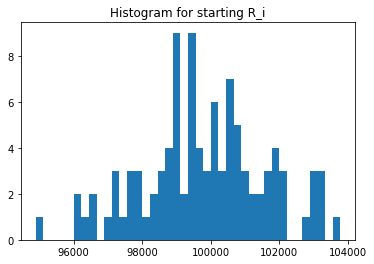

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([201996.5577461 , 298767.09001246, 198768.09001246, 198767.09001246,
       297612.05563807, 197618.05563807, 298836.73777557, 198836.73777557,
       301434.41979024, 201440.41979024, 200393.64850544, 201433.41979024,
       303911.95947475, 201508.3008214 , 301508.3008214 , 203911.95947475,
       201343.31949659, 295450.06267274, 195456.06267274, 203913.95947475,
       301330.31949659, 201329.31949659, 197612.05563807, 201516.3008214 ,
       303759.64873892, 203759.64873892, 202076.43624101, 199946.02378366,
       299946.02378366, 307548.2919022 , 203770.64873892, 207551.2919022 ,
       302063.43624101, 202063.43624101, 199951.02378366, 200388.64850544,
       196680.4744237 , 197607.83541865, 300389.64850544, 297607.83541865,
       198840.73777557, 296672.4744237 , 196671.4744237 , 207547.2919022 ,
       197614.83541865, 299099.02061417, 199108.02061417, 199266.81513095,
       300271.26826131, 200270.26826131, 198693.76672789, 192216.43227218,
       199099.02061417, 2

In [24]:
experiments.UNI_Si.unique()

array([10000., 15031., 15060., 15029., 14964., 14904., 14962., 15116.,
       14966., 14907., 15001., 14818., 14948., 14990., 15084., 15022.,
       14993., 15032., 15018., 15144., 14855., 15202., 15111., 14988.,
       15054., 14903., 15048., 15070., 14909., 15179., 14965., 15011.,
       14967., 14926., 14980., 14982., 15050., 15072., 14895., 15046.,
       15030., 15081., 15150., 14939., 15123., 14918., 15053., 14979.,
       14897., 15106., 14854., 15052., 15134., 15038., 15068., 15199.,
       14973., 15047., 15064., 14946., 14848., 14923., 14844., 14963.,
       14970., 14975., 14900., 14935., 15023., 15268., 14850., 14950.,
       15013., 14991., 14999., 14845., 15003., 14866., 15056., 15102.,
       14968., 15148., 15175., 15121., 15091., 15143., 14919., 15039.,
       15007., 15195.])

In [25]:
experiments.UNI_Qj.unique()

array([194418.4474541 , 201904.14952918, 200398.96300874, 197996.40227455,
       196600.92827866, 198222.06850876, 203454.75174422, 197747.81243404,
       195291.57119252, 196077.231658  , 197163.19100989, 194032.06930399,
       195796.0226227 , 200274.41256359, 207603.31638219, 193893.14310625,
       196395.68708622, 203172.92928252, 205690.05487723, 195079.09308881,
       211180.94193703, 194471.01880576, 200858.12505511, 203188.96817795,
       204688.0190082 , 208955.66475475, 202518.13993079, 202643.26662457,
       202361.02101812, 196139.41003538, 195113.38003965, 201175.61438211,
       201903.17850891, 201901.7459278 , 201191.35420859, 202098.49027696,
       193672.9508536 , 201004.38478618, 200911.82102208, 201939.03604997,
       195137.12985027, 205296.97880476, 202876.2016126 , 199108.23227827,
       203151.55171495, 194787.8221507 , 200739.82658988, 201042.13295417,
       200931.08249079, 195762.39587696, 196641.67923206, 206296.19078279,
       196356.27137964, 1

In [26]:
experiments.UNI_Rj.unique()

array([ 97209.22372705, 100952.07476459, 100199.48150437,  98998.20113728,
        98300.46413933,  99111.03425438, 101727.37587211,  98873.90621702,
        97645.78559626,  98038.615829  ,  98581.59550495,  97016.03465199,
        97898.01131135, 100137.2062818 , 103801.6581911 ,  96946.57155313,
        98197.84354311, 101586.46464126, 102845.02743862,  97539.54654441,
       105590.47096851,  97235.50940288, 100429.06252756, 101594.48408897,
       102344.0095041 , 104477.83237737, 101259.0699654 , 101321.63331229,
       101180.51050906,  98069.70501769,  97556.69001982, 100587.80719106,
       100951.58925445, 100950.8729639 , 100595.67710429, 101049.24513848,
        96836.4754268 , 100502.19239309, 100455.91051104, 100969.51802499,
        97568.56492513, 102648.48940238, 101438.1008063 ,  99554.11613914,
       101575.77585748,  97393.91107535, 100369.91329494, 100521.06647709,
       100465.5412454 ,  97881.19793848,  98320.83961603, 103148.09539139,
        98178.13568982,  

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 97209.22372705,  98998.20113728, 100952.07476459,  98300.46413933,
       101727.37587211,  98873.90621702,  97645.78559626, 100199.48150437,
        98581.59550495,  97898.01131135,  99111.03425438,  96946.57155313,
       103801.6581911 , 100137.2062818 , 102845.02743862,  97539.54654441,
        98197.84354311, 101586.46464126,  97235.50940288, 101594.48408897,
       102344.0095041 , 104477.83237737, 101321.63331229,  98038.615829  ,
       101259.0699654 , 101180.51050906,  98069.70501769,  97016.03465199,
       100429.06252756, 100595.67710429, 100950.8729639 ,  96836.4754268 ,
       100502.19239309, 100455.91051104, 102648.48940238, 101575.77585748,
       101438.1008063 ,  97393.91107535,  97556.69001982,  99554.11613914,
       100369.91329494, 101049.24513848, 100521.06647709, 100465.5412454 ,
       103148.09539139,  98320.83961603,  98445.85349378,  98178.13568982,
       100587.80719106,  97881.19793848, 100969.51802499, 100695.23274396,
       101640.17738244,  

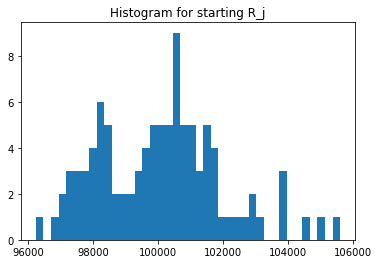

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100998.27887305, 109539.54500623, 110741.54500623, ...,
       107666.97132416,  87393.70193842, 106495.97132416])

In [31]:
experiments.UNI_ji.unique()

array([ 97209.22372705,  91812.07476459,  90812.07476459, ...,
        90663.21245131, 111480.67710429,  91663.21245131])

In [32]:
experiments.UNI_Sij.unique()

array([9.81796429e+09, 1.00329751e+10, 9.90031276e+09, 9.84223968e+09,
       9.90049933e+09, 9.93036310e+09, 1.03717143e+10, 9.96195642e+09,
       9.82947978e+09, 9.58077778e+09, 1.00434756e+10, 9.80169667e+09,
       9.78715905e+09, 1.03916030e+10, 1.02074126e+10, 9.57870108e+09,
       9.77554724e+09, 1.01209993e+10, 1.02984006e+10, 9.69024995e+09,
       1.01475839e+10, 9.45041598e+09, 9.90289246e+09, 1.04616291e+10,
       1.00104565e+10, 1.04709845e+10, 1.00815215e+10, 1.03317720e+10,
       1.00084976e+10, 9.71344377e+09, 9.66621386e+09, 1.02683247e+10,
       9.88386758e+09, 1.02815920e+10, 9.71107430e+09, 1.01746014e+10,
       9.66127772e+09, 1.01155666e+10, 1.01950437e+10, 9.99284372e+09,
       9.79534330e+09, 1.03000872e+10, 1.00425347e+10, 9.79574423e+09,
       1.00124022e+10, 9.94747681e+09, 9.97673547e+09, 9.75924212e+09,
       1.01702013e+10, 1.00817243e+10, 9.72847125e+09, 1.00660286e+10,
       9.98064483e+09, 9.88579074e+09, 9.99227694e+09, 9.89760437e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


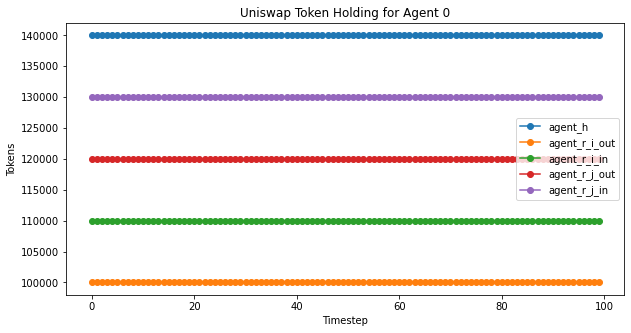

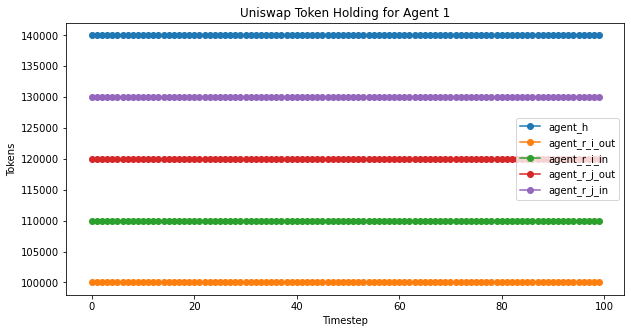

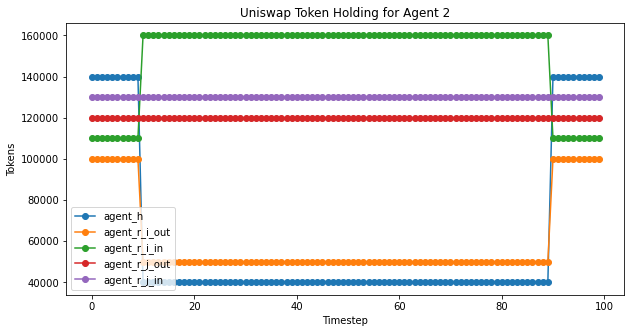

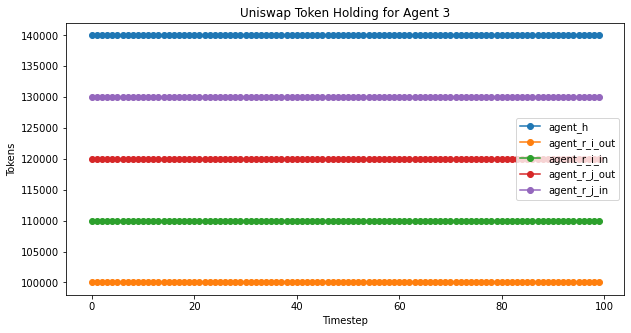

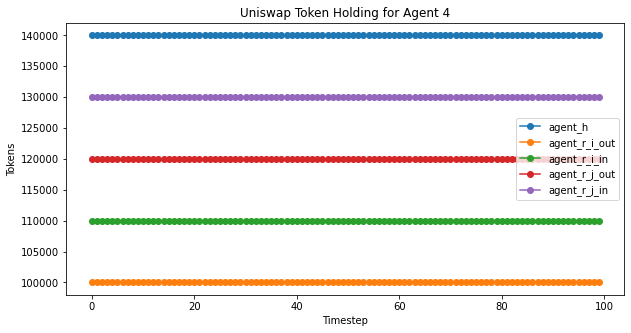

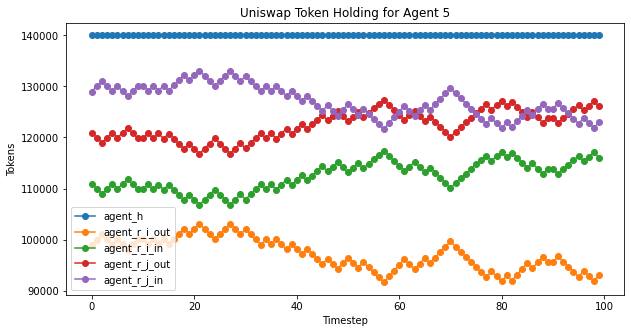

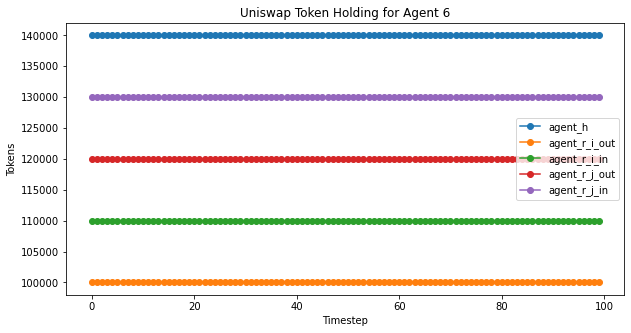

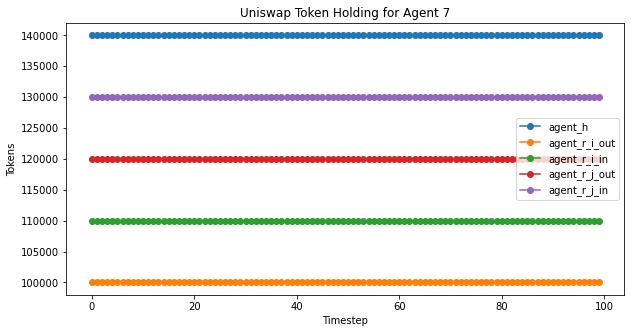

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


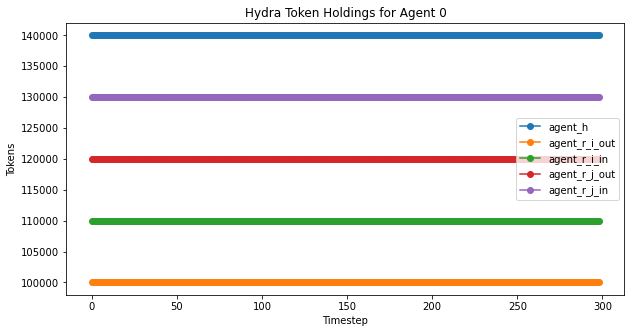

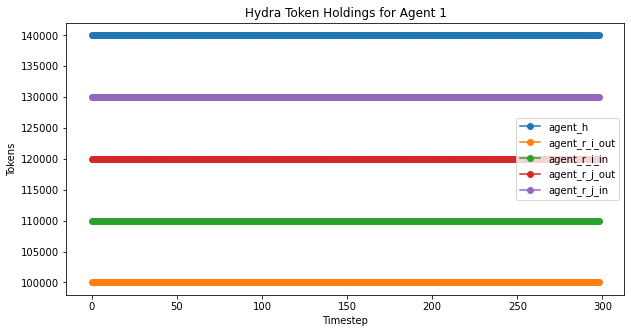

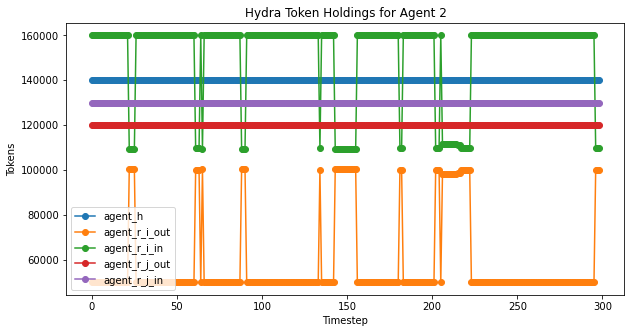

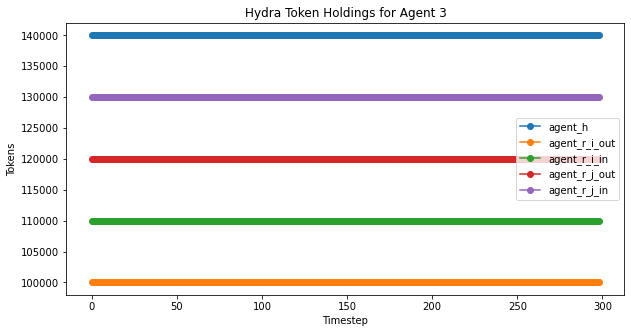

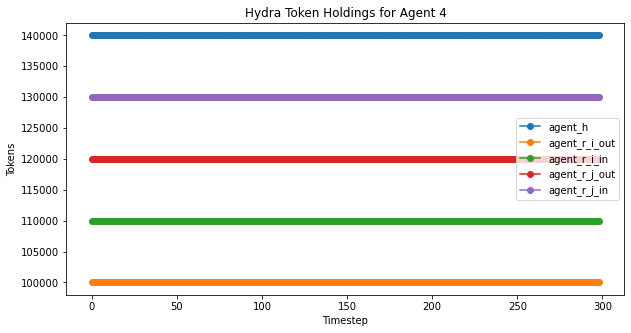

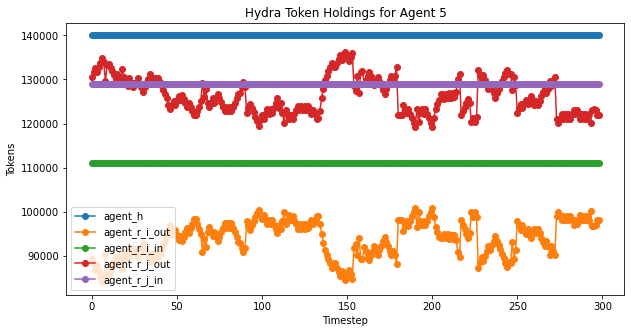

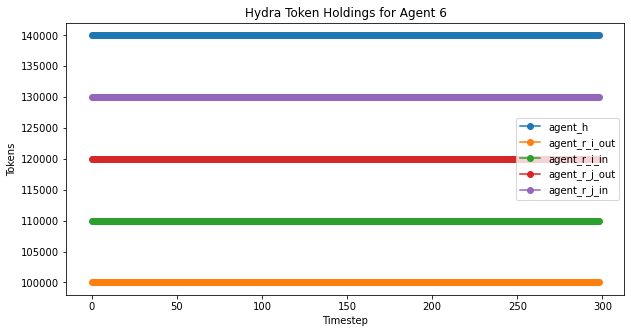

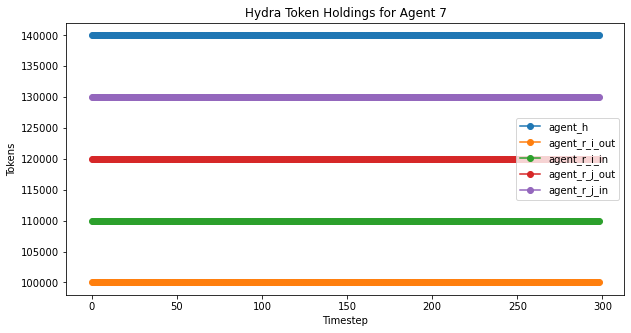

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

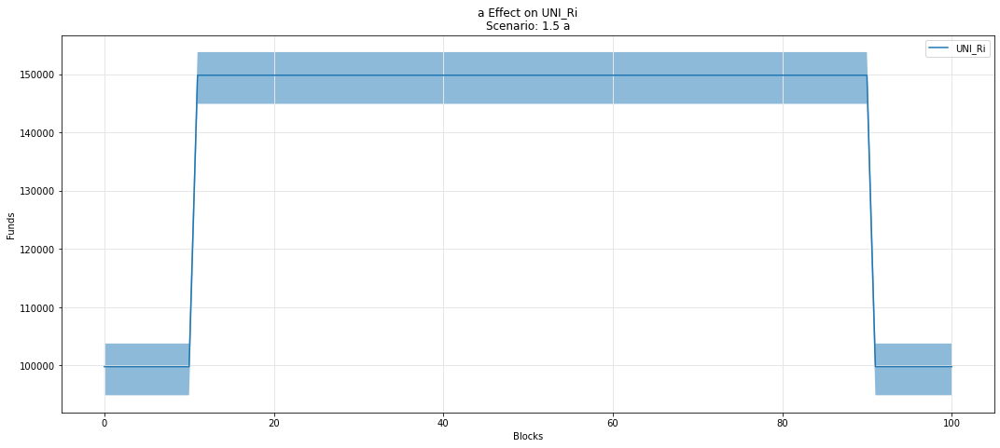

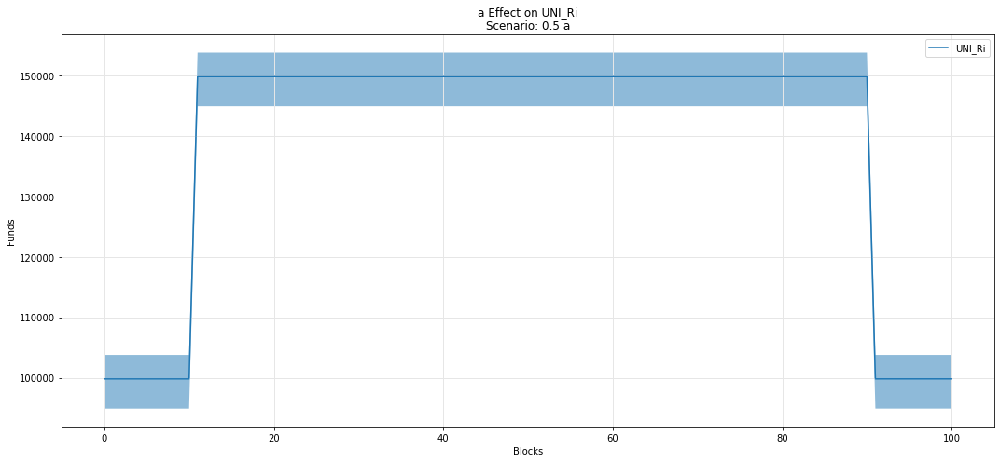

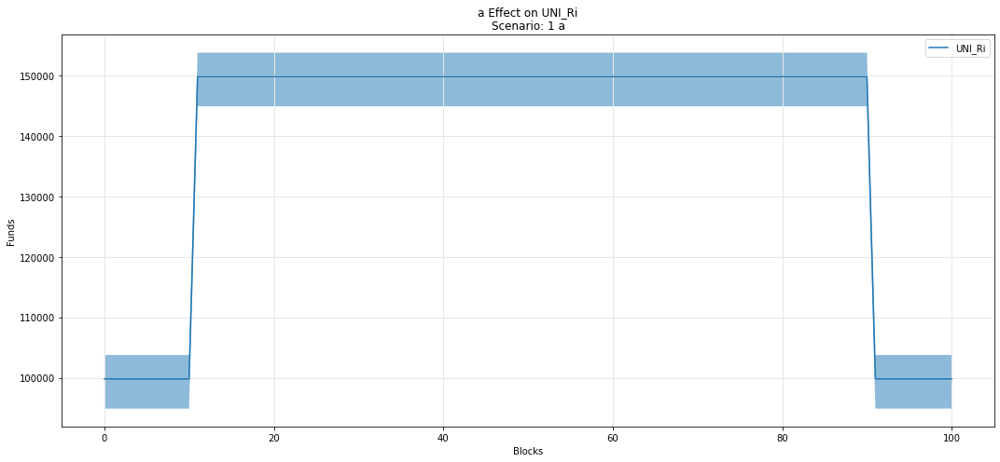

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

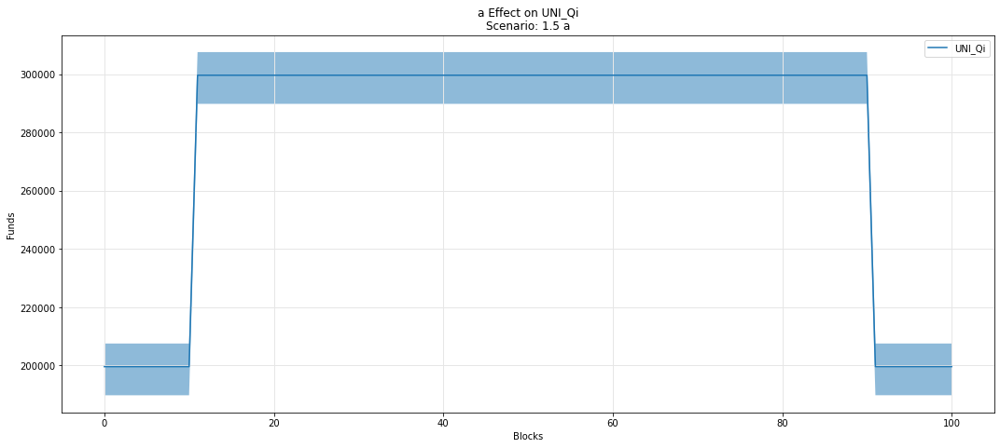

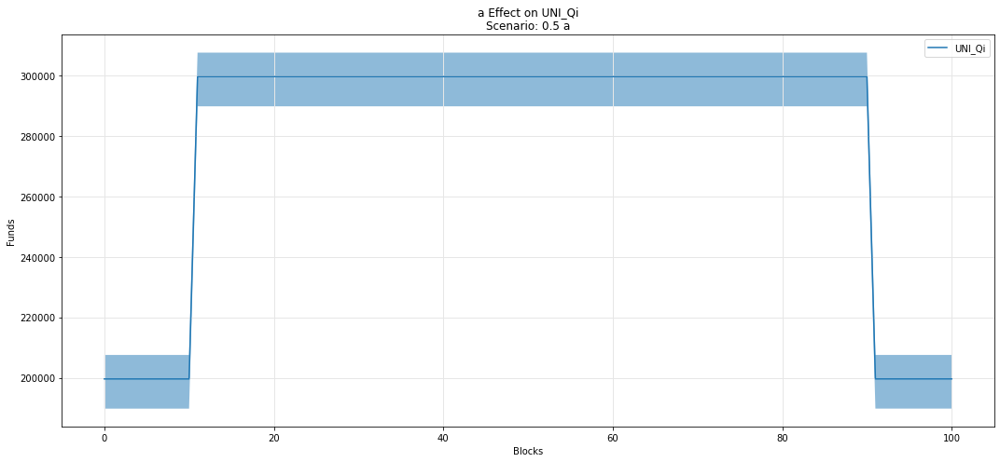

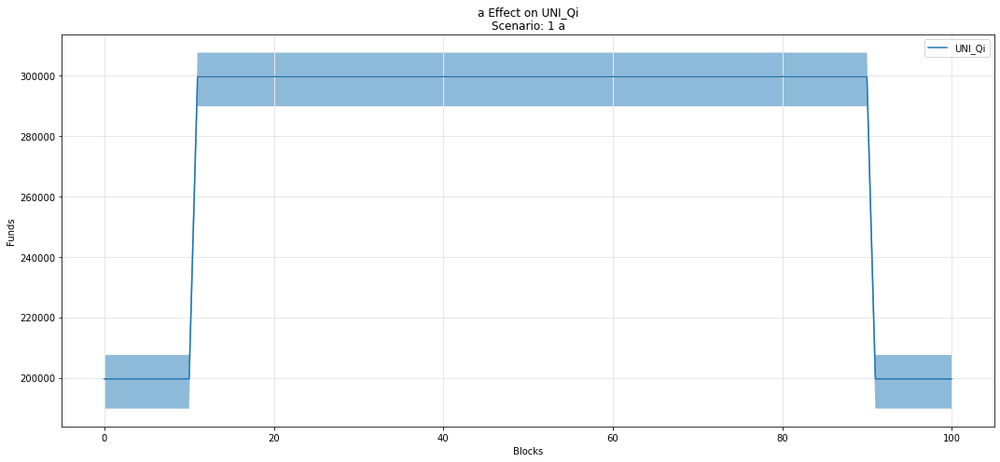

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

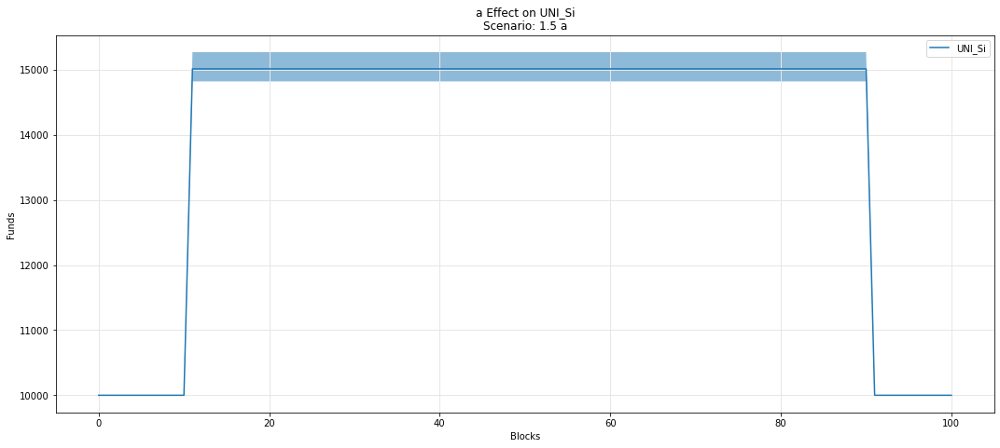

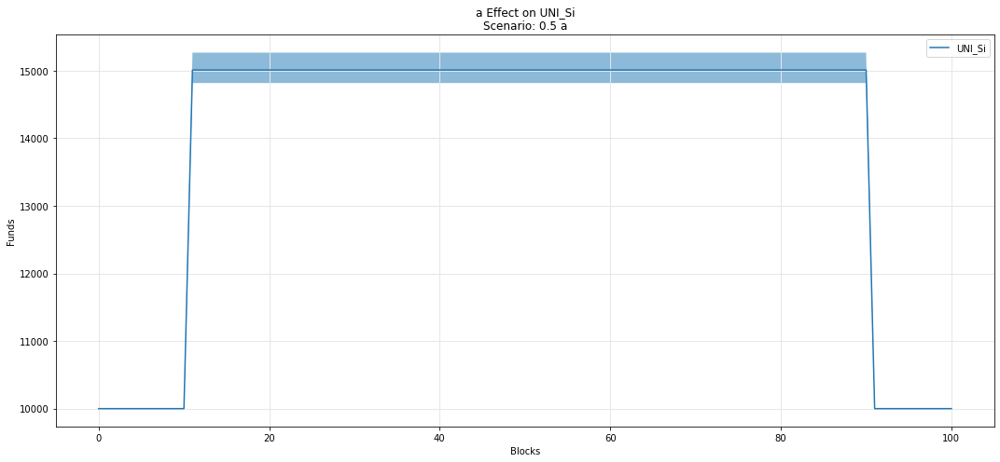

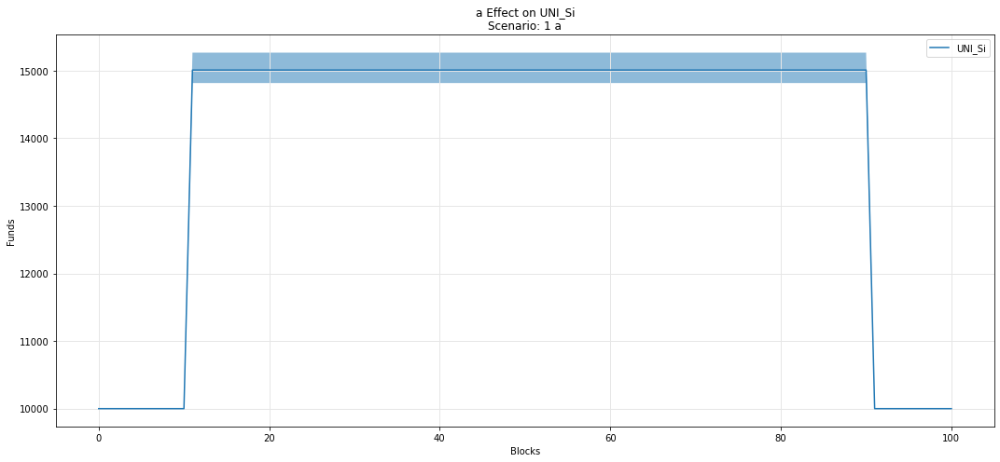

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

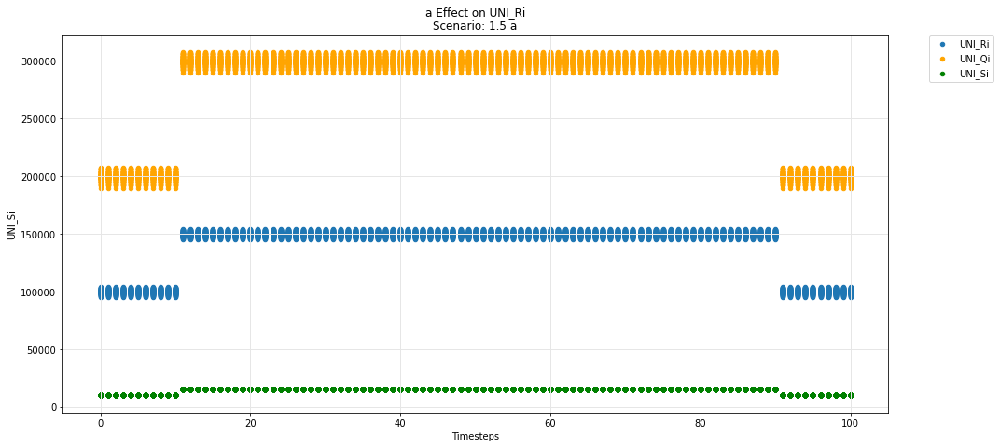

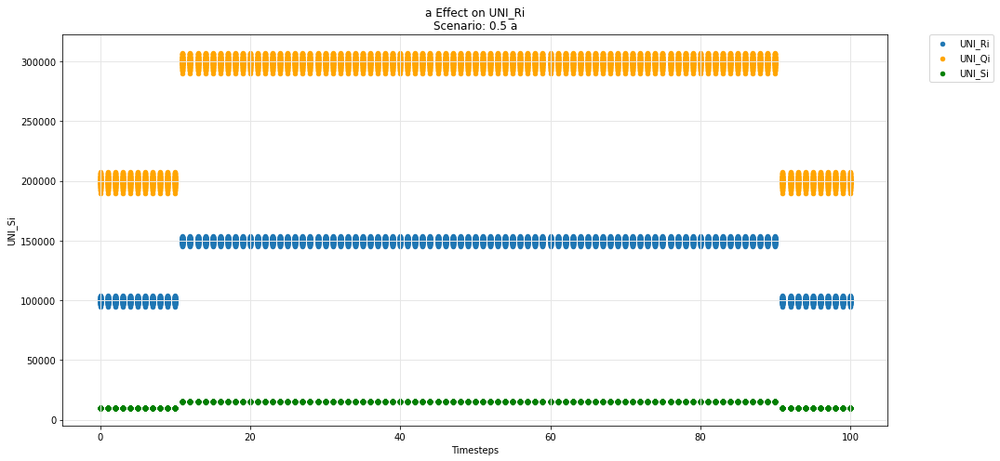

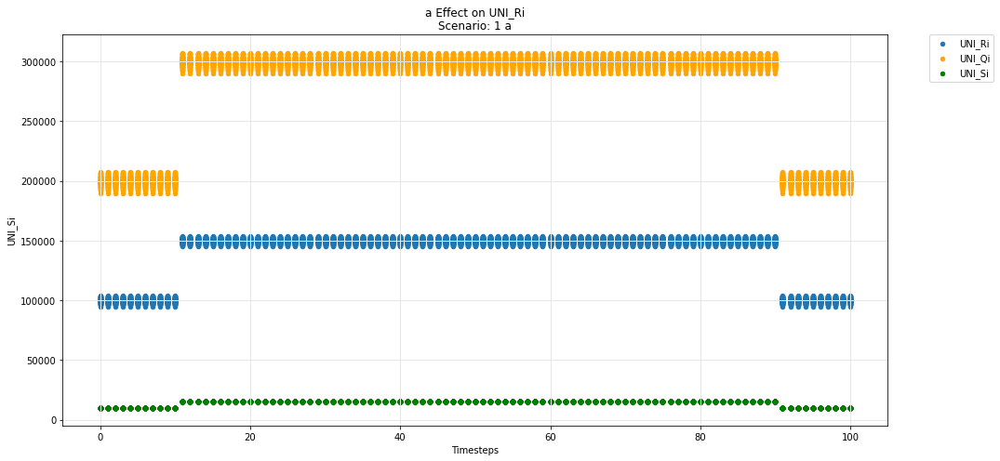

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

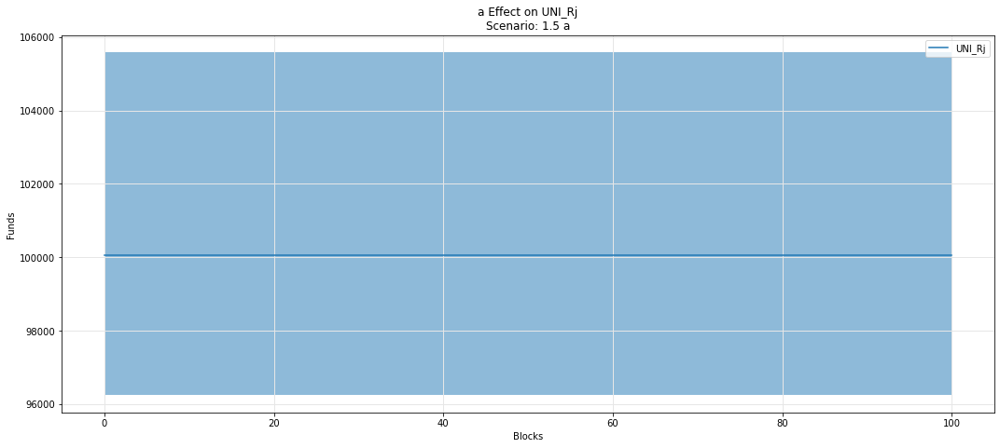

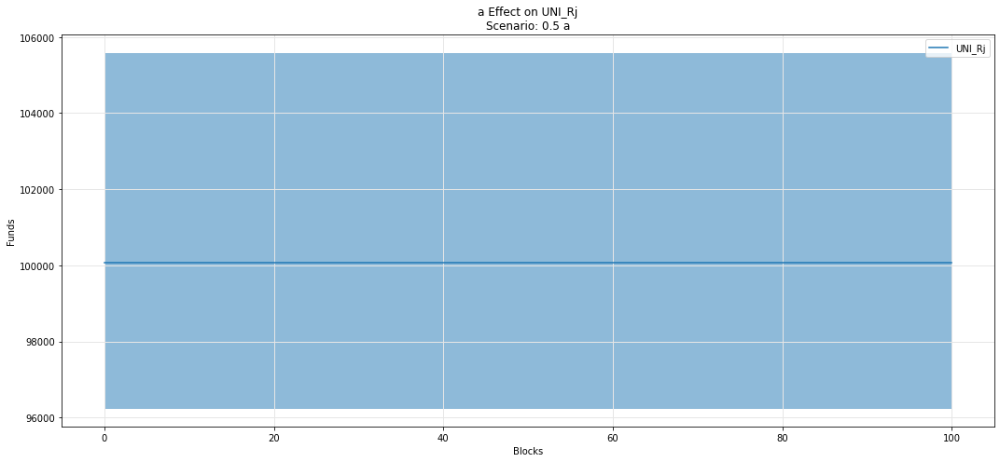

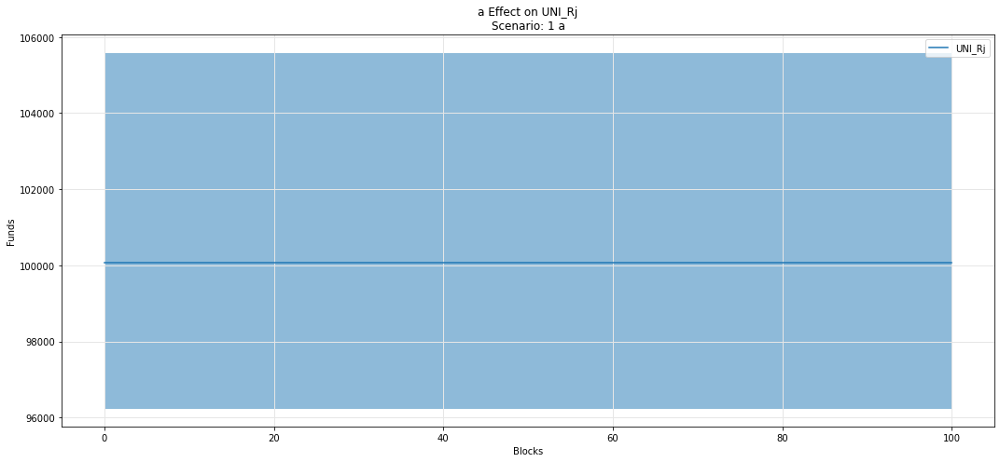

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

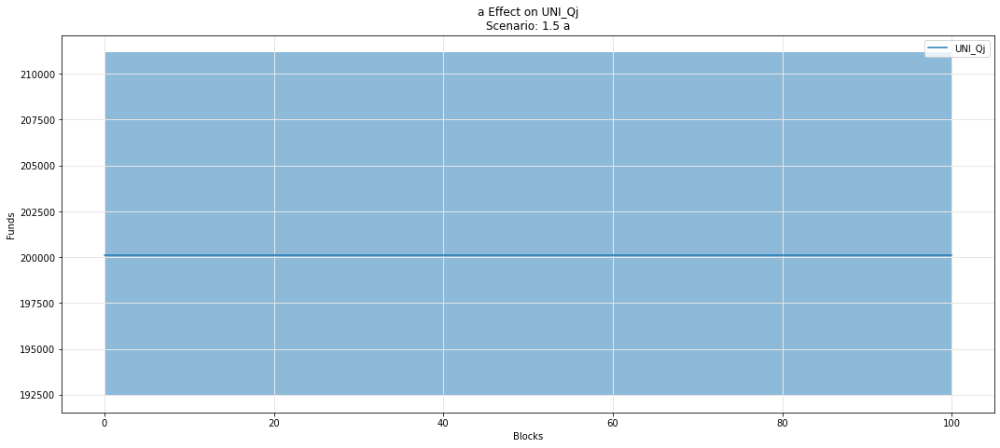

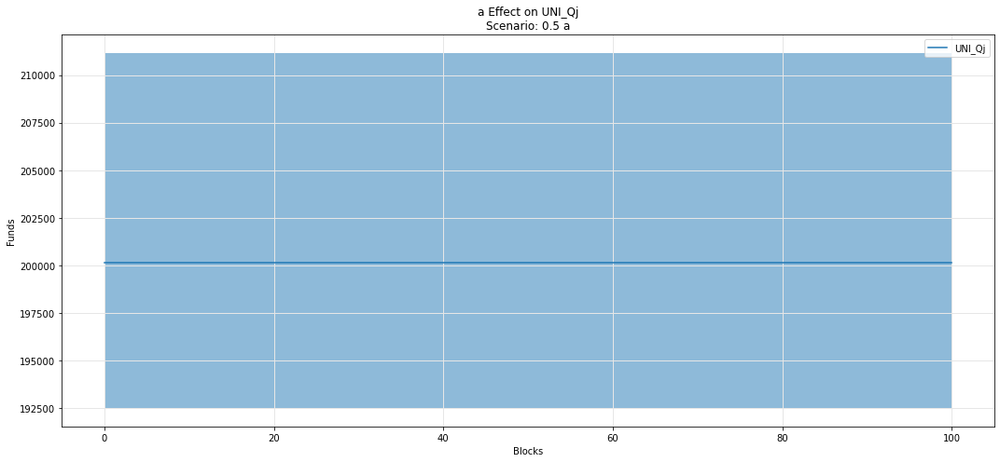

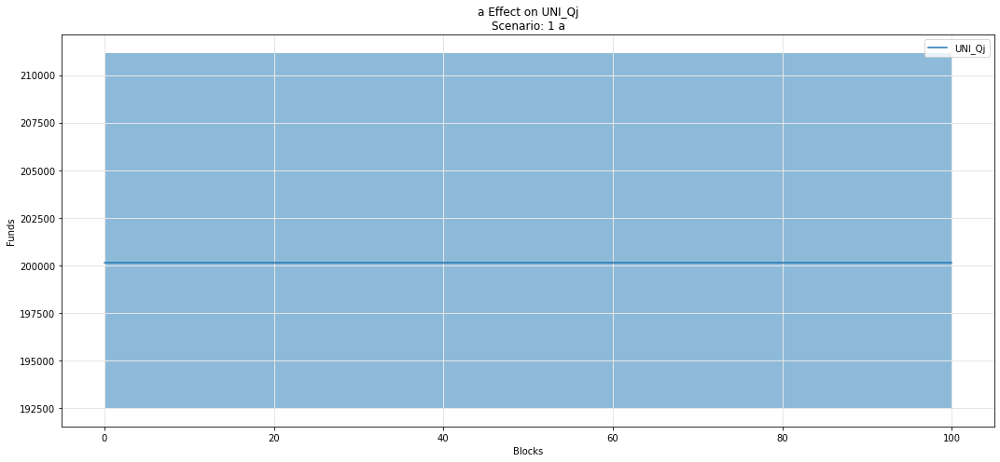

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

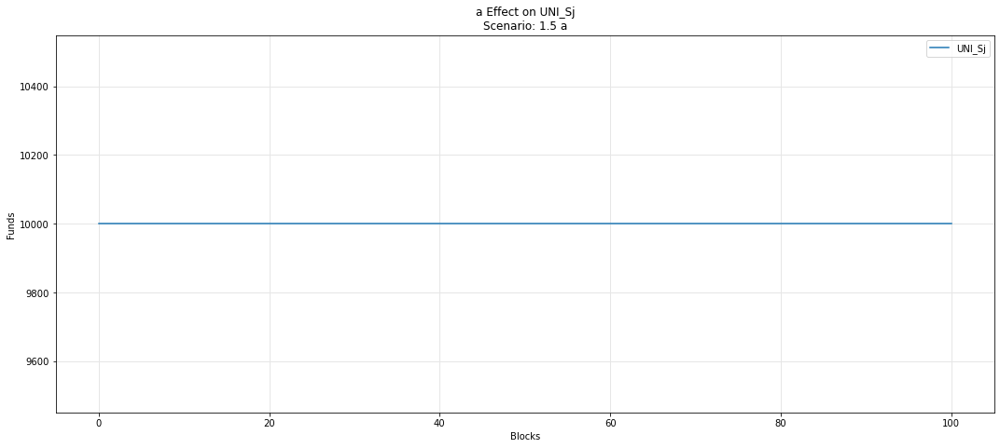

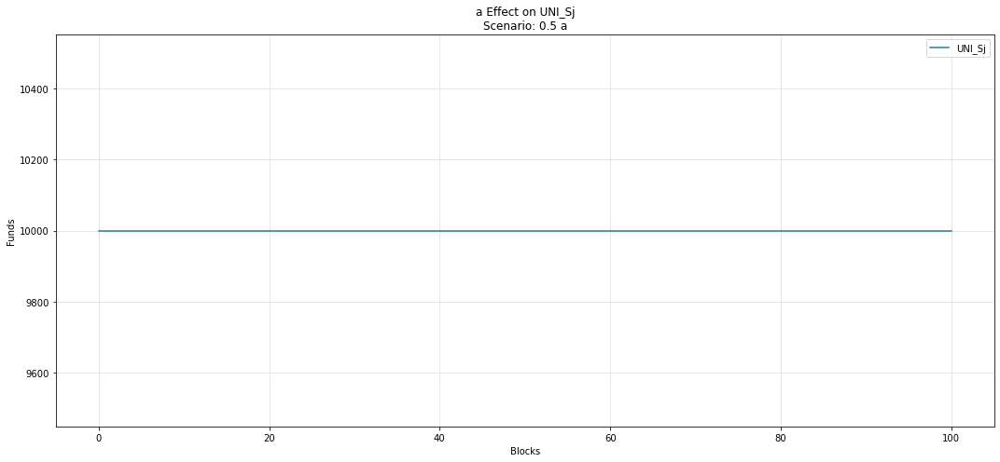

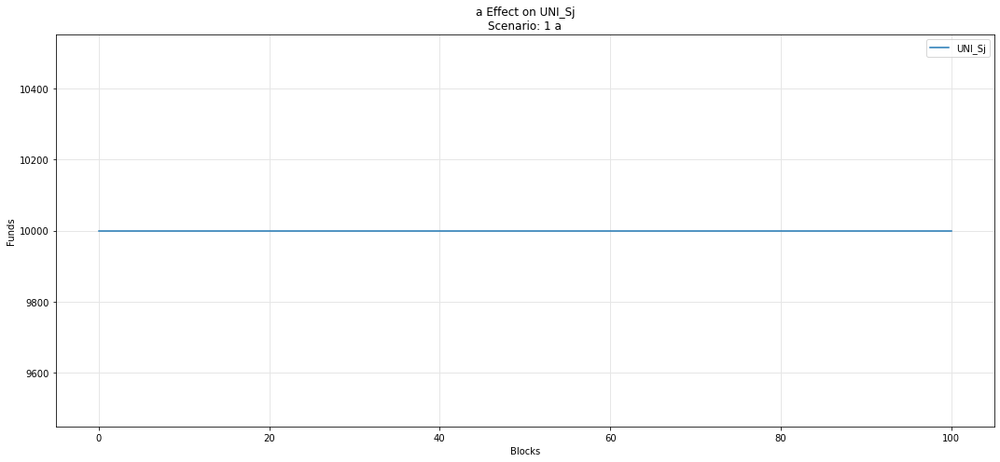

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

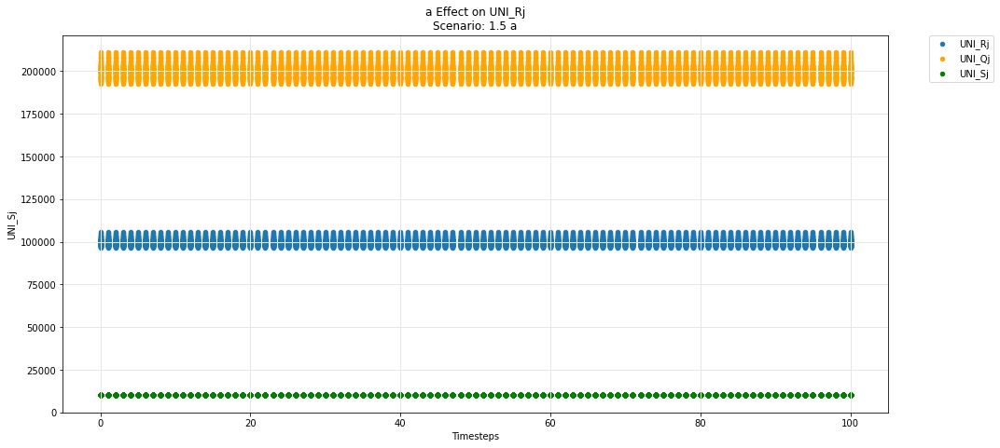

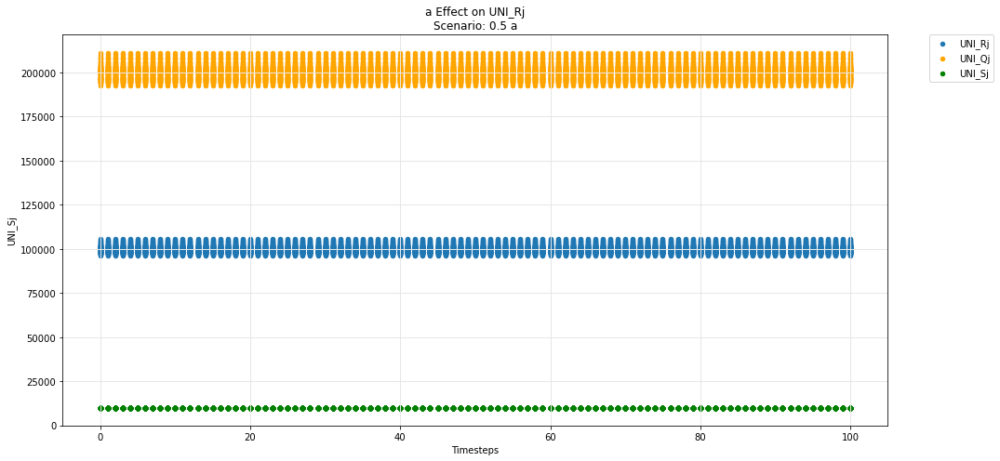

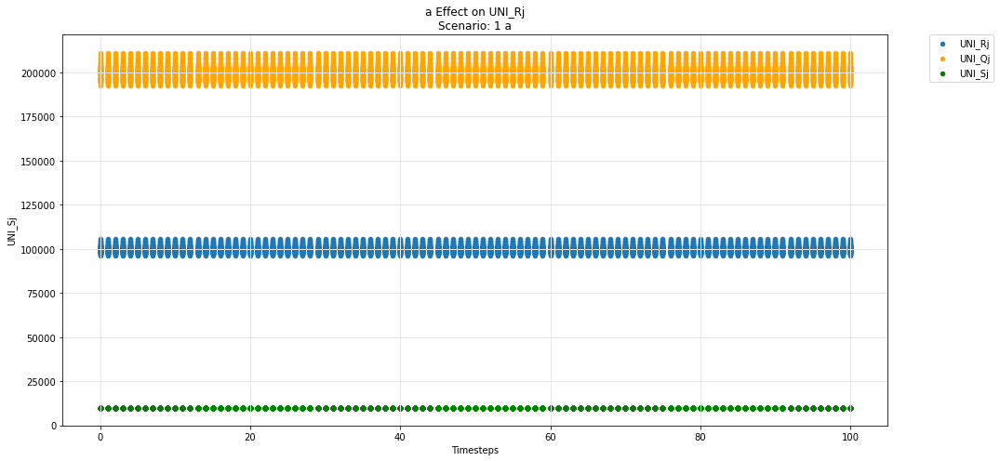

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

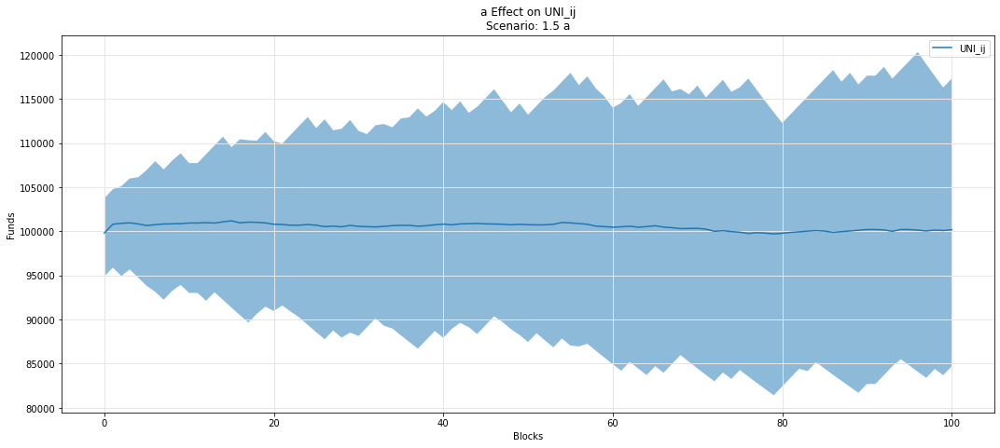

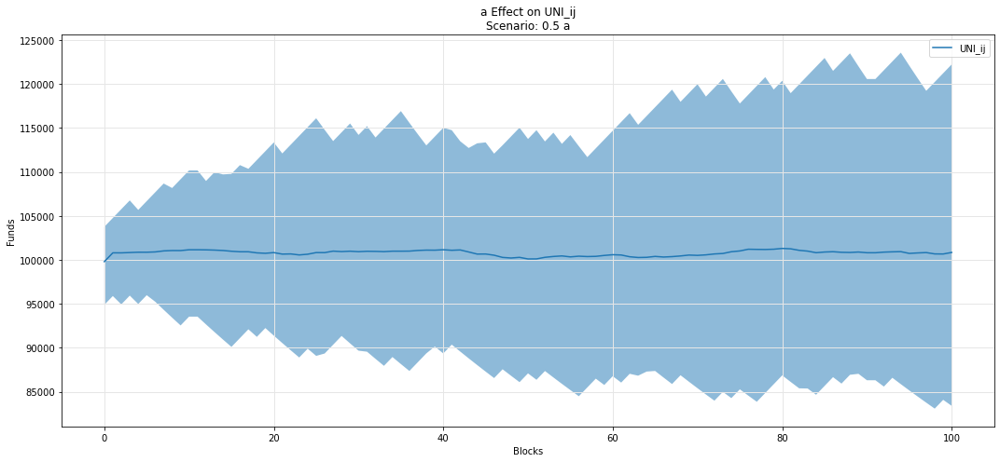

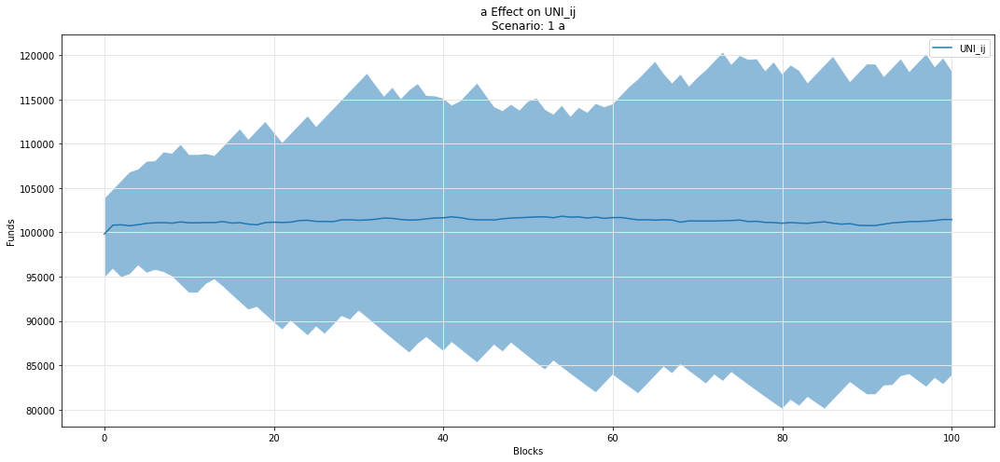

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

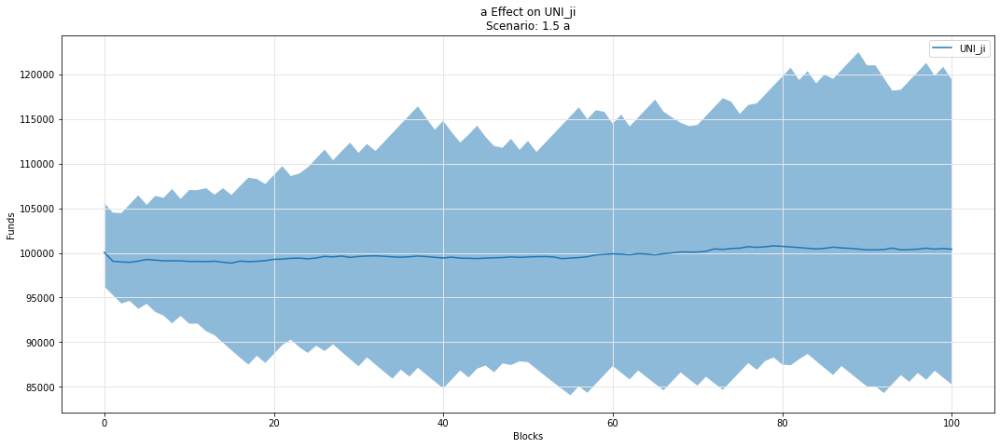

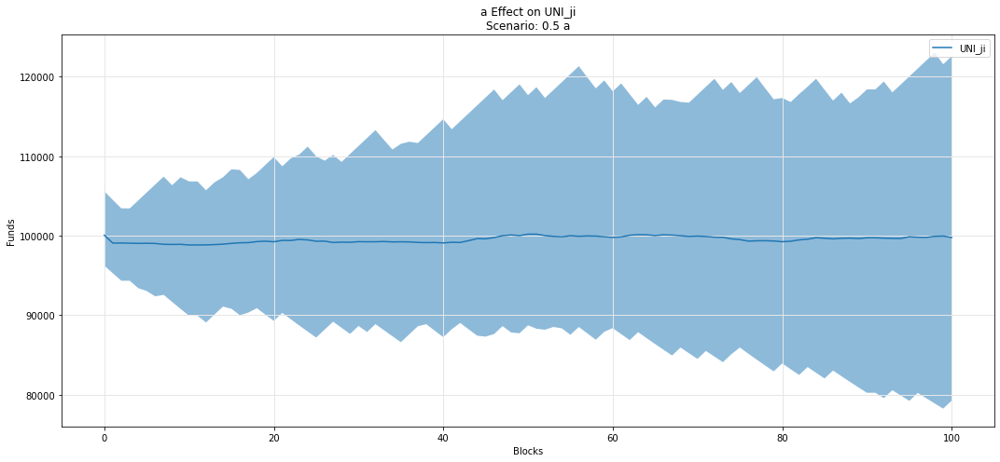

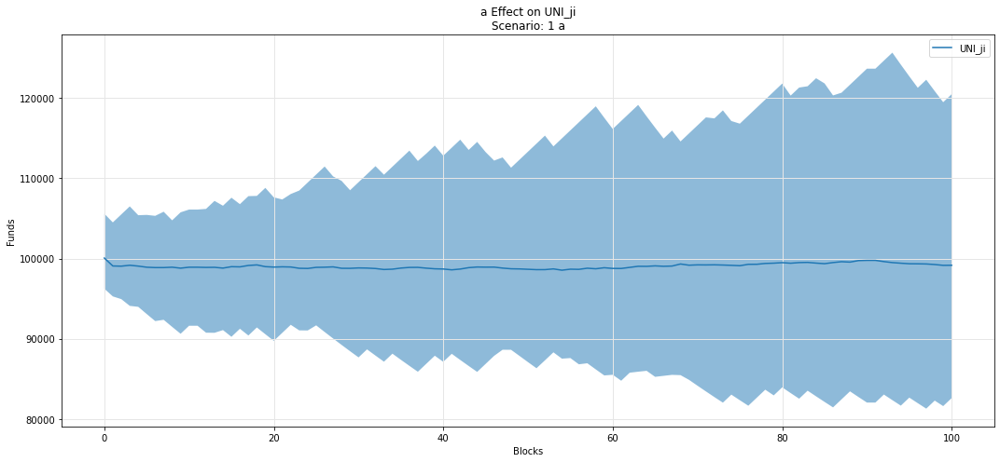

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

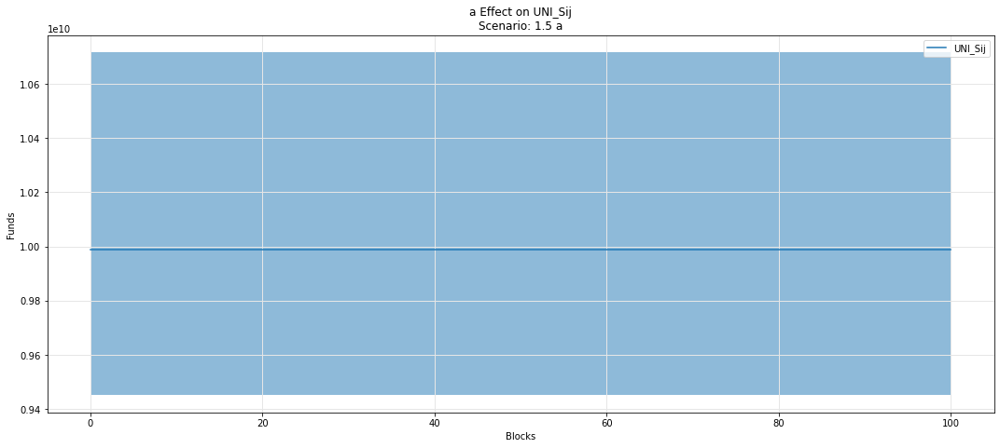

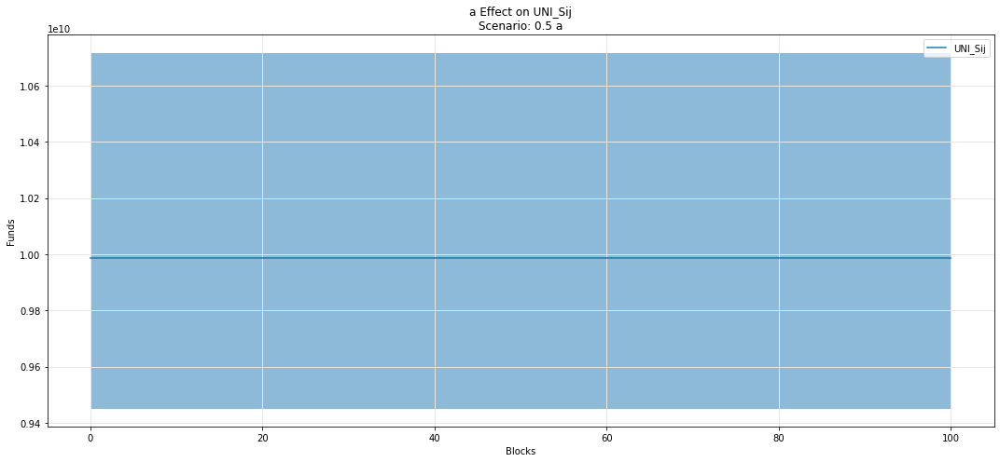

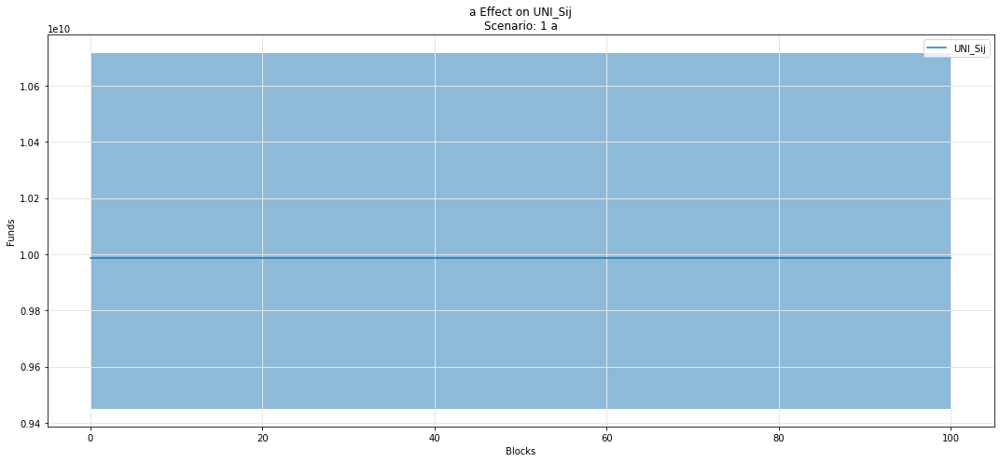

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

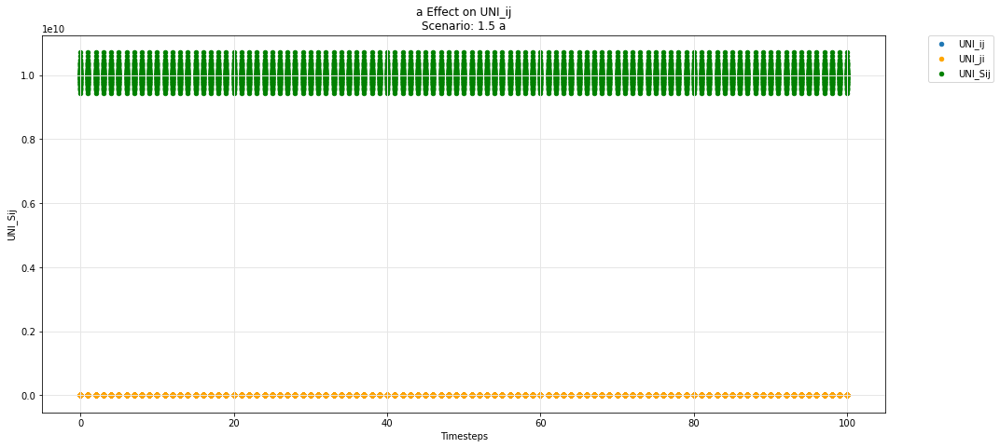

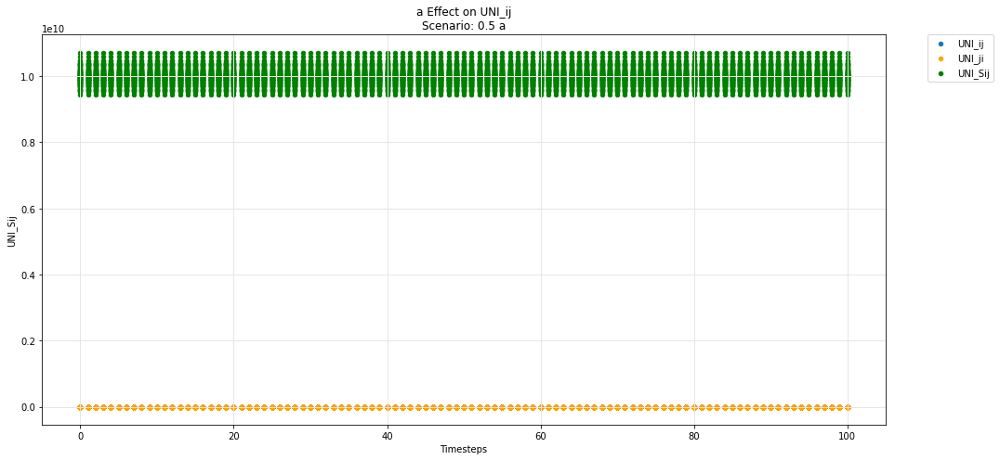

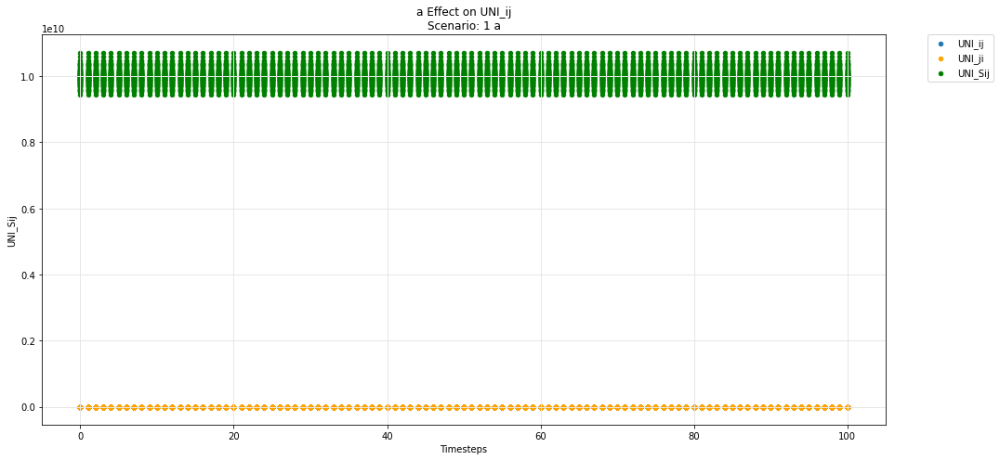

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

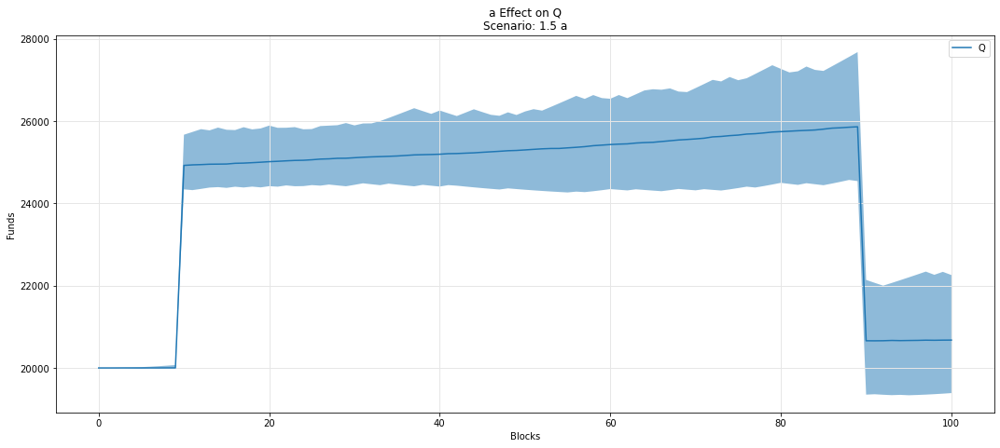

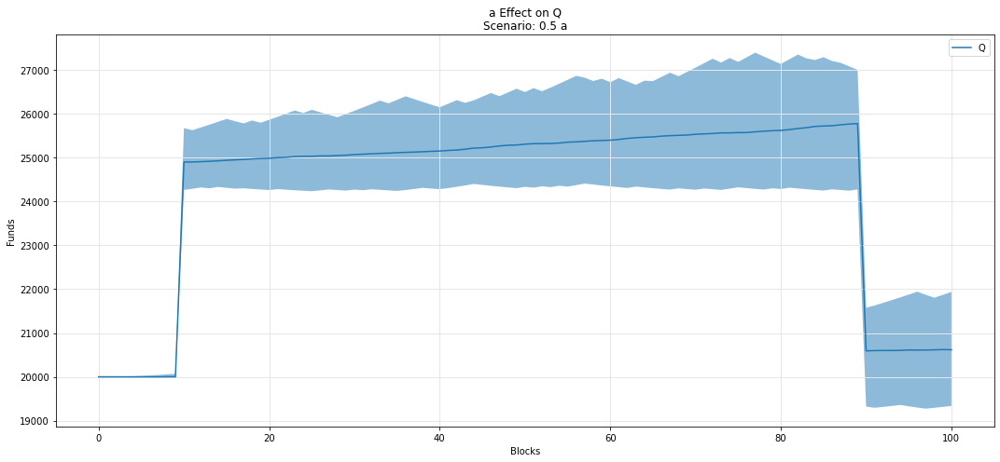

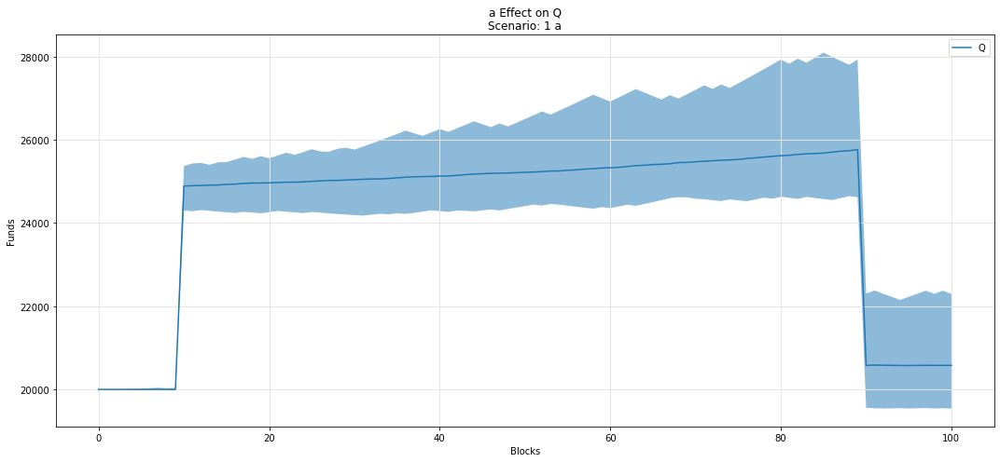

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

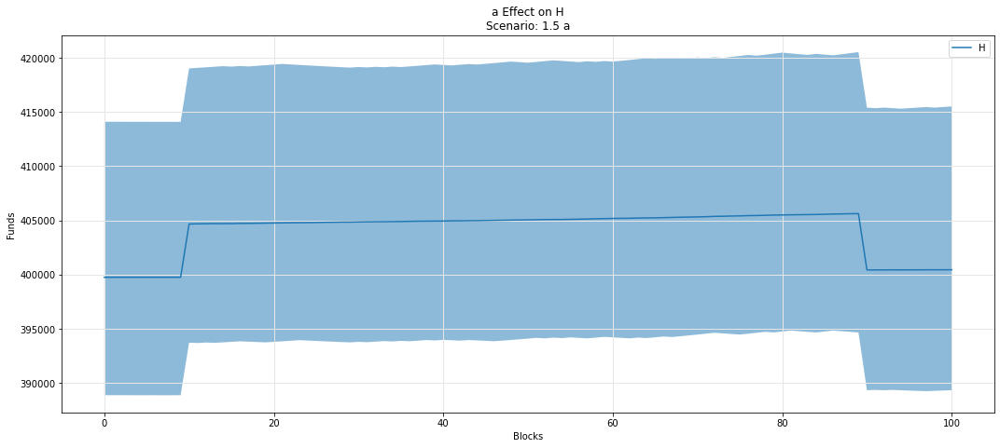

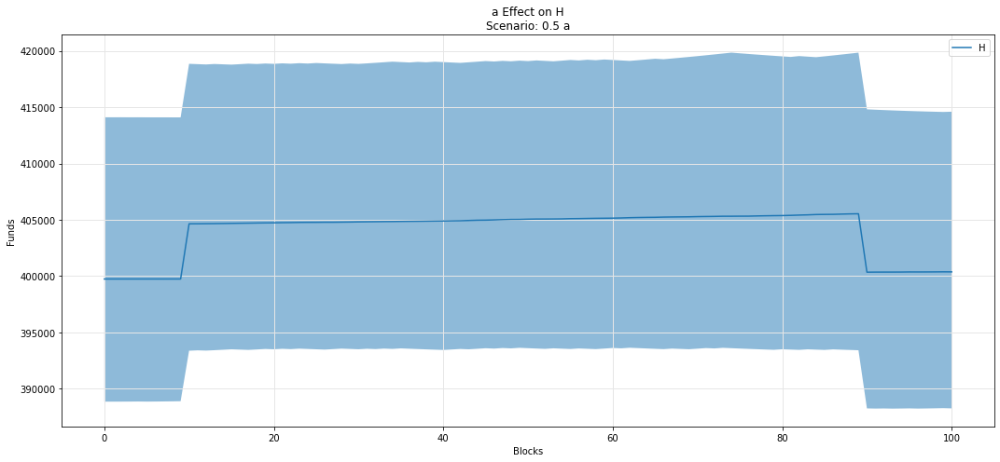

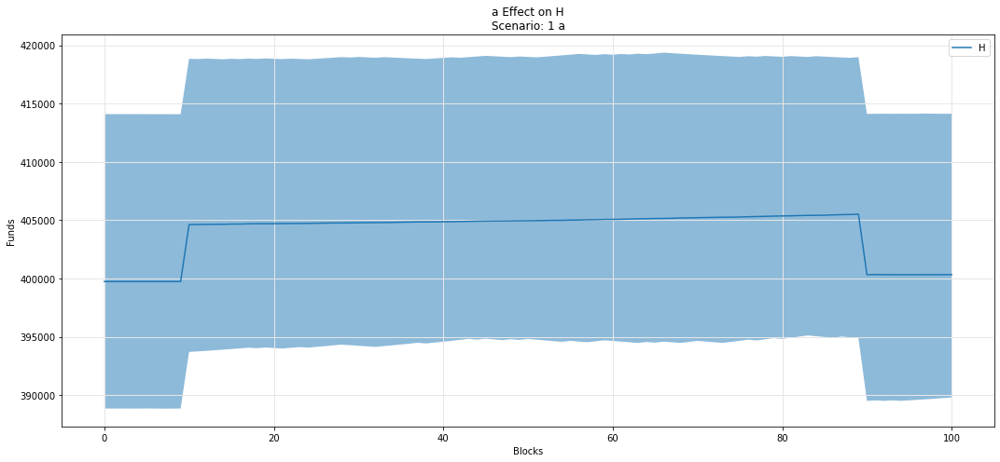

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

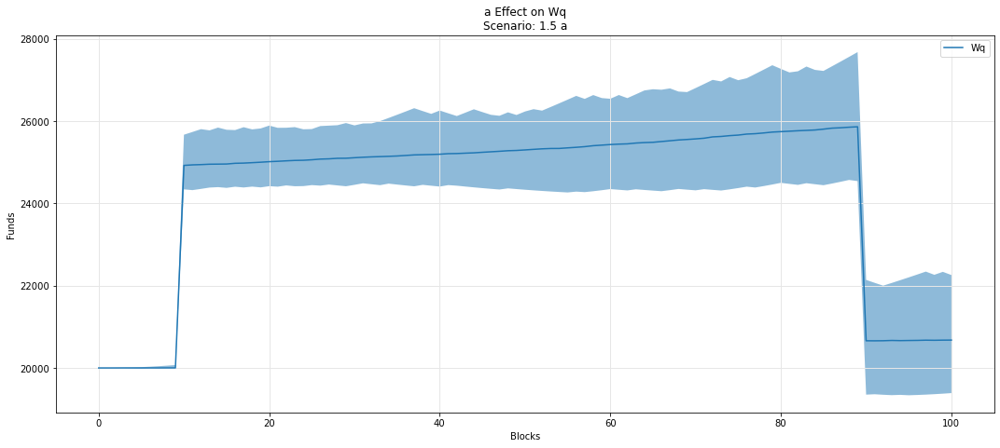

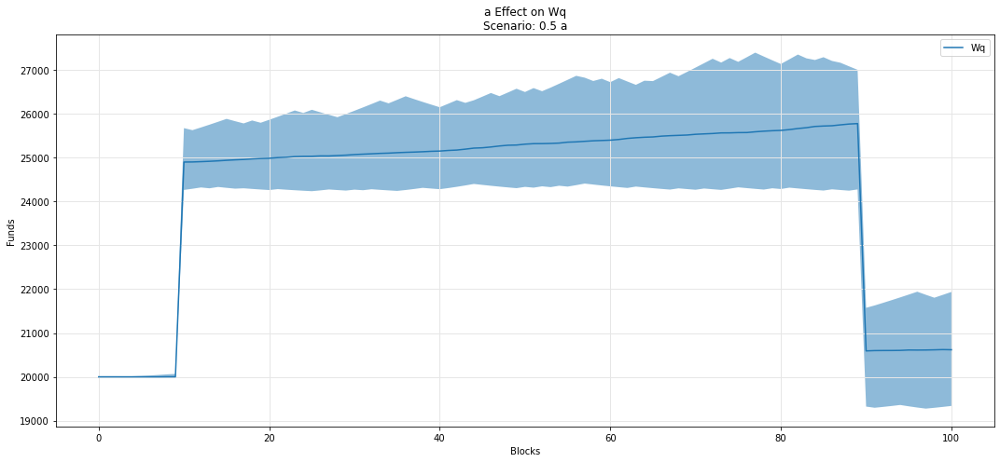

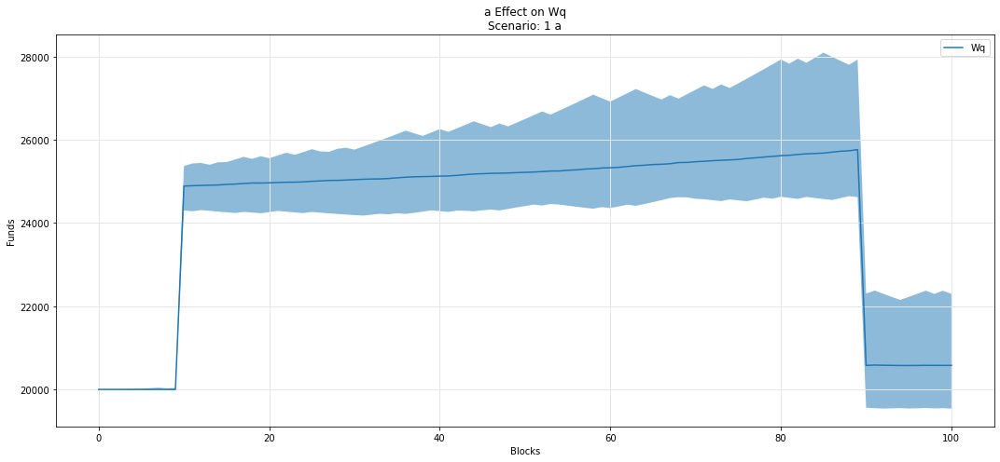

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

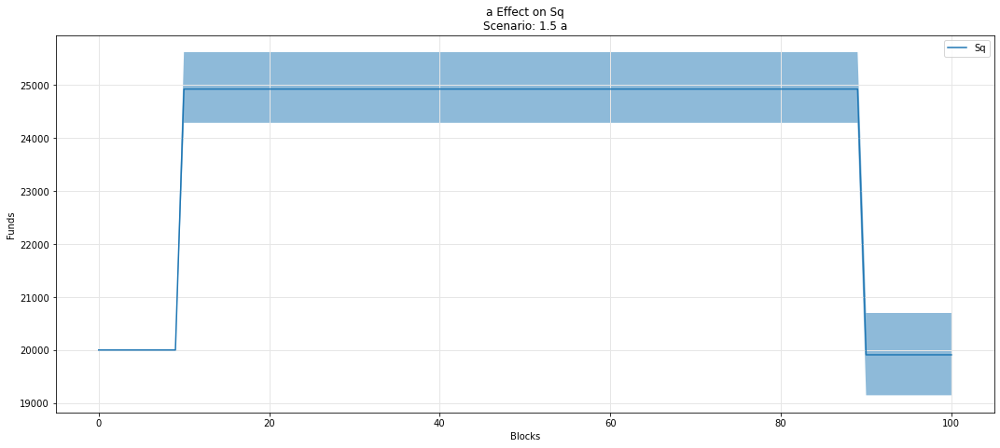

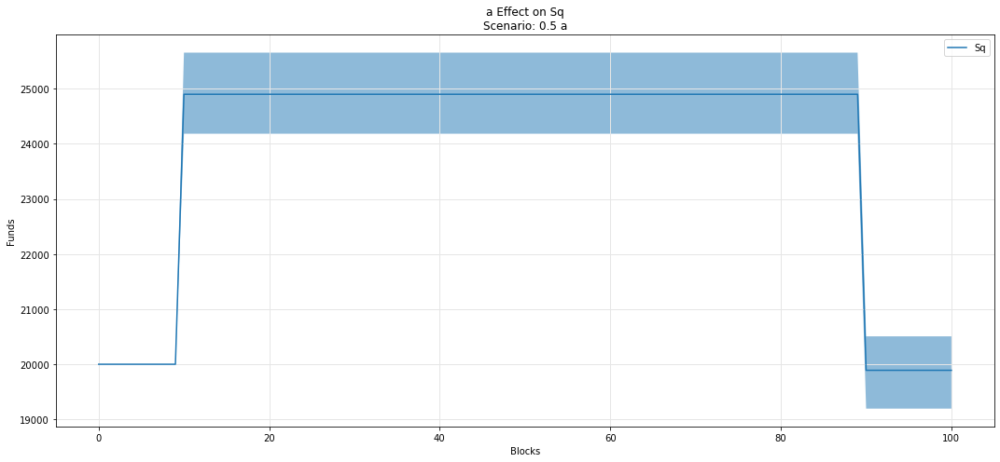

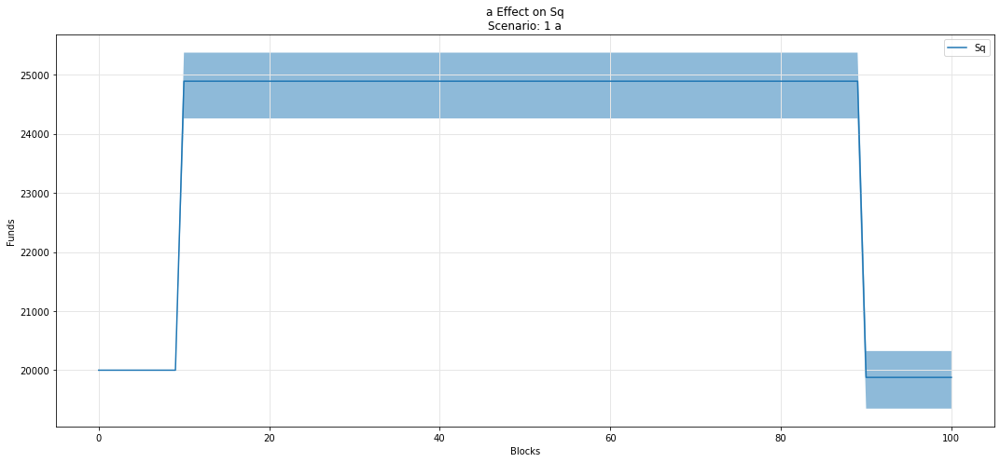

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

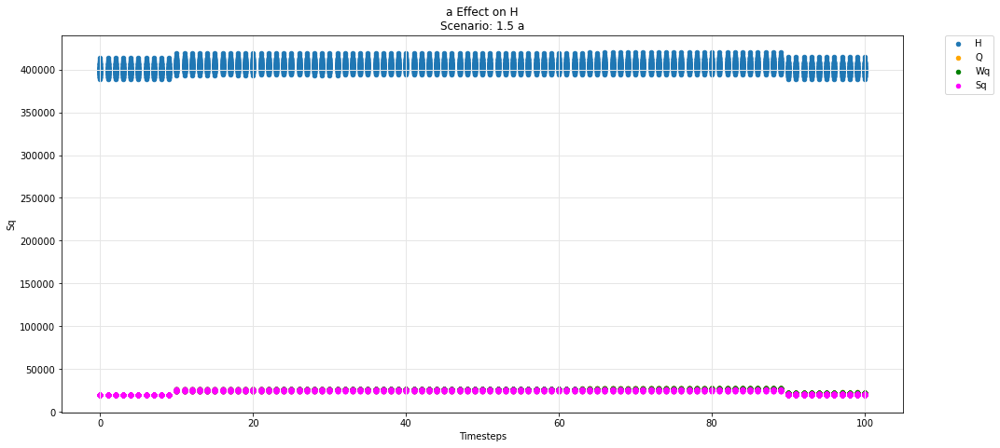

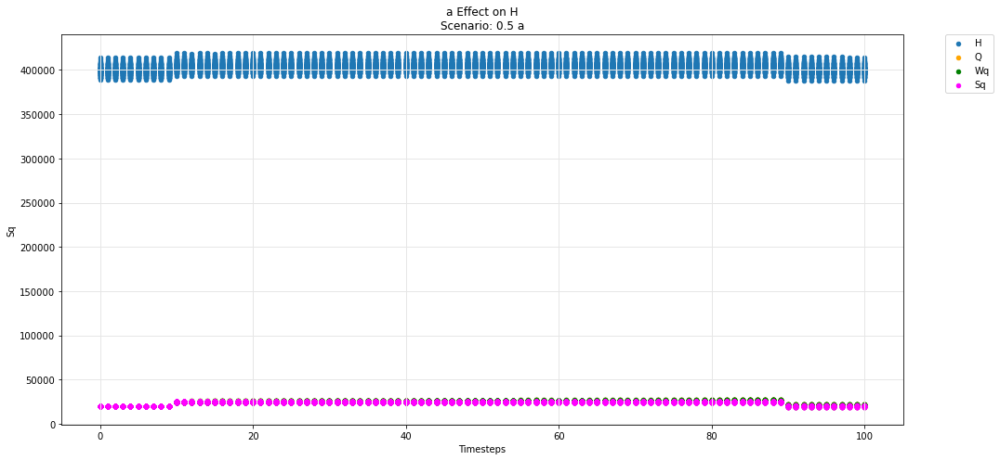

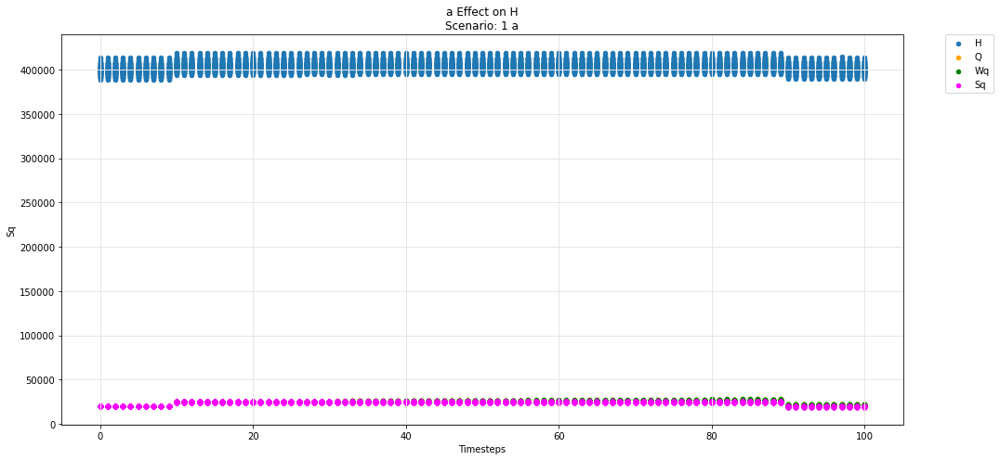

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

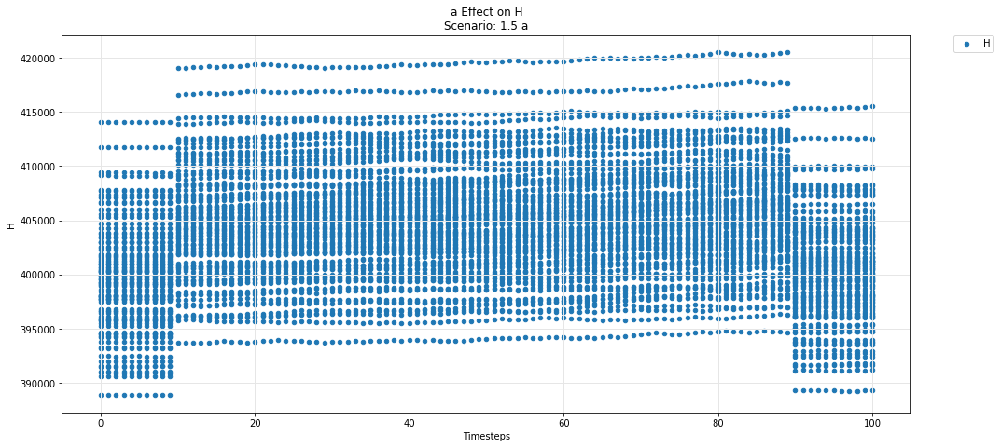

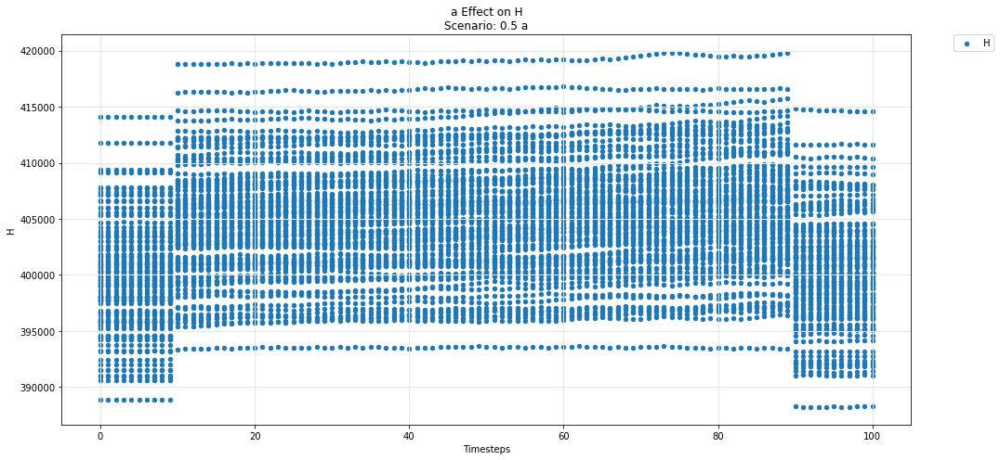

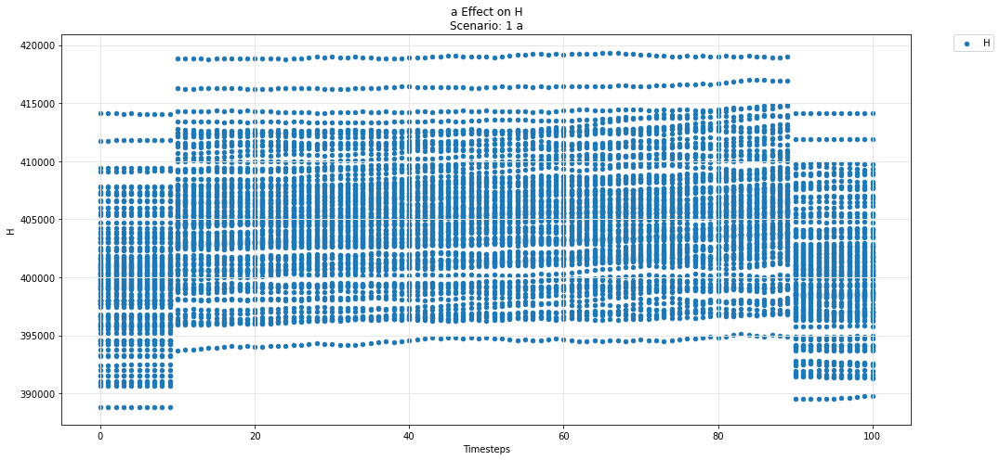

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

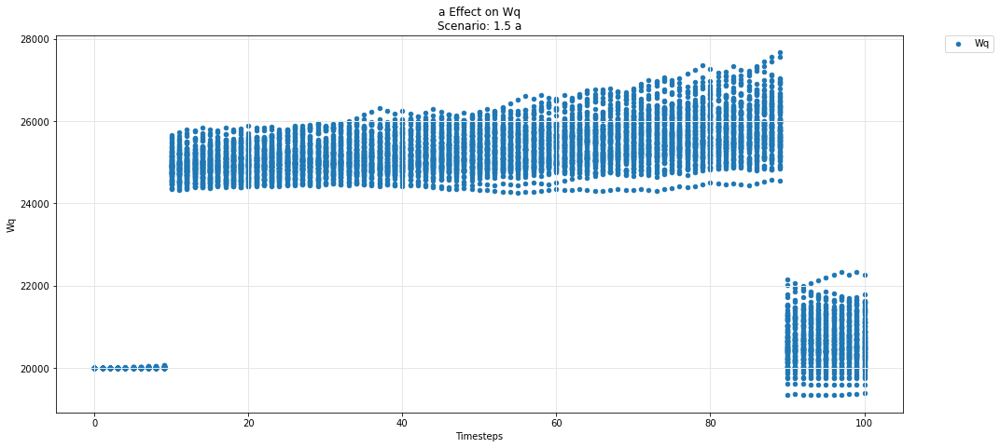

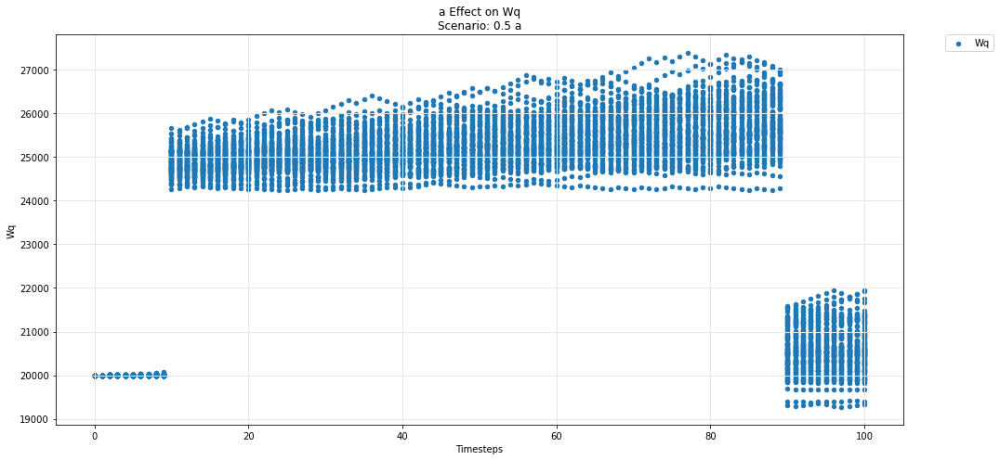

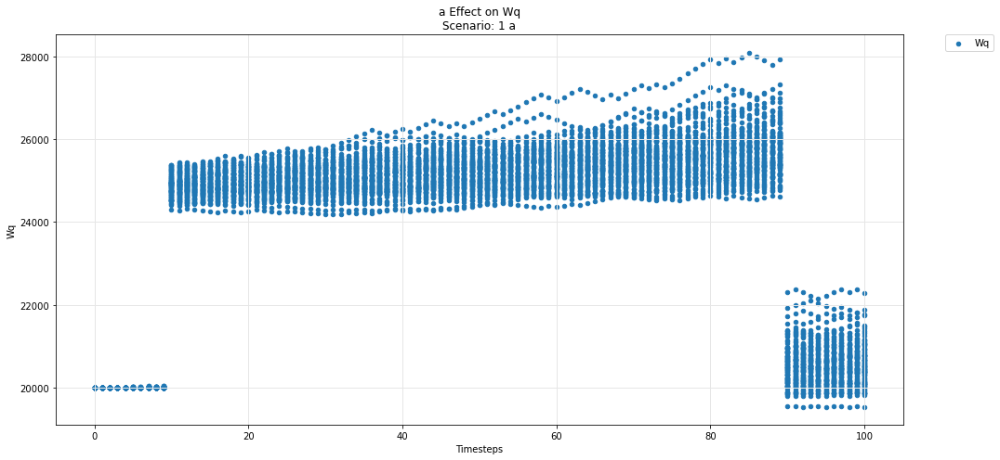

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

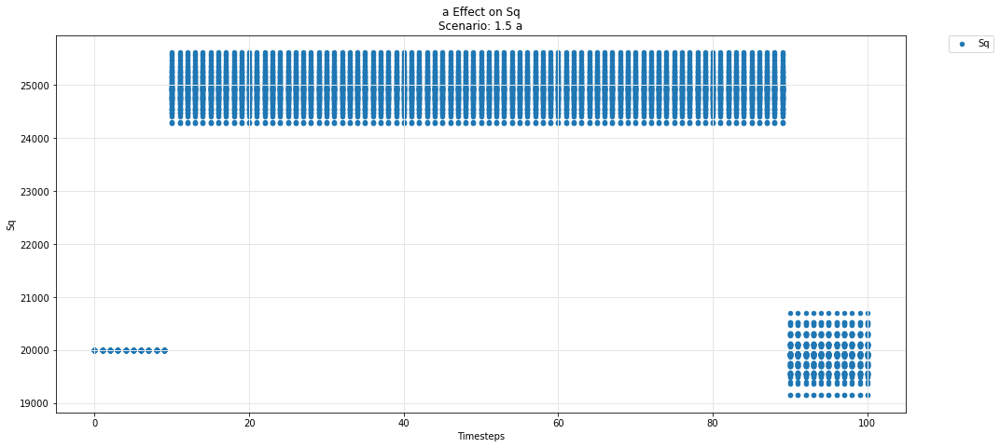

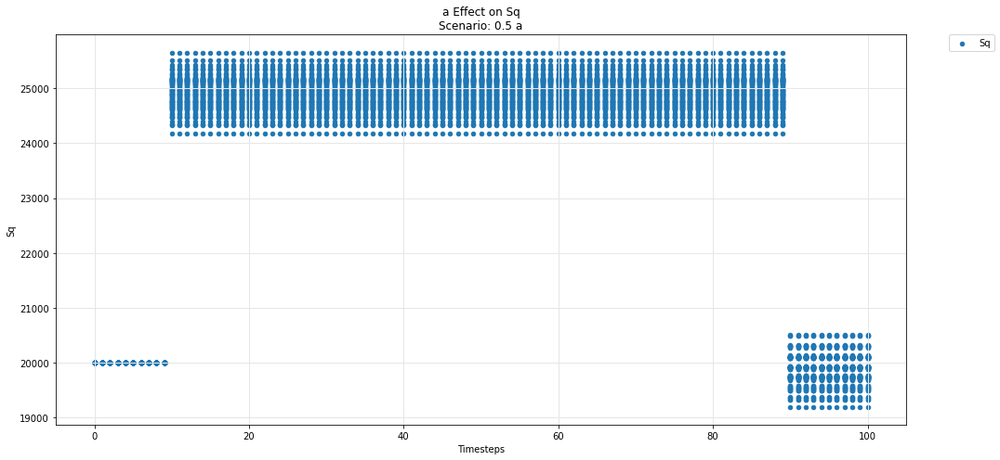

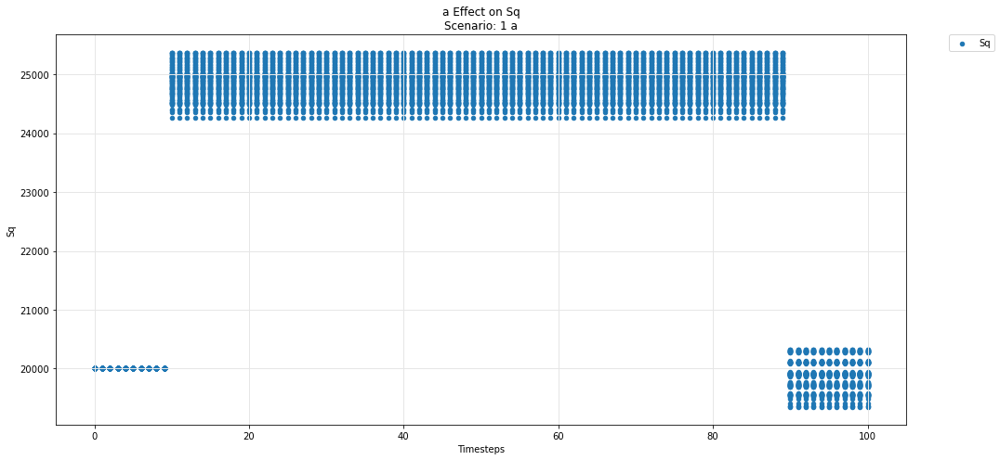

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

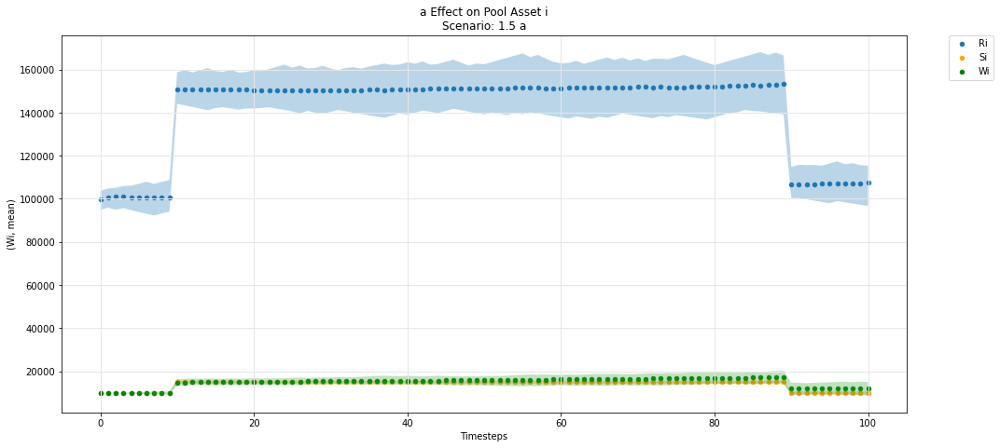

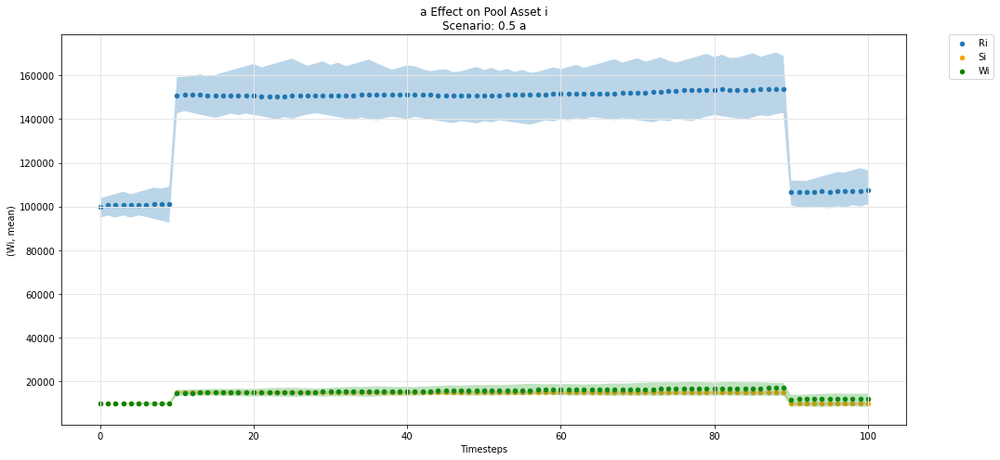

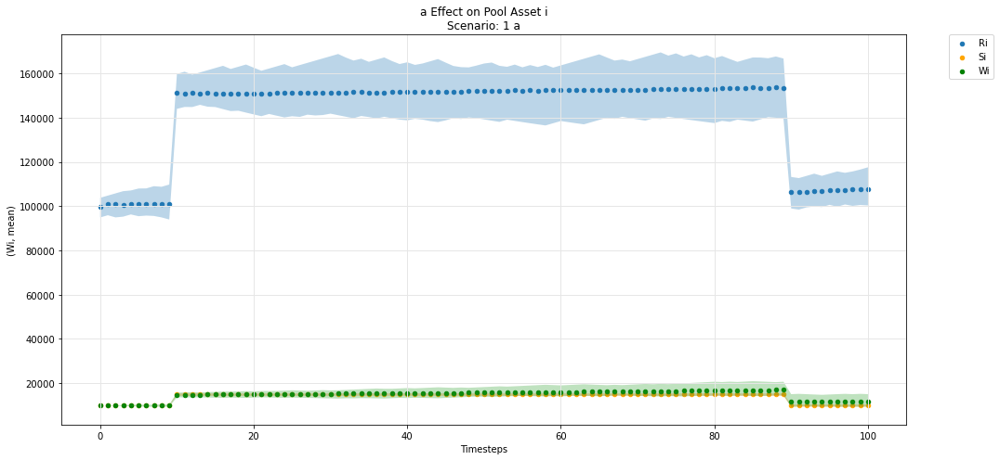

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

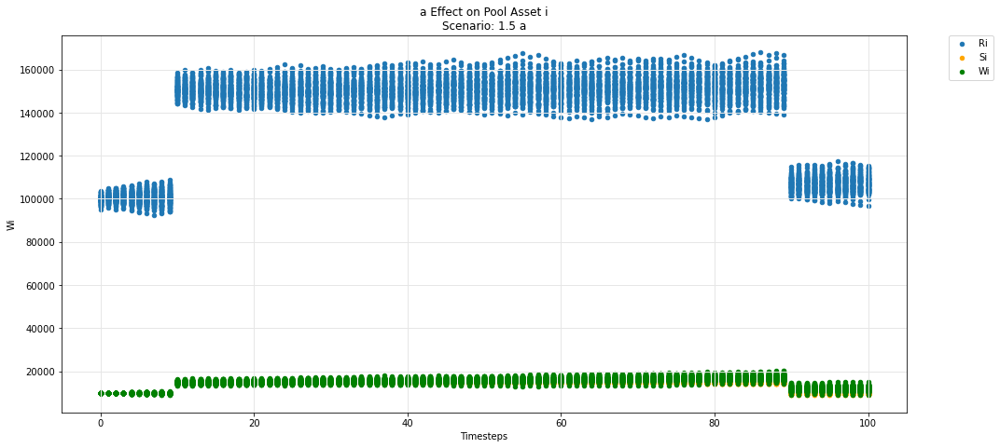

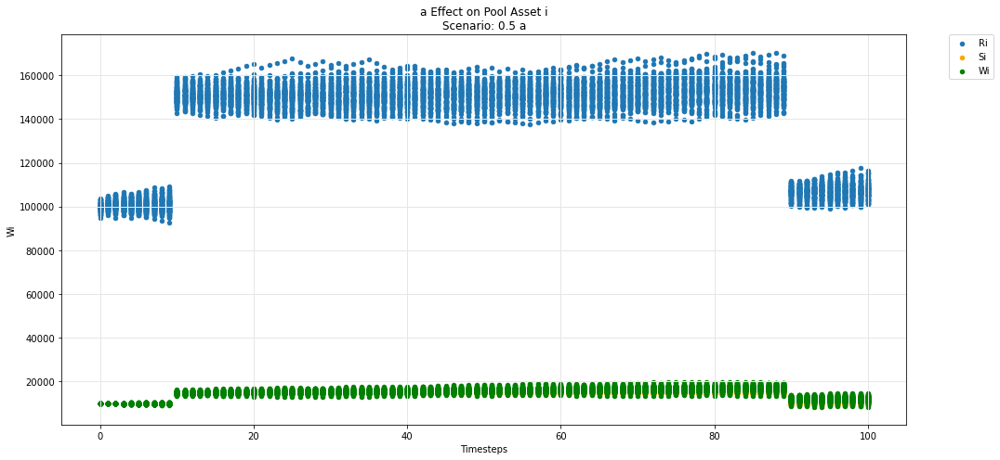

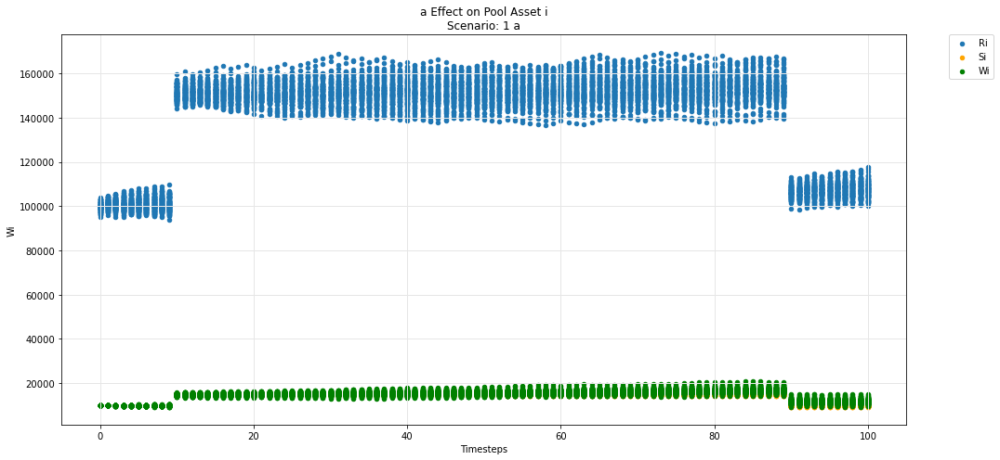

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

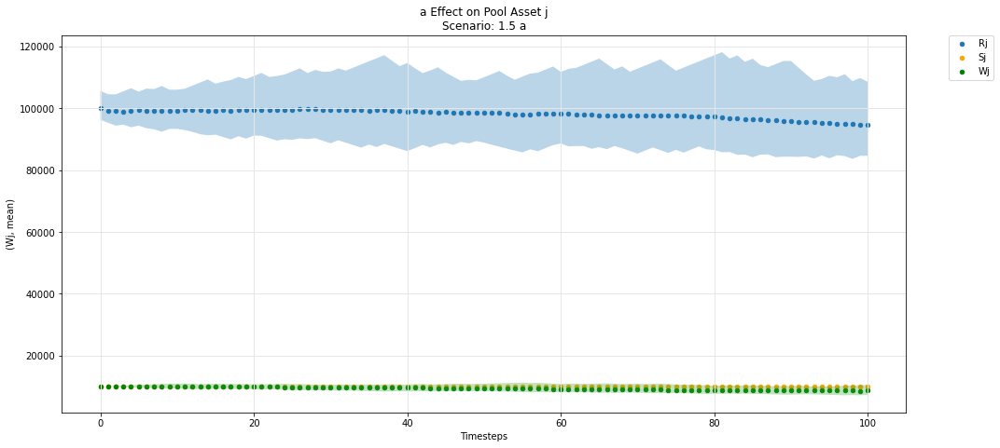

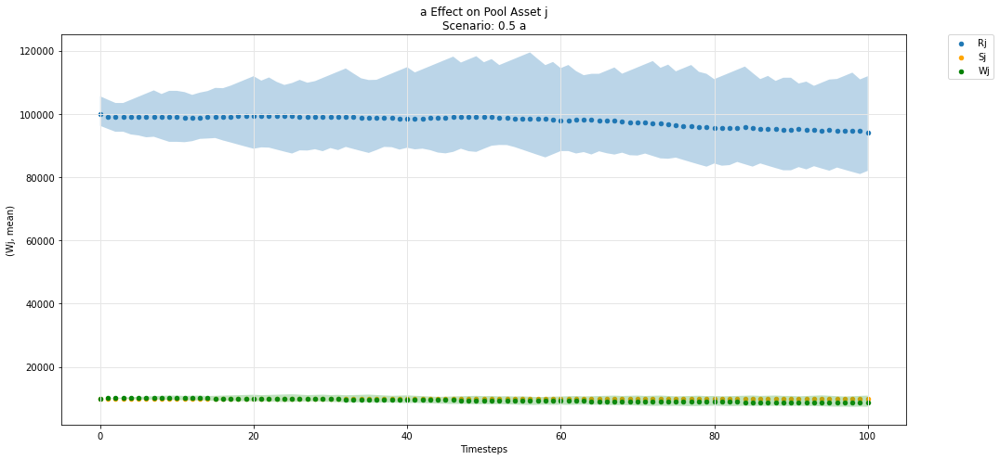

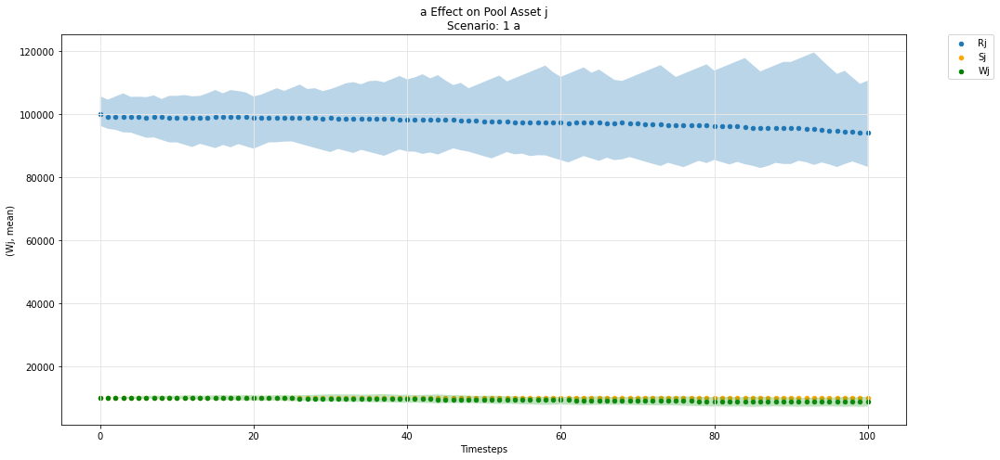

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

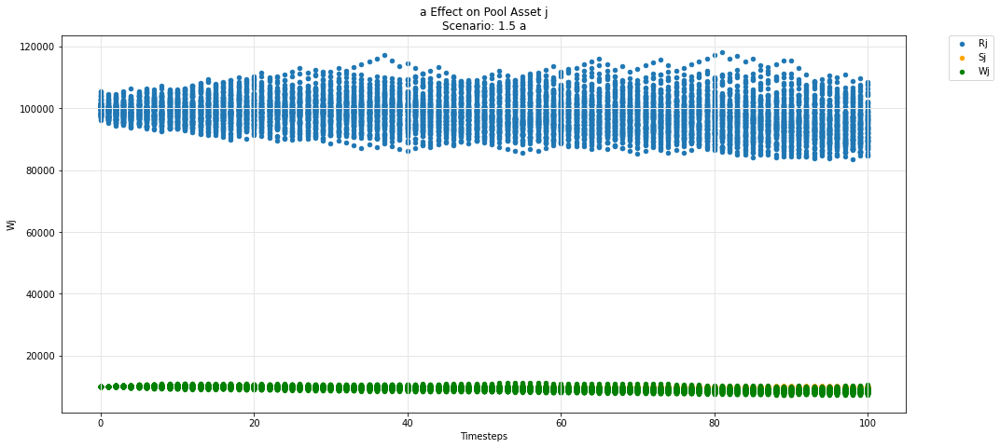

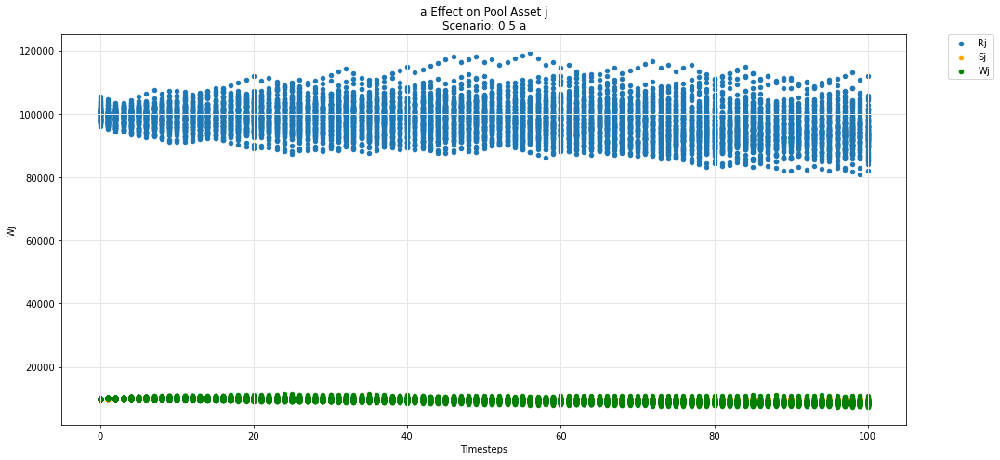

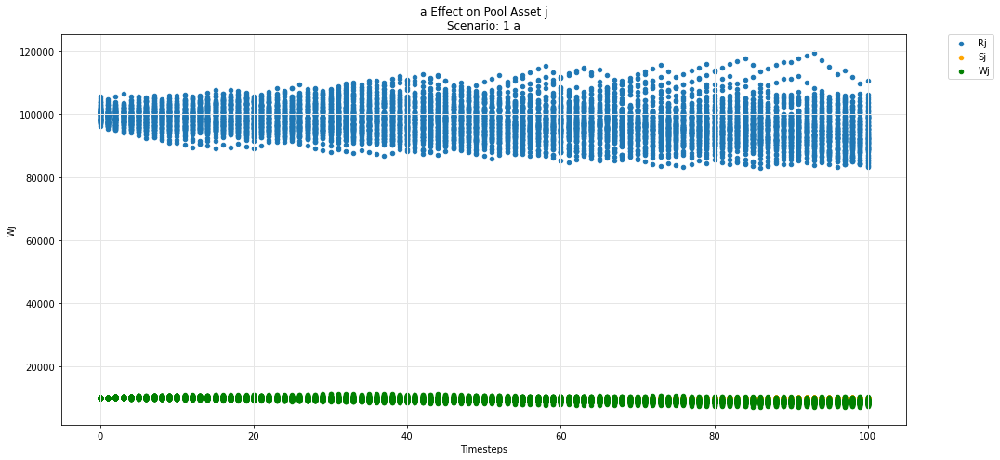

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

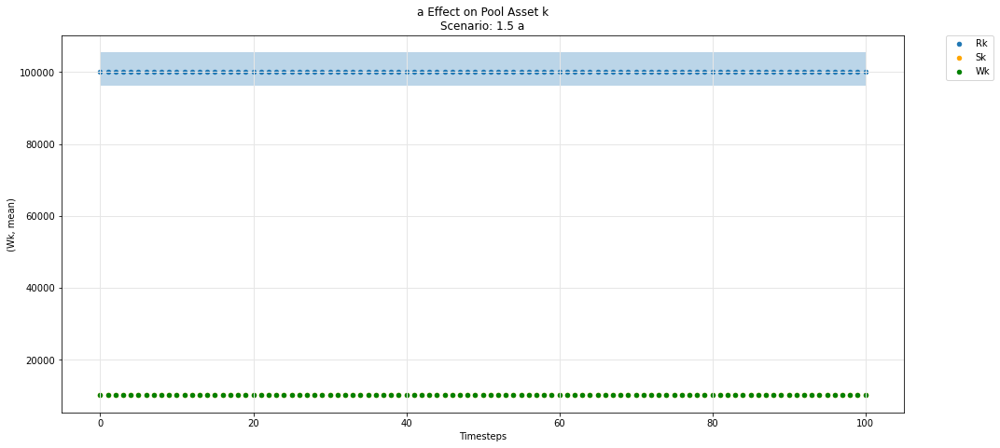

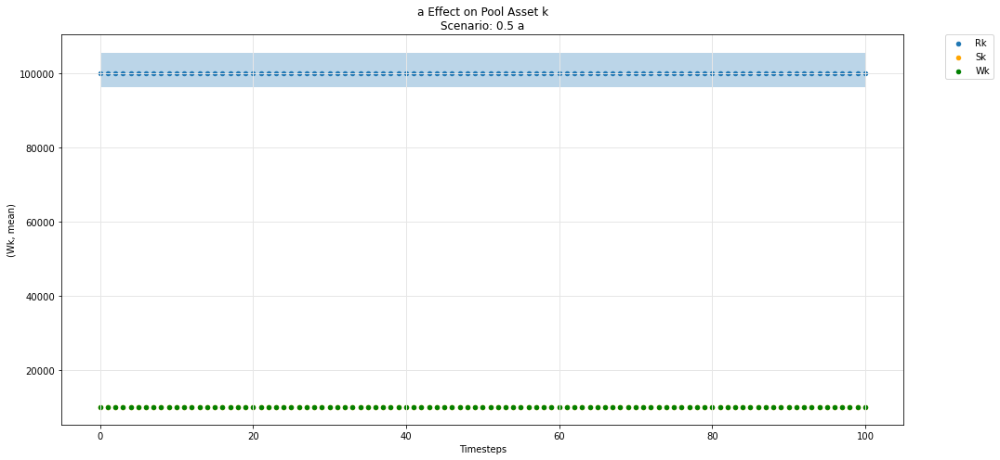

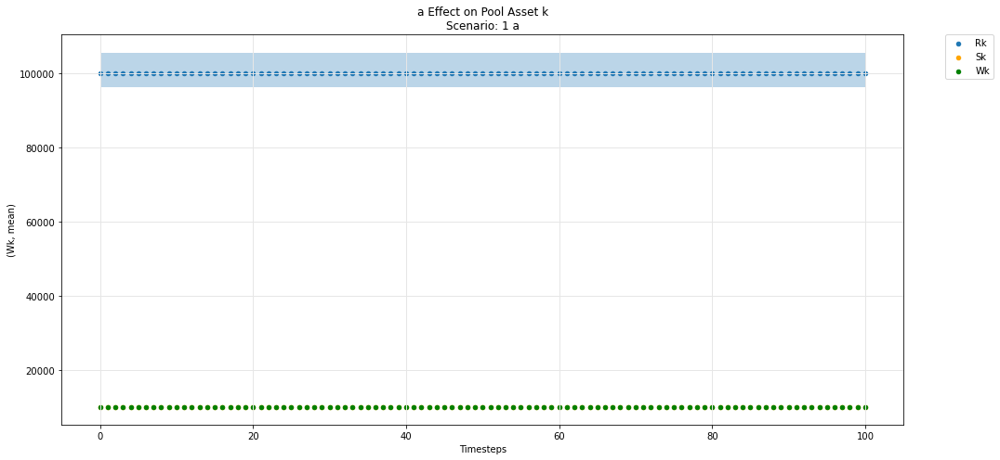

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

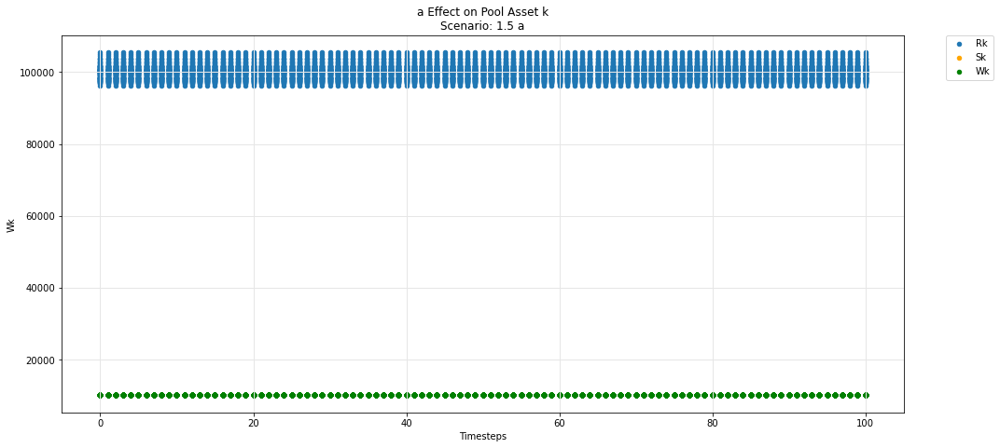

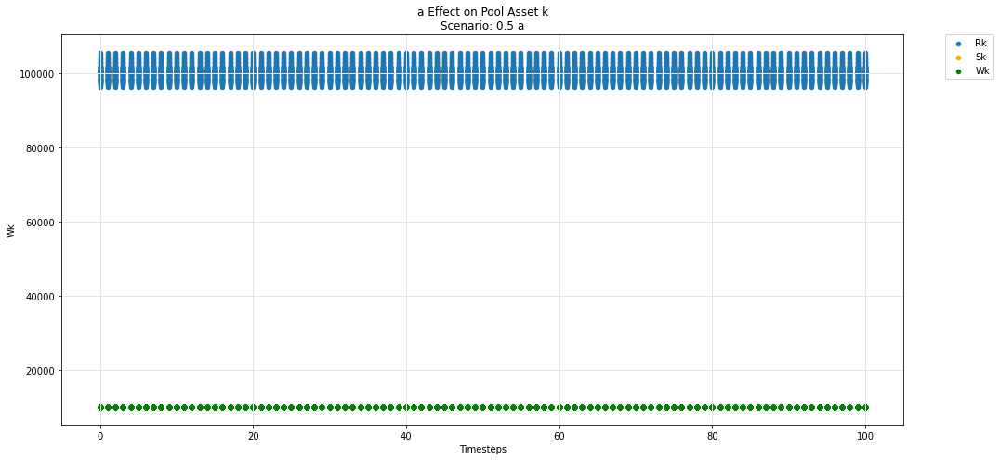

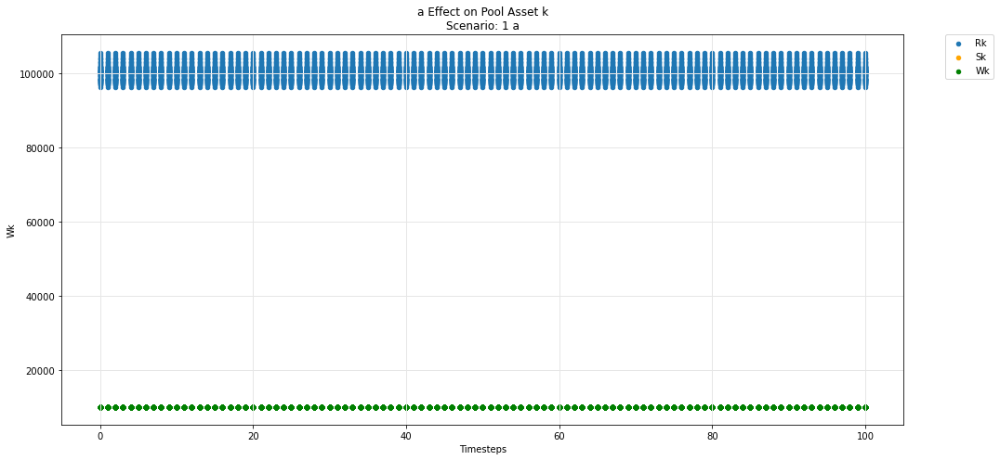

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

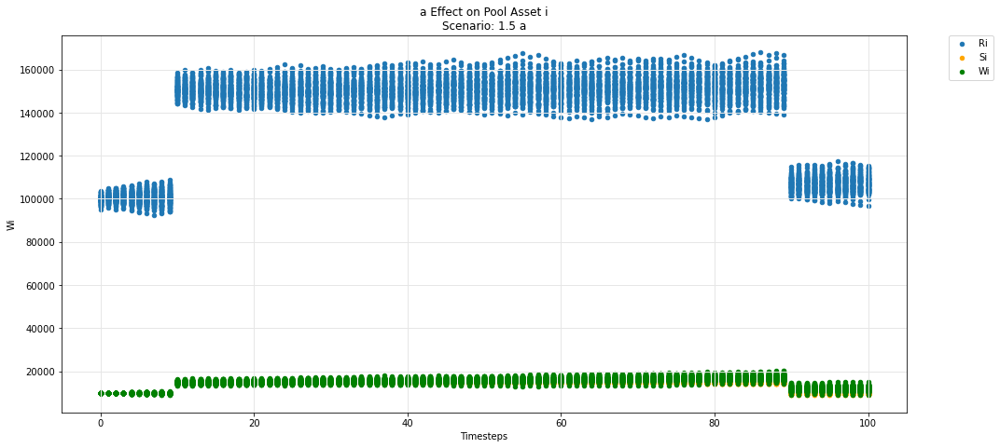

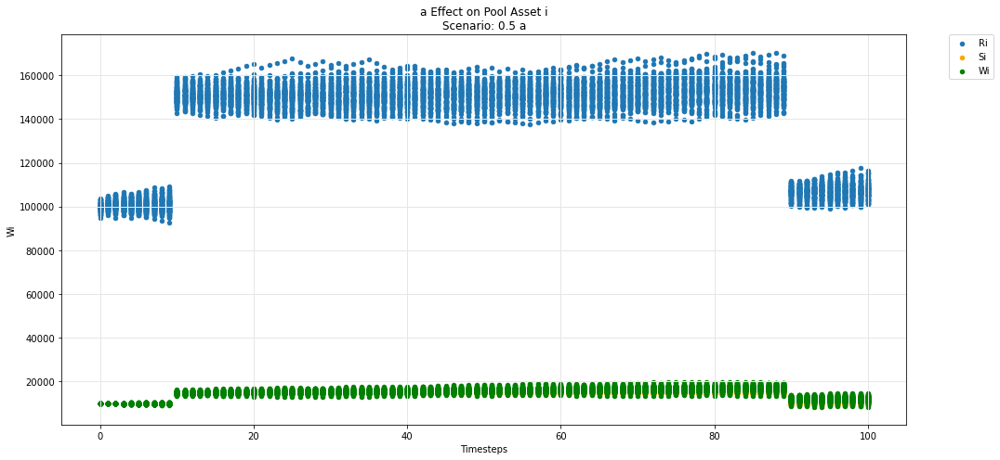

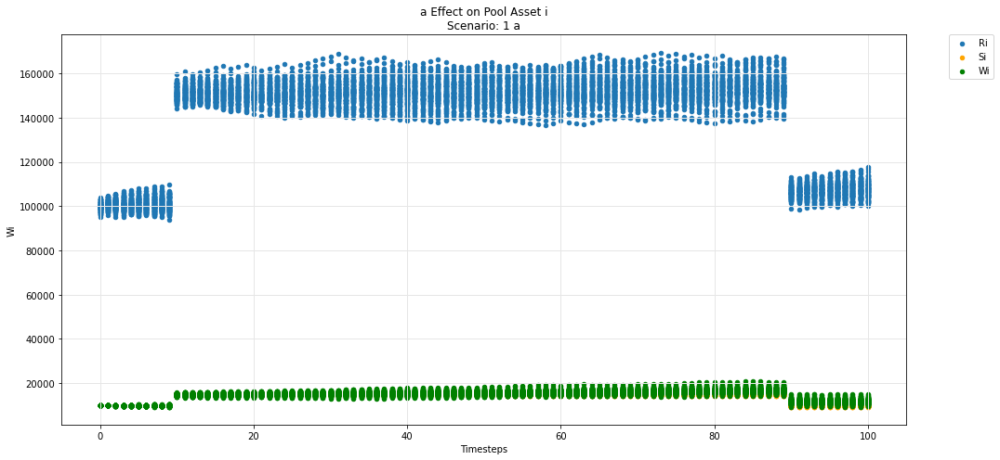

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

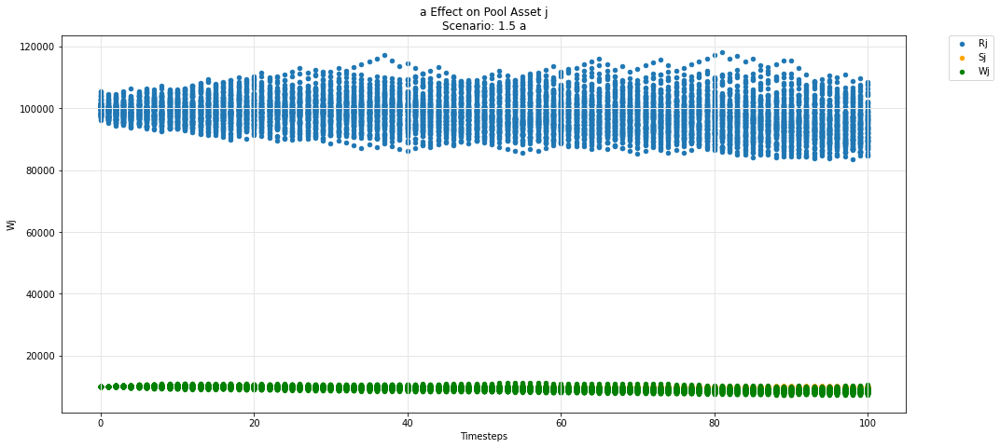

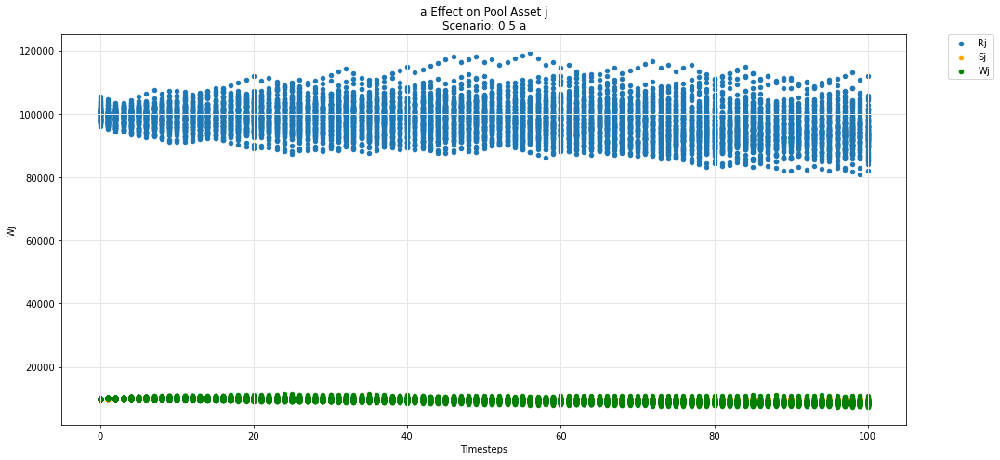

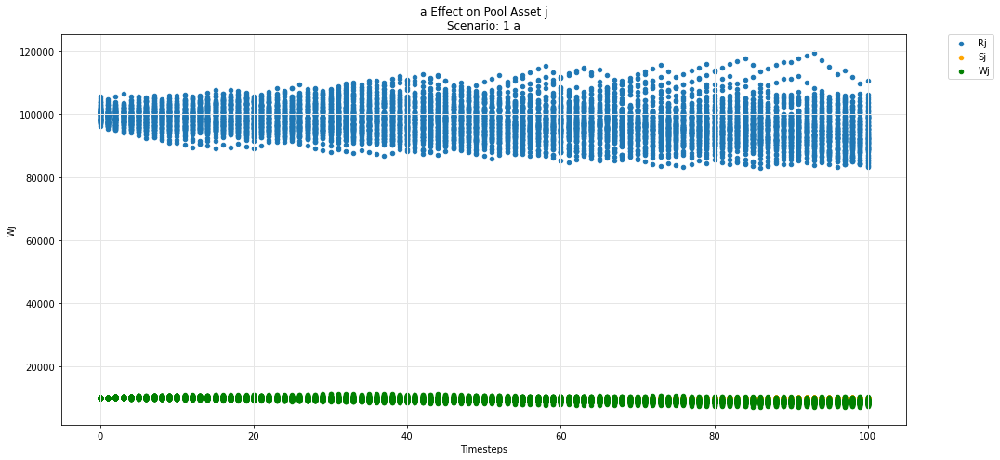

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

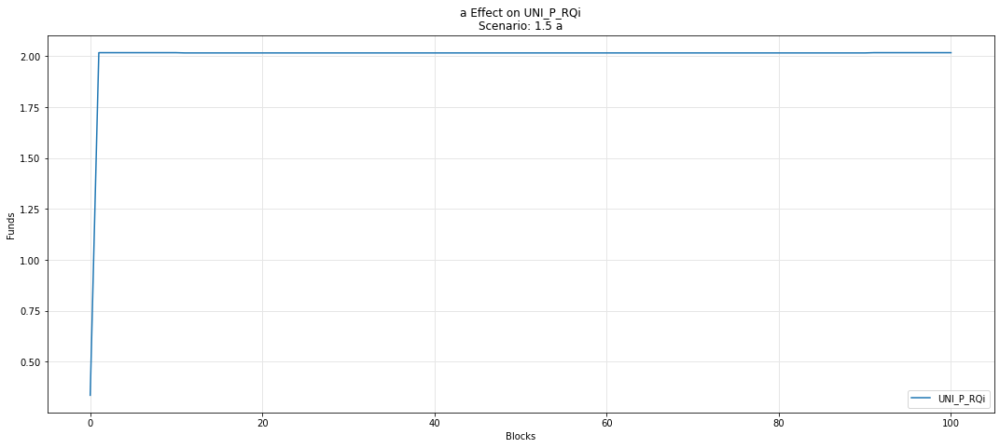

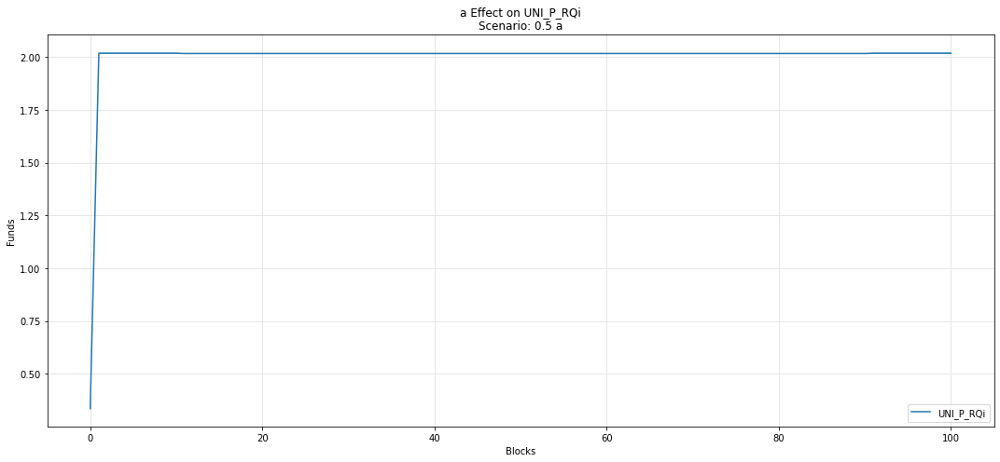

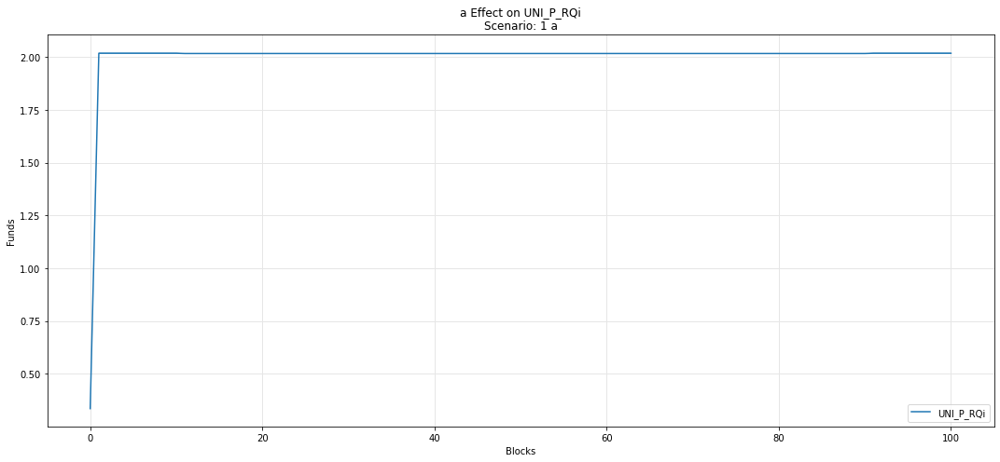

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

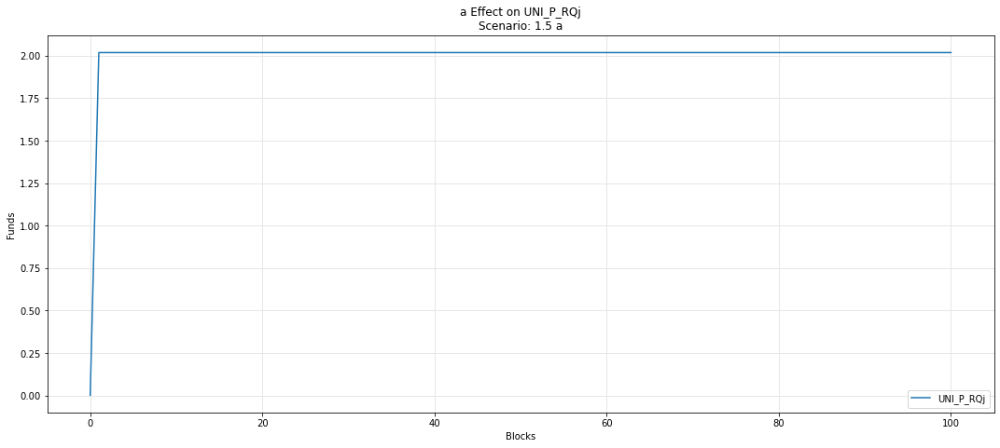

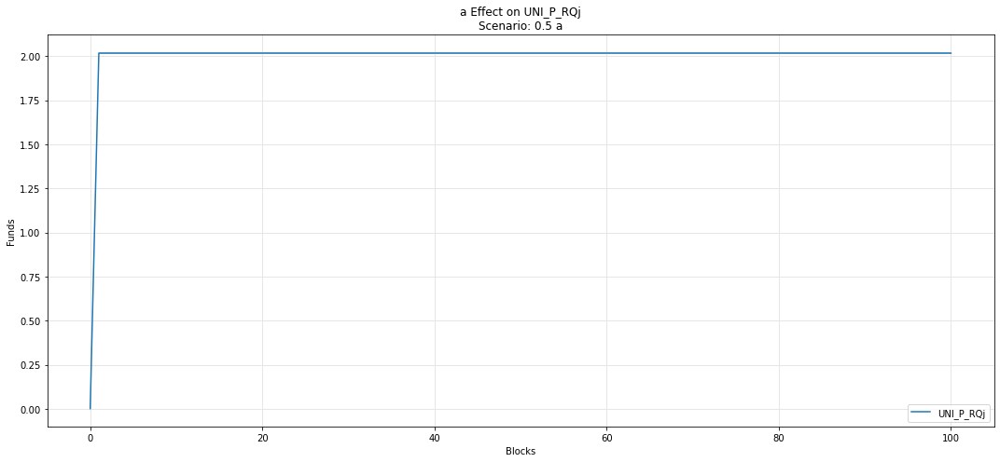

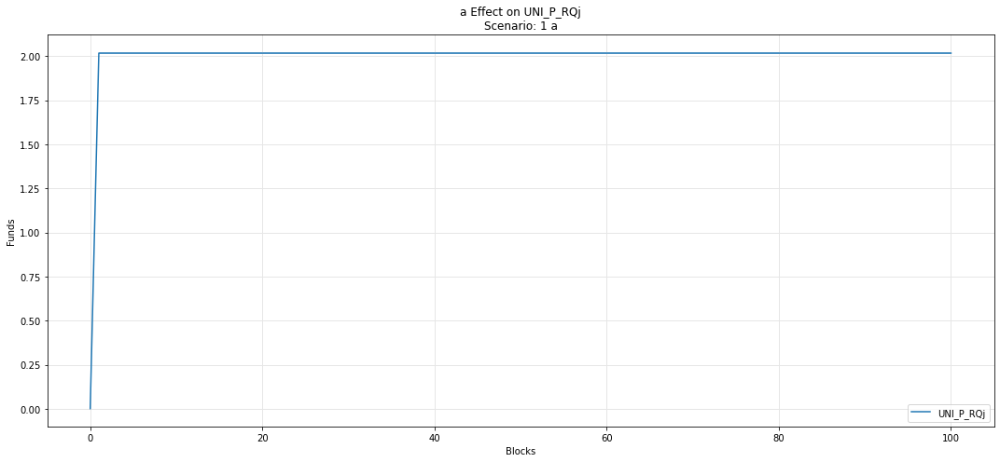

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

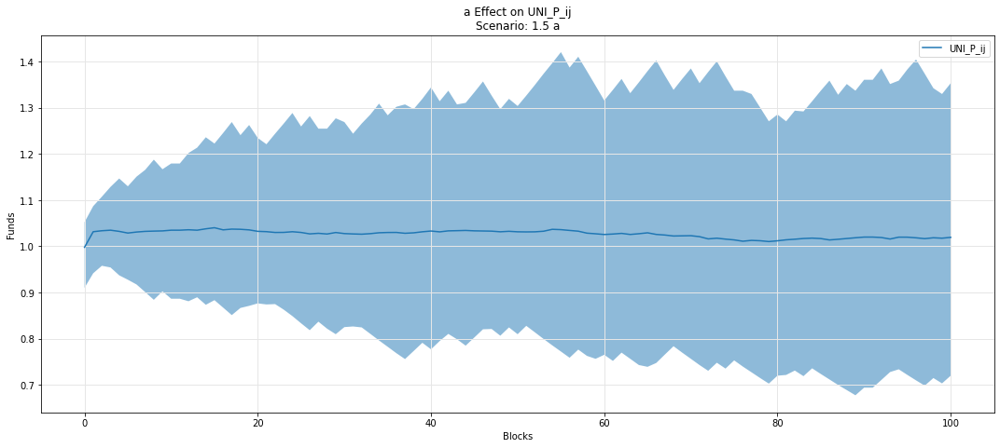

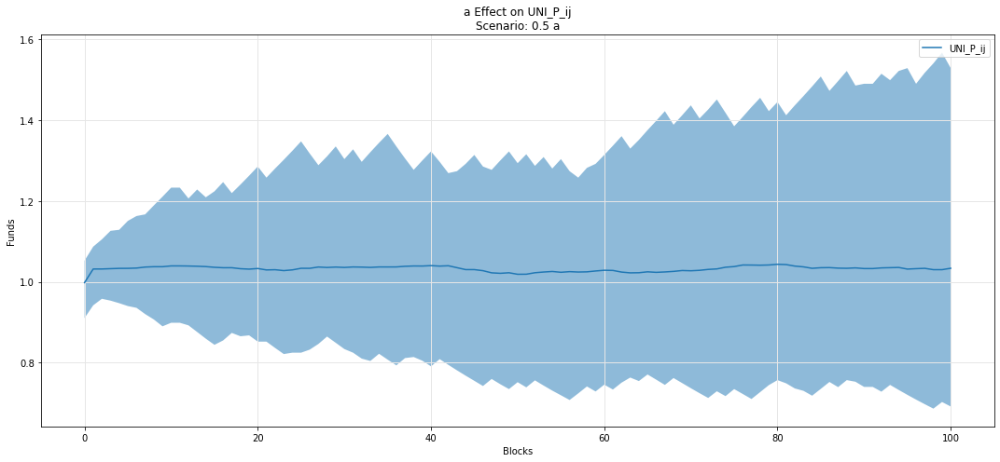

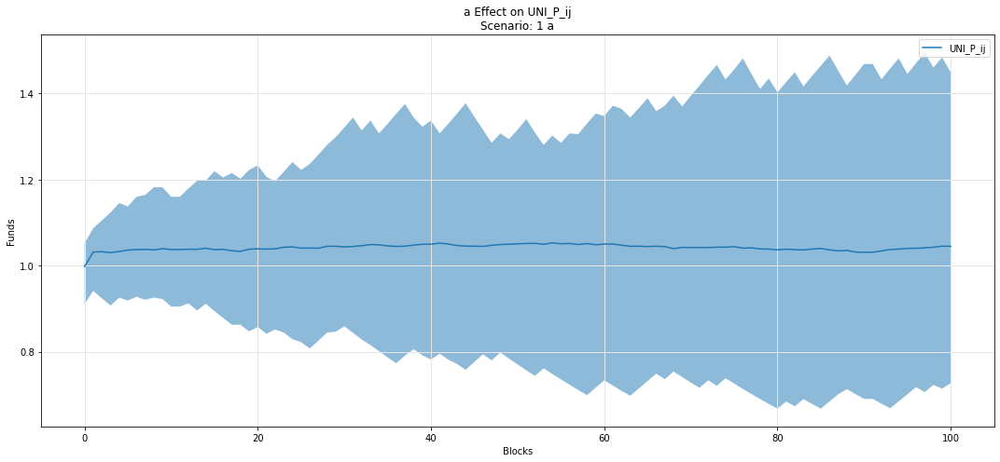

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

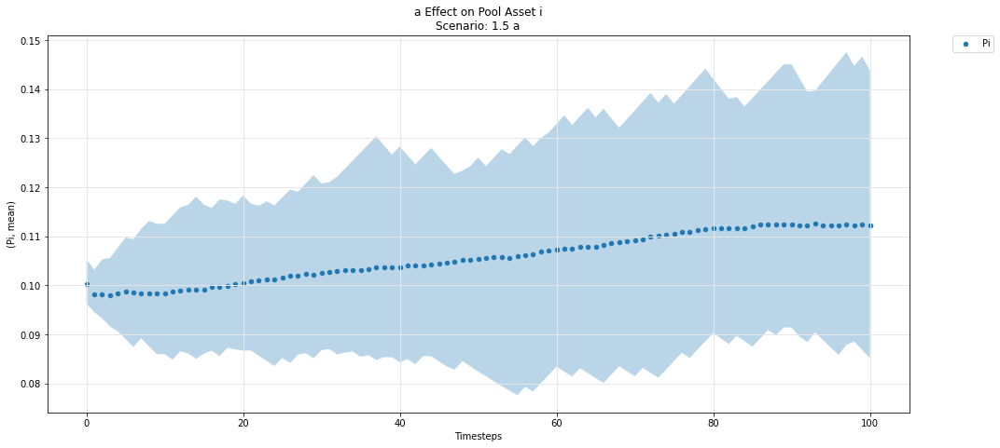

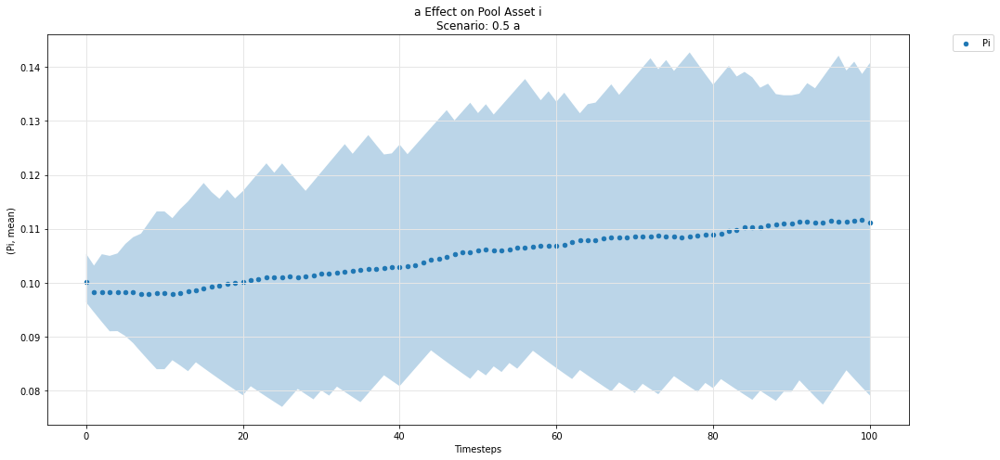

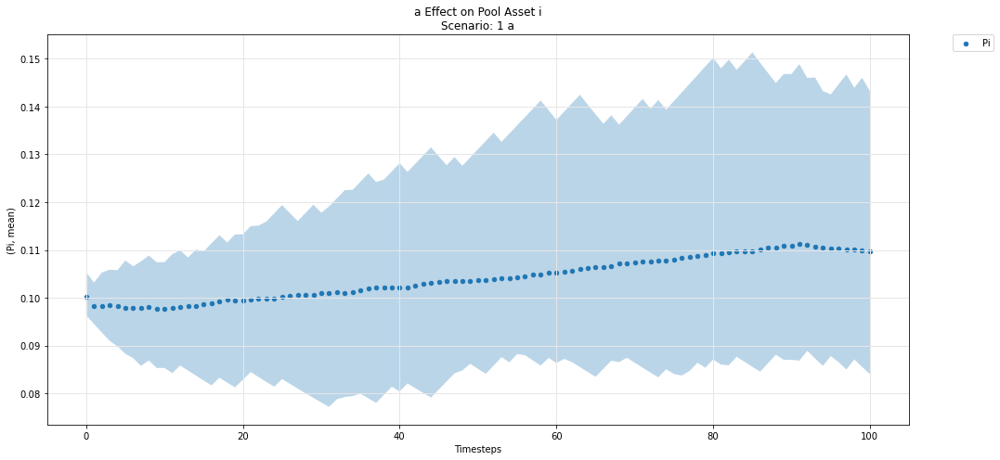

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

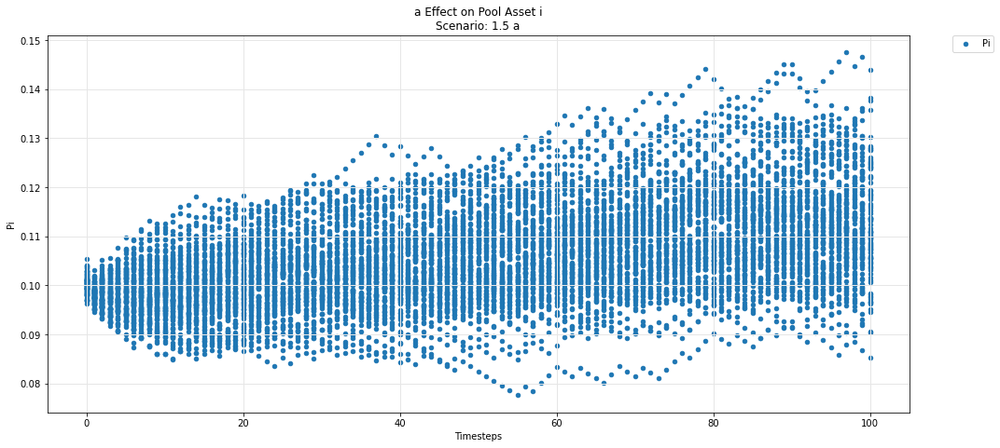

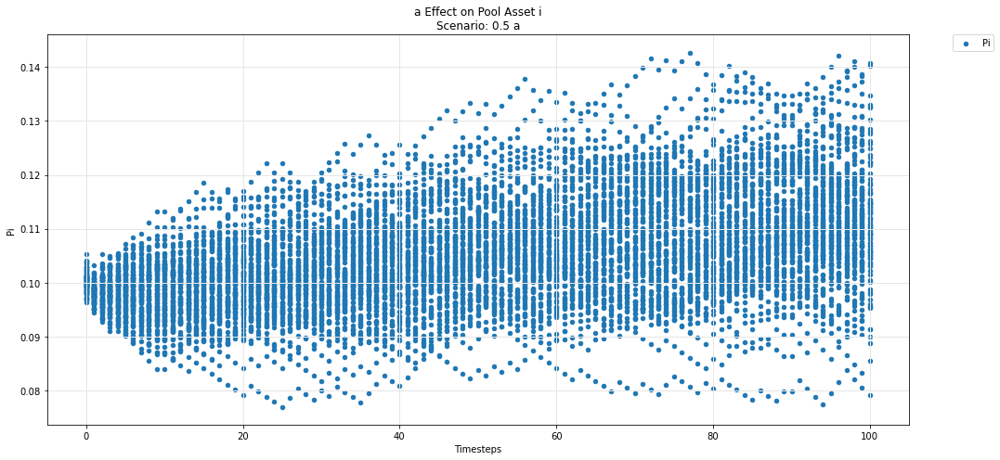

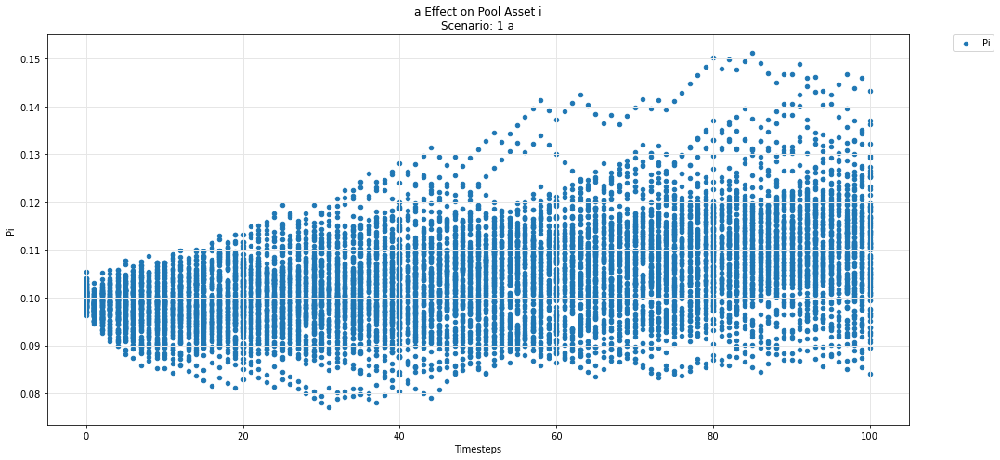

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

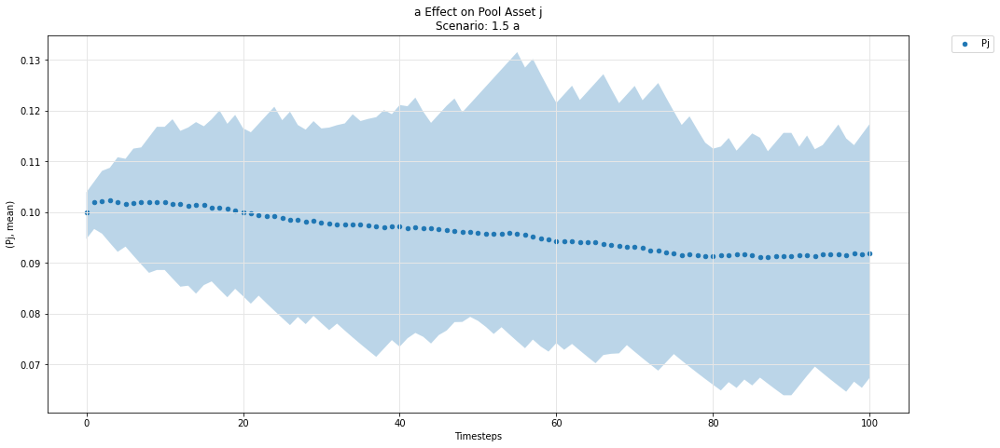

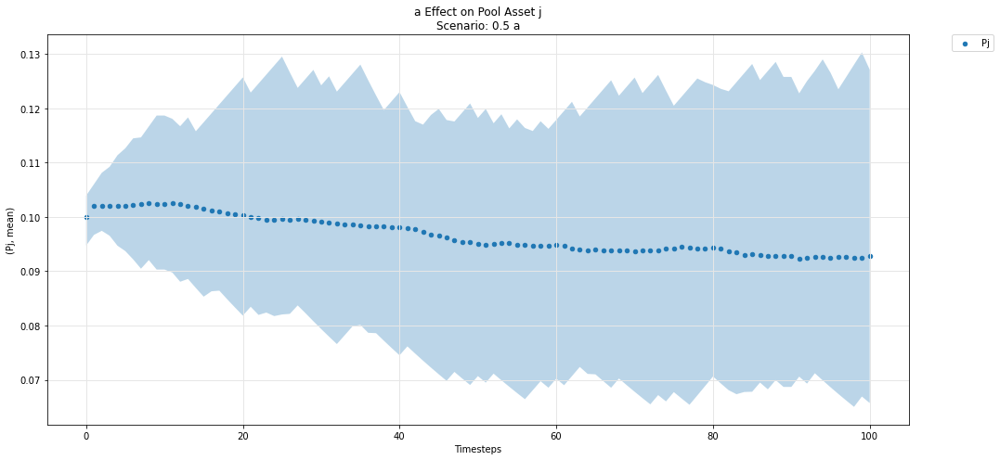

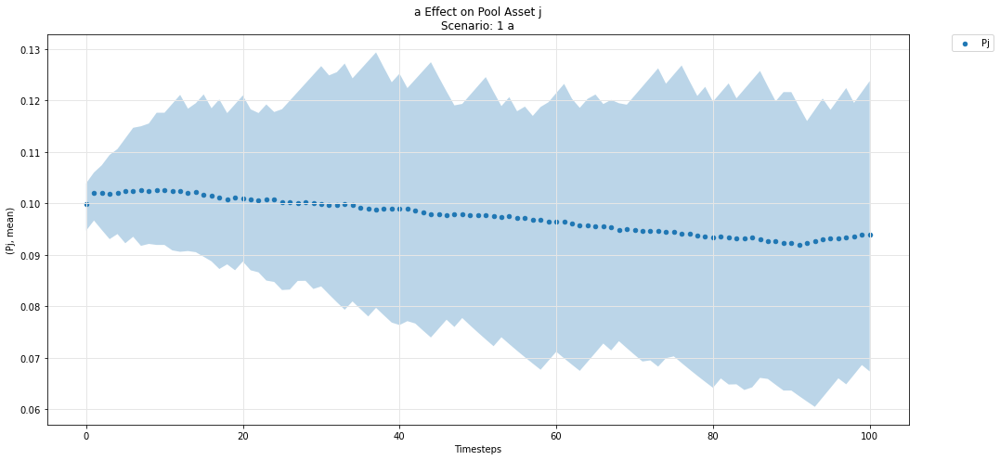

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

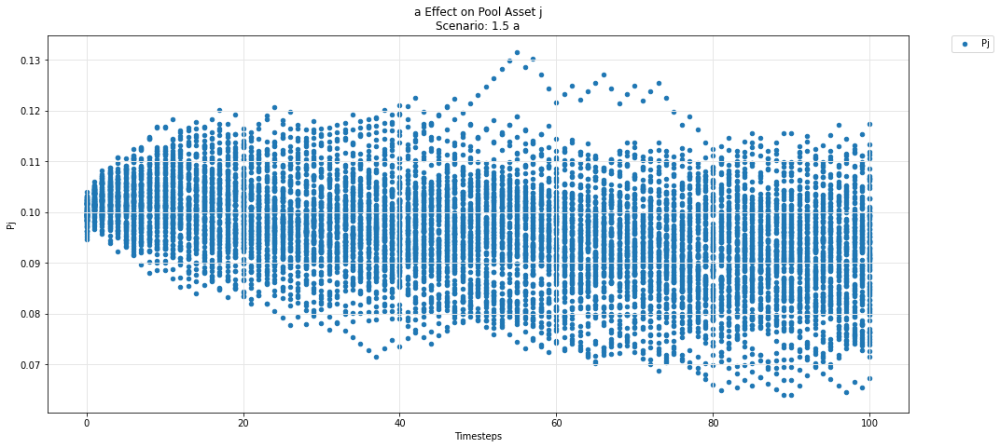

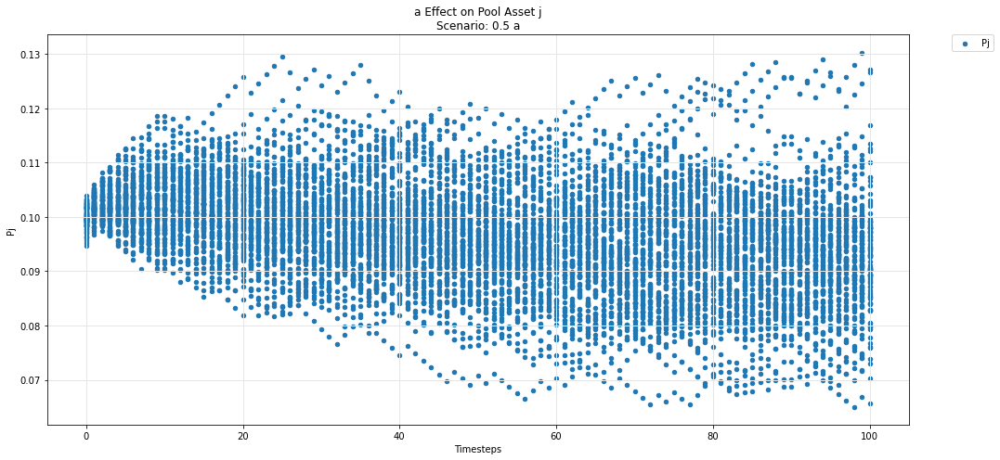

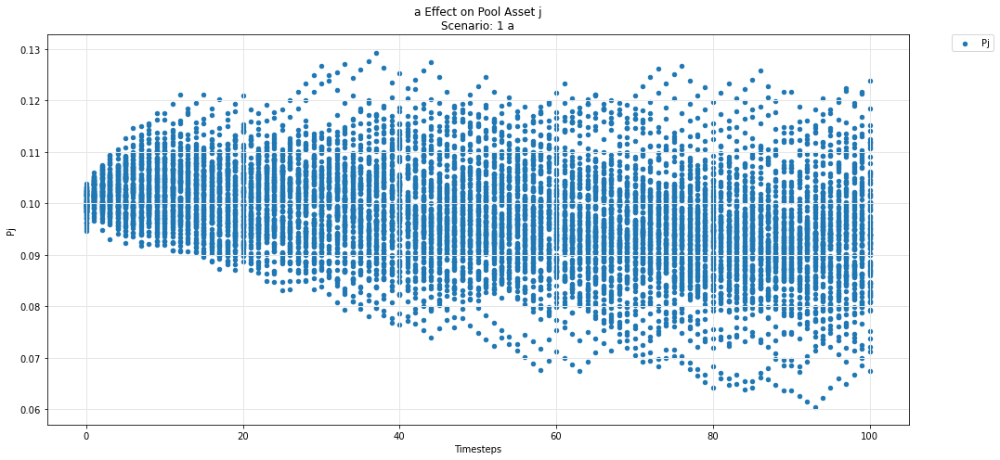

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

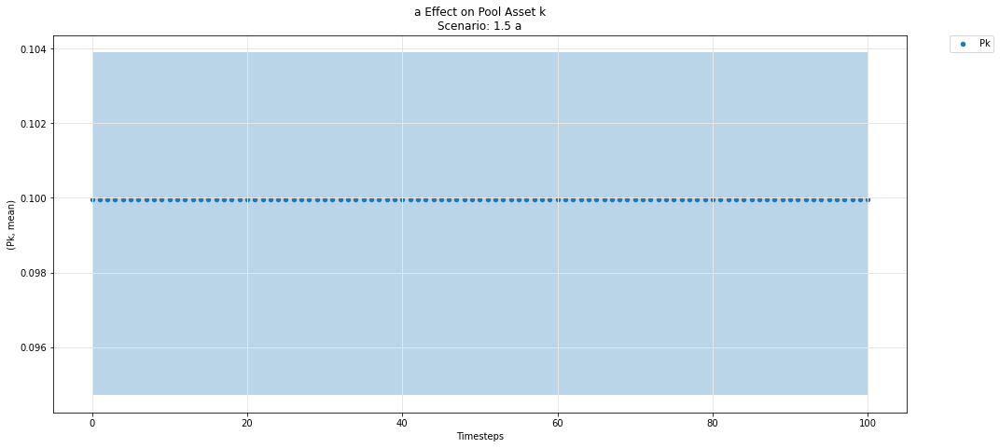

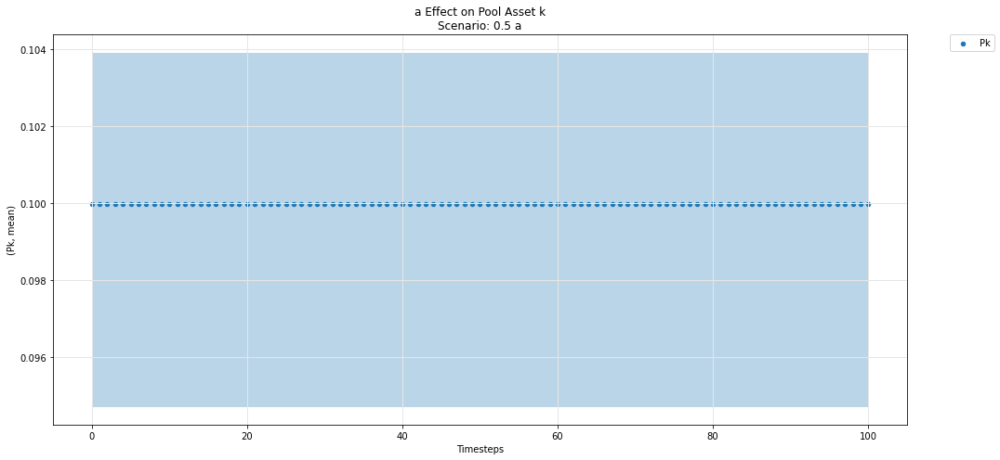

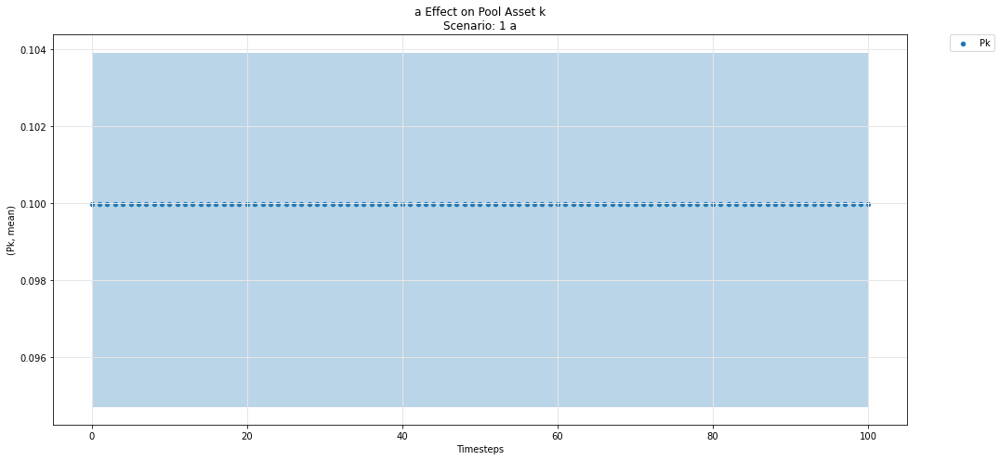

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

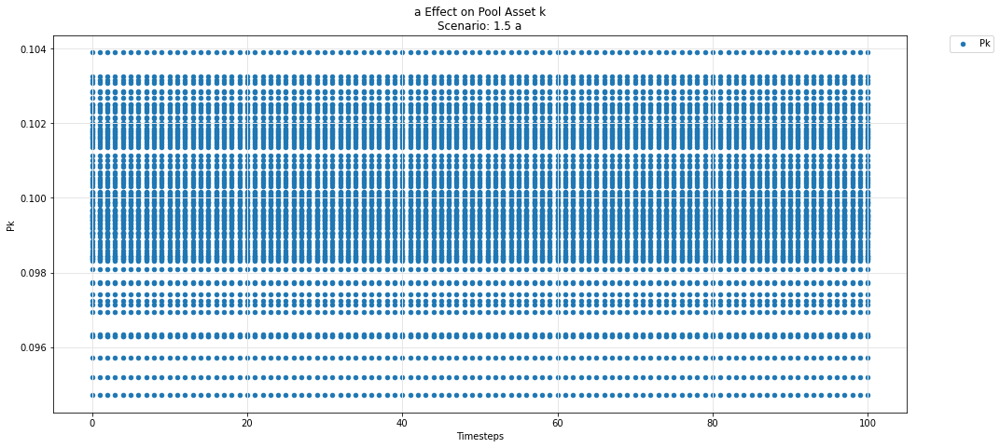

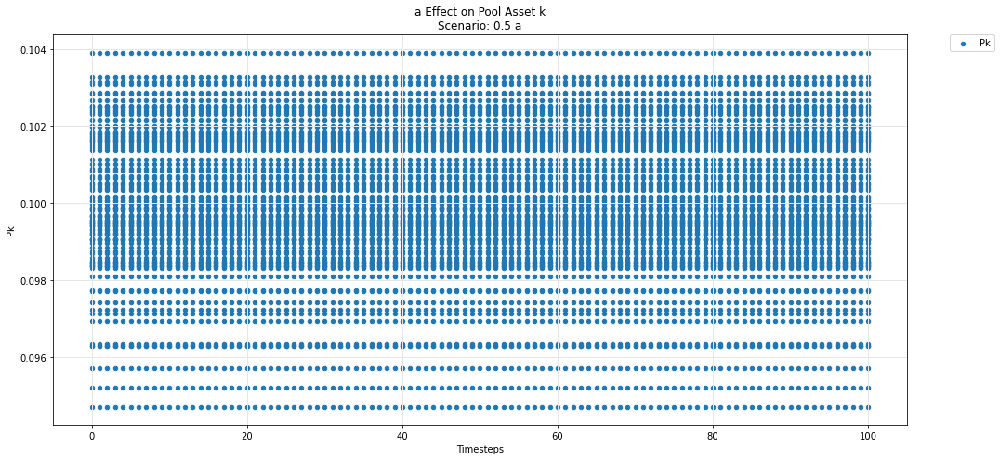

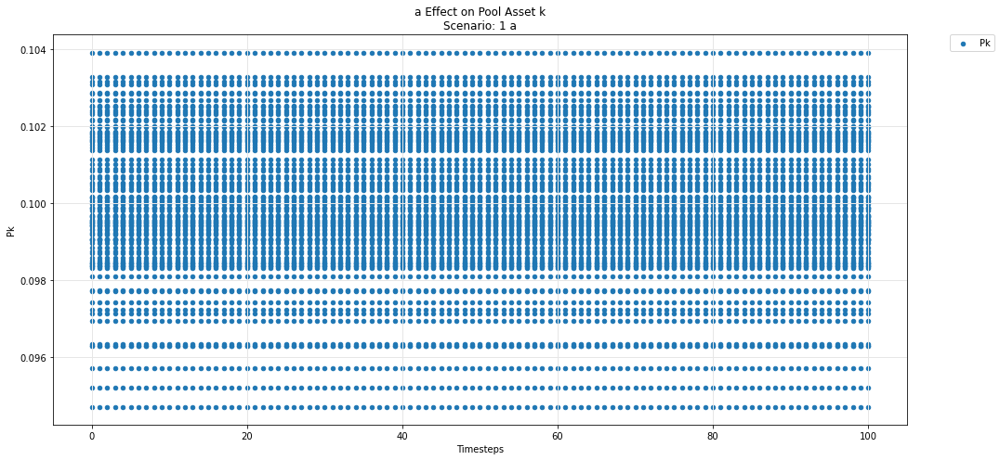

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')